# Importing and Cleaning DateFrames

In [1]:
# Import all the necessary packages.
import pandas as pd
import numpy as np
from datetime import datetime

from datetime import datetime
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import statsmodels.api as sm 
from statsmodels.formula.api import ols
from sklearn import datasets 
from sklearn import linear_model
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

# Optional - Ignore warnings.
import warnings
warnings.filterwarnings('ignore')

Please install plotly if you do not have it on your system - it is required for future visualisations: 

pip install plotly == 5.13.0

In [2]:
import plotly.express as px

## Cleaning Central London DataFrame

In [3]:
# Read the provided CSV file/data set.            
london_central = pd.read_csv('Central London.csv') 

# View DataFrame.
london_central.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Unnamed: 14,Unnamed: 15,Unnamed: 16
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0,NaN,NaN,NaN
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15,NaN,NaN,NaN
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35,NaN,NaN,NaN
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61,NaN,NaN,NaN
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73,NaN,NaN,NaN


In [4]:
# Any missing values?
london_central.isnull().sum()

Survey wave (calendar quarter)         0
Equivalent financial quarter           0
Site ID                                0
Location                               0
Survey date                        10156
Weather                            11834
Time                                   0
Period                                 0
Direction                              0
Start hour                             0
Start minute                           0
Number of private cycles              64
Number of cycle hire bikes            64
Total cycles                           0
Unnamed: 14                       758163
Unnamed: 15                       758163
Unnamed: 16                       758163
dtype: int64

In [5]:
# Explore the data.
london_central.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 758163 entries, 0 to 758162
Data columns (total 17 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Survey wave (calendar quarter)  758163 non-null  object 
 1   Equivalent financial quarter    758163 non-null  object 
 2   Site ID                         758163 non-null  object 
 3   Location                        758163 non-null  object 
 4   Survey date                     748007 non-null  object 
 5   Weather                         746329 non-null  object 
 6   Time                            758163 non-null  object 
 7   Period                          758163 non-null  object 
 8   Direction                       758163 non-null  object 
 9   Start hour                      758163 non-null  int64  
 10  Start minute                    758163 non-null  int64  
 11  Number of private cycles        758099 non-null  float64
 12  Number of cycle 

In [6]:
# Drop last three columns as contain no values.
L_centr_fnl = london_central.drop(columns=['Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16']).reset_index(drop=True)

# View DataFrame.
print(L_centr_fnl.shape)
L_centr_fnl.head()

(758163, 14)


,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73


In [7]:
# View tail of Dataframe
L_centr_fnl.tail()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles
758158,2021 Q4 (October-December),2021-22 Q3,CENCY702,Haymarket,"mar, 21/12/21",Dry,2045 - 2100,Evening (19:00-22:00),Southbound,20,45,22.0,1.0,23
758159,2021 Q4 (October-December),2021-22 Q3,CENCY702,Haymarket,"mar, 21/12/21",Dry,2100 - 2115,Evening (19:00-22:00),Southbound,21,0,20.0,0.0,20
758160,2021 Q4 (October-December),2021-22 Q3,CENCY702,Haymarket,"mar, 21/12/21",Dry,2115 - 2130,Evening (19:00-22:00),Southbound,21,15,16.0,1.0,17
758161,2021 Q4 (October-December),2021-22 Q3,CENCY702,Haymarket,"mar, 21/12/21",Dry,2130 - 2145,Evening (19:00-22:00),Southbound,21,30,10.0,1.0,11
758162,2021 Q4 (October-December),2021-22 Q3,CENCY702,Haymarket,"mar, 21/12/21",Dry,2145 - 2200,Evening (19:00-22:00),Southbound,21,45,12.0,2.0,14


In [8]:
# Drop the rows where all elements are missing.
L_centr_fnl_0 = L_centr_fnl.dropna(how='all')

# View DataFrame.
print(L_centr_fnl_0.shape)
L_centr_fnl_0.head()

(758163, 14)


,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73


In some instances when members of the team imported the central london file there was a number of rows (290203) which appeared as NaN for all columns.

As you can see this wasn't the case when the file was imported in this instance, however the code above has been added so all users can arrive to a point where these rows have been removed.

In [9]:
# Check missing values.
L_centr_fnl_0.isnull().sum()

Survey wave (calendar quarter)        0
Equivalent financial quarter          0
Site ID                               0
Location                              0
Survey date                       10156
Weather                           11834
Time                                  0
Period                                0
Direction                             0
Start hour                            0
Start minute                          0
Number of private cycles             64
Number of cycle hire bikes           64
Total cycles                          0
dtype: int64

## Cleaning Weather Column in Central London

The original London Central data was edited in Excel. Looking at the below code can see there is 283 different classifications for weather. Looking into the Excel file can see that there are a lot of Weather classifications some which are the same just spelt differently and some which are spelt incorrectly. This needs cleaning to categorise the data better and improve processes. 

In [10]:
# Check for unique values.
L_centr_fnl_0['Weather'].nunique()

283

In [11]:
# Change relevant values to Cloudy
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cloudy/dry', 'Cloudy And Warm', 
                                                               'Dry/cloudy', 'Overcast', 'Overcast And Dull',
                                                               'Partly Cloudy'], 'Cloudy')

In [12]:
# Check that values have been changed
L_centr_fnl_0[L_centr_fnl_0['Weather'] == 'Cloudy And Warm']

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles


Can see that the code runs correctly and that Cloudy and Warm has been replaced to Cloudy

In [13]:
# Change relevant values to Cold
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cold Dry', 'Coldish', 'Cold/dry', 'Dry/cold',
                                                             'Dry & Cold','Fine Cold', 'Fine V Cold',
                                                              'Now Starts To Get Chilly', 'Very Cold/dry'], 'Cold')

In [14]:
# Change relevant values to Damp
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Almost Dry'], 'Damp')

In [15]:
# Change relevant values to Dark
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Dark Sunny', 'Dry Dark', 'Dark Dry'],
                                                             'Dark')

In [16]:
# Change relevant values to Dry
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['2 Snowflakes Otherwise Dry',
                                                              'A Bit Chilly At First', 'dry', 'Ddry',
                                                              'Drty', 'Dry & Mild', 'Dry 3/4 Dry',
                                                              'Dry And Fine', 'Dry And Overcast',
                                                              'Dry But Rain Threatening', 'Dry Fri',
                                                              'Dry Mon', 'Dry Thu', 'Dry Wed', 'Dry Y',
                                                              'Dry/good', 'Dry/sunny/cold', 'Drying Up',
                                                              'Dryish', 'Dull', 'Dy', 'Fair', 'Fine',
                                                              'Fine + Dry Chilly At First', 'Fine And Dry',
                                                              'Good/dry', 'Kdry', 'Mild', 'Rain Looking Likely',
                                                              'Rain Stopped', 'Rain Stopped-dry', 
                                                             'Dry (+brief Speels Of Drizzle'], 'Dry')

In [17]:
# Change relevant values Dry & Rain
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cold & Dry Early Rain Later',
                                                              'Dry - Rain', 'Rain Dry', 'Rain/dry'], 'Dry & Rain')

In [18]:
# Change relevant values to Dry & Wet
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Dry - Wet', 'Dry + Wet',
                                                              'Dry + Wet', 'Dry A.m Wet P.m',
                                                              'Dry But Wet Road', 'Dry But Wet Roads',
                                                              'Dry Road Still Wet', 'Dry Road Wet With Leaves',
                                                              'Dry Wet Road', 'Dry-Wet', 'Dry-wet', 'Dry/wet Road Surface',
                                                              'Wet - Dry', 'Wet + Dry', 'Wet First Then Dry', 
                                                              'Wet-dry', 'Wet/ Dry', 'Wet/dry', 'Wetr First Then Dry',
                                                              'Dry/wet'], 'Dry & Wet')

In [19]:
# Change relevant value to Frost / Fog
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Dry (frost & Fog)', 'Foggy',
                                                              'Foogy/v Cold', 'Foggy/v Cold'], 'Frost / Fog')

In [20]:
# Change relevant value to Hail / Sleet
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cloudy/hail', 'Hail', 'Hail',
                                                             'Hail Shower', 'Sleet', 'Wet Light Hailstone'], 
                                                             'Hail / Sleet')

In [21]:
# Change relevant values to Heavy Rain
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Deluge', 'Down Pour', 'H Rain', 'Rain-heavy', 
                                                             'Very Heavy Rain'], 'Heavy Rain')

In [22]:
# Change relevant values to Hot
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Dry/hot', 'Hot + Humid', 'Hot And Humid', 
                                                             'Hot And Sunny', 'Hot/dry', 'Very Hot Dry'], 'Hot')

In [23]:
# Change relevant values to Light Rain
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['(drizzle)', 'A Few Drops Of Rain',
                                                              'A Few Rain Showers', 'Cloudy/drizzle',
                                                              'Cold/showery', 'Damp & Drizzly', 'Drizzle',
                                                              'Drizzle Damp', 'Drizzle/rain', 'Drizzle/showers',
                                                              'Drizzle/wet', 'Drizzling', 'Drizzly', 'Drizzly Rain',
                                                              'Dry (+brief Speels Of Drizzle)', 'Dry With Intermitent Rain', 
                                                              'Dry/drizzle', 'Dry/drizzly', 'Fine Drizzle',
                                                              'Intermitent Light Rain', 'Intermitent Light Showers',
                                                              'Light Drizzle', 'Light Shower', 'Light Showers',
                                                              'Light Showers Inc Some Hail', 'Light Shrs',
                                                              'Lt Rain', 'Shower', 'Shower/wet', 'Showers', 'Showers Mix',
                                                              'Showery', 'Slight Drizzle', 'Slight Drizzle Till End', 'Some Showers',
                                                              'Spitting', 'Spitting ', 'V Cold Showers', 'V Light Drizzle', 'V Light Rain',
                                                              'V Light Showers', 'V Light Shrs', 'V Lt Rain', 'V. Light Rain',
                                                              'V.light Drizzle', 'V.light Rain', 'Very Light Rain', 'V.wet', 
                                                              'Very Light Drizzle', 'Wet Drizzle',
                                                              'Wet/drizzle', 'Wet/light Showers'], 'Light Rain')

In [24]:
# Change relevant values to Mist
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Damp/misty', 'Damp/misty/wet'],
                                                             'Mist')

In [25]:
# Change relevant values to Rain
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['(rain After)', 'Cloud/rain',
                                                              'Cloudy/ Rain', 'Cloudy/rain',
                                                              'Cold/ Rain', 'Cold/rain',
                                                              'Damp - Rain', 'Heavy Shower',
                                                              'Heavy Showers', 'Heavy Showers Throughout Day',
                                                              'L/rain', 'Rain Damp',
                                                              'Rain/cloudy', 'Rain/drizzle',
                                                              'Rains', 'Rainy', 'Some Heavy Showers',
                                                              'Steady Rain', 'Wet/rain'], 'Rain')

In [26]:
# Change relevant values to Snow
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Heavy Snow', 'Occasional Lt Snow Shrs',
                                                              'Snowing', 'Wet/ Snowing'], 'Snow')

In [27]:
# Change relevant values to Sun
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cloudy/sunny', 'Dry & Sunny',  'Dry + Sunny', 
                                                             'Dry And Sunny',  'Dry Sunny', 'Dry/sunny',
                                                             'Fine & Sunny', 'Hot & Sunny', 'Mild And Sunny',
                                                             'Road Drying Sun Out', 'Sun/clouds', 'Sun/cloudy',
                                                             'Sunny', 'Sunny Cloudy', 'Sunny Cold', 
                                                             'Sunny Periods And Warm', 'Sunny/cloudy', 'Sunny/dry',
                                                             'Warm & Sunny Chilly Later', 'Warm + Sunny'], 'Sun')

In [28]:
# Change relevant values to Sun & Rain
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cold Sunny Rain', 'Sun/rain',  'Sunny/rainy'],
                                                             'Sun & Rain')

In [29]:
# Change relevant values to Sun & Wet
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Wet/sunny'], 'Sun & Wet')

In [30]:
# Change relevant values to Sun & Wind
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Sunny & Windy', 'Sunny But Very Windy',
                                                             'Sunny Until Evening But Windy', 
                                                             'Very Cold Sunny But Windy',
                                                             'Warm + Sunny Cloudy + Windy', 'Warm Sunny And Windy',
                                                             'Warm & Sunny But Windy & Cold'], 'Sun & Wind')

In [31]:
# Change relevant values to Unknown
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['D', 'Wed', 'X'], 'Unknown')

In [32]:
# Change relevant values to Warm
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Cold At First Then Warm/sunny', 'Dry And Warm',
                                                             'Warm + Dry', 'Warm And Humid', 'Warm And Overcast'],
                                                             'Warm')

In [33]:
# Change relevant values to Warm & Wind 
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Warm With A Slight Wind', 'Warm And Windy'],
                                                             'Warm & Wind')

In [34]:
# Change relevant values to Wet
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Getting Wet', 'No Rain Wet Roads', 'Really Wet',
                                                             'Road Wet', 'S. Wet', 'Slightly Wet', 'V Wet',
                                                             'V. Wet', 'Very Wet', 'Wert', 'Wet (spitting)',
                                                             'Wet (windy)', 'Wet Again', 'Wet Damp',
                                                             'Wet Intermittently', 'Wet Road', 'Wet T',
                                                             'Wet/cloudy', 'Wet/damp', 'Wetish', 
                                                             'Wetr', 'Wetter', 'Winds Rather Chilly', 'Wet '],
                                                             'Wet')

In [35]:
# Change relevant values to Wet & Wind
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Wet And Very Windy', 'Wet And Windy', 'Wet & Windy',
                                                             'Wet + Windy'], 'Wet & Wind')

In [36]:
# Change relevant values to Wind
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Blustery', 'Cloudy/windy', 'Cold Wind', 
                                                             'Cold Windy Dry', 'Dry (windy)', 'Dry & Very Windy',
                                                             'Dry And Very Windy', 'Dry And Windy', 'Dry Windy',
                                                             'Dry/gusty', 'Dry/very Windy', 'Dry/windy',
                                                             'Dry/windy/strong Wind', 'Fine (windy)', 'Fine Windy',
                                                             'High Winds & Spits Of Rain', 
                                                             'Very Windy & Cold', 'Warm & Sunny But Windy & Cold',
                                                             'Windy', 'Windy Dry', 'Windy Showery', 'Windy/cloudy',
                                                             'Windy/drizzle', 'Windy/dry', 'Cold Then Dry And Windy',
                                                             'Dry & Windy', 'Dry But A Bit Windy'], 'Wind')

In [37]:
# Change relevant values to Wind & Rain
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].replace(['Windy/ Rain', 'Rain/wind',
                                                             'Periods Of Rain Quite Windy'], 'Wind & Rain')

In [38]:
# Check unique values.
print(L_centr_fnl_0['Weather'].nunique())
L_centr_fnl_0['Weather'].value_counts()

30


Dry               641187
Wet                79468
Rain                6660
Cloudy              4872
Sun                 3928
Light Rain          3556
Wind                1232
Dry & Wet           1212
Cold                 912
Damp                 643
Hot                  412
Wind & Rain          384
Sun & Wind           278
Sun & Rain           224
Snow                 192
Warm                 190
Dry & Rain           147
Wet & Wind           142
Frost / Fog          138
Unknown              134
Warm & Wind          112
Heavy Rain           106
Hail / Sleet          88
Hazy                  64
Dark                  18
Mist                  12
Sun & Wet             10
Storm                  4
Rain & Thunder         2
Thunder                2
Name: Weather, dtype: int64

We are aware that much of the above code could be written in a py file under a dictionary to reduce space on a notebook. 

However, we opted for this so that any user could easily see the code implemented and run the notebook without having to save a file to their own computer and then input their own file path. 

We can see that the weather classification has now been reduced from 283 different types to 30.

### Checking for missing values in Weather column

In [39]:
# Subset of the data of only null values
null_data = L_centr_fnl_0[L_centr_fnl_0.isna().any(axis=1)]

# Subset of null data frame to look weather null values 
# Wanted to see if there was a sensible way to replace the null based on loc or quarter
weather_null = null_data[['Location', 'Survey wave (calendar quarter)', 'Weather']]
weather_null

,Location,Survey wave (calendar quarter),Weather
35264,York Road,2014 Q2 (April-June),NaN
35265,York Road,2014 Q2 (April-June),NaN
35266,York Road,2014 Q2 (April-June),NaN
35267,York Road,2014 Q2 (April-June),NaN
35268,York Road,2014 Q2 (April-June),NaN
...,...,...,...
718838,Grosvenor Street,2021 Q3 (July-September),Dry
718839,Grosvenor Street,2021 Q3 (July-September),Dry
718840,Grosvenor Street,2021 Q3 (July-September),Dry
718841,Grosvenor Street,2021 Q3 (July-September),Dry


In [40]:
# All the entries with null weather data 
w_null = weather_null[weather_null['Weather'].isna()]

# Check which locations have the most NaN values 
print(w_null['Location'].value_counts())

Welbeck Street                               256
Wimpole Street                               256
Blackfriars Road                             256
Buckingham Gate                              256
Millbank (north of Great Peter Street)       256
                                            ... 
Hastings Street                               46
Old Compton Street                            40
Black Prince Road (east of Gibson Street)      8
Great Queen Street                             2
Goswell Road (south)                           2
Name: Location, Length: 86, dtype: int64


In [41]:
# Exported to new csv file 
w_null.to_csv('w_null.csv')

Exported the whole dataframe as a Csv to take a deeper look in Excel - see if there were any obvious trends / analysis to be identified. 

Can see which locations have the null values but also can see which time frames they have been recorded in - might be sensible to assume that if it was summer then it would be dry and if it was winter it would be wet / cold

After looking at the Csv in Excel it is difficult to definitely say what the weather was at that time as locations have different weather conditions recorded for the same period. Therefore, **NaN values will be replaced with Unknown** to maintain record and show where data recording could be improved.

In [42]:
# Replace NaN values with Unknown.
L_centr_fnl_0['Weather'] = L_centr_fnl_0['Weather'].fillna('Unknown')

In [43]:
# Check missing values.
L_centr_fnl_0.isnull().sum()

Survey wave (calendar quarter)        0
Equivalent financial quarter          0
Site ID                               0
Location                              0
Survey date                       10156
Weather                               0
Time                                  0
Period                                0
Direction                             0
Start hour                            0
Start minute                          0
Number of private cycles             64
Number of cycle hire bikes           64
Total cycles                          0
dtype: int64

All NaN values have now been removed from thr weather column and have been classified as unknown

## Further reclassification of weather column

Adding a new weather column titled weather classification, where each weather type is further classified into either Poor, Fair, Good, Great and Ideal cycling conditions. These classifications have been based of Accuweathers taxonomy which is used regularly by cyclists 

In [44]:
# Add new column
L_centr_fnl_0.insert(len(L_centr_fnl_0.columns),'Weather Conditions',value = 'Insert Weather Classification')
# Copy weather values in new column to be replaced by classification
L_centr_fnl_0['Weather Conditions']=L_centr_fnl_0['Weather']
print(L_centr_fnl_0['Weather Conditions'].nunique())
L_centr_fnl_0['Weather Conditions'].value_counts()

30


Dry               641187
Wet                79468
Unknown            11968
Rain                6660
Cloudy              4872
Sun                 3928
Light Rain          3556
Wind                1232
Dry & Wet           1212
Cold                 912
Damp                 643
Hot                  412
Wind & Rain          384
Sun & Wind           278
Sun & Rain           224
Snow                 192
Warm                 190
Dry & Rain           147
Wet & Wind           142
Frost / Fog          138
Warm & Wind          112
Heavy Rain           106
Hail / Sleet          88
Hazy                  64
Dark                  18
Mist                  12
Sun & Wet             10
Storm                  4
Thunder                2
Rain & Thunder         2
Name: Weather Conditions, dtype: int64

In [45]:
# Reorder columns so weather and weather classification and next to each other
L_centr_fnl_0 = L_centr_fnl_0[['Survey wave (calendar quarter)', 'Equivalent financial quarter',
       'Site ID', 'Location', 'Survey date', 'Weather', 'Weather Conditions','Time', 'Period',
       'Direction', 'Start hour', 'Start minute',
       'Number of private cycles', 'Number of cycle hire bikes', 'Total cycles']]

print(L_centr_fnl_0.shape)
L_centr_fnl_0.head()

(758163, 15)


,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73


## Create new weather classification

In [46]:
# Create weather classification dictionary
weather_class_dict = {"Cloudy" : 'Great', "Cold" : 'Good', "Damp": 'Fair', "Dark" : 'Fair', 
                      "Dry": 'Ideal', "Dry & Rain" : 'Fair', "Dry & Wet": 'Good', "Dry & Wet " : 'Good', 
                      "Frost / Fog": 'Poor', "Hail / Sleet" : 'Poor', "Hazy": 'Fair', "Heavy Rain" : 'Poor', 
                      "Hot": 'Good',"Light Rain" : 'Fair', "Mist": 'Good', "Rain" : 'Fair', "Snow": 'Poor',
                      "Storm" : 'Poor', "Sun": 'Ideal', "Sun & Rain" : 'Good', "Sun & Wet": 'Good',
                      "Sun & Wind" : 'Good', "Thunder": 'Poor', "Warm" : 'Great', "Warm & Wind": 'Fair',
                      "Wet" : 'Good', "Wet & Wind": 'Fair', "Wet & Windy" : 'Fair', "Wind": 'Fair',
                      "Wind & Rain" : 'Poor',"Rain & Thunder" : 'Poor', "Dry (+brief Speels Of Drizzle)" : 'Good'}
# Replace weather values with the new dictionary
L_centr_fnl_0 = L_centr_fnl_0.replace({"Weather Conditions": weather_class_dict})
L_centr_fnl_0['Weather Conditions'].value_counts()

Ideal      645115
Good        82528
Fair        12574
Unknown     11968
Great        5062
Poor          916
Name: Weather Conditions, dtype: int64

Weather classification was proposed for deeper analysis into weather trends and cycling. However, following further research and group meetings we decided to drop this analysis due to safety concerns and allocating time on other analysis.

## Cleaning of Time and Date columns 

In [47]:
# Split 'Survey wave (calendar quarter)' column into three new columns.
L_centr_fnl_0['Survey_wave_year'] = L_centr_fnl_0['Survey wave (calendar quarter)'].str.split(' ', expand = True)[0]
L_centr_fnl_0['Survey_wave_quater'] = L_centr_fnl_0['Survey wave (calendar quarter)'].str.split(' ', expand = True)[1]
L_centr_fnl_0['Survey_wave_months'] = L_centr_fnl_0['Survey wave (calendar quarter)'].str.split(' ', expand = True)[2]

# View DataFrame.
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0,2014,Q1,(January-March)
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15,2014,Q1,(January-March)
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35,2014,Q1,(January-March)
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61,2014,Q1,(January-March)
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73,2014,Q1,(January-March)


In [48]:
# Remove brackets in 'Survey_wave_months' column.
L_centr_fnl_0['Survey_wave_months'] = L_centr_fnl_0['Survey_wave_months'].str.replace('(','')
L_centr_fnl_0['Survey_wave_months'] = L_centr_fnl_0['Survey_wave_months'].str.replace(')','')

# View DataFrame
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0,2014,Q1,January-March
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15,2014,Q1,January-March
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35,2014,Q1,January-March
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61,2014,Q1,January-March
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73,2014,Q1,January-March


In [49]:
# Change dtype of 'Survey_wave_year' column to integer.
L_centr_fnl_0['Survey_wave_year'] = L_centr_fnl_0['Survey_wave_year'].astype(int)

In [50]:
# Replace blank values with NaN in 'Survey date' column.
L_centr_fnl_0['Survey date'] = L_centr_fnl_0['Survey date'].replace(r'^\s*$', np.nan, regex=True)

In [51]:
# Split 'Survey date' column into two new columns.
L_centr_fnl_0[['Survey_week_day', 'Survey_date']] = L_centr_fnl_0['Survey date'].\
apply(lambda x: pd.Series(str(x).split(',')))

# View DataFrame.
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_week_day,Survey_date
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0,2014,Q1,January-March,ven,24/01/14
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15,2014,Q1,January-March,ven,24/01/14
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35,2014,Q1,January-March,ven,24/01/14
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61,2014,Q1,January-March,ven,24/01/14
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73,2014,Q1,January-March,ven,24/01/14


In [52]:
# Drop 'Survey_week_day' column.
L_centr_fnl_0 = L_centr_fnl_0.drop(columns='Survey_week_day').reset_index(drop=True)

In [53]:
# Remove whitespaces in 'Survey_date' column.
L_centr_fnl_0['Survey_date'] = L_centr_fnl_0['Survey_date'].str.replace(' ', '')

In [54]:
# Convert 'Survey_date' column to datetime dtype.
L_centr_fnl_0['Survey_date_dt'] = pd.to_datetime(L_centr_fnl_0['Survey_date'], format = '%d/%m/%y')

# View DataFrame.
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,0.0,0.0,0,2014,Q1,January-March,24/01/14,2014-01-24
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,15.0,0.0,15,2014,Q1,January-March,24/01/14,2014-01-24
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,35.0,0.0,35,2014,Q1,January-March,24/01/14,2014-01-24
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,59.0,2.0,61,2014,Q1,January-March,24/01/14,2014-01-24
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,73.0,0.0,73,2014,Q1,January-March,24/01/14,2014-01-24


In [55]:
# Extract year from Survey_date_dt column.
L_centr_fnl_0['Year'] = L_centr_fnl_0['Survey_date_dt'].dt.strftime('%Y')

# Replace NaN values to 0 and convert values in the column to integer.
L_centr_fnl_0['Year'] = L_centr_fnl_0['Year'].fillna(0)
L_centr_fnl_0['Year'] = L_centr_fnl_0['Year'].astype(int)

# Compare extracted year to Survey_wave_year column.
L_centr_fnl_0[(L_centr_fnl_0['Survey_wave_year'] !=  L_centr_fnl_0['Year']) & (L_centr_fnl_0['Year'] > 0)]

# 648 entries belongs to the wrong year => Survey wave period != calendar period.

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year
83192,2014 Q4 (October-December),2014-15 Q3,CENCY050,Aldgate High Street,"lun, 12/01/15",Wet,Good,2000 - 2015,Evening (19:00-22:00),Eastbound,...,0,0.0,0.0,0,2014,Q4,October-December,12/01/15,2015-01-12,2015
83193,2014 Q4 (October-December),2014-15 Q3,CENCY050,Aldgate High Street,"lun, 12/01/15",Wet,Good,2015 - 2030,Evening (19:00-22:00),Eastbound,...,15,0.0,0.0,0,2014,Q4,October-December,12/01/15,2015-01-12,2015
83194,2014 Q4 (October-December),2014-15 Q3,CENCY050,Aldgate High Street,"lun, 12/01/15",Wet,Good,2030 - 2045,Evening (19:00-22:00),Eastbound,...,30,1.0,0.0,1,2014,Q4,October-December,12/01/15,2015-01-12,2015
83195,2014 Q4 (October-December),2014-15 Q3,CENCY050,Aldgate High Street,"lun, 12/01/15",Wet,Good,2045 - 2100,Evening (19:00-22:00),Eastbound,...,45,0.0,0.0,0,2014,Q4,October-December,12/01/15,2015-01-12,2015
83196,2014 Q4 (October-December),2014-15 Q3,CENCY050,Aldgate High Street,"lun, 12/01/15",Wet,Good,2100 - 2115,Evening (19:00-22:00),Eastbound,...,0,0.0,0.0,0,2014,Q4,October-December,12/01/15,2015-01-12,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613179,2019 Q4 (October-December),2019-20 Q3,CENCY104,Calthorpe Street,"lun, 20/01/20",Dry,Ideal,2045 - 2100,Evening (19:00-22:00),Southbound,...,45,0.0,0.0,0,2019,Q4,October-December,20/01/20,2020-01-20,2020
613180,2019 Q4 (October-December),2019-20 Q3,CENCY104,Calthorpe Street,"lun, 20/01/20",Dry,Ideal,2100 - 2115,Evening (19:00-22:00),Southbound,...,0,1.0,1.0,2,2019,Q4,October-December,20/01/20,2020-01-20,2020
613181,2019 Q4 (October-December),2019-20 Q3,CENCY104,Calthorpe Street,"lun, 20/01/20",Dry,Ideal,2115 - 2130,Evening (19:00-22:00),Southbound,...,15,0.0,0.0,0,2019,Q4,October-December,20/01/20,2020-01-20,2020
613182,2019 Q4 (October-December),2019-20 Q3,CENCY104,Calthorpe Street,"lun, 20/01/20",Dry,Ideal,2130 - 2145,Evening (19:00-22:00),Southbound,...,30,0.0,0.0,0,2019,Q4,October-December,20/01/20,2020-01-20,2020


In [56]:
# Replace missing years in the Year column with years from Survey_wave_year column.
L_centr_fnl_0['Year'] = np.where((L_centr_fnl_0['Survey_wave_year'] !=  L_centr_fnl_0['Year']) & 
                                 (L_centr_fnl_0['Year'] == 0), 
                                 L_centr_fnl_0['Survey_wave_year'],
                                 L_centr_fnl_0['Year'])

# Check the output.
L_centr_fnl_0[L_centr_fnl_0['Year'] == 0]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year


In [57]:
# Extract year from Survey_date_dt column.
L_centr_fnl_0['Month'] = L_centr_fnl_0['Survey_date_dt'].dt.strftime('%B')
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0.0,0.0,0,2014,Q1,January-March,24/01/14,2014-01-24,2014,January
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,15.0,0.0,15,2014,Q1,January-March,24/01/14,2014-01-24,2014,January
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,35.0,0.0,35,2014,Q1,January-March,24/01/14,2014-01-24,2014,January
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,59.0,2.0,61,2014,Q1,January-March,24/01/14,2014-01-24,2014,January
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,73.0,0.0,73,2014,Q1,January-March,24/01/14,2014-01-24,2014,January


In [58]:
# Create a new column 'Quarter' and assign months from Month columns to the relevant calendar quarters.
L_centr_fnl_0['Quarter'] = ''

L_centr_fnl_0.loc[(L_centr_fnl_0['Month'] ==  'January') | 
                  (L_centr_fnl_0['Month'] ==  'February') |
                  (L_centr_fnl_0['Month'] ==  'March'), 
                  'Quarter'] = 'Q1'

L_centr_fnl_0.loc[(L_centr_fnl_0['Month'] ==  'April') | 
                  (L_centr_fnl_0['Month'] ==  'May') |
                  (L_centr_fnl_0['Month'] ==  'June'), 
                  'Quarter'] = 'Q2'

L_centr_fnl_0.loc[(L_centr_fnl_0['Month'] ==  'July') | 
                  (L_centr_fnl_0['Month'] ==  'August') |
                  (L_centr_fnl_0['Month'] ==  'September'), 
                  'Quarter'] = 'Q3'

L_centr_fnl_0.loc[(L_centr_fnl_0['Month'] ==  'October') | 
                  (L_centr_fnl_0['Month'] ==  'November') |
                  (L_centr_fnl_0['Month'] ==  'December'), 
                  'Quarter'] = 'Q4'

In [59]:
# Compare assigned quarters to Survey_wave_quater column.
L_centr_fnl_0[(L_centr_fnl_0['Survey_wave_quater'] !=  L_centr_fnl_0['Quarter']) & (L_centr_fnl_0['Quarter'] != '')]

# 25698 entries belongs to the wrong quarter => Survey wave period != calendar period.

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter
24832,2014 Q1 (January-March),2013-14 Q4,CENCY198,Riverside Walk (Albert Embankment),"mer, 07/05/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0.0,0,2014,Q1,January-March,07/05/14,2014-05-07,2014,May,Q2
24833,2014 Q1 (January-March),2013-14 Q4,CENCY198,Riverside Walk (Albert Embankment),"mer, 07/05/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,0.0,1,2014,Q1,January-March,07/05/14,2014-05-07,2014,May,Q2
24834,2014 Q1 (January-March),2013-14 Q4,CENCY198,Riverside Walk (Albert Embankment),"mer, 07/05/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,1.0,7,2014,Q1,January-March,07/05/14,2014-05-07,2014,May,Q2
24835,2014 Q1 (January-March),2013-14 Q4,CENCY198,Riverside Walk (Albert Embankment),"mer, 07/05/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,0.0,2,2014,Q1,January-March,07/05/14,2014-05-07,2014,May,Q2
24836,2014 Q1 (January-March),2013-14 Q4,CENCY198,Riverside Walk (Albert Embankment),"mer, 07/05/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,0.0,4,2014,Q1,January-March,07/05/14,2014-05-07,2014,May,Q2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
757902,2021 Q4 (October-December),2021-22 Q3,CENCY209,Sidmouth Square,"mer, 29/09/21",Dry,Ideal,2045 - 2100,Evening (19:00-22:00),Westbound,...,4.0,13,2021,Q4,October-December,29/09/21,2021-09-29,2021,September,Q3
757903,2021 Q4 (October-December),2021-22 Q3,CENCY209,Sidmouth Square,"mer, 29/09/21",Dry,Ideal,2100 - 2115,Evening (19:00-22:00),Westbound,...,0.0,11,2021,Q4,October-December,29/09/21,2021-09-29,2021,September,Q3
757904,2021 Q4 (October-December),2021-22 Q3,CENCY209,Sidmouth Square,"mer, 29/09/21",Dry,Ideal,2115 - 2130,Evening (19:00-22:00),Westbound,...,1.0,11,2021,Q4,October-December,29/09/21,2021-09-29,2021,September,Q3
757905,2021 Q4 (October-December),2021-22 Q3,CENCY209,Sidmouth Square,"mer, 29/09/21",Dry,Ideal,2130 - 2145,Evening (19:00-22:00),Westbound,...,0.0,13,2021,Q4,October-December,29/09/21,2021-09-29,2021,September,Q3


In [60]:
# Replace missing quarters in the Quarter column with quarters from Survey_wave_quater column.
L_centr_fnl_0['Quarter'] = np.where((L_centr_fnl_0['Survey_wave_quater'] !=  L_centr_fnl_0['Quarter']) & 
                                 (L_centr_fnl_0['Quarter'] == ''), 
                                 L_centr_fnl_0['Survey_wave_quater'],
                                 L_centr_fnl_0['Quarter'])

# Check the output.
L_centr_fnl_0[L_centr_fnl_0['Quarter'] == '']

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter


In [61]:
# Combine year and quarter in one column and divide by '-'.
L_centr_fnl_0['Year-Quarter'] = L_centr_fnl_0['Year'].astype(str) + '-' + L_centr_fnl_0['Quarter'].astype(str)
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,15,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,35,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,61,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,73,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1


In [62]:
# Check if Time periods are in line with Period column for Early Morning (06:00-07:00).
EM = L_centr_fnl_0[L_centr_fnl_0['Period'] == 'Early Morning (06:00-07:00)']

EM[(EM['Time'] != '0600 - 0615') & (EM['Time'] != '0615 - 0630') & (EM['Time'] != '0630 - 0645') &
  (EM['Time'] != '0645 - 0700')]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter


In [63]:
# Check if Time periods are in line with Period column for AM peak (07:00-10:00).
AP = L_centr_fnl_0[L_centr_fnl_0['Period'] == 'AM peak (07:00-10:00)']

AP[(AP['Time'] != '0700 - 0715') & (AP['Time'] != '0715 - 0730') & (AP['Time'] != '0730 - 0745') &
  (AP['Time'] != '0745 - 0800') & (AP['Time'] != '0800 - 0815') & (AP['Time'] != '0815 - 0830') & 
   (AP['Time'] != '0830 - 0845') & (AP['Time'] != '0845 - 0900') & (AP['Time'] != '0900 - 0915') & 
   (AP['Time'] != '0915 - 0930') & (AP['Time'] != '0930 - 0945') & (AP['Time'] != '0945 - 1000')]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter


In [64]:
# Check if Time periods are in line with Period column for Inter-peak (10:00-16:00).
IP = L_centr_fnl_0[L_centr_fnl_0['Period'] == 'Inter-peak (10:00-16:00)']

IP[(IP['Time'] != '1000 - 1015') & (IP['Time'] != '1015 - 1030') & (IP['Time'] != '1030 - 1045') &
  (IP['Time'] != '1045 - 1100') & (IP['Time'] != '1100 - 1115') & (IP['Time'] != '1115 - 1130') & 
   (IP['Time'] != '1130 - 1145') & (IP['Time'] != '1145 - 1200') & (IP['Time'] != '1200 - 1215') & 
   (IP['Time'] != '1215 - 1230') & (IP['Time'] != '1230 - 1245') & (IP['Time'] != '1245 - 1300') &
  (IP['Time'] != '1300 - 1315') & (IP['Time'] != '1315 - 1330') & (IP['Time'] != '1330 - 1345') &
  (IP['Time'] != '1345 - 1400') & (IP['Time'] != '1400 - 1415') & (IP['Time'] != '1415 - 1430') & 
   (IP['Time'] != '1430 - 1445') & (IP['Time'] != '1445 - 1500') & (IP['Time'] != '1500 - 1515') & 
   (IP['Time'] != '1515 - 1530') & (IP['Time'] != '1530 - 1545') & (IP['Time'] != '1545 - 1600')]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter


In [65]:
# Check if Time periods are in line with Period column for PM peak (16:00-19:00).
PP = L_centr_fnl_0[L_centr_fnl_0['Period'] == 'PM peak (16:00-19:00)']

PP[(PP['Time'] != '1600 - 1615') & (PP['Time'] != '1615 - 1630') & (PP['Time'] != '1630 - 1645') &
  (PP['Time'] != '1645 - 1700') & (PP['Time'] != '1700 - 1715') & (PP['Time'] != '1715 - 1730') & 
   (PP['Time'] != '1730 - 1745') & (PP['Time'] != '1745 - 1800') & (PP['Time'] != '1800 - 1815') & 
   (PP['Time'] != '1815 - 1830') & (PP['Time'] != '1830 - 1845') & (PP['Time'] != '1845 - 1900')]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter


In [66]:
# Check if Time periods are in line with Period column for Evening (19:00-22:00).
E = L_centr_fnl_0[L_centr_fnl_0['Period'] == 'Evening (19:00-22:00)']

E[(E['Time'] != '1900 - 1915') & (E['Time'] != '1915 - 1930') & (E['Time'] != '1930 - 1945') &
  (E['Time'] != '1945 - 2000') & (E['Time'] != '2000 - 2015') & (E['Time'] != '2015 - 2030') & 
   (E['Time'] != '2030 - 2045') & (E['Time'] != '2045 - 2100') & (E['Time'] != '2100 - 2115') & 
   (E['Time'] != '2115 - 2130') & (E['Time'] != '2130 - 2145') & (E['Time'] != '2145 - 2200')]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter


Checked to see that all times were correct regards the Period column. We found no error in the data set and that all data was recorded correctly. 

In [67]:
# Check missing values.
L_centr_fnl_0.isnull().sum()

Survey wave (calendar quarter)        0
Equivalent financial quarter          0
Site ID                               0
Location                              0
Survey date                       10412
Weather                               0
Weather Conditions                    0
Time                                  0
Period                                0
Direction                             0
Start hour                            0
Start minute                          0
Number of private cycles             64
Number of cycle hire bikes           64
Total cycles                          0
Survey_wave_year                      0
Survey_wave_quater                    0
Survey_wave_months                    0
Survey_date                       10412
Survey_date_dt                    10412
Year                                  0
Month                             10412
Quarter                               0
Year-Quarter                          0
dtype: int64

In [68]:
# Check dtypes.
L_centr_fnl_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 758163 entries, 0 to 758162
Data columns (total 24 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Survey wave (calendar quarter)  758163 non-null  object        
 1   Equivalent financial quarter    758163 non-null  object        
 2   Site ID                         758163 non-null  object        
 3   Location                        758163 non-null  object        
 4   Survey date                     747751 non-null  object        
 5   Weather                         758163 non-null  object        
 6   Weather Conditions              758163 non-null  object        
 7   Time                            758163 non-null  object        
 8   Period                          758163 non-null  object        
 9   Direction                       758163 non-null  object        
 10  Start hour                      758163 non-null  int64  

## Missing values in Date and Time related columns

In [69]:
# Select rows containing missing values in 'Survey_date_dt' column.
L_centr_fnl_1 = L_centr_fnl_0[L_centr_fnl_0['Survey_date_dt'].isnull()]

# View DataFrame.
L_centr_fnl_1.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
114368,2015 Q1 (January-March),2014-15 Q4,CENCY094,Houndsditch,NaN,Unknown,Unknown,0600 - 0615,Early Morning (06:00-07:00),Eastbound,...,3,2015,Q1,January-March,NaN,NaT,2015,NaN,Q1,2015-Q1
114369,2015 Q1 (January-March),2014-15 Q4,CENCY094,Houndsditch,NaN,Unknown,Unknown,0615 - 0630,Early Morning (06:00-07:00),Eastbound,...,3,2015,Q1,January-March,NaN,NaT,2015,NaN,Q1,2015-Q1
114370,2015 Q1 (January-March),2014-15 Q4,CENCY094,Houndsditch,NaN,Unknown,Unknown,0630 - 0645,Early Morning (06:00-07:00),Eastbound,...,2,2015,Q1,January-March,NaN,NaT,2015,NaN,Q1,2015-Q1
114371,2015 Q1 (January-March),2014-15 Q4,CENCY094,Houndsditch,NaN,Unknown,Unknown,0645 - 0700,Early Morning (06:00-07:00),Eastbound,...,2,2015,Q1,January-March,NaN,NaT,2015,NaN,Q1,2015-Q1
114372,2015 Q1 (January-March),2014-15 Q4,CENCY094,Houndsditch,NaN,Unknown,Unknown,0700 - 0715,AM peak (07:00-10:00),Eastbound,...,6,2015,Q1,January-March,NaN,NaT,2015,NaN,Q1,2015-Q1


In [70]:
# View number of missing values in 'Survey_date_dt' column by calendar quarter.
L_centr_fnl_1['Year-Quarter'].value_counts().sort_index()

2015-Q1     512
2015-Q2     256
2015-Q3    1024
2015-Q4     256
2016-Q1     256
2016-Q2     384
2016-Q3     384
2017-Q1     128
2017-Q2     768
2017-Q3     128
2017-Q4    1280
2018-Q1     512
2018-Q2     896
2020-Q1    3200
2020-Q3     428
Name: Year-Quarter, dtype: int64

In [71]:
# Select rows without missing values in 'Survey_date_dt' column.
L_centr_fnl_2 = L_centr_fnl_0[~L_centr_fnl_0['Survey_date_dt'].isnull()]

# View DataFrame.
L_centr_fnl_2.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,15,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,35,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,61,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,73,2014,Q1,January-March,24/01/14,2014-01-24,2014,January,Q1,2014-Q1


In [72]:
# View number of values in 'Survey_date_dt' column by calendar quarter (excluding missing values).
L_centr_fnl_2['Year-Quarter'].value_counts().sort_index()

2014-Q1    25380
2014-Q2    25402
2014-Q3    24866
2014-Q4    26892
2015-Q1    25452
2015-Q2    25876
2015-Q3    24298
2015-Q4    25290
2016-Q1    26358
2016-Q2    24456
2016-Q3    24140
2016-Q4    26678
2017-Q1    26118
2017-Q2    23116
2017-Q3    27888
2017-Q4    25322
2018-Q1    26304
2018-Q2    26120
2018-Q3    25538
2018-Q4    27338
2019-Q1    28928
2019-Q2    25028
2019-Q3    26412
2019-Q4    26512
2020-Q1    23936
2020-Q2      470
2020-Q3    25930
2020-Q4       52
2021-Q2    24247
2021-Q3    27470
2021-Q4    25934
Name: Year-Quarter, dtype: int64

In [73]:
# Find first and last date in 'Survey_date_dt' column.
print(L_centr_fnl_0['Survey_date_dt'].min())
print(L_centr_fnl_0['Survey_date_dt'].max())

# View frequency of dates.
L_centr_fnl_0['Survey_date_dt'].value_counts()

2014-01-20 00:00:00
2021-12-30 00:00:00


2014-01-30    2690
2014-02-03    2330
2014-01-31    2207
2014-01-29    2185
2014-01-28    1874
              ... 
2021-12-30      14
2018-02-13       8
2014-07-07       8
2019-07-26       8
2019-05-27       2
Name: Survey_date_dt, Length: 1596, dtype: int64

In [74]:
# View frequency of location.
L_centr_fnl_0['Location'].value_counts()

Regent Street                    7424
Charing Cross Road               7424
Borough High Street              7296
Southwark Street                 7168
Lambeth Road                     5504
                                 ... 
Pakenham Street                  1792
Tooley Street (east)             1664
Southwark Bridge Road (south)    1664
Princess Street                  1664
Sidmouth Square                  1536
Name: Location, Length: 205, dtype: int64

Can see that Regent Street and Charing Cross Road have the joint highest values for locations. 

Conducted some further investigation to see if there is a sensible way in which to reclassify any missing values

### Investigate missing dates related to Regent Street location

### 2016

In [75]:
# Select rows with location 'Regent Street' and missing values in 'Survey_date_dt' column.
Rst_0 = L_centr_fnl_0[(L_centr_fnl_0['Location'] == 'Regent Street') & (L_centr_fnl_0['Survey_date_dt'].isnull())]

Rst_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
282176,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,7,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282177,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,8,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282178,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,16,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282179,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,13,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282180,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0700 - 0715,AM peak (07:00-10:00),Northbound,...,12,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3


In [76]:
# Check missing values in 'Survey_date_dt' column by calendar quarter related to Regent Street location.
Rst_0['Survey wave (calendar quarter)'].value_counts()

# All missing dates related to Regent Street is within 2016 Q3.

2016 Q3 (July-September)    128
Name: Survey wave (calendar quarter), dtype: int64

In [77]:
# Select rows from the main DataFrame with location 'Regent Street' and 'Survey wave (calendar quarter)' 
# column == 2016 Q3.
Rst_16_Q3 = L_centr_fnl_0[(L_centr_fnl_0['Location'] == 'Regent Street') & 
                          (L_centr_fnl_0['Survey wave (calendar quarter)'] == '2016 Q3 (July-September)')].sort_index()

Rst_16_Q3.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
264768,2016 Q3 (July-September),2016-17 Q2,CENCY063,Regent Street,"ven, 09/09/16",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,1,2016,Q3,July-September,09/09/16,2016-09-09,2016,September,Q3,2016-Q3
264769,2016 Q3 (July-September),2016-17 Q2,CENCY063,Regent Street,"ven, 09/09/16",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,2,2016,Q3,July-September,09/09/16,2016-09-09,2016,September,Q3,2016-Q3
264770,2016 Q3 (July-September),2016-17 Q2,CENCY063,Regent Street,"ven, 09/09/16",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,10,2016,Q3,July-September,09/09/16,2016-09-09,2016,September,Q3,2016-Q3
264771,2016 Q3 (July-September),2016-17 Q2,CENCY063,Regent Street,"ven, 09/09/16",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,15,2016,Q3,July-September,09/09/16,2016-09-09,2016,September,Q3,2016-Q3
264772,2016 Q3 (July-September),2016-17 Q2,CENCY063,Regent Street,"ven, 09/09/16",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,20,2016,Q3,July-September,09/09/16,2016-09-09,2016,September,Q3,2016-Q3


In [78]:
# Check dates related to the flollowing rows after 282303 and 2016 Q3.
L_centr_fnl_0.loc[(L_centr_fnl_0.index > 282303) & 
                  (L_centr_fnl_0['Survey wave (calendar quarter)'] == '2016 Q3 (July-September)')]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
282304,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"lun, 19/09/16",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2016,Q3,July-September,19/09/16,2016-09-19,2016,September,Q3,2016-Q3
282305,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"lun, 19/09/16",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,0,2016,Q3,July-September,19/09/16,2016-09-19,2016,September,Q3,2016-Q3
282306,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"lun, 19/09/16",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,0,2016,Q3,July-September,19/09/16,2016-09-19,2016,September,Q3,2016-Q3
282307,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"lun, 19/09/16",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,1,2016,Q3,July-September,19/09/16,2016-09-19,2016,September,Q3,2016-Q3
282308,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"lun, 19/09/16",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,2,2016,Q3,July-September,19/09/16,2016-09-19,2016,September,Q3,2016-Q3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282427,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"mar, 13/09/16",Dry,Ideal,2045 - 2100,Evening (19:00-22:00),Southbound,...,31,2016,Q3,July-September,13/09/16,2016-09-13,2016,September,Q3,2016-Q3
282428,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"mar, 13/09/16",Dry,Ideal,2100 - 2115,Evening (19:00-22:00),Southbound,...,27,2016,Q3,July-September,13/09/16,2016-09-13,2016,September,Q3,2016-Q3
282429,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"mar, 13/09/16",Dry,Ideal,2115 - 2130,Evening (19:00-22:00),Southbound,...,24,2016,Q3,July-September,13/09/16,2016-09-13,2016,September,Q3,2016-Q3
282430,2016 Q3 (July-September),2016-17 Q2,CENCY702,Haymarket,"mar, 13/09/16",Dry,Ideal,2130 - 2145,Evening (19:00-22:00),Southbound,...,26,2016,Q3,July-September,13/09/16,2016-09-13,2016,September,Q3,2016-Q3


In [79]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_16_Q3['Survey_date_dt'].value_counts()

2016-09-09    64
2016-09-08    64
Name: Survey_date_dt, dtype: int64

In [80]:
# Check dates related to CENCY063 site ID in 2016 Q1.
Rst_16_Q3.loc[Rst_16_Q3['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2016-09-09    64
2016-09-08    64
Name: Survey_date_dt, dtype: int64

In [81]:
# View frequency of time slots in 'Time' column.
Rst_16_Q3['Time'].value_counts()

0600 - 0615    4
0615 - 0630    4
1430 - 1445    4
1445 - 1500    4
1500 - 1515    4
              ..
1230 - 1245    4
1245 - 1300    4
1300 - 1315    4
1315 - 1330    4
2145 - 2200    4
Name: Time, Length: 64, dtype: int64

In [82]:
# View frequency of sites in 'Site ID' column.
Rst_16_Q3['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [83]:
# Check missing values in 2016 Q3 for CENCY063 site ID.
Rst_16_Q3.loc[(Rst_16_Q3['Site ID'] == 'CENCY063') & (Rst_16_Q3['Survey_date_dt'].isnull())]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter


In [84]:
# Check missing values in 2016 Q3 for CENCY701 site ID.
Rst_16_Q3.loc[(Rst_16_Q3['Site ID'] == 'CENCY701') & (Rst_16_Q3['Survey_date_dt'].isnull())]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
282176,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,7,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282177,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,8,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282178,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,16,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282179,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,13,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282180,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,0700 - 0715,AM peak (07:00-10:00),Northbound,...,12,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282299,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,2045 - 2100,Evening (19:00-22:00),Southbound,...,0,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282300,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,2100 - 2115,Evening (19:00-22:00),Southbound,...,0,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282301,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,2115 - 2130,Evening (19:00-22:00),Southbound,...,1,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3
282302,2016 Q3 (July-September),2016-17 Q2,CENCY701,Regent Street,NaN,Unknown,Unknown,2130 - 2145,Evening (19:00-22:00),Southbound,...,0,2016,Q3,July-September,NaN,NaT,2016,NaN,Q3,2016-Q3


In [85]:
# Check how many site IDs are asigned to Regent Street location.
Rst = L_centr_fnl_0.loc[L_centr_fnl_0['Location'] == 'Regent Street']
print(Rst['Site ID'].value_counts())

# View DataFrame.
Rst.head()

CENCY063    3712
CENCY701    3712
Name: Site ID, dtype: int64


,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
7936,2014 Q1 (January-March),2013-14 Q4,CENCY063,Regent Street,"mar, 28/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,1,2014,Q1,January-March,28/01/14,2014-01-28,2014,January,Q1,2014-Q1
7937,2014 Q1 (January-March),2013-14 Q4,CENCY063,Regent Street,"mar, 28/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,2,2014,Q1,January-March,28/01/14,2014-01-28,2014,January,Q1,2014-Q1
7938,2014 Q1 (January-March),2013-14 Q4,CENCY063,Regent Street,"mar, 28/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,8,2014,Q1,January-March,28/01/14,2014-01-28,2014,January,Q1,2014-Q1
7939,2014 Q1 (January-March),2013-14 Q4,CENCY063,Regent Street,"mar, 28/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,5,2014,Q1,January-March,28/01/14,2014-01-28,2014,January,Q1,2014-Q1
7940,2014 Q1 (January-March),2013-14 Q4,CENCY063,Regent Street,"mar, 28/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,5,2014,Q1,January-March,28/01/14,2014-01-28,2014,January,Q1,2014-Q1


In [86]:
# Select rows related to 2016 Q1.
Rst_16_Q1 = Rst.loc[Rst['Year-Quarter'] == '2016-Q1'].sort_index() 

# View DataFrame.
Rst_16_Q1.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
213440,2016 Q1 (January-March),2015-16 Q4,CENCY063,Regent Street,"mar, 22/03/16",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,2,2016,Q1,January-March,22/03/16,2016-03-22,2016,March,Q1,2016-Q1
213441,2016 Q1 (January-March),2015-16 Q4,CENCY063,Regent Street,"mar, 22/03/16",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,9,2016,Q1,January-March,22/03/16,2016-03-22,2016,March,Q1,2016-Q1
213442,2016 Q1 (January-March),2015-16 Q4,CENCY063,Regent Street,"mar, 22/03/16",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,11,2016,Q1,January-March,22/03/16,2016-03-22,2016,March,Q1,2016-Q1
213443,2016 Q1 (January-March),2015-16 Q4,CENCY063,Regent Street,"mar, 22/03/16",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,20,2016,Q1,January-March,22/03/16,2016-03-22,2016,March,Q1,2016-Q1
213444,2016 Q1 (January-March),2015-16 Q4,CENCY063,Regent Street,"mar, 22/03/16",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,15,2016,Q1,January-March,22/03/16,2016-03-22,2016,March,Q1,2016-Q1


In [87]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_16_Q1['Survey_date_dt'].value_counts()

2016-03-22    64
2016-03-16    64
2016-02-09    64
2016-02-10    64
Name: Survey_date_dt, dtype: int64

In [88]:
# View frequency of sites in 'Site ID' column.
Rst_16_Q1['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [89]:
# View frequency of time slots in 'Time' column.
Rst_16_Q1['Time'].value_counts()

0600 - 0615    4
0615 - 0630    4
1430 - 1445    4
1445 - 1500    4
1500 - 1515    4
              ..
1230 - 1245    4
1245 - 1300    4
1300 - 1315    4
1315 - 1330    4
2145 - 2200    4
Name: Time, Length: 64, dtype: int64

In [90]:
# Check dates related to CENCY063 site ID in 2016 Q1.
Rst_16_Q1.loc[Rst_16_Q1['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2016-03-22    64
2016-03-16    64
Name: Survey_date_dt, dtype: int64

In [91]:
# Select rows related to 2016 Q2.
Rst_16_Q2 = Rst.loc[Rst['Year-Quarter'] == '2016-Q2'] 

# View DataFrame.
Rst_16_Q2.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
239040,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,5,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239041,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,4,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239042,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,11,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239043,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,14,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239044,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,19,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2


In [92]:
# Select rows related to 2016 Q2.
Rst_16_Q2 = Rst.loc[Rst['Year-Quarter'] == '2016-Q2'] 

# View DataFrame.
Rst_16_Q2.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
239040,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,5,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239041,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,4,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239042,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,11,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239043,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,14,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2
239044,2016 Q2 (April-June),2016-17 Q1,CENCY063,Regent Street,"mer, 22/06/16",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,19,2016,Q2,April-June,22/06/16,2016-06-22,2016,June,Q2,2016-Q2


In [93]:
# View frequency of sites in 'Site ID' column.
Rst_16_Q2['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [94]:
# Check dates related to CENCY063 site ID in 2016 Q2.
Rst_16_Q2.loc[Rst_16_Q2['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2016-06-22    64
2016-06-28    64
Name: Survey_date_dt, dtype: int64

In [95]:
# View frequency of time slots in 'Time' column.
Rst_16_Q2['Time'].value_counts()

0600 - 0615    4
0615 - 0630    4
1430 - 1445    4
1445 - 1500    4
1500 - 1515    4
              ..
1230 - 1245    4
1245 - 1300    4
1300 - 1315    4
1315 - 1330    4
2145 - 2200    4
Name: Time, Length: 64, dtype: int64

In [96]:
# Select rows related to 2016 Q4.
Rst_16_Q4 = Rst.loc[Rst['Year-Quarter'] == '2016-Q4'].sort_index() 

# View DataFrame.
Rst_16_Q4

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
290368,2016 Q4 (October-December),2016-17 Q3,CENCY063,Regent Street,"ven, 16/12/16",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2016,Q4,October-December,16/12/16,2016-12-16,2016,December,Q4,2016-Q4
290369,2016 Q4 (October-December),2016-17 Q3,CENCY063,Regent Street,"ven, 16/12/16",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,0,2016,Q4,October-December,16/12/16,2016-12-16,2016,December,Q4,2016-Q4
290370,2016 Q4 (October-December),2016-17 Q3,CENCY063,Regent Street,"ven, 16/12/16",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,7,2016,Q4,October-December,16/12/16,2016-12-16,2016,December,Q4,2016-Q4
290371,2016 Q4 (October-December),2016-17 Q3,CENCY063,Regent Street,"ven, 16/12/16",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,12,2016,Q4,October-December,16/12/16,2016-12-16,2016,December,Q4,2016-Q4
290372,2016 Q4 (October-December),2016-17 Q3,CENCY063,Regent Street,"ven, 16/12/16",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,3,2016,Q4,October-December,16/12/16,2016-12-16,2016,December,Q4,2016-Q4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
308027,2016 Q4 (October-December),2016-17 Q3,CENCY701,Regent Street,"jeu, 17/11/16",Dry,Ideal,2045 - 2100,Evening (19:00-22:00),Southbound,...,0,2016,Q4,October-December,17/11/16,2016-11-17,2016,November,Q4,2016-Q4
308028,2016 Q4 (October-December),2016-17 Q3,CENCY701,Regent Street,"jeu, 17/11/16",Dry,Ideal,2100 - 2115,Evening (19:00-22:00),Southbound,...,0,2016,Q4,October-December,17/11/16,2016-11-17,2016,November,Q4,2016-Q4
308029,2016 Q4 (October-December),2016-17 Q3,CENCY701,Regent Street,"jeu, 17/11/16",Dry,Ideal,2115 - 2130,Evening (19:00-22:00),Southbound,...,1,2016,Q4,October-December,17/11/16,2016-11-17,2016,November,Q4,2016-Q4
308030,2016 Q4 (October-December),2016-17 Q3,CENCY701,Regent Street,"jeu, 17/11/16",Dry,Ideal,2130 - 2145,Evening (19:00-22:00),Southbound,...,0,2016,Q4,October-December,17/11/16,2016-11-17,2016,November,Q4,2016-Q4


In [97]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_16_Q4['Survey_date_dt'].value_counts(sort=False)

2016-12-16    74
2016-12-12    16
2016-12-15    38
2016-11-18    12
2016-11-22    24
2016-11-15    36
2016-11-16    10
2016-11-17    32
2016-11-21    14
Name: Survey_date_dt, dtype: int64

In [98]:
# See dates order.
a = Rst_16_Q4['Survey_date_dt'].drop_duplicates()
a

# No consistency of date order (by index), e.g. 2016-11-21 is in between of rows related to data for 2016-11-17. 
# BUT within Qs months are in descending order.

290368   2016-12-16
290381   2016-12-12
290389   2016-12-15
307904   2016-11-18
307910   2016-11-22
307922   2016-11-15
307930   2016-11-16
307935   2016-11-17
307944   2016-11-21
Name: Survey_date_dt, dtype: datetime64[ns]

In [99]:
# View frequency of sites in 'Site ID' column.
Rst_16_Q4['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [100]:
# Check dates related to CENCY063 site ID in 2016 Q4.
Rst_16_Q4.loc[Rst_16_Q4['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2016-12-16    74
2016-12-12    16
2016-12-15    38
Name: Survey_date_dt, dtype: int64

In [101]:
# View frequency of time slots in 'Time' column.
Rst_16_Q4['Time'].value_counts()

0600 - 0615    4
0615 - 0630    4
1430 - 1445    4
1445 - 1500    4
1500 - 1515    4
              ..
1230 - 1245    4
1245 - 1300    4
1300 - 1315    4
1315 - 1330    4
2145 - 2200    4
Name: Time, Length: 64, dtype: int64

### 2015

In [102]:
# Select rows from the main DataFrame with location 'Regent Street' and 'Year-Quarter' column == 2015 Q3.
Rst_15_Q3 = L_centr_fnl_0[(L_centr_fnl_0['Location'] == 'Regent Street') & 
                          (L_centr_fnl_0['Year-Quarter'] == '2015-Q3')].sort_index()

Rst_15_Q3.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
161984,2015 Q3 (July-September),2015-16 Q2,CENCY063,Regent Street,"lun, 14/09/15",Light Rain,Fair,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2015,Q3,July-September,14/09/15,2015-09-14,2015,September,Q3,2015-Q3
161985,2015 Q3 (July-September),2015-16 Q2,CENCY063,Regent Street,"lun, 14/09/15",Light Rain,Fair,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,4,2015,Q3,July-September,14/09/15,2015-09-14,2015,September,Q3,2015-Q3
161986,2015 Q3 (July-September),2015-16 Q2,CENCY063,Regent Street,"lun, 14/09/15",Light Rain,Fair,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,4,2015,Q3,July-September,14/09/15,2015-09-14,2015,September,Q3,2015-Q3
161987,2015 Q3 (July-September),2015-16 Q2,CENCY063,Regent Street,"lun, 14/09/15",Light Rain,Fair,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,2,2015,Q3,July-September,14/09/15,2015-09-14,2015,September,Q3,2015-Q3
161988,2015 Q3 (July-September),2015-16 Q2,CENCY063,Regent Street,"lun, 14/09/15",Light Rain,Fair,0700 - 0715,AM peak (07:00-10:00),Northbound,...,6,2015,Q3,July-September,14/09/15,2015-09-14,2015,September,Q3,2015-Q3


In [103]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_15_Q3['Survey_date_dt'].value_counts(sort=False)

2015-09-14    56
2015-09-16    72
2015-07-30    52
2015-07-31    38
2015-08-03    38
Name: Survey_date_dt, dtype: int64

In [104]:
# See dates order.
order = Rst_15_Q3['Survey_date_dt'].drop_duplicates()
order

# No consistency of date order (by index), e.g. 2016-11-21 is in between of rows related to data for 2016-11-17. 
# BUT within Qs months are in descending order.

161984   2015-09-14
162012   2015-09-16
179520   2015-07-30
179536   2015-07-31
179548   2015-08-03
Name: Survey_date_dt, dtype: datetime64[ns]

In [105]:
# View frequency of sites in 'Site ID' column.
Rst_15_Q3['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [106]:
# Check dates related to CENCY063 site ID in 2015 Q3.
Rst_15_Q3.loc[Rst_15_Q3['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2015-09-14    56
2015-09-16    72
Name: Survey_date_dt, dtype: int64

In [107]:
# Select rows from the main DataFrame with location 'Regent Street' and 'Year-Quarter' column == 2015 Q1.
Rst_15_Q1 = L_centr_fnl_0[(L_centr_fnl_0['Location'] == 'Regent Street') & 
                          (L_centr_fnl_0['Year-Quarter'] == '2015-Q1')].sort_index()

Rst_15_Q1.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
110528,2015 Q1 (January-March),2014-15 Q4,CENCY063,Regent Street,"mer, 25/03/15",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,5,2015,Q1,January-March,25/03/15,2015-03-25,2015,March,Q1,2015-Q1
110529,2015 Q1 (January-March),2014-15 Q4,CENCY063,Regent Street,"mer, 25/03/15",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,20,2015,Q1,January-March,25/03/15,2015-03-25,2015,March,Q1,2015-Q1
110530,2015 Q1 (January-March),2014-15 Q4,CENCY063,Regent Street,"mer, 25/03/15",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,7,2015,Q1,January-March,25/03/15,2015-03-25,2015,March,Q1,2015-Q1
110531,2015 Q1 (January-March),2014-15 Q4,CENCY063,Regent Street,"mer, 25/03/15",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,14,2015,Q1,January-March,25/03/15,2015-03-25,2015,March,Q1,2015-Q1
110532,2015 Q1 (January-March),2014-15 Q4,CENCY063,Regent Street,"mer, 25/03/15",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,12,2015,Q1,January-March,25/03/15,2015-03-25,2015,March,Q1,2015-Q1


In [108]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_15_Q1['Survey_date_dt'].value_counts(sort=False)

2015-03-25    64
2015-03-16    64
2015-02-10    64
2015-02-11    64
Name: Survey_date_dt, dtype: int64

In [109]:
# View frequency of sites in 'Site ID' column.
Rst_15_Q1['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [110]:
# Check dates related to CENCY063 site ID in 2015 Q1.
Rst_15_Q1.loc[Rst_15_Q1['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2015-03-25    64
2015-03-16    64
Name: Survey_date_dt, dtype: int64

In [111]:
# Select rows from the main DataFrame with location 'Regent Street' and 'Year-Quarter' column == 2015 Q2.
Rst_15_Q2 = L_centr_fnl_0[(L_centr_fnl_0['Location'] == 'Regent Street') & 
                          (L_centr_fnl_0['Year-Quarter'] == '2015-Q2')].sort_index()

Rst_15_Q2.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
136256,2015 Q2 (April-June),2015-16 Q1,CENCY063,Regent Street,"lun, 15/06/15",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2015,Q2,April-June,15/06/15,2015-06-15,2015,June,Q2,2015-Q2
136257,2015 Q2 (April-June),2015-16 Q1,CENCY063,Regent Street,"lun, 15/06/15",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,4,2015,Q2,April-June,15/06/15,2015-06-15,2015,June,Q2,2015-Q2
136258,2015 Q2 (April-June),2015-16 Q1,CENCY063,Regent Street,"lun, 15/06/15",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,5,2015,Q2,April-June,15/06/15,2015-06-15,2015,June,Q2,2015-Q2
136259,2015 Q2 (April-June),2015-16 Q1,CENCY063,Regent Street,"lun, 15/06/15",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,7,2015,Q2,April-June,15/06/15,2015-06-15,2015,June,Q2,2015-Q2
136260,2015 Q2 (April-June),2015-16 Q1,CENCY063,Regent Street,"lun, 15/06/15",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,9,2015,Q2,April-June,15/06/15,2015-06-15,2015,June,Q2,2015-Q2


In [112]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_15_Q2['Survey_date_dt'].value_counts(sort=False)

2015-06-15    56
2015-06-24    72
2015-05-14    64
2015-05-15    64
Name: Survey_date_dt, dtype: int64

In [113]:
# View frequency of sites in 'Site ID' column.
Rst_15_Q2['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [114]:
# Check dates related to CENCY063 site ID in 2015 Q2.
Rst_15_Q2.loc[Rst_15_Q2['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2015-06-15    56
2015-06-24    72
Name: Survey_date_dt, dtype: int64

In [115]:
# Select rows from the main DataFrame with location 'Regent Street' and 'Year-Quarter' column == 2015 Q4.
Rst_15_Q4 = L_centr_fnl_0[(L_centr_fnl_0['Location'] == 'Regent Street') & 
                          (L_centr_fnl_0['Year-Quarter'] == '2015-Q4')].sort_index()

Rst_15_Q4.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Survey_date,Survey_date_dt,Year,Month,Quarter,Year-Quarter
187712,2015 Q4 (October-December),2015-16 Q3,CENCY063,Regent Street,"jeu, 03/12/15",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2015,Q4,October-December,03/12/15,2015-12-03,2015,December,Q4,2015-Q4
187713,2015 Q4 (October-December),2015-16 Q3,CENCY063,Regent Street,"jeu, 03/12/15",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,15,2015,Q4,October-December,03/12/15,2015-12-03,2015,December,Q4,2015-Q4
187714,2015 Q4 (October-December),2015-16 Q3,CENCY063,Regent Street,"jeu, 03/12/15",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,9,2015,Q4,October-December,03/12/15,2015-12-03,2015,December,Q4,2015-Q4
187715,2015 Q4 (October-December),2015-16 Q3,CENCY063,Regent Street,"jeu, 03/12/15",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,9,2015,Q4,October-December,03/12/15,2015-12-03,2015,December,Q4,2015-Q4
187716,2015 Q4 (October-December),2015-16 Q3,CENCY063,Regent Street,"jeu, 03/12/15",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,1,2015,Q4,October-December,03/12/15,2015-12-03,2015,December,Q4,2015-Q4


In [116]:
# View frequency of dates in 'Survey_date_dt' column.
Rst_15_Q4['Survey_date_dt'].value_counts(sort=False)

2015-12-03    64
2015-12-04    64
2015-11-05    32
2015-11-03    64
2015-11-02    32
Name: Survey_date_dt, dtype: int64

In [117]:
# View frequency of sites in 'Site ID' column.
Rst_15_Q4['Site ID'].value_counts()

CENCY063    128
CENCY701    128
Name: Site ID, dtype: int64

In [118]:
# Check dates related to CENCY063 site ID in 2015 Q4.
Rst_15_Q4.loc[Rst_15_Q4['Site ID'] == 'CENCY063']['Survey_date_dt'].value_counts(sort=False)

2015-12-03    64
2015-12-04    64
Name: Survey_date_dt, dtype: int64

**OBSERVATIONS AND INSIGHTS:**

7424 observations
128 NaN - all related to 2016 Q3 (July-September)
256 observations per Q
2 sites/locations: CENCY063 and CENCY701
128 entries per site ID in each Q
64 time slots per day from 6am to 10 pm (every 15 mins) **SOMETIMES SPLIT BETWEEN DATES**
All missing values are related to CENCY701 site ID (128 entries)

No consistency of date order (by index), e.g. 2016-11-21 is in between of rows related to data for 2016-11-17. 
BUT months within each Q are **ALMOST** all in the descending order. 
Observations from different site IDs were recorded in different months => CENCY063 - always last month of Q;
CENCY701 – 1st or/and 2nd month of Q.

**Therefore the decision was made to keep the missing dates (1.37% of all entries) as NaT**

In [119]:
# Drop 'Survey_date' column.
L_centr_fnl_0 = L_centr_fnl_0.drop(columns=['Survey_date']).reset_index(drop=True)

In [120]:
# Rename 'Survey_date_dt' column into 'Date'.
L_centr_fnl_0 = L_centr_fnl_0.rename(columns={'Survey_date_dt':'Date'})

# View DataFrame.
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Number of cycle hire bikes,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0.0,0,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,0.0,15,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,0.0,35,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,2.0,61,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,0.0,73,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1


In [121]:
# Add a column with days of the week.
L_centr_fnl_0['Day'] = L_centr_fnl_0['Date'].dt.day_name()

# View DataFrame.
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,0,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,15,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,35,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,61,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,73,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday


## Missing values in Private and Hire cycles

In [122]:
# Look at rows with missing values for Number of private cycles and Number of cycle hire bikes.
BC_0 = L_centr_fnl_0[(L_centr_fnl_0['Number of private cycles'].isnull()) | 
                     (L_centr_fnl_0['Number of cycle hire bikes'].isnull())]

# View DataFrame.
BC_0.head()
# The same rows have NaN for both columns. 

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day
718779,2021 Q3 (July-September),2021-22 Q2,CENCY112,Grosvenor Street,"mer, 18/08/21",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Eastbound,...,0,2021,Q3,July-September,2021-08-18,2021,August,Q3,2021-Q3,Wednesday
718780,2021 Q3 (July-September),2021-22 Q2,CENCY112,Grosvenor Street,"mer, 18/08/21",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Eastbound,...,0,2021,Q3,July-September,2021-08-18,2021,August,Q3,2021-Q3,Wednesday
718781,2021 Q3 (July-September),2021-22 Q2,CENCY112,Grosvenor Street,"mer, 18/08/21",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Eastbound,...,0,2021,Q3,July-September,2021-08-18,2021,August,Q3,2021-Q3,Wednesday
718782,2021 Q3 (July-September),2021-22 Q2,CENCY112,Grosvenor Street,"mer, 18/08/21",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Eastbound,...,0,2021,Q3,July-September,2021-08-18,2021,August,Q3,2021-Q3,Wednesday
718783,2021 Q3 (July-September),2021-22 Q2,CENCY112,Grosvenor Street,"mer, 18/08/21",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Eastbound,...,0,2021,Q3,July-September,2021-08-18,2021,August,Q3,2021-Q3,Wednesday


In [123]:
# Check if DataFrame has any missing dates.
BC_0[BC_0['Date'].isnull()]

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Total cycles,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day


In [124]:
# Run a test of the skewness 
L_centr_fnl_0.skew(axis = 0, skipna = True)

# The puurpose of determining the skew is to see which measure of central tendancy (mean, mode, median) would be 
# best to use to replace the missing values. Due to the data being skewed we will replace values using the median.

Start hour                    0.000214
Start minute                  0.000003
Number of private cycles      5.136676
Number of cycle hire bikes    5.150004
Total cycles                  5.037641
Survey_wave_year              0.139991
Year                          0.139824
dtype: float64

Skewness test is run to guage the distribution of the data. If the values are less than -1 or greater than +1 indicates that our data is heavily skewed. 

For the columns in question being Number of private cycles and Number of cycle hire bikes we can see than both are comfortably over +1 and therefore suggests the data is skewed. 

The puurpose of determining the skew is to see which measure of central tendancy (mean, mode, median) would be best to use to replace the missing values. Due to the data being skewed we will replace values using the median. 

In [125]:
# Work out the median for the Private cycles column
L_centr_fnl_0['Number of private cycles'].median()

7.0

In [126]:
# Work out the median for the cycle hire bikes
L_centr_fnl_0['Number of cycle hire bikes'].median()

1.0

In [127]:
# Replace all NaN values with the median. 
L_centr_fnl_0['Number of private cycles'].fillna(7, inplace = True)

# Check for any missing values.
L_centr_fnl_0['Number of private cycles'].isnull().sum()

0

In [128]:
# Replace all NaN values with the median. 
L_centr_fnl_0['Number of cycle hire bikes'].fillna(1, inplace = True)

# Check for any missing values.
L_centr_fnl_0['Number of cycle hire bikes'].isnull().sum()

0

Missing values in each column has been replaced by the median values

In [129]:
# Recalculate the 'Total cycles' column.
L_centr_fnl_0['Total_cycles'] = L_centr_fnl_0['Number of private cycles']\
+ L_centr_fnl_0['Number of cycle hire bikes']

In [130]:
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day,Total_cycles
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,0.0
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,15.0
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,35.0
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,61.0
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,73.0


In [131]:
# Convert 'Number of private cycles', 'Number of cycle hire bikes' and 'Total_cycles' Dtypes to integer.
L_centr_fnl_0['Number of private cycles'] = L_centr_fnl_0['Number of private cycles'].astype(int)
L_centr_fnl_0['Number of cycle hire bikes'] = L_centr_fnl_0['Number of cycle hire bikes'].astype(int)
L_centr_fnl_0['Total cycles'] = L_centr_fnl_0['Total cycles'].astype(int)

# Check Dtypes.
L_centr_fnl_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 758163 entries, 0 to 758162
Data columns (total 25 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   Survey wave (calendar quarter)  758163 non-null  object        
 1   Equivalent financial quarter    758163 non-null  object        
 2   Site ID                         758163 non-null  object        
 3   Location                        758163 non-null  object        
 4   Survey date                     747751 non-null  object        
 5   Weather                         758163 non-null  object        
 6   Weather Conditions              758163 non-null  object        
 7   Time                            758163 non-null  object        
 8   Period                          758163 non-null  object        
 9   Direction                       758163 non-null  object        
 10  Start hour                      758163 non-null  int64  

## Check for duplicates

In [132]:
L_centr_fnl_0[L_centr_fnl_0.duplicated()].count()

Survey wave (calendar quarter)    0
Equivalent financial quarter      0
Site ID                           0
Location                          0
Survey date                       0
Weather                           0
Weather Conditions                0
Time                              0
Period                            0
Direction                         0
Start hour                        0
Start minute                      0
Number of private cycles          0
Number of cycle hire bikes        0
Total cycles                      0
Survey_wave_year                  0
Survey_wave_quater                0
Survey_wave_months                0
Date                              0
Year                              0
Month                             0
Quarter                           0
Year-Quarter                      0
Day                               0
Total_cycles                      0
dtype: int64

No duplicates - central dataframe is ready for analysis

In [133]:
# Exported as csv file 
L_centr_fnl_0.to_csv('L_centr_fnl_0.csv')

# Outer London - cleaning 

In [134]:
# Read the provided CSV file/data set.
london_outer = pd.read_csv('Outer London.csv') 

# Print the output.
print(london_outer.info())
london_outer.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375660 entries, 0 to 375659
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   Survey wave (year)        375660 non-null  int64 
 1   Site ID                   375660 non-null  object
 2   Location                  375660 non-null  object
 3   Survey date               374492 non-null  object
 4   Weather                   374692 non-null  object
 5   Time                      375660 non-null  object
 6   Period                    375660 non-null  object
 7   Direction                 375660 non-null  object
 8   Start hour                375660 non-null  int64 
 9   Start minute              375660 non-null  int64 
 10  Number of male cycles     375660 non-null  int64 
 11  Number of female cycles   375660 non-null  int64 
 12  Number of unknown cycles  375660 non-null  int64 
 13  Total cycles              375660 non-null  int64 
dtypes: i

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5


In [135]:
# Check for duplicates
london_outer[london_outer.duplicated()].count()

Survey wave (year)          0
Site ID                     0
Location                    0
Survey date                 0
Weather                     0
Time                        0
Period                      0
Direction                   0
Start hour                  0
Start minute                0
Number of male cycles       0
Number of female cycles     0
Number of unknown cycles    0
Total cycles                0
dtype: int64

## Cleaning Weather Column

In [136]:
# Check for unique values.
london_outer['Weather'].nunique()

124

For outer there is 124 different weather types - going to reclassify using the same inital catagories as in the central london dataframe.

In [137]:
# Change relevant weather values to Cloudy
london_outer['Weather'] = london_outer['Weather'].replace(['Bright + Cloudy', 'Cloud', 'Cloudy with bright intervals',
                                                           'Cloudy bright intervals',
                                                          'Cloudy with clear spells', 'Cloudy with showers',
                                                          'Cloudy/dry', 'Generally overcast',
                                                          'Generally overcast brief shower', 'Overcast',
                                                          'Overcast (No Rain)', 'Dark Cloudy'], 'Cloudy')

In [138]:
# Change relevant weather values to Cold
london_outer['Weather'] = london_outer['Weather'].replace(['Cold/cloudy', 'Dry Cold', 'Dry V. Cold!',
                                                          'Dry/cold', 'Very Cool'], 'Cold')

In [139]:
# Change relevant weather values to Dark
london_outer['Weather'] = london_outer['Weather'].replace(['Dark Dry', 'Dark/dry',
                                                          'Dry Dark', 'Dry/dark'], 'Dark')

In [140]:
# Change relevant weather values to Dry
london_outer['Weather'] = london_outer['Weather'].replace(['Bright', 'Clear', 'Clear and Bright',
                                                           'Dry', 'Dry & Mild', 'Dry Chill',
                                                           'Dry/good', 'Dry/mild', 'Dull', 'Fine', 'Fine & Dry',
                                                           'Fine + Dry', 'Fine/dry', 'Getting Dry', 'Good',
                                                           'Good/dry', 'Mild'], 'Dry')

In [141]:
# Change relevant weather values to Dry & Wet
london_outer['Weather'] = london_outer['Weather'].replace(['Dry (road Wet)', 'Dry & Wet', 'Dry With Wet Road',
                                                          'Dry/wet', 'Dry/wet Road', 'Wet/dry'], 'Dry & Wet')

In [142]:
# Change relevant weather values to Frost / Fog
london_outer['Weather'] = london_outer['Weather'].replace(['Foggy Wet'], 'Frost / Fog')

In [143]:
# Change relevant weather values to Hail / Sleet
london_outer['Weather'] = london_outer['Weather'].replace(['Hailstones', 'Rain/hail', 'Sleet', 'Short Hail Shower',
                                                           'Short Hail Shower',
                                                          'Wet Hail'], 'Hail / Sleet')

In [144]:
# Change relevant weather values to Heavy Rain
london_outer['Weather'] = london_outer['Weather'].replace(['Deluge', 'Down Pour', 'Heavy Downpour/rain',
                                                          'Wet (Heavy Rain)', 'Wet (heavy Rain)',
                                                          'Wet Heavy Rain'], 'Heavy Rain')

In [145]:
# Change relevant weather values to Hot
london_outer['Weather'] = london_outer['Weather'].replace(['Dry Hot!!', 'Fine + Hot', 'Very Hot'], 'Hot')

In [146]:
# Change relevant weather values to Light Rain
london_outer['Weather'] = london_outer['Weather'].replace(['Drizzle', 'Drizzle/shower', 'Intermitent Showers',
                                                          'Intermittent Drizzle', 'Intermittent Light Drizzle',
                                                          'Light Showers', 'Lt Rain', 'Shower', 'Showers', 'Showery'],
                                                          'Light Rain')

In [147]:
# Change relevant weather values to Rain
london_outer['Weather'] = london_outer['Weather'].replace(['Cloudy + Rain', 'Heavy Shower', 'Heavy Showers',
                                                          'Heavy Shr', 'Rain & Cloudy', 'Rain Heavy Showers',
                                                          'Rain/cloudy', 'Rain/showers', 'Raining', 'Rainy'], 'Rain')

In [148]:
# Change relevant weather values to Snow
london_outer['Weather'] = london_outer['Weather'].replace(['Snow!'], 'Snow')

In [149]:
# Change relevant weather values to Sun
london_outer['Weather'] = london_outer['Weather'].replace(['Cloudy + Sunny', 'Cloudy Sunny', 'Cloudy/sunny',
                                                          'Dry & Sun', 'Dry & Sunny', 'Dry/sunny', 'Partly Sunny',
                                                          'Sun Setting', 'Sunny', 'Sunny + Cloudy', 
                                                          'Sunny Dry', 'Sunny Overcast', 'Sunny/cloudy'], 'Sun')

In [150]:
# Change relevant weather values to Sun & Rain
london_outer['Weather'] = london_outer['Weather'].replace(['Cloudy/rain/sunny'],'Sun & Rain')

In [151]:
# Change relevant weather values to Windy + Sunny
london_outer['Weather'] = london_outer['Weather'].replace(['Windy + Sunny'], 'Sun & Wind')

In [152]:
# Change relevant weather values to Thunder
london_outer['Weather'] = london_outer['Weather'].replace(['Thunder Lightening Rain!', 'Wet/thunder'], 'Thunder')

In [153]:
# Change relevant weather values to Unknown
london_outer['Weather'] = london_outer['Weather'].replace(['D', 'N/a', 'W'], 'Unknown')

In [154]:
# Change relevant weather values to Warm
london_outer['Weather'] = london_outer['Weather'].replace(['Warm + Dry'], 'Warm')

In [155]:
# Change relevant weather values to Wet 
london_outer['Weather'] = london_outer['Weather'].replace(['V.wet', 'Very Wet', 'Wey', 'wet'], 'Wet')

In [156]:
# Change relevant weather values to Wet & Wind
london_outer['Weather'] = london_outer['Weather'].replace(['Wet Heavy Wind', 'Wet-windy'], 'Wet & Wind')

In [157]:
# Change relevant weather values to Wind
london_outer['Weather'] = london_outer['Weather'].replace(['Cloudy/windy', 'Dry Very Windy', 'Dry/windy', 
                                                           'Sunsetting + Windy',
                                                          'Wet/v.windy', 'Wet/windy', 'Windy'], 'Wind')

In [158]:
# Check number of values
london_outer['Weather'].nunique()

23

In [159]:
# Check reclassification
london_outer['Weather'].value_counts()

Dry             326423
Wet              41255
Sun               1948
Unknown           1406
Rain               838
Cloudy             590
Light Rain         442
Cold               422
Wind               348
Dry & Wet          276
Hot                242
Heavy Rain         132
Wet & Wind          96
Warm                68
Cold/sunny          48
Dark                44
Sun & Wind          30
Thunder             24
Hail / Sleet        24
Damp                18
Frost / Fog         12
Snow                 4
Sun & Rain           2
Name: Weather, dtype: int64

All weather values has now been replaced 

In [160]:
# Replace NaN values with Unknown.
london_outer['Weather'] = london_outer['Weather'].fillna('Unknown')

In [161]:
# Check null values
london_outer.isnull().sum()

Survey wave (year)             0
Site ID                        0
Location                       0
Survey date                 1168
Weather                        0
Time                           0
Period                         0
Direction                      0
Start hour                     0
Start minute                   0
Number of male cycles          0
Number of female cycles        0
Number of unknown cycles       0
Total cycles                   0
dtype: int64

To keep consistency with the central dataframe we replaced the NaN values as unknown 

## Cleaning Date and Time Columns in Outer London

In [162]:
# Check dataframe info
london_outer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375660 entries, 0 to 375659
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   Survey wave (year)        375660 non-null  int64 
 1   Site ID                   375660 non-null  object
 2   Location                  375660 non-null  object
 3   Survey date               374492 non-null  object
 4   Weather                   375660 non-null  object
 5   Time                      375660 non-null  object
 6   Period                    375660 non-null  object
 7   Direction                 375660 non-null  object
 8   Start hour                375660 non-null  int64 
 9   Start minute              375660 non-null  int64 
 10  Number of male cycles     375660 non-null  int64 
 11  Number of female cycles   375660 non-null  int64 
 12  Number of unknown cycles  375660 non-null  int64 
 13  Total cycles              375660 non-null  int64 
dtypes: i

In [163]:
# Split 'Survey date' column into two new columns.
london_outer[['Survey_week_day', 'Survey_date']] = london_outer['Survey date'].\
apply(lambda x: pd.Series(str(x).split(',')))

# View DataFrame.
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Survey_week_day,Survey_date
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,ven,26/06/15
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,ven,26/06/15
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,ven,26/06/15
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,ven,26/06/15
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,ven,26/06/15


In [164]:
# Drop 'Survey_week_day' column.
london_outer = london_outer.drop(columns='Survey_week_day').reset_index(drop=True)

In [165]:
# Remove whitespaces in 'Survey_date' column.
london_outer['Survey_date'] = london_outer['Survey_date'].str.replace(' ', '')

In [166]:
# Convert 'Survey_date' column to datetime dtype.
london_outer['Survey_date_dt'] = pd.to_datetime(london_outer['Survey_date'], 
                                                format = '%d/%m/%y')

# View DataFrame.
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Survey_date,Survey_date_dt
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,26/06/15,2015-06-26
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,26/06/15,2015-06-26
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,26/06/15,2015-06-26
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,26/06/15,2015-06-26
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,26/06/15,2015-06-26


In [167]:
# Drop 'Survey_date' column.
london_outer = london_outer.drop(columns=['Survey_date']).reset_index(drop=True)

In [168]:
# Rename 'Survey_date_dt' column into 'Date'.
london_outer = london_outer.rename(columns={'Survey_date_dt':'Date'})

# View DataFrame.
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26


In [169]:
# Add a column with days of the week.
london_outer['Day'] = london_outer['Date'].dt.day_name()

# View DataFrame.
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday


In [170]:
# Extract year from Date column.
london_outer['Year'] = london_outer['Date'].dt.strftime('%Y')

# Replace NaN values to 0 and convert values in the column to integer.
london_outer['Year'] = london_outer['Year'].fillna(0)
london_outer['Year'] = london_outer['Year'].astype(int)

# Compare extracted year to Survey_wave_year column.
london_outer[(london_outer['Survey wave (year)'] !=  london_outer['Year']) & (london_outer['Year'] > 0)]

# All dates in Date columns belong to the correct year.

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Year


In [171]:
# Drop Year column.
london_outer = london_outer.drop(columns='Year').reset_index(drop=True)

In [172]:
# Extract year from Date column.
london_outer['Month'] = london_outer['Date'].dt.strftime('%B')

In [173]:
# Create a new column 'Quarter' and assign months from Month columns to the relevant calendar quarters.
london_outer['Quarter'] = ''

london_outer.loc[(london_outer['Month'] ==  'January') | 
                  (london_outer['Month'] ==  'February') |
                  (london_outer['Month'] ==  'March'), 
                  'Quarter'] = 'Q1'

london_outer.loc[(london_outer['Month'] ==  'April') | 
                  (london_outer['Month'] ==  'May') |
                  (london_outer['Month'] ==  'June'), 
                  'Quarter'] = 'Q2'

london_outer.loc[(london_outer['Month'] ==  'July') | 
                  (london_outer['Month'] ==  'August') |
                  (london_outer['Month'] ==  'September'), 
                  'Quarter'] = 'Q3'

london_outer.loc[(london_outer['Month'] ==  'October') | 
                  (london_outer['Month'] ==  'November') |
                  (london_outer['Month'] ==  'December'), 
                  'Quarter'] = 'Q4'

# Convert empty cells into NaN values and replace with 'Unknown'.
london_outer['Quarter'] = london_outer['Quarter'].replace('', np.nan, regex = True)
london_outer['Quarter'] = london_outer['Quarter'].fillna('Unknown')

# Check the Time Periods for Outer London

Note: Followed the same time period cleaning as we did with central London, ensuring no time periods were incorrectly recorderd. 

As with central London we found no errors. 

If you wish to check the cleaning process please find full details in date_time.ipynb on GitHub

In [174]:
# View missing values.
london_outer.isnull().sum()

Survey wave (year)             0
Site ID                        0
Location                       0
Survey date                 1168
Weather                        0
Time                           0
Period                         0
Direction                      0
Start hour                     0
Start minute                   0
Number of male cycles          0
Number of female cycles        0
Number of unknown cycles       0
Total cycles                   0
Date                        1168
Day                         1168
Month                       1168
Quarter                        0
dtype: int64

## Missing values in Date related columns 

In [175]:
# Select rows containing missing values in 'Date' column.
london_outer_1 = london_outer[london_outer['Date'].isnull()]

# View DataFrame.
london_outer_1.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter
3328,2015,OUTCY027,Morden Road,NaN,Unknown,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,10,0,0,10,NaT,NaN,NaN,Unknown
3329,2015,OUTCY027,Morden Road,NaN,Unknown,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,9,0,0,9,NaT,NaN,NaN,Unknown
3330,2015,OUTCY027,Morden Road,NaN,Unknown,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,21,3,0,24,NaT,NaN,NaN,Unknown
3331,2015,OUTCY027,Morden Road,NaN,Unknown,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,29,3,0,32,NaT,NaN,NaN,Unknown
3332,2015,OUTCY027,Morden Road,NaN,Unknown,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,21,4,0,25,NaT,NaN,NaN,Unknown


In [176]:
# View number of missing rows related to dates by year.
london_outer_1['Survey wave (year)'].value_counts().sort_index()

2015    384
2016    384
2017    384
2019     16
Name: Survey wave (year), dtype: int64

In [177]:
# View number of entries by year.
london_outer['Survey wave (year)'].value_counts().sort_index()

2015    57728
2016    57728
2017    57728
2018    57728
2019    57600
2020    29676
2021    57472
Name: Survey wave (year), dtype: int64

In [178]:
# Number of missing rows related to dates by Site ID.
london_outer_1['Site ID'].value_counts().sort_index()

OUTCY015    128
OUTCY027    128
OUTCY052    128
OUTCY163    128
OUTCY391    128
OUTCY393    128
OUTCY395     10
OUTCY400    256
OUTCY402    128
OUTCY408      6
Name: Site ID, dtype: int64

In [179]:
# Find first and last date in 'Date' column.
print(london_outer['Date'].min())
print(london_outer['Date'].max())

# View frequency of dates.
london_outer['Date'].value_counts()

2015-04-13 00:00:00
2021-07-24 00:00:00


2021-05-11    3252
2021-05-12    2896
2018-06-07    2716
2018-06-06    2688
2018-06-05    2560
              ... 
2017-06-08      18
2021-05-16      18
2019-05-29      16
2019-05-30      10
2017-07-09       2
Name: Date, Length: 435, dtype: int64

In [180]:
# Check dates in the order.
london_outer['Date'].value_counts().sort_index()

2015-04-13     176
2015-04-14     428
2015-04-15    1044
2015-04-16    1168
2015-04-17     650
              ... 
2021-07-16      64
2021-07-19      64
2021-07-22      62
2021-07-23      36
2021-07-24      34
Name: Date, Length: 435, dtype: int64

Note: Followed the same date period cleaning as we did with central London. 

As with central London we did find there were missing dates but couldnt find any pattern or obvious way to replace values. So to follow the same process across all data sets we left these as NaN.

If you wish to check the cleaning process please find full details in date_time.ipynb on GitHub

**OBSERVATIONS:**
Missing dates represent 0.3% of all entries. Due to identified inconsistency in date entries (instancies when data for one date is between data for another date; two rows with different cycles counts for the same date, time and site ID) the decision was made to **leave unknown dates as NaT.**

In [181]:
# Check info
london_outer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375660 entries, 0 to 375659
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   Survey wave (year)        375660 non-null  int64         
 1   Site ID                   375660 non-null  object        
 2   Location                  375660 non-null  object        
 3   Survey date               374492 non-null  object        
 4   Weather                   375660 non-null  object        
 5   Time                      375660 non-null  object        
 6   Period                    375660 non-null  object        
 7   Direction                 375660 non-null  object        
 8   Start hour                375660 non-null  int64         
 9   Start minute              375660 non-null  int64         
 10  Number of male cycles     375660 non-null  int64         
 11  Number of female cycles   375660 non-null  int64         
 12  Nu

## Investigating Total Cycles column

In [182]:
# Create a new column of all columns added together 
london_outer['Control_total'] = london_outer['Number of male cycles'] + london_outer['Number of female cycles']\
                                +london_outer['Number of unknown cycles']
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Control_total
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2,3
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday,June,Q2,3
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday,June,Q2,2
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday,June,Q2,4
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday,June,Q2,5


In [183]:
# Checking for discrepancies in 'Total cycles' and calculated 'Control_total'.
london_outer['Dif_total'] = london_outer['Total cycles'] - london_outer['Control_total']
london_outer.sort_values(by='Dif_total', ascending = False).head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Control_total,Dif_total
12329,2015,OUTCY097,Heathfield Road,"ven, 24/04/15",Dry,1615 - 1630,PM peak (16:00-19:00),Northbound,16,15,0,0,0,2,2015-04-24,Friday,April,Q2,0,2
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2,3,0
250436,2019,OUTCY153,Madeley Road,"ven, 24/05/19",Dry,0700 - 0715,AM peak (07:00-10:00),Westbound,7,0,1,0,0,1,2019-05-24,Friday,May,Q2,1,0
250445,2019,OUTCY153,Madeley Road,"ven, 24/05/19",Dry,0915 - 0930,AM peak (07:00-10:00),Westbound,9,15,2,0,0,2,2019-05-24,Friday,May,Q2,2,0
250444,2019,OUTCY153,Madeley Road,"ven, 24/05/19",Dry,0900 - 0915,AM peak (07:00-10:00),Westbound,9,0,1,2,0,3,2019-05-24,Friday,May,Q2,3,0


In [184]:
# Replace "Number of unknown cycles" where we have discrepancy.
london_outer.loc[london_outer["Dif_total"] == 2, 'Number of unknown cycles'] = 2

In [185]:
# Drop all columns created for checking the consistency of data.
london_outer = london_outer.drop(columns=['Control_total', 'Dif_total']).reset_index(drop=True)

In [186]:
# Check data info
london_outer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 375660 entries, 0 to 375659
Data columns (total 18 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   Survey wave (year)        375660 non-null  int64         
 1   Site ID                   375660 non-null  object        
 2   Location                  375660 non-null  object        
 3   Survey date               374492 non-null  object        
 4   Weather                   375660 non-null  object        
 5   Time                      375660 non-null  object        
 6   Period                    375660 non-null  object        
 7   Direction                 375660 non-null  object        
 8   Start hour                375660 non-null  int64         
 9   Start minute              375660 non-null  int64         
 10  Number of male cycles     375660 non-null  int64         
 11  Number of female cycles   375660 non-null  int64         
 12  Nu

In [187]:
# Descriptive statistics.
london_outer.describe()

,Survey wave (year),Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
count,375660.000000,375660.000000,375660.000000,375660.000000,375660.000000,375660.000000,375660.000000
mean,2017.848267,13.499643,22.499840,1.335207,0.240646,0.013842,1.589695
std,1.993641,4.609639,16.770532,2.701113,0.751606,0.157105,3.165160
min,2015.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2016.000000,9.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2018.000000,13.000000,15.000000,0.000000,0.000000,0.000000,0.000000
75%,2019.000000,17.000000,30.000000,2.000000,0.000000,0.000000,2.000000
max,2021.000000,21.000000,45.000000,62.000000,19.000000,13.000000,78.000000


In [188]:
# Exported as csv file 
london_outer.to_csv('london_outer_cl.csv')

# Inner London - Cleaning

In [189]:
# Read the provided CSV file/data set.
london_inner = pd.read_csv('Inner London.csv') 

# Print the output.
print(london_inner.info())
london_inner.tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 523776 entries, 0 to 523775
Data columns (total 13 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Survey wave (year)          523776 non-null  int64  
 1   Site ID                     523776 non-null  object 
 2   Location                    523776 non-null  object 
 3   Survey date                 521024 non-null  object 
 4   Weather                     519102 non-null  object 
 5   Time                        523770 non-null  object 
 6   Period                      523770 non-null  object 
 7   Direction                   523776 non-null  object 
 8   Start hour                  523770 non-null  float64
 9   Start minute                523770 non-null  float64
 10  Number of private cycles    523776 non-null  int64  
 11  Number of cycle hire bikes  523776 non-null  int64  
 12  Total cycles                523776 non-null  int64  
dtypes: float64(2),

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles
523771,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2045 - 2100,Evening (19:00-22:00),Westbound,20.0,45.0,3,0,3
523772,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2100 - 2115,Evening (19:00-22:00),Westbound,21.0,0.0,2,0,2
523773,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2115 - 2130,Evening (19:00-22:00),Westbound,21.0,15.0,2,0,2
523774,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2130 - 2145,Evening (19:00-22:00),Westbound,21.0,30.0,2,0,2
523775,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2145 - 2200,Evening (19:00-22:00),Westbound,21.0,45.0,0,0,0


In [190]:
# Drop the rows where all elements are missing.
london_inner = london_inner.dropna(how='all')

In [191]:
# Convert 'Survey wave (year)', 'Number of private cycles', 'Number of cycle hire bikes',
# and 'Total_cycles' Dtypes to integer.
london_inner['Survey wave (year)'] = london_inner['Survey wave (year)'].astype(int)
london_inner['Number of private cycles'] = london_inner['Number of private cycles'].astype(int)
london_inner['Number of cycle hire bikes'] = london_inner['Number of cycle hire bikes'].astype(int)
london_inner['Total cycles'] = london_inner['Total cycles'].astype(int)
london_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 523776 entries, 0 to 523775
Data columns (total 13 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Survey wave (year)          523776 non-null  int64  
 1   Site ID                     523776 non-null  object 
 2   Location                    523776 non-null  object 
 3   Survey date                 521024 non-null  object 
 4   Weather                     519102 non-null  object 
 5   Time                        523770 non-null  object 
 6   Period                      523770 non-null  object 
 7   Direction                   523776 non-null  object 
 8   Start hour                  523770 non-null  float64
 9   Start minute                523770 non-null  float64
 10  Number of private cycles    523776 non-null  int64  
 11  Number of cycle hire bikes  523776 non-null  int64  
 12  Total cycles                523776 non-null  int64  
dtypes: float64(2),

In [192]:
# Any missing values?
london_inner.isnull().sum() 

Survey wave (year)               0
Site ID                          0
Location                         0
Survey date                   2752
Weather                       4674
Time                             6
Period                           6
Direction                        0
Start hour                       6
Start minute                     6
Number of private cycles         0
Number of cycle hire bikes       0
Total cycles                     0
dtype: int64

In [193]:
# Check for duplicates 
london_inner[london_inner.duplicated()].count()

Survey wave (year)            15069
Site ID                       15069
Location                      15069
Survey date                   15069
Weather                       15069
Time                          15069
Period                        15069
Direction                     15069
Start hour                    15069
Start minute                  15069
Number of private cycles      15069
Number of cycle hire bikes    15069
Total cycles                  15069
dtype: int64

In [194]:
# Drop duplicates.
london_inner = london_inner.drop_duplicates()

# View DataFrame.
london_inner.shape

(508707, 13)

In [195]:
# Check for duplicates 
london_inner[london_inner.duplicated()].count()

Survey wave (year)            0
Site ID                       0
Location                      0
Survey date                   0
Weather                       0
Time                          0
Period                        0
Direction                     0
Start hour                    0
Start minute                  0
Number of private cycles      0
Number of cycle hire bikes    0
Total cycles                  0
dtype: int64

All duplicates have been dropped / removed 

In [196]:
# Check missing values.
london_inner.isnull().sum()

Survey wave (year)               0
Site ID                          0
Location                         0
Survey date                   2752
Weather                       4674
Time                             6
Period                           6
Direction                        0
Start hour                       6
Start minute                     6
Number of private cycles         0
Number of cycle hire bikes       0
Total cycles                     0
dtype: int64

## Cleaning Weather Column

In [197]:
# Check for unique values.
london_inner['Weather'].nunique()

165

Like with the central and outer data sets there is a high number of weather classifications and therefore these need to be reclassified following the same process as above.

In [198]:
# Checking all types of weather in the dataset.
london_inner['Weather'].value_counts()

Dry                  420847
Wet                   54377
Sunny                  8028
Cloudy                 5740
Rain                   2978
                      ...  
Showers/hailstone         2
School Out                2
Drizzle/showers           2
Too Cold                  2
wet                       1
Name: Weather, Length: 165, dtype: int64

In [199]:
# Change relevant weather values to Cloudy
london_inner['Weather'] = london_inner['Weather'].replace(['Cloud', 'Cloudy', 'Cloudy and Dry', 'Cloudy but dry',
                                                          'Cloudy Dry', 'Cloudy with Clear Intervals',
                                                          'Cloudy/dry', 'Dry/cloudy', 'Dry/overcast', 'Overcast',
                                                          'Overcast/dry', 'Partly cloudy and Dry', 
                                                          'Partly cloudy and dry', 'Partly cloudy but dry'], 'Cloudy')

In [200]:
# Change relevant weather values to Cold
london_inner['Weather'] = london_inner['Weather'].replace(['Dry Cold', 'Dry/cold', 'Too Cold'], 'Cold')

In [201]:
# Change relevant weather values to Damp
london_inner['Weather'] = london_inner['Weather'].replace(['Dull/damp'], 'Damp')

In [202]:
# Change relevant weather values to Dark
london_inner['Weather'] = london_inner['Weather'].replace(['Dark/cloudy'], 'Dark')

In [203]:
# Change relevant weather values to Dry
london_inner['Weather'] = london_inner['Weather'].replace(['Bright', 'Bright/dry', 'Clear', 'Clear and Dry',
                                                           'Clear And Dry ', 'Clear And Dry', 'Dr Ry', 'Druy',
                                                           'Dry (9)', 'Dry Y', 'Dry, Warm', 'Dryish', 'Dull', 'Fair',
                                                           'Fine', 'Rain Stopped', 'Stopped Raining', 
                                                           'Dry                         9'], 'Dry')

In [204]:
# Change relevant weather values to Dry & Wet
london_inner['Weather'] = london_inner['Weather'].replace(['Dry + Wet', 'Dry But Wet Road', 'Dry Road Still Wet',
                                                          'Dry Wet Road', 'Dry-wet', 'Dry/wet', 'Mix Wet/dry',
                                                          'Wet/dry'], 'Dry & Wet')

In [205]:
# Change relevant weather values for Hail / Sleet
london_inner['Weather'] = london_inner['Weather'].replace(['Hail', 'Hail Stone', 'Rain/hailstone', 'Rain/sleet',
                                                           'Showers/hailstone', 'Sleet'], 'Hail / Sleet')

In [206]:
# Change relevant weather values for Heavy Rain
london_inner['Weather'] = london_inner['Weather'].replace(['Down Pour', 'Rain Heavy', 'Very Heavy Rain'],
                                                           'Heavy Rain')

In [207]:
# Change relevant weather values for Hot
london_inner['Weather'] = london_inner['Weather'].replace(['Dry/hot', 'Hot/dry', 'Very Hot/dry'], 'Hot')

In [208]:
# Change relevant weather values for Light Rain
london_inner['Weather'] = london_inner['Weather'].replace(['Cloudy/drizzle', 'Cloudy/showers', 'Drizzie', 'Drizze',
                                                          'Drizzle', 'Drizzle Rain', 'Drizzle Wet', 'Drizzle/cloudy',
                                                          'Drizzle/dry', 'Drizzle/rain', 'Drizzle/showers',
                                                          'Drizzle/wet', 'Dry/drizzle', 'Intermittent Showers',
                                                          'Light Showers', 'Mizzle', 'Rain Shower', 'Rain/drizzle',
                                                          'Rain/showers', 'Shower', 'Shower/dry', 'Showers',
                                                          'Showers/cloudy', 'Showery', 'Slight Drizzle',
                                                          'Slight Drizzle/dry', 'Spitting', 'V Light Drizzle',
                                                          'Wet (shower)'], 'Light Rain')

In [209]:
# Change relevant weather values for Mist
london_inner['Weather'] = london_inner['Weather'].replace(['Dry But Misty'], 'Mist')

In [210]:
# Change relevant weather values for Rain
london_inner['Weather'] = london_inner['Weather'].replace(['Cloudy/rain', 'Heavy Showers', 'Intermittent Heavy Showers',
                                                           'Oercast/rain', 'Overcast/rain', 'Overcast/rain Heavy Showers',         'Heavy Showers',
                                                           'Rain/wet', 'Raining', 'Raining/wet', 'Rainy', 'Wet/rain'], 
                                                           'Rain')

In [211]:
# Change relevant weather values for Sun
london_inner['Weather'] = london_inner['Weather'].replace(['Cloud/sun', 'Clouds & Sunny', 'Cloudy & Sunny',
                                                           'Cloudy Sun', 'Cloudy/sun', 'Cloudy/sunny', 'Damp/sun',
                                                           'Dry + Sunny', 'Dry Sunny', 'Dry, Sunny, Hot',
                                                           'Dry, Sunny, Warm', 'Dry/sun', 'Dry/sunny',
                                                           'Sun & Clouds', 'Sun/cloud', 'Sun/clouds', 'Sun/cloudy',
                                                           'Sun/Cloudy', 'Sunny', 'Sunny (hot!)', 'Sunny & Warm All Day',
                                                           'Sunny/cloudy', 'Sunny/dry'], 'Sun')

In [212]:
# Change relevant values for Sun & Rain
london_inner['Weather'] = london_inner['Weather'].replace(['Mixed Sunny + Rain', 'Showers/sunny'], 'Sun & Rain')

In [213]:
# Change relevant values for Sun & Wet
london_inner['Weather'] = london_inner['Weather'].replace(['Wet Road:sun'], 'Sun & Wet')

In [214]:
# Change relevant values for Sun & Wind
london_inner['Weather'] = london_inner['Weather'].replace(['Windy At First Then Sunny'], 'Sun & Wind')

In [215]:
# Change relevant values for Thunder
london_inner['Weather'] = london_inner['Weather'].replace(['Heavy Thunder'], 'Thunder')

In [216]:
# Change relevant values for Unknown
london_inner['Weather'] = london_inner['Weather'].replace(['D', 'Mixed', 'N/a', 'S/w', 'School Out', 
                                                           'W'], 'Unknown')

In [217]:
# Change relevant values for Warm
london_inner['Weather'] = london_inner['Weather'].replace(['Clear and Warm', 'Dry Warm', 'Warm + Dry', 'Warm/dry'], 
                                                           'Warm')

In [218]:
# Change relevant values for Wet
london_inner['Weather'] = london_inner['Weather'].replace(['Getting Wet', 'S.wet', 'V Wet', 'wet', 'Wet Rain Stopped',
                                                          'Wet Road', 'Wet/damp', 'Wet/mix', 'Wet/stop Raining',
                                                          'Wettish'], 'Wet')

In [219]:
# Change relevant values for Wet & Wind
london_inner['Weather'] = london_inner['Weather'].replace(['Wet/windy'], 'Wet & Wind')

In [220]:
# Change relevant values for Wind
london_inner['Weather'] = london_inner['Weather'].replace(['Dry & Windy', 'Dry Windy', 'Dry/v. Windy',
                                                          'High Wind', 'Very Windy', 'Windy', 'Windy Dry'], 'Wind')

In [221]:
# Change relevant values for Wind & Rain
london_inner['Weather'] = london_inner['Weather'].replace(['Heavy Rain High Winds', 'Windy/rain'], 'Wind & Rain')

In [222]:
# Check number of unique values 
print(london_inner['Weather'].nunique())
# Checking all types of weather in the dataset.
london_inner['Weather'].value_counts()

25


Dry             422689
Wet              54508
Sun              10206
Cloudy            6810
Rain              3280
Unknown           3080
Light Rain         932
Dry & Wet          774
Warm               546
Hot                266
Wind               236
Cold               158
Damp               152
Hail / Sleet        86
Wind & Rain         76
Heavy Rain          66
Sun & Wind          64
Mist                40
Wet & Wind          20
Snow                 8
Sun & Rain           8
Storm                8
Thunder              8
Sun & Wet            6
Dark                 6
Name: Weather, dtype: int64

In [223]:
# Replace NaN values with Unknown.
london_inner['Weather'] = london_inner['Weather'].fillna('Unknown')

followed same process as with outer and central dataframes and replaced NaN values with unknown

In [224]:
# Check missing values.
london_inner.isnull().sum()

Survey wave (year)               0
Site ID                          0
Location                         0
Survey date                   2752
Weather                          0
Time                             6
Period                           6
Direction                        0
Start hour                       6
Start minute                     6
Number of private cycles         0
Number of cycle hire bikes       0
Total cycles                     0
dtype: int64

## Cleaning Date and Time columns for Inner London

In [225]:
# Replace blank values with NaN in 'Survey date' column.
london_inner['Survey date'] = london_inner['Survey date'].replace(r'^\s*$', np.nan, regex=True)

In [226]:
# Split 'Survey date' column into two new columns.
london_inner[['Survey_week_day', 'Survey_date']] = london_inner['Survey date'].\
apply(lambda x: pd.Series(str(x).split(',')))

# View DataFrame.
london_inner.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_week_day,Survey_date
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,mer,20/05/15
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,mer,20/05/15
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,mer,20/05/15
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,mer,20/05/15
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,mer,20/05/15


In [227]:
# Drop 'Survey_week_day' column.
london_inner = london_inner.drop(columns='Survey_week_day').reset_index(drop=True)

In [228]:
# Remove whitespaces in 'Survey_date' column.
london_inner['Survey_date'] = london_inner['Survey_date'].str.replace(' ', '')

In [229]:
# Convert 'Survey_date' column to datetime dtype.
london_inner['Survey_date_dt'] = pd.to_datetime(london_inner['Survey_date'], format = '%d/%m/%y')

# View DataFrame.
london_inner.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_date,Survey_date_dt
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,20/05/15,2015-05-20
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,20/05/15,2015-05-20
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,20/05/15,2015-05-20
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,20/05/15,2015-05-20
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,20/05/15,2015-05-20


In [230]:
# Check missing values.
london_inner.isnull().sum()

Survey wave (year)               0
Site ID                          0
Location                         0
Survey date                   2752
Weather                          0
Time                             6
Period                           6
Direction                        0
Start hour                       6
Start minute                     6
Number of private cycles         0
Number of cycle hire bikes       0
Total cycles                     0
Survey_date                   2752
Survey_date_dt                2752
dtype: int64

## Missing values in Date and Time columns 

In [231]:
# Select rows containing missing values in 'Survey_date_dt' column.
L_inner_fnl_1 = london_inner[london_inner['Survey_date_dt'].isnull()]

# View DataFrame.
L_inner_fnl_1.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_date,Survey_date_dt
44672,2015,INNCY350,Spring Hill,NaN,Unknown,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,0,0,0,NaN,NaT
44673,2015,INNCY350,Spring Hill,NaN,Unknown,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,0,0,0,NaN,NaT
44674,2015,INNCY350,Spring Hill,NaN,Unknown,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,0,0,0,NaN,NaT
44675,2015,INNCY350,Spring Hill,NaN,Unknown,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,0,0,0,NaN,NaT
44676,2015,INNCY350,Spring Hill,NaN,Unknown,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,0,0,0,NaN,NaT


In [232]:
# View number of missing values in 'Survey_date_dt' column by year.
L_inner_fnl_1['Survey wave (year)'].value_counts().sort_index()

2015     384
2016     256
2017    1280
2018     640
2019     192
Name: Survey wave (year), dtype: int64

In [233]:
# Select rows without missing values in 'Survey_date_dt' column.
L_inner_fnl_2 = london_inner[~london_inner['Survey_date_dt'].isnull()]

# View DataFrame.
L_inner_fnl_2.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Survey_date,Survey_date_dt
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,20/05/15,2015-05-20
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,20/05/15,2015-05-20
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,20/05/15,2015-05-20
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,20/05/15,2015-05-20
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,20/05/15,2015-05-20


In [234]:
# View number of values in 'Survey_date_dt' column by year (excluding missing values).
L_inner_fnl_2['Survey wave (year)'].value_counts().sort_index()

2015    76032
2016    76160
2017    75136
2018    75776
2019    76224
2020    50304
2021    76323
Name: Survey wave (year), dtype: int64

In [235]:
# Find first and last date in 'Survey_date_dt' column.
print(london_inner['Survey_date_dt'].min())
print(london_inner['Survey_date_dt'].max())

# View frequency of dates.
london_inner['Survey_date_dt'].value_counts()

2015-04-13 00:00:00
2021-09-16 00:00:00


2021-05-05    3082
2021-04-22    2888
2017-05-08    2764
2020-09-24    2688
2015-05-06    2612
              ... 
2019-05-18      14
2018-08-02      12
2017-04-10       8
2019-04-28       8
2019-03-12       2
Name: Survey_date_dt, Length: 463, dtype: int64

In [236]:
# Drop 'Survey_date' column.
london_inner = london_inner.drop(columns=['Survey_date']).reset_index(drop=True)

In [237]:
# Rename 'Survey_date_dt' column into 'Date'.
london_inner = london_inner.rename(columns={'Survey_date_dt':'Date'})

# View DataFrame.
london_inner.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20


In [238]:
# Add a column with days of the week.
london_inner['Day'] = london_inner['Date'].dt.day_name()

# View DataFrame.
london_inner.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20,Wednesday
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20,Wednesday
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20,Wednesday
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20,Wednesday
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20,Wednesday


In [239]:
# Extract year from Date column.
london_inner['Year'] = london_inner['Date'].dt.strftime('%Y')

# Replace NaN values to 0 and convert values in the column to integer.
london_inner['Year'] = london_inner['Year'].fillna(0)
london_inner['Year'] = london_inner['Year'].astype(int)

# Compare extracted year to Survey_wave_year column.
london_inner[(london_inner['Survey wave (year)'] != london_inner['Year']) & (london_inner['Year'] > 0)]

# Values in Year and Survey wave (year) columns do not match in 384 rows (wrong year in Survey wave (year) column).
# Use Year column in calculations.

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year
123008,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2017-05-15,Monday,2017
123009,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,1,0,1,2017-05-15,Monday,2017
123010,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,0,0,0,2017-05-15,Monday,2017
123011,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,0,0,0,2017-05-15,Monday,2017
123012,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,0,0,0,2017-05-15,Monday,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
378619,2019,INNCY570,Myatt's Fields,"mer, 18/04/18",Dry,2045 - 2100,Evening (19:00-22:00),Westbound,20.0,45.0,0,0,0,2018-04-18,Wednesday,2018
378620,2019,INNCY570,Myatt's Fields,"mer, 18/04/18",Dry,2100 - 2115,Evening (19:00-22:00),Westbound,21.0,0.0,0,0,0,2018-04-18,Wednesday,2018
378621,2019,INNCY570,Myatt's Fields,"mer, 18/04/18",Dry,2115 - 2130,Evening (19:00-22:00),Westbound,21.0,15.0,0,0,0,2018-04-18,Wednesday,2018
378622,2019,INNCY570,Myatt's Fields,"mer, 18/04/18",Dry,2130 - 2145,Evening (19:00-22:00),Westbound,21.0,30.0,0,0,0,2018-04-18,Wednesday,2018


In [240]:
# Replace missing years in the Year column with years from Survey_wave_year column.
london_inner['Year'] = np.where((london_inner['Survey wave (year)'] != london_inner['Year']) & 
                                 (london_inner['Year'] == 0), 
                                 london_inner['Survey wave (year)'],
                                 london_inner['Year'])

# Check the output.
london_inner[london_inner['Year'] == 0]

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year


In [241]:
# Extract year from Date column.
london_inner['Month'] = london_inner['Date'].dt.strftime('%B')

In [242]:
# Create a new column 'Quarter' and assign months from Month columns to the relevant calendar quarters.
london_inner['Quarter'] = ''

london_inner.loc[(london_inner['Month'] ==  'January') | 
                  (london_inner['Month'] ==  'February') |
                  (london_inner['Month'] ==  'March'), 
                  'Quarter'] = 'Q1'

london_inner.loc[(london_inner['Month'] ==  'April') | 
                  (london_inner['Month'] ==  'May') |
                  (london_inner['Month'] ==  'June'), 
                  'Quarter'] = 'Q2'

london_inner.loc[(london_inner['Month'] ==  'July') | 
                  (london_inner['Month'] ==  'August') |
                  (london_inner['Month'] ==  'September'), 
                  'Quarter'] = 'Q3'

london_inner.loc[(london_inner['Month'] ==  'October') | 
                  (london_inner['Month'] ==  'November') |
                  (london_inner['Month'] ==  'December'), 
                  'Quarter'] = 'Q4'

# Convert empty cells into NaN values and replace with 'Unknown'.
london_inner['Quarter'] = london_inner['Quarter'].replace('', np.nan, regex = True)
london_inner['Quarter'] = london_inner['Quarter'].fillna('Unknown')

In [243]:
# Check value counts
london_inner['Period'].value_counts()

Inter-peak (10:00-16:00)       190828
AM peak (07:00-10:00)           95418
PM peak (16:00-19:00)           95390
Evening (19:00-22:00)           95293
Early Morning (06:00-07:00)     31772
Name: Period, dtype: int64

# Check the Time Periods for Inner London

Note: Followed the same time period cleaning as we did with central London, ensuring no time periods were incorrectly recorderd. 

As with central London we found no errors. 

If you wish to check the cleaning process please find full details in date_time.ipynb on GitHub

**OBSERVATIONS:**
2752 entries have no dates (0.5% of all rows); decision was made to leave it as NaT.

## Checking the consistency of Total Cycles column

In [244]:
# Recalculate Total cycles = Private+Hire.
london_inner['Control_total'] = london_inner['Number of private cycles'] + london_inner['Number of cycle hire bikes']
london_inner

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Control_total
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20,Wednesday,2015,May,Q2,1
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2,2
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2,2
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2,4
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508702,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2045 - 2100,Evening (19:00-22:00),Westbound,20.0,45.0,3,0,3,2021-05-26,Wednesday,2021,May,Q2,3
508703,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2100 - 2115,Evening (19:00-22:00),Westbound,21.0,0.0,2,0,2,2021-05-26,Wednesday,2021,May,Q2,2
508704,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2115 - 2130,Evening (19:00-22:00),Westbound,21.0,15.0,2,0,2,2021-05-26,Wednesday,2021,May,Q2,2
508705,2021,INNCY597,Augustus Road,"mer, 26/05/21",Dry,2130 - 2145,Evening (19:00-22:00),Westbound,21.0,30.0,2,0,2,2021-05-26,Wednesday,2021,May,Q2,2


In [245]:
# Checking for discrepancies in 'Total cycles' and calculated 'Control_total'.
london_inner['Dif_total'] = london_inner['Total cycles'] - london_inner['Control_total']
london_inner.sort_values(by='Dif_total', ascending = False)

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Control_total,Dif_total
376687,2019,INNCY555,Grand Regent's Canal (Shepherdes),"lun, 08/07/19",Dry,1745 - 1800,PM peak (16:00-19:00),Westbound,17.0,45.0,6,2,23,2019-07-08,Monday,2019,July,Q3,8,15
376691,2019,INNCY555,Grand Regent's Canal (Shepherdes),"lun, 08/07/19",Dry,1845 - 1900,PM peak (16:00-19:00),Westbound,18.0,45.0,8,0,23,2019-07-08,Monday,2019,July,Q3,8,15
376686,2019,INNCY555,Grand Regent's Canal (Shepherdes),"lun, 08/07/19",Dry,1730 - 1745,PM peak (16:00-19:00),Westbound,17.0,30.0,6,0,20,2019-07-08,Monday,2019,July,Q3,6,14
376695,2019,INNCY555,Grand Regent's Canal (Shepherdes),"lun, 08/07/19",Dry,1945 - 2000,Evening (19:00-22:00),Westbound,19.0,45.0,4,1,19,2019-07-08,Monday,2019,July,Q3,5,14
376688,2019,INNCY555,Grand Regent's Canal (Shepherdes),"lun, 08/07/19",Dry,1800 - 1815,PM peak (16:00-19:00),Westbound,18.0,0.0,8,0,22,2019-07-08,Monday,2019,July,Q3,8,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376652,2019,INNCY555,Grand Regent's Canal (Shepherdes),"jeu, 11/07/19",Dry,0900 - 0915,AM peak (07:00-10:00),Westbound,9.0,0.0,63,5,15,2019-07-11,Thursday,2019,July,Q3,68,-53
376654,2019,INNCY555,Grand Regent's Canal (Shepherdes),"jeu, 11/07/19",Dry,0930 - 0945,AM peak (07:00-10:00),Westbound,9.0,30.0,56,5,5,2019-07-11,Thursday,2019,July,Q3,61,-56
376650,2019,INNCY555,Grand Regent's Canal (Shepherdes),"jeu, 11/07/19",Dry,0830 - 0845,AM peak (07:00-10:00),Westbound,8.0,30.0,71,8,22,2019-07-11,Thursday,2019,July,Q3,79,-57
376651,2019,INNCY555,Grand Regent's Canal (Shepherdes),"jeu, 11/07/19",Dry,0845 - 0900,AM peak (07:00-10:00),Westbound,8.0,45.0,68,10,18,2019-07-11,Thursday,2019,July,Q3,78,-60


In [246]:
# Recalculate the 'Total cycles' column.
london_inner['Total cycles'] = london_inner['Number of private cycles'] + london_inner['Number of cycle hire bikes']

In [247]:
# Drop all columns created for checking the consistency of data.
london_inner = london_inner.drop(columns=['Control_total', 'Dif_total']).reset_index(drop=True)

In [248]:
# Check missing values.
london_inner.isnull().sum()

Survey wave (year)               0
Site ID                          0
Location                         0
Survey date                   2752
Weather                          0
Time                             6
Period                           6
Direction                        0
Start hour                       6
Start minute                     6
Number of private cycles         0
Number of cycle hire bikes       0
Total cycles                     0
Date                          2752
Day                           2752
Year                             0
Month                         2752
Quarter                          0
dtype: int64

In [249]:
# Look at rows with missing values for Number of private cycles and Number of cycle hire bikes.
hour_0 = london_inner[(london_inner['Start hour'].isnull()) | 
                     (london_inner['Start minute'].isnull()) |
                     (london_inner['Time'].isnull()) |
                      (london_inner['Period'].isnull())]
hour_0.head(6)

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter
500567,2021,INNCY536,Hackney Downs,"mer, 23/06/21",Sun,NaN,NaN,Northbound,NaN,NaN,7,0,7,2021-06-23,Wednesday,2021,June,Q2
500568,2021,INNCY536,Hackney Downs,"mer, 23/06/21",Dry,NaN,NaN,Northbound,NaN,NaN,7,0,7,2021-06-23,Wednesday,2021,June,Q2
500569,2021,INNCY536,Hackney Downs,"mer, 23/06/21",Sun,NaN,NaN,Northbound,NaN,NaN,15,0,15,2021-06-23,Wednesday,2021,June,Q2
500570,2021,INNCY536,Hackney Downs,"mer, 23/06/21",Dry,NaN,NaN,Northbound,NaN,NaN,15,0,15,2021-06-23,Wednesday,2021,June,Q2
500571,2021,INNCY536,Hackney Downs,"mer, 23/06/21",Sun,NaN,NaN,Northbound,NaN,NaN,8,0,8,2021-06-23,Wednesday,2021,June,Q2
500572,2021,INNCY536,Hackney Downs,"mer, 23/06/21",Dry,NaN,NaN,Northbound,NaN,NaN,8,0,8,2021-06-23,Wednesday,2021,June,Q2


In [250]:
# Run a test of the skewness 
london_inner.skew(axis = 0, skipna = True)

# As skew is close to zero in both cases, we can replace it with mean value.

Survey wave (year)            0.103002
Start hour                    0.000312
Start minute                  0.000042
Number of private cycles      5.829228
Number of cycle hire bikes    6.784736
Total cycles                  5.739727
Year                          0.103539
dtype: float64

In [251]:
# Descriptive statistics.
london_inner.describe()

,Survey wave (year),Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Year
count,508707.000000,508701.000000,508701.000000,508707.000000,508707.000000,508707.000000,508707.00000
mean,2017.896791,13.498533,22.499396,5.940726,0.261581,6.202307,2017.89654
std,1.997108,4.608798,16.770724,11.008126,0.934574,11.376486,1.99678
min,2015.000000,6.000000,0.000000,0.000000,0.000000,0.000000,2015.00000
25%,2016.000000,9.000000,0.000000,1.000000,0.000000,1.000000,2016.00000
50%,2018.000000,13.000000,15.000000,3.000000,0.000000,3.000000,2018.00000
75%,2019.000000,17.000000,30.000000,7.000000,0.000000,7.000000,2019.00000
max,2021.000000,21.000000,45.000000,278.000000,29.000000,280.000000,2021.00000


In [252]:
# Mean for hour is about 14 and for minute would be 23. We will replace NaN Start hour with 14 and 
# NaN Start minute with 15 as the closest values. In this case NaN Period will be replaced with
# "Inter-peak (10:00-16:00)" value and NaN "Time" with "1415 - 1430".

# Replace all NaN values with the closest to the mean. 
london_inner['Start hour'].fillna(14, inplace = True)
london_inner['Start minute'].fillna(15, inplace = True)
london_inner['Period'].fillna('Inter-peak (10:00-16:00)', inplace = True)
london_inner['Time'].fillna('1415 - 1430', inplace = True)

In [253]:
# Check for any missing values.
london_inner.isnull().sum()

Survey wave (year)               0
Site ID                          0
Location                         0
Survey date                   2752
Weather                          0
Time                             0
Period                           0
Direction                        0
Start hour                       0
Start minute                     0
Number of private cycles         0
Number of cycle hire bikes       0
Total cycles                     0
Date                          2752
Day                           2752
Year                             0
Month                         2752
Quarter                          0
dtype: int64

In [254]:
# Exported as csv file 
london_inner.to_csv('london_inner_cl.csv')

# Biking Sites Data Set

In [255]:
# Read the provided XLSX file/data set.
london_sites = pd.read_excel('Biking sites.xlsx') 

# Print the output.
print(london_sites.info())
london_sites.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2023 entries, 0 to 2022
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UnqID                    2023 non-null   object 
 1   ProgID                   2023 non-null   object 
 2   SurveyDescription        2023 non-null   object 
 3   Easting                  2023 non-null   float64
 4   Northing                 2023 non-null   float64
 5   Location                 2023 non-null   object 
 6   Borough                  2023 non-null   object 
 7   Functional cycling area  2021 non-null   object 
dtypes: float64(2), object(6)
memory usage: 126.6+ KB
None


,UnqID,ProgID,SurveyDescription,Easting,Northing,Location,Borough,Functional cycling area
0,CENCY001,CENCY,Central area cycle surveys,530251.49,178742.45,Millbank (south of Thorney Street),Westminster,Central
1,CENCY002,CENCY,Central area cycle surveys,533362.68,181824.45,Bishopsgate,City of London,Central
2,CENCY003,CENCY,Central area cycle surveys,532334.06,180520.37,Southwark Bridge,Southwark,Central
3,CENCY004,CENCY,Central area cycle surveys,532052.50,179677.64,Southwark Bridge Road,Southwark,Central
4,CENCY005,CENCY,Central area cycle surveys,533031.59,180213.46,Tooley Street,Southwark,Central


In [256]:
# Check if there are any missing data presented in the dataframe.
london_sites.isnull().sum()

UnqID                      0
ProgID                     0
SurveyDescription          0
Easting                    0
Northing                   0
Location                   0
Borough                    0
Functional cycling area    2
dtype: int64

In [257]:
# Look for NaN records.
null_data = london_sites[london_sites.isna().any(axis=1)]
null_data

,UnqID,ProgID,SurveyDescription,Easting,Northing,Location,Borough,Functional cycling area
418,CNDCY009,CNDCY,Cycleway Network Development cycle surveys,518804.0,176790.0,A307 Kew Road (south of Lichfield Road),Richmond upon Thames,NaN
419,CNDCY010,CNDCY,Cycleway Network Development cycle surveys,518569.0,175812.0,A307 Kew Road (between Stanmore Road and Pagod...,Richmond upon Thames,NaN


In [258]:
# Replace NaN data entries with Unknown value.
london_sites.fillna(value='Outer', inplace=True)

In [259]:
# Check size of the dataset.
london_sites.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2023 entries, 0 to 2022
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UnqID                    2023 non-null   object 
 1   ProgID                   2023 non-null   object 
 2   SurveyDescription        2023 non-null   object 
 3   Easting                  2023 non-null   float64
 4   Northing                 2023 non-null   float64
 5   Location                 2023 non-null   object 
 6   Borough                  2023 non-null   object 
 7   Functional cycling area  2023 non-null   object 
dtypes: float64(2), object(6)
memory usage: 126.6+ KB


In [260]:
# Look for full records duplicates.
london_sites.duplicated().sum()

0

In [261]:
# Check if there are any missing data.
london_sites.isnull().sum()

UnqID                      0
ProgID                     0
SurveyDescription          0
Easting                    0
Northing                   0
Location                   0
Borough                    0
Functional cycling area    0
dtype: int64

In [262]:
# Exported as csv file 
london_sites.to_csv('london_sites_cl.csv')

# Clean File Names for each Data Set

In [263]:
# Cleaned Central London Data
L_centr_fnl_0.head()

,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,Direction,...,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day,Total_cycles
0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,0.0
1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,15.0
2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,35.0
3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,61.0
4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),Northbound,...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,73.0


In [264]:
# Cleaned Outer London Data
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday,June,Q2
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday,June,Q2
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday,June,Q2
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday,June,Q2


In [265]:
# Cleaned Inner London Data
london_inner.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20,Wednesday,2015,May,Q2
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2


In [266]:
# Cleaned Biking sites 
london_sites.head()

,UnqID,ProgID,SurveyDescription,Easting,Northing,Location,Borough,Functional cycling area
0,CENCY001,CENCY,Central area cycle surveys,530251.49,178742.45,Millbank (south of Thorney Street),Westminster,Central
1,CENCY002,CENCY,Central area cycle surveys,533362.68,181824.45,Bishopsgate,City of London,Central
2,CENCY003,CENCY,Central area cycle surveys,532334.06,180520.37,Southwark Bridge,Southwark,Central
3,CENCY004,CENCY,Central area cycle surveys,532052.50,179677.64,Southwark Bridge Road,Southwark,Central
4,CENCY005,CENCY,Central area cycle surveys,533031.59,180213.46,Tooley Street,Southwark,Central


# Analysis

# General Trends

In [267]:
centre = pd.read_csv('L_centr_fnl_0.csv') 
centre.head()

,Unnamed: 0,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,...,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day,Total_cycles
0,0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,0.0
1,1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,15.0
2,2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,35.0
3,3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,61.0
4,4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,73.0


In [268]:
# Remove any unecessary punctuation from the Location column
centre['Location'] = centre['Location'].str.replace(r"[\"\',]", '')
centre.head()

,Unnamed: 0,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,...,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day,Total_cycles
0,0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,0.0
1,1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,15.0
2,2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,35.0
3,3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,61.0
4,4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),...,2014,Q1,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,73.0


In [269]:
# Can see the ' from Cleapatra's has been removed
centre[centre['Location'] == 'Victoria Embankment (by Cleopatras Needle)'].head()

,Unnamed: 0,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,...,Survey_wave_year,Survey_wave_quater,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day,Total_cycles
1536,1536,2014 Q1 (January-March),2013-14 Q4,CENCY013,Victoria Embankment (by Cleopatras Needle),"jeu, 23/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-23,2014,January,Q1,2014-Q1,Thursday,14.0
1537,1537,2014 Q1 (January-March),2013-14 Q4,CENCY013,Victoria Embankment (by Cleopatras Needle),"jeu, 23/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-23,2014,January,Q1,2014-Q1,Thursday,16.0
1538,1538,2014 Q1 (January-March),2013-14 Q4,CENCY013,Victoria Embankment (by Cleopatras Needle),"jeu, 23/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-23,2014,January,Q1,2014-Q1,Thursday,37.0
1539,1539,2014 Q1 (January-March),2013-14 Q4,CENCY013,Victoria Embankment (by Cleopatras Needle),"jeu, 23/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),...,2014,Q1,January-March,2014-01-23,2014,January,Q1,2014-Q1,Thursday,49.0
1540,1540,2014 Q1 (January-March),2013-14 Q4,CENCY013,Victoria Embankment (by Cleopatras Needle),"jeu, 23/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),...,2014,Q1,January-March,2014-01-23,2014,January,Q1,2014-Q1,Thursday,53.0


## Reimport Biking Sites 

In [270]:
# Import the biking sites file
# To merge with the other dataframes to view boroughs of London
london_sites = pd.read_csv('london_sites_cl.csv')
london_sites.head()

,Unnamed: 0,UnqID,ProgID,SurveyDescription,Easting,Northing,Location,Borough,Functional cycling area
0,0,CENCY001,CENCY,Central area cycle surveys,530251.49,178742.45,Millbank (south of Thorney Street),Westminster,Central
1,1,CENCY002,CENCY,Central area cycle surveys,533362.68,181824.45,Bishopsgate,City of London,Central
2,2,CENCY003,CENCY,Central area cycle surveys,532334.06,180520.37,Southwark Bridge,Southwark,Central
3,3,CENCY004,CENCY,Central area cycle surveys,532052.50,179677.64,Southwark Bridge Road,Southwark,Central
4,4,CENCY005,CENCY,Central area cycle surveys,533031.59,180213.46,Tooley Street,Southwark,Central


In [271]:
# Rename column to match column name in other dataframes
london_sites = london_sites.rename(columns={'UnqID': 'Site ID'})
london_sites.head()

,Unnamed: 0,Site ID,ProgID,SurveyDescription,Easting,Northing,Location,Borough,Functional cycling area
0,0,CENCY001,CENCY,Central area cycle surveys,530251.49,178742.45,Millbank (south of Thorney Street),Westminster,Central
1,1,CENCY002,CENCY,Central area cycle surveys,533362.68,181824.45,Bishopsgate,City of London,Central
2,2,CENCY003,CENCY,Central area cycle surveys,532334.06,180520.37,Southwark Bridge,Southwark,Central
3,3,CENCY004,CENCY,Central area cycle surveys,532052.50,179677.64,Southwark Bridge Road,Southwark,Central
4,4,CENCY005,CENCY,Central area cycle surveys,533031.59,180213.46,Tooley Street,Southwark,Central


In [272]:
# merge london central and biking sites dataframe 
borough_lc = pd.merge(centre,
                 london_sites[['Site ID', 'Borough', 'Functional cycling area']],
                 on='Site ID')
borough_lc.head()

,Unnamed: 0,Survey wave (calendar quarter),Equivalent financial quarter,Site ID,Location,Survey date,Weather,Weather Conditions,Time,Period,...,Survey_wave_months,Date,Year,Month,Quarter,Year-Quarter,Day,Total_cycles,Borough,Functional cycling area
0,0,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0600 - 0615,Early Morning (06:00-07:00),...,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,0.0,Westminster,Central
1,1,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0615 - 0630,Early Morning (06:00-07:00),...,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,15.0,Westminster,Central
2,2,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0630 - 0645,Early Morning (06:00-07:00),...,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,35.0,Westminster,Central
3,3,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0645 - 0700,Early Morning (06:00-07:00),...,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,61.0,Westminster,Central
4,4,2014 Q1 (January-March),2013-14 Q4,CENCY001,Millbank (south of Thorney Street),"ven, 24/01/14",Dry,Ideal,0700 - 0715,AM peak (07:00-10:00),...,January-March,2014-01-24,2014,January,Q1,2014-Q1,Friday,73.0,Westminster,Central


In [273]:
# Create a subset of the borough dataframe
borough_ss = borough_lc.loc[:, ['Location', 'Borough', 'Functional cycling area', 'Year-Quarter', 
                                'Number of private cycles', 'Number of cycle hire bikes', 'Total_cycles']]
                           
borough_ss.head()

,Location,Borough,Functional cycling area,Year-Quarter,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,Millbank (south of Thorney Street),Westminster,Central,2014-Q1,0,0,0.0
1,Millbank (south of Thorney Street),Westminster,Central,2014-Q1,15,0,15.0
2,Millbank (south of Thorney Street),Westminster,Central,2014-Q1,35,0,35.0
3,Millbank (south of Thorney Street),Westminster,Central,2014-Q1,59,2,61.0
4,Millbank (south of Thorney Street),Westminster,Central,2014-Q1,73,0,73.0


In [274]:
# Create another subset of the dataframe
borough_group = borough_lc.groupby(['Borough', 'Year'])['Number of private cycles', 
                                        'Number of cycle hire bikes',
                                        'Total_cycles'].sum().\
                    reset_index().sort_values(by = ['Borough', 'Year'])
borough_group.head()

,Borough,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,Camden,2014,241626,28591,270217.0
1,Camden,2015,237176,27424,264600.0
2,Camden,2016,247569,28614,276183.0
3,Camden,2017,236667,29543,266210.0
4,Camden,2018,255108,30952,286060.0


In [275]:
# Last subset of the data looking at 2014 and 2019
start_end = borough_group[(borough_group['Year'].isin([2014, 2019]))]
start_end.head()

,Borough,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,Camden,2014,241626,28591,270217.0
5,Camden,2019,265966,30832,296798.0
8,City of London,2014,308651,38141,346792.0
13,City of London,2019,426720,55365,482085.0
16,Hackney,2014,2864,472,3336.0


DataFrame created for future analysis when comparing changes in values between 2014 and 2019. Excluded 2020 and 2021 as the numbers are distorted fot those years due to Covid and so it is difficult to make any real insights.

In [276]:
# Exported the dataframe as a csv - needed to alter the layout of the document in excel
start_end.to_csv('start_end.csv')

In [277]:
# Reimport start_end.csv
# Layout of the data set had been altered in Excel
fourteen_nineteen = pd.read_csv('start_end_reshape.csv')
fourteen_nineteen

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles
0,Camden,241626,265966,28591,30832,270217,296798
1,City of London,308651,426720,38141,55365,346792,482085
2,Hackney,2864,6113,472,678,3336,6791
3,Islington,120968,133374,12386,13319,133354,146693
4,Lambeth,163769,153244,17871,21397,181640,174641
5,Southwark,197126,272904,16344,24116,213470,297020
6,Tower Hamlets,2432,3282,476,506,2908,3788
7,Westminster,398925,425736,52355,68449,451280,494185


In [278]:
# Add columns to look at % change in private cycles
fourteen_nineteen['% Change in private cycles'] = fourteen_nineteen[['2014 Number of private cycles', 
                                              '2019 Number of private cycles']].pct_change(axis=1)\
['2019 Number of private cycles'].round(2)
fourteen_nineteen

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles,% Change in private cycles
0,Camden,241626,265966,28591,30832,270217,296798,0.10
1,City of London,308651,426720,38141,55365,346792,482085,0.38
2,Hackney,2864,6113,472,678,3336,6791,1.13
3,Islington,120968,133374,12386,13319,133354,146693,0.10
4,Lambeth,163769,153244,17871,21397,181640,174641,-0.06
5,Southwark,197126,272904,16344,24116,213470,297020,0.38
6,Tower Hamlets,2432,3282,476,506,2908,3788,0.35
7,Westminster,398925,425736,52355,68449,451280,494185,0.07


In [279]:
# Add column to look at % change in hire cycles
fourteen_nineteen['% Change in hire cycles'] = fourteen_nineteen[['2014 Number of hire cycles', 
                                              '2019 Number of hire cycles']].pct_change(axis=1)\
['2019 Number of hire cycles'].round(2)
fourteen_nineteen

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles,% Change in private cycles,% Change in hire cycles
0,Camden,241626,265966,28591,30832,270217,296798,0.10,0.08
1,City of London,308651,426720,38141,55365,346792,482085,0.38,0.45
2,Hackney,2864,6113,472,678,3336,6791,1.13,0.44
3,Islington,120968,133374,12386,13319,133354,146693,0.10,0.08
4,Lambeth,163769,153244,17871,21397,181640,174641,-0.06,0.20
5,Southwark,197126,272904,16344,24116,213470,297020,0.38,0.48
6,Tower Hamlets,2432,3282,476,506,2908,3788,0.35,0.06
7,Westminster,398925,425736,52355,68449,451280,494185,0.07,0.31


In [280]:
# Add column to look at % change in total cycles
fourteen_nineteen['% Change Total Cycles'] = fourteen_nineteen[['2014 Total_cycles', 
                                              '2019 Total_cycles']].pct_change(axis=1)\
['2019 Total_cycles'].round(2)
fourteen_nineteen

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles,% Change in private cycles,% Change in hire cycles,% Change Total Cycles
0,Camden,241626,265966,28591,30832,270217,296798,0.10,0.08,0.10
1,City of London,308651,426720,38141,55365,346792,482085,0.38,0.45,0.39
2,Hackney,2864,6113,472,678,3336,6791,1.13,0.44,1.04
3,Islington,120968,133374,12386,13319,133354,146693,0.10,0.08,0.10
4,Lambeth,163769,153244,17871,21397,181640,174641,-0.06,0.20,-0.04
5,Southwark,197126,272904,16344,24116,213470,297020,0.38,0.48,0.39
6,Tower Hamlets,2432,3282,476,506,2908,3788,0.35,0.06,0.30
7,Westminster,398925,425736,52355,68449,451280,494185,0.07,0.31,0.10


Can see that in Central London, besides Lambeth, all the boroughs experience an increase in private, hire and total cycles over the analysed period. 

Promising signs that cycling is on the up generally in central London

# Comparing Central, Inner and Outer London

In [281]:
# Aggregate by year number of cyclists in London Central.
lc_total = centre \
 .groupby(['Year'])[['Number of private cycles' , 'Number of cycle hire bikes', 'Total_cycles']] \
 .sum() \
 .reset_index().sort_values(by=['Year'])

# View output.
lc_total

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,2014,1436361,166636,1602997.0
1,2015,1466529,170614,1637143.0
2,2016,1542540,182302,1724842.0
3,2017,1545707,189648,1735355.0
4,2018,1685509,211673,1897182.0
5,2019,1687339,214662,1902001.0
6,2020,755388,101364,856752.0
7,2021,1119418,150541,1269959.0


In [282]:
# Aggregate by year number of cyclists in Inner London.
li_total = london_inner \
 .groupby(['Year'])[['Number of private cycles' , 'Number of cycle hire bikes', 'Total cycles']] \
 .sum() \
 .reset_index().sort_values(by=['Year'])

# View output.
li_total

,Year,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2015,434028,15927,449955
1,2016,423995,17599,441594
2,2017,432193,18274,450467
3,2018,440194,20893,461087
4,2019,422343,23855,446198
5,2020,408488,20930,429418
6,2021,460848,15590,476438


In [283]:
# Aggregate by year number of cyclists in Outer London.
lo_total = london_outer \
 .groupby('Survey wave (year)') \
    [['Number of male cycles', 'Number of female cycles', 'Total cycles']].sum() \
 .reset_index().sort_values(by=['Survey wave (year)'])

# View output.
lo_total

,Survey wave (year),Number of male cycles,Number of female cycles,Total cycles
0,2015,69394,11677,82228
1,2016,68345,11449,80295
2,2017,71648,14384,86588
3,2018,77693,13704,91966
4,2019,68328,12968,82117
5,2020,63962,9649,74924
6,2021,82214,16570,99067


In [284]:
# Merge Centeal, Inner and Outer London data in one dataframe to create a visualization reflecting dynamics.
london = pd.merge(lc_total, li_total, on = 'Year')
london = pd.merge(london, lo_total, how='left', left_on=['Year'], right_on=['Survey wave (year)'])

# View the output.
london

,Year,Number of private cycles_x,Number of cycle hire bikes_x,Total_cycles,Number of private cycles_y,Number of cycle hire bikes_y,Total cycles_x,Survey wave (year),Number of male cycles,Number of female cycles,Total cycles_y
0,2015,1466529,170614,1637143.0,434028,15927,449955,2015,69394,11677,82228
1,2016,1542540,182302,1724842.0,423995,17599,441594,2016,68345,11449,80295
2,2017,1545707,189648,1735355.0,432193,18274,450467,2017,71648,14384,86588
3,2018,1685509,211673,1897182.0,440194,20893,461087,2018,77693,13704,91966
4,2019,1687339,214662,1902001.0,422343,23855,446198,2019,68328,12968,82117
5,2020,755388,101364,856752.0,408488,20930,429418,2020,63962,9649,74924
6,2021,1119418,150541,1269959.0,460848,15590,476438,2021,82214,16570,99067


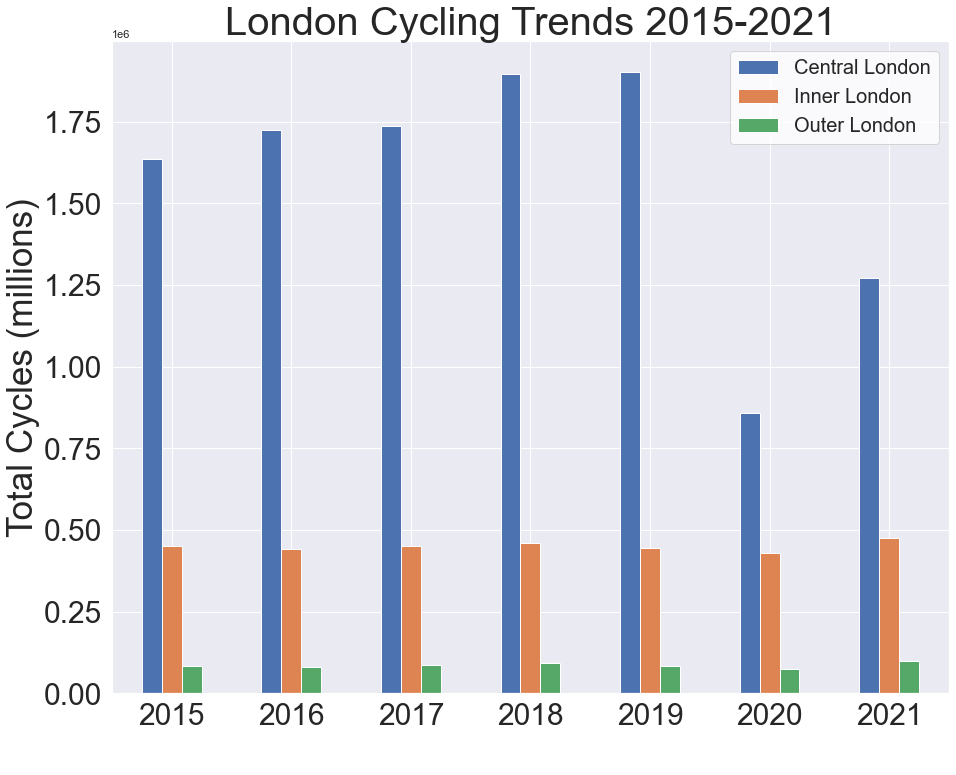

In [285]:
# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a stacked barplot for total number of cyclists in different areas of London annual.
graph = london.plot(x='Year', y=['Total_cycles', 'Total cycles_x', 'Total cycles_y'], kind = 'bar', rot = 0)

# Annotate the axes, labels and ticks.
plt.legend(fontsize = 20, facecolor='white',
          labels=["Central London", "Inner London", "Outer London"])
plt.xlabel('Year', fontsize=35, color = 'white')
plt.ylabel('Total Cycles (millions)', size=35)
plt.title('London Cycling Trends 2015-2021', fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
i=0

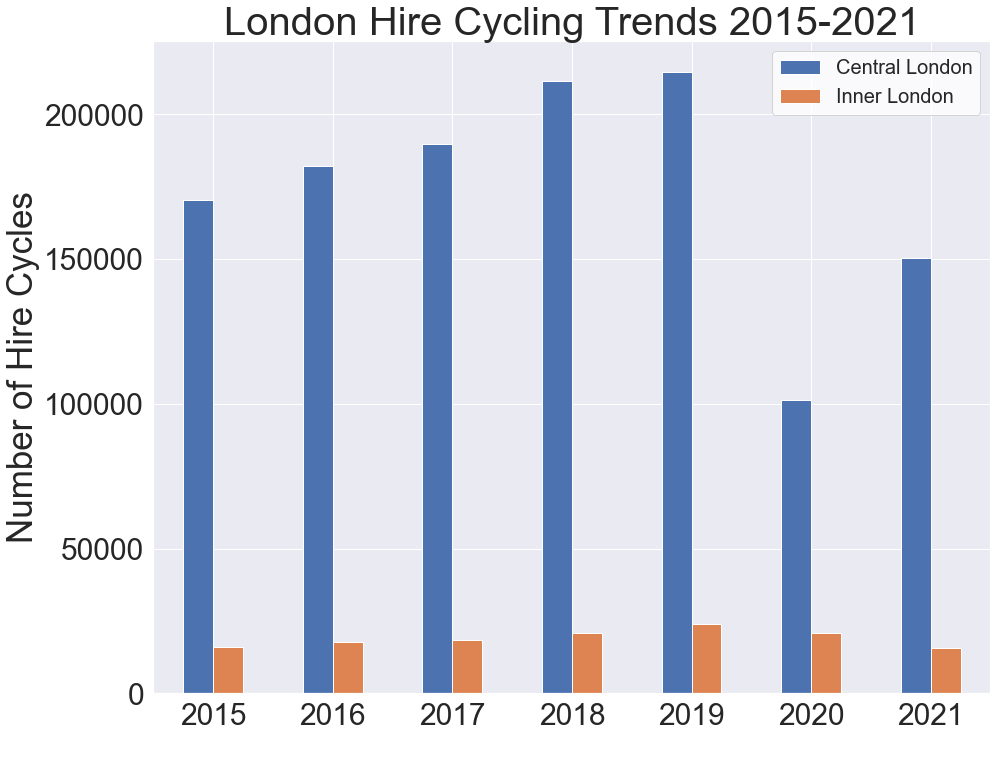

In [286]:
# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a stacked barplot to see hired bikes dynamic
graph = london.plot(x='Year', y=['Number of cycle hire bikes_x', 'Number of cycle hire bikes_y'], kind = 'bar', rot = 0)

# Annotate the axes, labels and ticks.
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
graph.set_xlabel('Year', fontsize=35, color = 'white')
graph.set_ylabel('Number of Hire Cycles', fontsize=35)
graph.set_title("London Hire Cycling Trends 2015-2021", fontsize=40)
#sns.set_style('ticks',{'axes.grid' : True})
plt.legend(fontsize = 20, facecolor='white',
          labels=["Central London", "Inner London"])
i=0

## Central London - trends

In [287]:
# Create a dataframe looking at cycling numbers for every year in Central London
cent_percent = borough_group.groupby(['Year']).sum().reset_index()
cent_percent

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,2014,1436361,166636,1602997.0
1,2015,1466529,170614,1637143.0
2,2016,1542540,182302,1724842.0
3,2017,1545707,189648,1735355.0
4,2018,1685509,211673,1897182.0
5,2019,1687339,214662,1902001.0
6,2020,755388,101364,856752.0
7,2021,1119418,150541,1269959.0


In [288]:
# Drop post Covid-19 years
cent_percent = cent_percent.iloc[0:6, :]
cent_percent

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,2014,1436361,166636,1602997.0
1,2015,1466529,170614,1637143.0
2,2016,1542540,182302,1724842.0
3,2017,1545707,189648,1735355.0
4,2018,1685509,211673,1897182.0
5,2019,1687339,214662,1902001.0


In [289]:
# Create column working out percentage change in private cycles
cent_percent['% private change'] = cent_percent['Number of private cycles'].pct_change().round(3)
cent_percent

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change
0,2014,1436361,166636,1602997.0,NaN
1,2015,1466529,170614,1637143.0,0.021
2,2016,1542540,182302,1724842.0,0.052
3,2017,1545707,189648,1735355.0,0.002
4,2018,1685509,211673,1897182.0,0.090
5,2019,1687339,214662,1902001.0,0.001


In [290]:
# Calculate percentage change in hire cyclies between 2014 and 2019
cent_percent['% hire change'] = cent_percent['Number of cycle hire bikes'].pct_change().round(3)
cent_percent

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change,% hire change
0,2014,1436361,166636,1602997.0,NaN,NaN
1,2015,1466529,170614,1637143.0,0.021,0.024
2,2016,1542540,182302,1724842.0,0.052,0.069
3,2017,1545707,189648,1735355.0,0.002,0.040
4,2018,1685509,211673,1897182.0,0.090,0.116
5,2019,1687339,214662,1902001.0,0.001,0.014


In [291]:
# Calculate percentage change in hire cyclies between 2014 and 2019
cent_percent['% total change'] = cent_percent['Total_cycles'].pct_change().round(3)
cent_percent

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change,% hire change,% total change
0,2014,1436361,166636,1602997.0,NaN,NaN,NaN
1,2015,1466529,170614,1637143.0,0.021,0.024,0.021
2,2016,1542540,182302,1724842.0,0.052,0.069,0.054
3,2017,1545707,189648,1735355.0,0.002,0.040,0.006
4,2018,1685509,211673,1897182.0,0.090,0.116,0.093
5,2019,1687339,214662,1902001.0,0.001,0.014,0.003


In [292]:
# Copy the dataframe to isoalte the 2014 and 2019 years
cent_percent_ss = cent_percent.copy()
cent_percent_ss

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change,% hire change,% total change
0,2014,1436361,166636,1602997.0,NaN,NaN,NaN
1,2015,1466529,170614,1637143.0,0.021,0.024,0.021
2,2016,1542540,182302,1724842.0,0.052,0.069,0.054
3,2017,1545707,189648,1735355.0,0.002,0.040,0.006
4,2018,1685509,211673,1897182.0,0.090,0.116,0.093
5,2019,1687339,214662,1902001.0,0.001,0.014,0.003


In [293]:
# Drop unecessary rows to leave 2014 and 2019
cent_percent_ss.drop(cent_percent.index[1:5], inplace=True)
cent_percent_ss

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change,% hire change,% total change
0,2014,1436361,166636,1602997.0,NaN,NaN,NaN
5,2019,1687339,214662,1902001.0,0.001,0.014,0.003


In [294]:
# Calculate percentage change in private cyclies between 2014 and 2019
cent_percent_ss['% private change'] = cent_percent_ss['Number of private cycles'].pct_change().round(3)
cent_percent_ss

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change,% hire change,% total change
0,2014,1436361,166636,1602997.0,NaN,NaN,NaN
5,2019,1687339,214662,1902001.0,0.175,0.014,0.003


In [295]:
# Calculate percentage change in hire cyclies between 2014 and 2019
cent_percent_ss['% hire change'] = cent_percent_ss['Number of cycle hire bikes'].pct_change().round(3)
cent_percent_ss

,Year,Number of private cycles,Number of cycle hire bikes,Total_cycles,% private change,% hire change,% total change
0,2014,1436361,166636,1602997.0,NaN,NaN,NaN
5,2019,1687339,214662,1902001.0,0.175,0.288,0.003


Can see that both private and hire cycles experienced a positive growth between 2014 and 2019. 

Notably, hire cycles has experienced a significant growth, 28.8%, between 2014 and 2019 and shows how this is a growing area of TFL to increase cycling rates. It is important to note that there are positive signs that cycling is increasing in central london. 

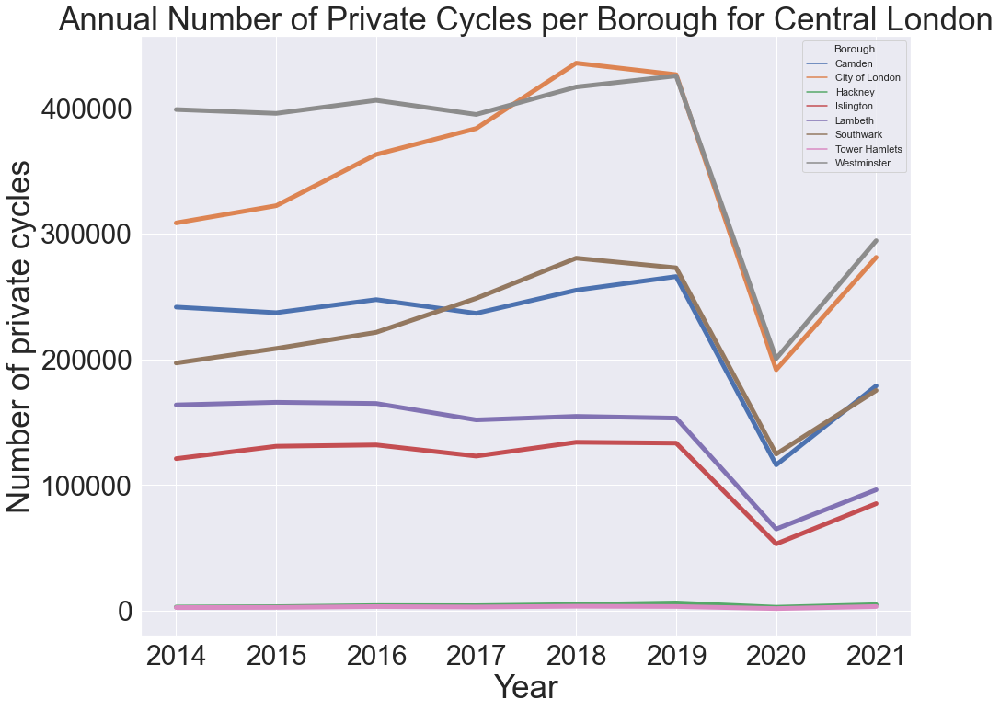

In [296]:
# Set figure size.
sns.set(rc={'figure.figsize': (15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')

nc_cent_boro = sns.lineplot(x='Year', y='Number of private cycles',
                        hue='Borough', lw=5, data=borough_group , ci=None)

nc_cent_boro.legend(title='Borough', loc='upper right')
nc_cent_boro.set_xlabel('Year')
nc_cent_boro.set_ylabel('Number of private cycles')
nc_cent_boro.set_title("Annual Number of Private Cycles per Borough for Central London")
nc_cent_boro.title.set_fontsize(35)
nc_cent_boro.xaxis.label.set_fontsize(35)
nc_cent_boro.yaxis.label.set_fontsize(35)
nc_cent_boro.tick_params(axis='both', which='major', labelsize=30)

plt.savefig('nc_cent_boro.png')

Can see the increase in total private cyckes per year for each central borough. note the significant drop off during 2020 due to Covid-19. 

Backs up the percentage change we saw earlier that there was already good progress being made to increasing cycling numbers between 2014 and 2019 - though looking at the % shows this change has not been that drastic. 

More work could be done to improve Hackney and Tower Hamlets - perhaps other group members found somethis which indicates why there is a problem there.

## Comparing hire and private cycles

In [297]:
# Create a subset grouped by each quarter
quarter_totals = borough_ss.groupby('Year-Quarter').sum().reset_index()
quarter_totals.head()

,Year-Quarter,Number of private cycles,Number of cycle hire bikes,Total_cycles
0,2014-Q1,313033,31007,344040.0
1,2014-Q2,394208,45986,440194.0
2,2014-Q3,384909,50467,435376.0
3,2014-Q4,344211,39176,383387.0
4,2015-Q1,319373,34255,353628.0


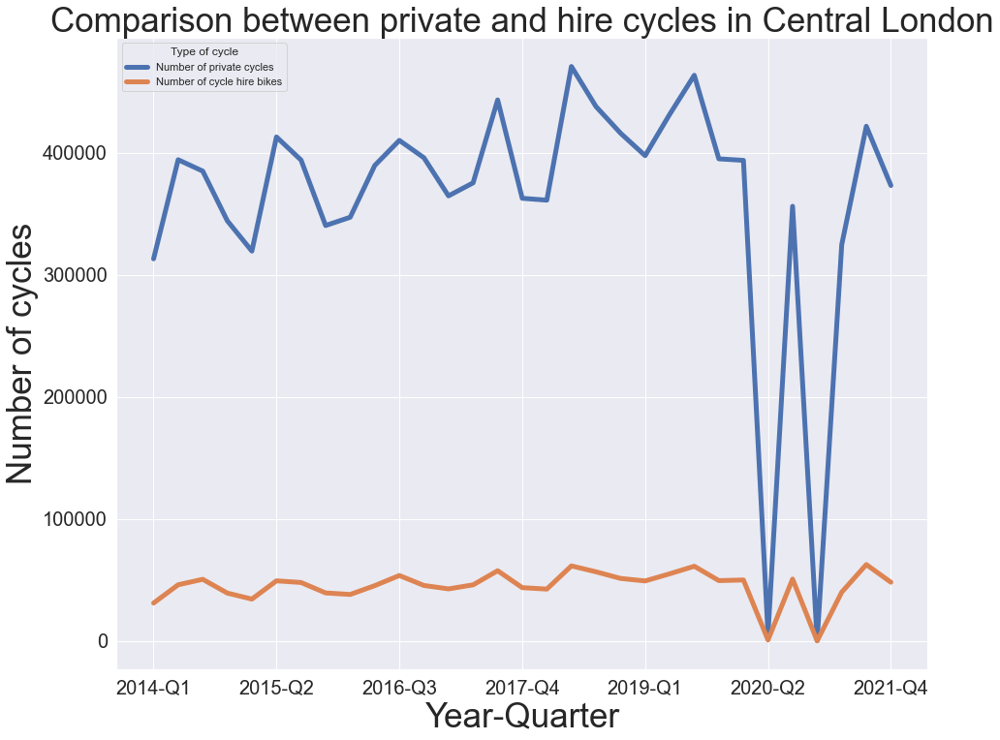

In [298]:
# Plot graph showing the trends over time
# Set figure size.
sns.set(rc={'figure.figsize': (15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')


nc_quarter = quarter_totals.plot(x='Year-Quarter', y=['Number of private cycles', 'Number of cycle hire bikes'],
                                         kind='line', lw=5)



nc_quarter.legend(title='Type of cycle', loc='upper left')
nc_quarter.set_xlabel('Year-Quarter')
nc_quarter.set_ylabel('Number of cycles')
nc_quarter.set_title("Comparison between private and hire cycles in Central London")
nc_quarter.title.set_fontsize(35)
nc_quarter.xaxis.label.set_fontsize(35)
nc_quarter.yaxis.label.set_fontsize(35)
nc_quarter.tick_params(axis='both', which='major', labelsize=20)

Can see that for both private and hire ccycles there was a general upward trend in the number of cycles over the analysed period. 

Can clearly see the effects of the covid and the two major lockdowns in early 2020 and late 2020 / early 2021. 

## Look at hire cycles

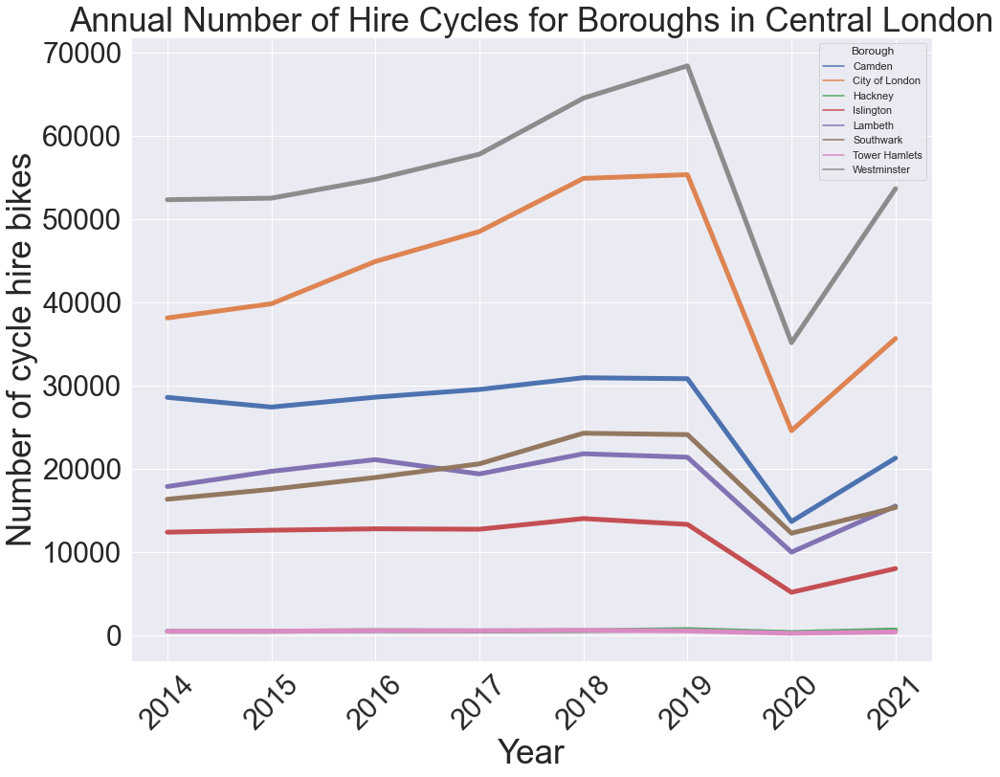

In [299]:
# Plot graph showing the trends over time
# Set figure size.
sns.set(rc={'figure.figsize': (15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Rotates X-Axis Ticks by 45-degrees
plt.xticks(rotation = 45) 

nc_cent_hire = sns.lineplot(x='Year', y='Number of cycle hire bikes',
                        hue='Borough', lw=5, data=borough_group , ci=None)

nc_cent_hire.legend(title='Borough', loc='upper right')
nc_cent_hire.set_xlabel('Year')
nc_cent_hire.set_ylabel('Number of cycle hire bikes')
nc_cent_hire.set_title("Annual Number of Hire Cycles for Boroughs in Central London")
nc_cent_hire.title.set_fontsize(35)
nc_cent_hire.xaxis.label.set_fontsize(35)
nc_cent_hire.yaxis.label.set_fontsize(35)
nc_cent_hire.tick_params(axis='both', which='major', labelsize=30)

plt.savefig('nc_cent_hire.png')

We can see that in central london that hired bikes were accesed in good numbers  but then  declined in 2019 due to covid and started recovering in 2020 and 2021.

In [300]:
# Read the inner provided CSV file/data set.            
inner = pd.read_csv('london_inner_cl.csv')
inner.head()

,Unnamed: 0,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter
0,0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20,Wednesday,2015,May,Q2
1,1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2
2,2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2
3,3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2
4,4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2


In [301]:
# merge inner and biking sites dataframes
borough_li = pd.merge(inner,
                 london_sites[['Site ID', 'Borough', 'Functional cycling area']],
                 on='Site ID')
borough_li.head()

,Unnamed: 0,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,...,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Borough,Functional cycling area
0,0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,...,1,0,1,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
1,1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,...,2,0,2,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
2,2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,...,2,0,2,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
3,3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,...,4,0,4,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
4,4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,...,4,0,4,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner


In [302]:
# Drop unnamed column
borough_li = borough_li.drop(['Unnamed: 0'], axis=1)
borough_li.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Borough,Functional cycling area
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2,Tower Hamlets,Inner


In [303]:
borough_li.groupby(['Borough',
                    'Survey wave (year)']).sum()['Number of cycle hire bikes'].agg(max=('max'), min=('min'))

max    5642
min       0
Name: Number of cycle hire bikes, dtype: int64

In [304]:
borough_li.groupby(['Period','Borough']).count()

Survey wave (year)  Site ID  Location  \
Period                Borough                                                 
AM peak (07:00-10:00) Brent                         1032     1032      1032   
                      Bromley                        456      456       456   
                      Camden                        6072     6072      6072   
                      Ealing                        1032     1032      1032   
                      Greenwich                      168      168       168   
...                                                  ...      ...       ...   
PM peak (16:00-19:00) Southwark                     8424     8424      8424   
                      Tower Hamlets                 8916     8916      8916   
                      Waltham Forest                 336      336       336   
                      Wandsworth                   11304    11304     11304   
                      Westminster                   7296     7296      7296   

                                      Survey date  Weather   Time  Direction  \
Period                Borough                                                  
AM peak (07:00-10:00) Brent                  1032     1032   1032       1032   
                      Bromley                 456      456    456        456   
                      Camden                 6072     6072   6072       6072   
                      Ealing                 1032     1032   1032       1032   
                      Greenwich               168      168    168        168   
...                                           ...      ...    ...        ...   
PM peak (16:00-19:00) Southwark              8280     8424   8424       8424   
                      Tower Hamlets          8916     8916   8916       8916   
                      Waltham Forest          336      336    336        336   
                      Wandsworth            11208    11304  11304      11304   
                      Westminster            7296     7296   7296       7296   

                                      Start hour  Start minute  \
Period                Borough                                    
AM peak (07:00-10:00) Brent                 1032          1032   
                      Bromley                456           456   
                      Camden                6072          6072   
                      Ealing                1032          1032   
                      Greenwich              168           168   
...                                          ...           ...   
PM peak (16:00-19:00) Southwark             8424          8424   
                      Tower Hamlets         8916          8916   
                      Waltham Forest         336           336   
                      Wandsworth           11304         11304   
                      Westminster           7296          7296   

                                      Number of private cycles  \
Period                Borough                                    
AM peak (07:00-10:00) Brent                               1032   
                      Bromley                              456   
                      Camden                              6072   
                      Ealing                              1032   
                      Greenwich                            168   
...                                                        ...   
PM peak (16:00-19:00) Southwark                           8424   
                      Tower Hamlets                       8916   
                      Waltham Forest                       336   
                      Wandsworth                         11304   
                      Westminster                         7296   

                                      Number of cycle hire bikes  \
Period                Borough                                      
AM peak (07:00-10:00) Brent                                 1032   
                      Bromley                  

In [305]:
period_freq =  borough_li.groupby(['Borough','Period']).count()
period_freq

Survey wave (year)  Site ID  \
Borough     Period                                                     
Brent       AM peak (07:00-10:00)                      1032     1032   
            Early Morning (06:00-07:00)                 344      344   
            Evening (19:00-22:00)                      1032     1032   
            Inter-peak (10:00-16:00)                   2064     2064   
            PM peak (16:00-19:00)                      1032     1032   
...                                                     ...      ...   
Westminster AM peak (07:00-10:00)                      7302     7302   
            Early Morning (06:00-07:00)                2432     2432   
            Evening (19:00-22:00)                      7320     7320   
            Inter-peak (10:00-16:00)                  14592    14592   
            PM peak (16:00-19:00)                      7296     7296   

                                         Location  Survey date  Weather  \
Borough     Period                                                        
Brent       AM peak (07:00-10:00)            1032         1032     1032   
            Early Morning (06:00-07:00)       344          344      344   
            Evening (19:00-22:00)            1032         1032     1032   
            Inter-peak (10:00-16:00)         2064         2064     2064   
            PM peak (16:00-19:00)            1032         1032     1032   
...                                           ...          ...      ...   
Westminster AM peak (07:00-10:00)            7302         7302     7302   
            Early Morning (06:00-07:00)      2432         2432     2432   
            Evening (19:00-22:00)            7320         7320     7320   
            Inter-peak (10:00-16:00)        14592        14592    14592   
            PM peak (16:00-19:00)            7296         7296     7296   

                                          Time  Direction  Start hour  \
Borough     Period                                                      
Brent       AM peak (07:00-10:00)         1032       1032        1032   
            Early Morning (06:00-07:00)    344        344         344   
            Evening (19:00-22:00)         1032       1032        1032   
            Inter-peak (10:00-16:00)      2064       2064        2064   
            PM peak (16:00-19:00)         1032       1032        1032   
...                                        ...        ...         ...   
Westminster AM peak (07:00-10:00)         7302       7302        7302   
            Early Morning (06:00-07:00)   2432       2432        2432   
            Evening (19:00-22:00)         7320       7320        7320   
            Inter-peak (10:00-16:00)     14592      14592       14592   
            PM peak (16:00-19:00)         7296       7296        7296   

                                         Start minute  \
Borough     Period                                      
Brent       AM peak (07:00-10:00)                1032   
            Early Morning (06:00-07:00)           344   
            Evening (19:00-22:00)                1032   
            Inter-peak (10:00-16:00)             2064   
            PM peak (16:00-19:00)                1032   
...                                               ...   
Westminster AM peak (07:00-10:00)                7302   
            Early Morning (06:00-07:00)          2432   
            Evening (19:00-22:00)                7320   
            Inter-peak (10:00-16:00)            14592   
            PM peak (16:00-19:00)                7296   

                                         Number of private cycles  \
Borough     Period                                                  
Brent       AM peak (07:00-10:00)                            1032   
            Early Morning (06:00-07:00)                       344   
            Evening (19:00-22:00)                            1032   
            Inter-peak (10:00-16:00)                         2064   
            PM peak (1

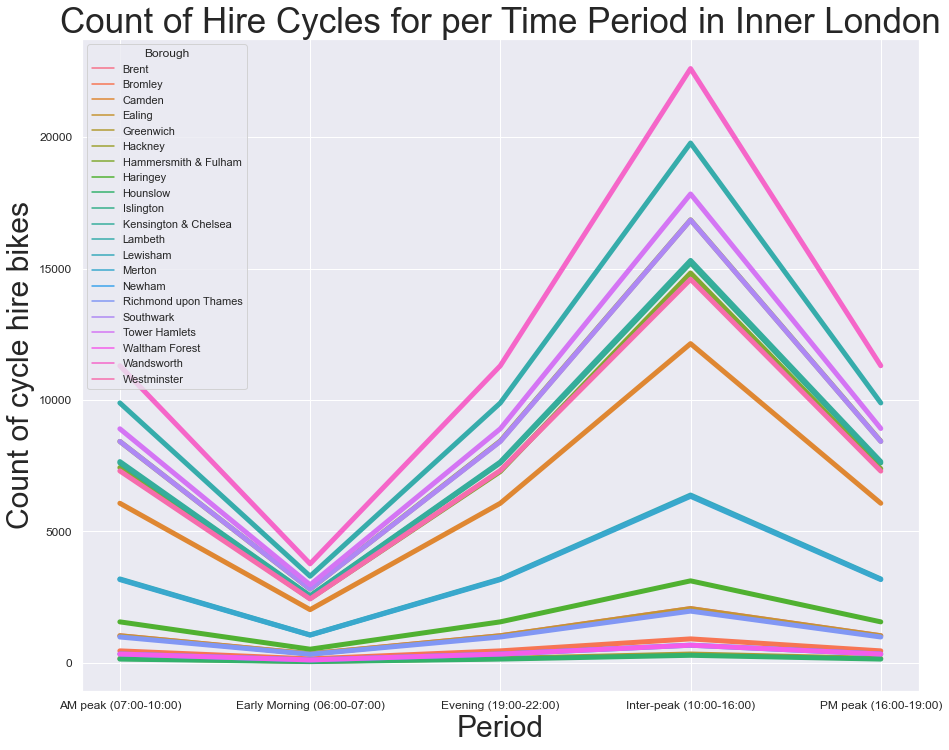

In [306]:
# Plot graph showing the trends over time
# Set figure size.
sns.set(rc={'figure.figsize': (15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')


nc_period_freq = sns.lineplot(x='Period', y='Number of cycle hire bikes', lw=5,
                        hue='Borough', data=period_freq)

nc_period_freq.legend(title='Borough', loc='upper left')
nc_period_freq.set_xlabel('Period')
nc_period_freq.set_ylabel('Count of cycle hire bikes')
nc_period_freq.set_title("Count of Hire Cycles for per Time Period in Inner London")
nc_period_freq.title.set_fontsize(35)
nc_period_freq.xaxis.label.set_fontsize(30)
nc_period_freq.yaxis.label.set_fontsize(30)
nc_period_freq.tick_params(axis='both', which='major', labelsize=12)

Can be seen here at that most of borough prefer inter- peak time to use a bike hired a bike station. 

Leading to the assumption that this maybe due people using hired bikes usually on the weekend or on holidays rather than for their commuting travels

# Data available on TFL by Santander on Hired Bikes

In [307]:
# Import new dataframe
tfl = pd.read_excel('tfl_daily_cycle_hires1.xlsx')
tfl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4538 entries, 0 to 4537
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Day                        4538 non-null   datetime64[ns]
 1   Number of Bicycle Hires    4538 non-null   int64         
 2   Unnamed: 2                 0 non-null      float64       
 3   Month                      150 non-null    datetime64[ns]
 4   Number of Bicycle Hires.1  150 non-null    float64       
 5   Unnamed: 5                 0 non-null      float64       
 6   Year                       13 non-null     float64       
 7   Number of Bicycle Hires.2  13 non-null     float64       
 8   Unnamed: 8                 0 non-null      float64       
 9   Month.1                    150 non-null    datetime64[ns]
 10  Average Hire Time (mins)   150 non-null    float64       
dtypes: datetime64[ns](3), float64(7), int64(1)
memory usage: 390.1 KB


Extracted the data sheet from the original tfl_daily_cycle_hires excel spreadsheet for importing purposes. No other edits have been made to the data. 

Both the original and the extracted data set imported into this worksheet has been uploaded to our github repo.

In [308]:
tfl_ss = tfl.loc[:, ~tfl.columns.str.contains('^Unnamed')]
tfl_ss.head()

,Day,Number of Bicycle Hires,Month,Number of Bicycle Hires.1,Year,Number of Bicycle Hires.2,Month.1,Average Hire Time (mins)
0,2010-07-30,6897,2010-07-01,12461.0,2010.0,2180813.0,2010-07-01,17.232566
1,2010-07-31,5564,2010-08-01,341203.0,2011.0,7142449.0,2010-08-01,16.551880
2,2010-08-01,4303,2010-09-01,540859.0,2012.0,9519283.0,2010-09-01,15.219079
3,2010-08-02,6642,2010-10-01,544412.0,2013.0,8045459.0,2010-10-01,15.204481
4,2010-08-03,7966,2010-11-01,456304.0,2014.0,10023897.0,2010-11-01,13.776083


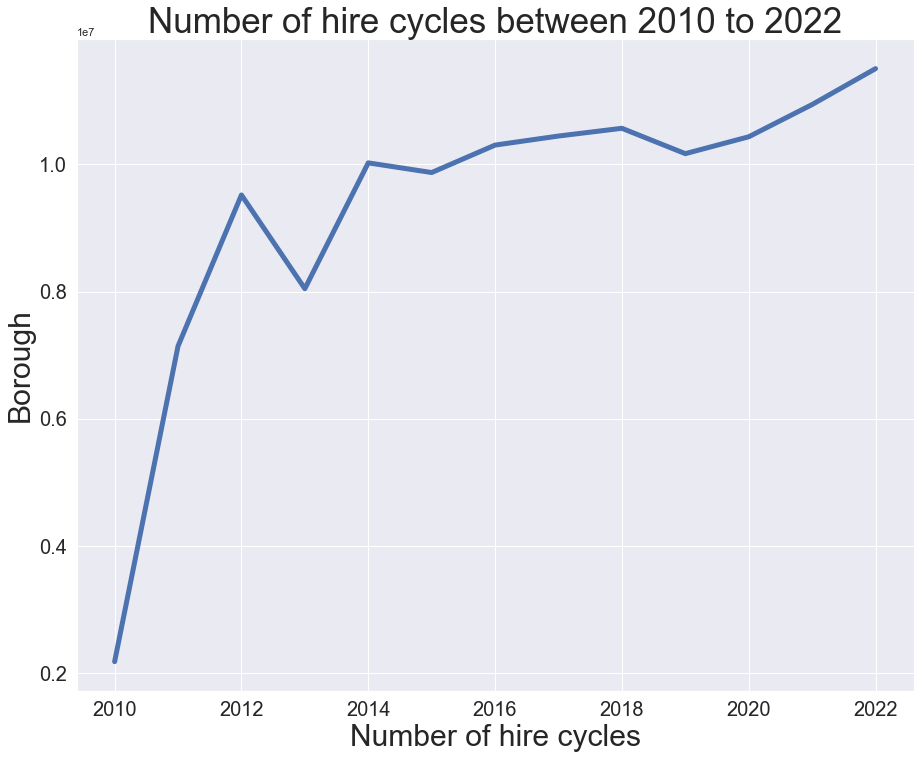

In [309]:
# Plot graph showing the trends over time
# Set figure size.
sns.set(rc={'figure.figsize': (15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')

nc_tfl_total = sns.lineplot(x='Year', y='Number of Bicycle Hires.2', lw=5, data=tfl_ss)
nc_tfl_total.set_xlabel('Number of hire cycles')
nc_tfl_total.set_ylabel('Borough')
nc_tfl_total.set_title("Number of hire cycles between 2010 to 2022")
nc_tfl_total.title.set_fontsize(35)
nc_tfl_total.xaxis.label.set_fontsize(30)
nc_tfl_total.yaxis.label.set_fontsize(30)
nc_tfl_total.tick_params(axis='both', which='major', labelsize=20)

Above data shows how pre pandemic that hire bikes number were increasing and at healthy rate pre covid-19. Interestingly the two major spikes in the number of hire cycles come after two major events effecting London. In 2012 London hosted the olympics, with many events stationed across the olympic site but also across the city. The bike-hire scheme was extended to East London pre olympic games to enable spectators, and the influx of tourism, to attend events(https://www.theguardian.com/uk/2011/feb/01/bike-hire-scheme-east-london-spring-2012). This event is likely to have chnaged attitudes to the hire cycles and prompted a period of sustained use.

Additionally, the second major spike and rise in number of hire cycles has occured post covid, where again it is likely that during lockdowns and varying levels of restrictions residents started using hire cycles when they didnt have to attend work and now this is being reflected post covid. 

Cycle hire scheme really seemed to take off in post 2016 - where record numbers was recorded at the time. Noted in the below column that more bikes and doking stations were made available - infering to an increase in infrastructure. Santander have annouced they have introduced 800 new docking stations across London which also will give rise to hired bikes numbers in inner London.

Also, that in 2014 Santander took over the sponsorship of the bikes from Barcleys and seem to have developed a tangible image of what the hire bikes look like - seems to have been a sponsorship which has worked. 

Additionally, 2014 is around the time when Phase 1 of the introduction of cycle hire bikes ended - TFL might have learn their lessons and how to progress better in the future which might be responsible for the increased numbers. Particularly operational lessons. 

https://cyclingindustry.news/10-3-million-trips-makes-2016-a-record-breaking-year-for-london-cycle-hire/

https://content.tfl.gov.uk/fpc-20141014-part-1-item-14-cycle-hire-imp-chei-close.pdf - go to page 7 for lessons learn from phase 1. 

It was announced on 6th October 2022 that Santander will continue to sponsor London's flagship cycle hire scheme until May 2025. This will support TfL as it moves forward with planned investment in cycle hire, ensuring the scheme continues to grow and encourages more Londoners to get cycling.

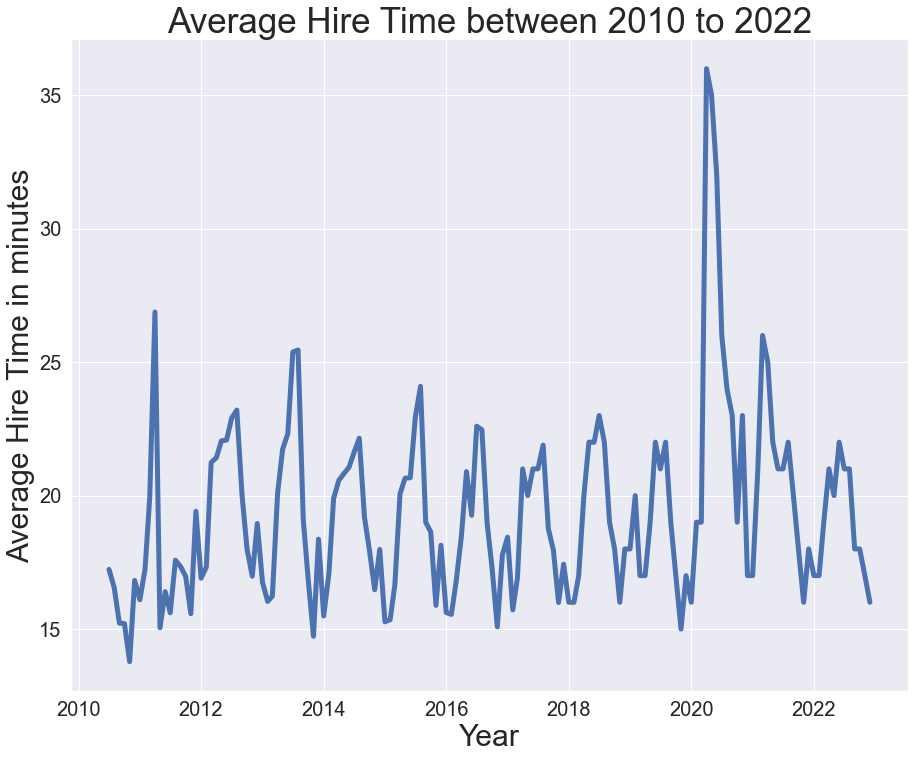

In [310]:
# Plot graph showing the trends over time
# Set figure size.
sns.set(rc={'figure.figsize': (15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')
              
nc_tfl_time = sns.lineplot(x='Month.1', y='Average Hire Time (mins)', lw=5, data=tfl_ss)
nc_tfl_time.set_xlabel('Year')
nc_tfl_time.set_ylabel('Average Hire Time in minutes')
nc_tfl_time.set_title("Average Hire Time between 2010 to 2022")
nc_tfl_time.title.set_fontsize(35)
nc_tfl_time.xaxis.label.set_fontsize(30)
nc_tfl_time.yaxis.label.set_fontsize(30)
nc_tfl_time.tick_params(axis='both', which='major', labelsize=20)

Above graphs shows the trends in average time in minutes used over each year. Can see the peak around spring 2022 where the average hire time was over 35 minutes. 

This spike is an outlier as the value is siginificantly higher than any other we see over the analysed time period. 

## Hire cycles general trends

Can see that hire cycles numbers was on the rise over the analysed period and there is healthy growth regards this mode of cycling. 

It is also positive to see that santander is continuing its scheme with the hire bikes as it has been a success since they have taken over from Barclays. 

It is also interesting to note that the majority of hire cycles are used during the inter peak sugessting more leisure travel than commuting usage.

# Insights and observations related to Date an Time

In [311]:
# What year has the largest number of records?
L_centr_fnl_0['Year'].value_counts()

2019    106880
2018    106708
2017    104748
2015    102964
2016    102656
2014    102540
2021     77651
2020     54016
Name: Year, dtype: int64

In [312]:
# Total number of cycle trips per calendar year.
year_ttl = L_centr_fnl_0.groupby('Year')\
[['Total_cycles']].sum().reset_index().sort_values('Total_cycles', ascending=0)

# View DataFrame.
year_ttl

,Year,Total_cycles
5,2019,1902001.0
4,2018,1897182.0
3,2017,1735355.0
2,2016,1724842.0
1,2015,1637143.0
0,2014,1602997.0
7,2021,1269959.0
6,2020,856752.0


In [313]:
# What year has the highest average number of cycles (every 15 mins)?
year_15mns = L_centr_fnl_0.groupby('Year')\
[['Total_cycles']].mean().round(2).reset_index().sort_values('Total_cycles', ascending=0)

# View DataFrame.
year_15mns

,Year,Total_cycles
5,2019,17.80
4,2018,17.78
2,2016,16.80
3,2017,16.57
7,2021,16.35
1,2015,15.90
6,2020,15.86
0,2014,15.63


In [314]:
# What quater has the largest number of records?
L_centr_fnl_0['Quarter'].value_counts()

Q3    208506
Q1    187084
Q4    185554
Q2    177019
Name: Quarter, dtype: int64

In [315]:
# Total number of cycle trips per calendar quater.
Q_ttl = L_centr_fnl_0.groupby('Quarter')\
[['Total_cycles']].sum().reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
Q_ttl

,Quarter,Total_cycles
0,Q3,3751416.0
1,Q2,3147501.0
2,Q4,2943478.0
3,Q1,2783836.0


In [316]:
# What quater has the highest average number of cycles (every 15 mins)?
Q_15mns = L_centr_fnl_0.groupby('Quarter')\
[['Total_cycles']].mean().round(2).reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
Q_15mns

,Quarter,Total_cycles
0,Q3,17.99
1,Q2,17.78
2,Q4,15.86
3,Q1,14.88


In [317]:
# Top 10 dates with the highest number of cycle trips?
date_ttl = L_centr_fnl_0.groupby('Date')\
[['Total_cycles']].sum().reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
date_ttl.head(10)

,Date,Total_cycles
0,2014-01-23,38849.0
1,2014-01-27,36725.0
2,2014-01-30,36265.0
3,2014-02-03,31184.0
4,2019-09-10,30507.0
5,2014-01-28,29441.0
6,2018-06-26,28486.0
7,2018-04-17,28325.0
8,2015-06-30,27462.0
9,2017-07-12,26882.0


In [318]:
# Top 10 dates with the highest average number of cycles (every 15 mins)?
date_15mns = L_centr_fnl_0.groupby('Date')\
[['Total_cycles']].mean().round(2).reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
date_15mns.head(10)

,Date,Total_cycles
0,2019-05-27,80.00
1,2019-09-02,76.74
2,2021-11-25,68.18
3,2017-10-02,58.79
4,2019-02-18,52.44
5,2020-01-06,52.40
6,2019-02-21,46.40
7,2021-11-24,45.07
8,2018-09-24,42.38
9,2018-05-17,40.39


In [319]:
# Total number of cycle trips per Year-Quarter.
year_Q_ttl = L_centr_fnl_0.groupby('Year-Quarter')\
[['Total_cycles']].sum().reset_index().sort_values('Total_cycles', ascending=0).\
reset_index(drop=True)

# View DataFrame (top 10).
year_Q_ttl.head(10)

,Year-Quarter,Total_cycles
0,2018-Q2,532056.0
1,2019-Q3,524567.0
2,2017-Q3,500698.0
3,2018-Q3,494423.0
4,2019-Q2,486424.0
5,2021-Q3,484166.0
6,2018-Q4,467167.0
7,2016-Q3,463644.0
8,2015-Q2,462092.0
9,2019-Q1,446680.0


In [320]:
# What year & Q has the highest average number of cycles (every 15 mins)?
year_Q_15mns = L_centr_fnl_0.groupby('Year-Quarter')\
[['Total_cycles']].mean().round(2).reset_index().sort_values('Total_cycles', ascending=0).\
reset_index(drop=True)

# View DataFrame (top 10).
year_Q_15mns.head(10)

,Year-Quarter,Total_cycles
0,2019-Q3,19.86
1,2018-Q2,19.69
2,2019-Q2,19.44
3,2018-Q3,19.36
4,2016-Q3,18.91
5,2017-Q3,17.87
6,2015-Q2,17.68
7,2021-Q3,17.63
8,2017-Q2,17.63
9,2014-Q3,17.51


In [321]:
# Check which quarters are missing.
L_centr_fnl_0['Year-Quarter'].value_counts().sort_index()

# Low number of observations for 2020-Q2 and 2020-Q4; no observations for 2021-Q1.

2014-Q1    25380
2014-Q2    25402
2014-Q3    24866
2014-Q4    26892
2015-Q1    25964
2015-Q2    26132
2015-Q3    25322
2015-Q4    25546
2016-Q1    26614
2016-Q2    24840
2016-Q3    24524
2016-Q4    26678
2017-Q1    26246
2017-Q2    23884
2017-Q3    28016
2017-Q4    26602
2018-Q1    26816
2018-Q2    27016
2018-Q3    25538
2018-Q4    27338
2019-Q1    28928
2019-Q2    25028
2019-Q3    26412
2019-Q4    26512
2020-Q1    27136
2020-Q2      470
2020-Q3    26358
2020-Q4       52
2021-Q2    24247
2021-Q3    27470
2021-Q4    25934
Name: Year-Quarter, dtype: int64

In [322]:
# Total number of cycle trips per time period.
period_ttl = L_centr_fnl_0.groupby('Period')\
[['Total_cycles']].sum().reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
period_ttl

,Period,Total_cycles
0,AM peak (07:00-10:00),4241531.0
1,PM peak (16:00-19:00),4013456.0
2,Inter-peak (10:00-16:00),2286218.0
3,Evening (19:00-22:00),1766391.0
4,Early Morning (06:00-07:00),318635.0


In [323]:
# What time period has the highest average number of cycles (every 15 mins)?
period_15mns = L_centr_fnl_0.groupby('Period')\
[['Total_cycles']].mean().round(2).reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
period_15mns

,Period,Total_cycles
0,AM peak (07:00-10:00),29.83
1,PM peak (16:00-19:00),28.24
2,Evening (19:00-22:00),12.43
3,Inter-peak (10:00-16:00),8.04
4,Early Morning (06:00-07:00),6.72


In [324]:
# View number of entries per time period per year.
Period_year = L_centr_fnl_0.groupby(['Period', 'Year']).agg({'Total_cycles':'count'}).reset_index()

# View DataFrame.
Period_year.head()

,Period,Year,Total_cycles
0,AM peak (07:00-10:00),2014,19230
1,AM peak (07:00-10:00),2015,19302
2,AM peak (07:00-10:00),2016,19248
3,AM peak (07:00-10:00),2017,19632
4,AM peak (07:00-10:00),2018,20016


In [325]:
# Total number of cycle trips per time slot.
time_ttl = L_centr_fnl_0.groupby('Time')\
[['Total_cycles']].sum().reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
time_ttl

,Time,Total_cycles
0,0830 - 0845,565363.0
1,0845 - 0900,557032.0
2,1815 - 1830,502981.0
3,1800 - 1815,498352.0
4,1745 - 1800,492409.0
...,...,...
59,1115 - 1130,81900.0
60,2130 - 2145,71473.0
61,2145 - 2200,62273.0
62,0615 - 0630,60842.0


In [326]:
# What time slot has the highest average number of cycles (every 15 mins)?
time_15mns = L_centr_fnl_0.groupby('Time')\
[['Total_cycles']].mean().round(2).reset_index().sort_values('Total_cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
time_15mns

,Time,Total_cycles
0,0830 - 0845,47.72
1,0845 - 0900,47.01
2,1815 - 1830,42.47
3,1800 - 1815,42.08
4,1745 - 1800,41.58
...,...,...
59,1115 - 1130,6.91
60,2130 - 2145,6.04
61,2145 - 2200,5.26
62,0615 - 0630,5.14


In [327]:
# What time slot has the highest number of cycle hire bikes (every 15 mins)?
time_hb_ttl = L_centr_fnl_0.groupby('Time')\
[['Number of cycle hire bikes']].sum().round(2).reset_index().sort_values('Number of cycle hire bikes', 
                                                                           ascending=0).reset_index(drop=True)

# View DataFrame.
time_hb_ttl

,Time,Number of cycle hire bikes
0,0830 - 0845,58376
1,0845 - 0900,58142
2,1745 - 1800,52510
3,0815 - 0830,50885
4,1800 - 1815,49425
...,...,...
59,2115 - 2130,8528
60,2130 - 2145,7576
61,2145 - 2200,6270
62,0615 - 0630,5321


In [328]:
# What time slot has the highest average number of cycle hire bikes (every 15 mins)?
time_hb_15mns = L_centr_fnl_0.groupby('Time')\
[['Number of cycle hire bikes']].mean().round(2).reset_index().sort_values('Number of cycle hire bikes', 
                                                                           ascending=0).reset_index(drop=True)

# View DataFrame.
time_hb_15mns

,Time,Number of cycle hire bikes
0,0830 - 0845,4.93
1,0845 - 0900,4.91
2,1745 - 1800,4.43
3,0815 - 0830,4.29
4,1800 - 1815,4.17
...,...,...
59,2115 - 2130,0.72
60,2130 - 2145,0.64
61,2145 - 2200,0.53
62,0615 - 0630,0.45


In [329]:
# What day of the week has the highest number of cycle trips?
time_wd_ttl = L_centr_fnl_0.groupby('Day')\
[['Total_cycles']].sum().round(2).reset_index().reset_index(drop=True)

# Sort days of the week in order.
time_wd_ttl = time_wd_ttl.set_index('Day')

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

time_wd_ttl = time_wd_ttl.reindex(index = order)
time_wd_ttl = time_wd_ttl.reset_index()

# View DataFrame.
time_wd_ttl

,Day,Total_cycles
0,Monday,2948133.0
1,Tuesday,2827214.0
2,Wednesday,2638516.0
3,Thursday,2278842.0
4,Friday,1766039.0
5,Saturday,1395.0
6,Sunday,2730.0


In [330]:
# What day of the week has the highest average number of cycle trips (per 15 mins)?
time_wd_15mns = L_centr_fnl_0.groupby('Day')\
[['Total_cycles']].mean().round(2).reset_index().reset_index(drop=True)

# Sort days of the week in order.
time_wd_15mns = time_wd_15mns.set_index('Day')

time_wd_15mns = time_wd_15mns.reindex(index = order)
time_wd_15mns = time_wd_15mns.reset_index()

# View DataFrame.
time_wd_15mns

,Day,Total_cycles
0,Monday,17.46
1,Tuesday,17.50
2,Wednesday,16.98
3,Thursday,16.54
4,Friday,14.28
5,Saturday,11.07
6,Sunday,8.17


In [331]:
# View number of entries per day of the week per year.
WD_year = L_centr_fnl_0.groupby(['Day', 'Year']).agg({'Total_cycles':'count'}).reset_index()

WD_year.head()

,Day,Year,Total_cycles
0,Friday,2014,20681
1,Friday,2015,21274
2,Friday,2016,16484
3,Friday,2017,19108
4,Friday,2018,13552


## Visualisations related to Date and Time

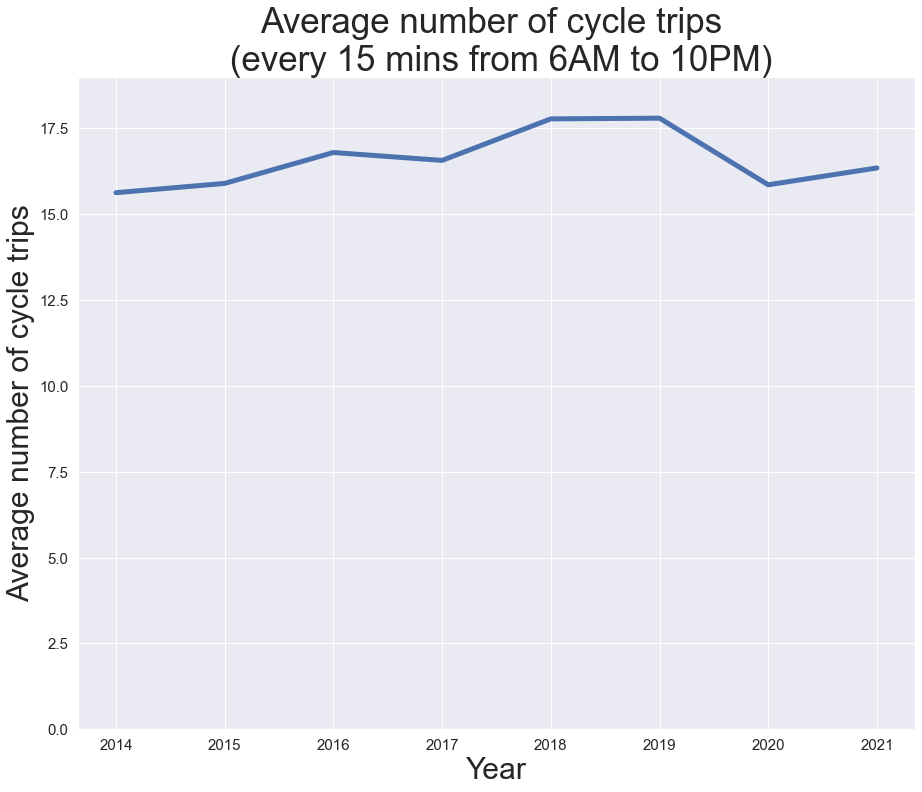

In [332]:
# Plot annualy average numbers of cycles.
# Create a lineplot.
avg_six_ten = sns.lineplot(x='Year', y='Total_cycles', data=year_15mns, 
                          lw=5)

# Update title, x and y labels and legend.
avg_six_ten.set_title('Average number of cycle trips \n (every 15 mins from 6AM to 10PM)', 
                      fontdict={'fontsize':25})
avg_six_ten.set_xlabel('Year')
avg_six_ten.set_ylabel('Average number of cycle trips')
avg_six_ten.title.set_fontsize(35)
avg_six_ten.xaxis.label.set_fontsize(30)
avg_six_ten.yaxis.label.set_fontsize(30)
avg_six_ten.tick_params(axis='both', which='major', labelsize=15)
plt.ylim(0, 19)

# View plot.
plt.show()

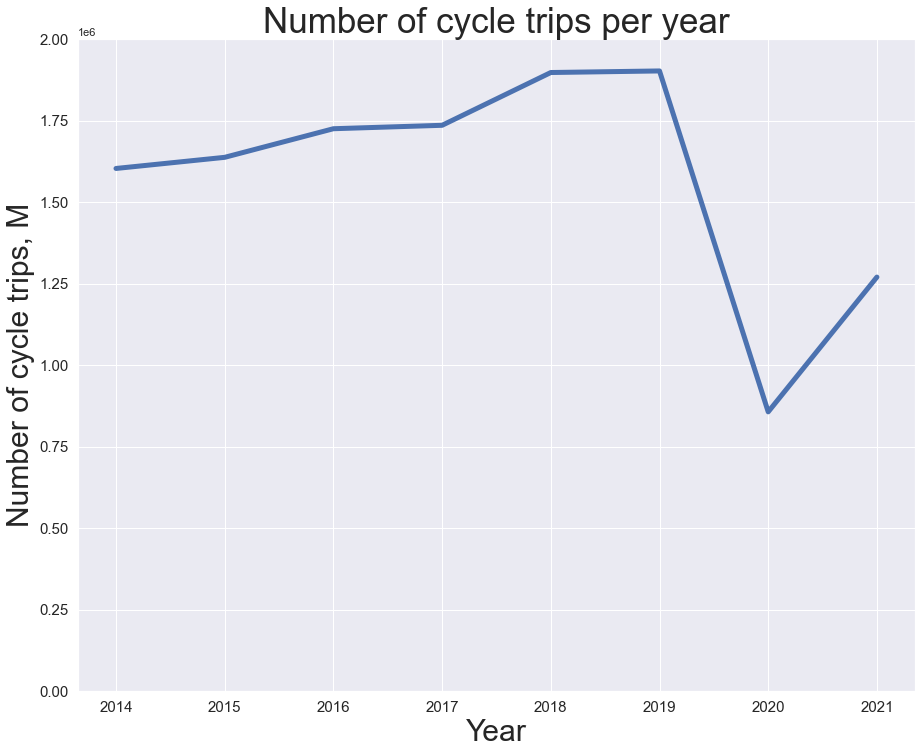

In [333]:
# Plot total numbers of cycle trips by year.
# Create a lineplot.
cycles_year = sns.lineplot(x='Year', y='Total_cycles', data=year_ttl, lw=5)

# Update title, x and y labels and legend.
cycles_year.set_title('Number of cycle trips per year')
cycles_year.set_xlabel('Year')
cycles_year.set_ylabel('Number of cycle trips, M')
cycles_year.title.set_fontsize(35)
cycles_year.xaxis.label.set_fontsize(30)
cycles_year.yaxis.label.set_fontsize(30)
cycles_year.tick_params(axis='both', which='major', labelsize=15)
plt.ylim(0, 2000000)
plt.xticks(fontsize = 15)

# View plot.
plt.show()

# Low number of observations for 2020-Q2 and 2020-Q4; and no observations for 2021-Q1, therefore the drop from 
# 2019 does not represent the real trend.

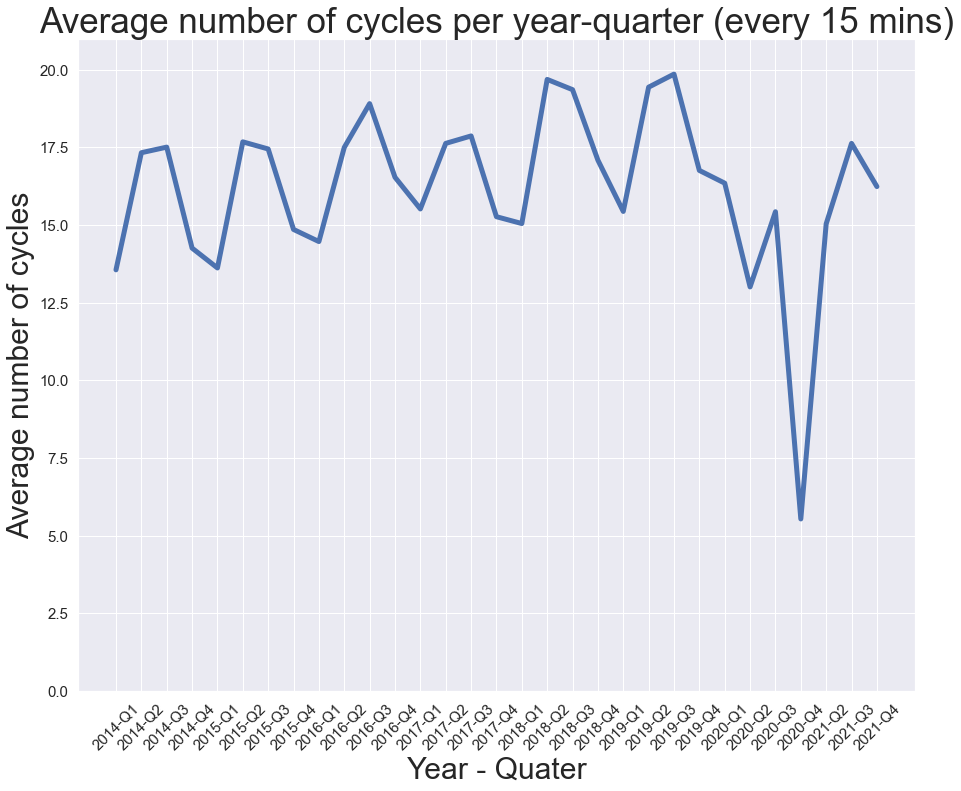

In [334]:
# Plot annualy (incl quarters) average numbers of cycles.
# Create a lineplot.
avg_year_quarter = sns.lineplot(x='Year-Quarter', y='Total_cycles', 
                           data=year_Q_15mns.sort_values('Year-Quarter', ascending=1), 
                           linewidth=5)

# Update title, x and y labels and legend.
avg_year_quarter.set_title('Average number of cycles per year-quarter (every 15 mins)', 
                      fontdict={'fontsize':35})
avg_year_quarter.set_xlabel('Year - Quater', fontdict={'fontsize':30})
avg_year_quarter.set_ylabel('Average number of cycles', fontdict={'fontsize':30})
avg_year_quarter.tick_params(axis='both', which='major', labelsize=15)
plt.xticks(rotation=45)
plt.ylim(0, 21)

# View plot.
plt.show()

# Due to low number of observations for 2020-Q2 and 2020-Q4; and no observations for 2021-Q1 line between 2020-Q1 
# and 2021-Q2 does not represent the true trend.
# Seasonal trend is clear with more trips during Q2 and Q3.

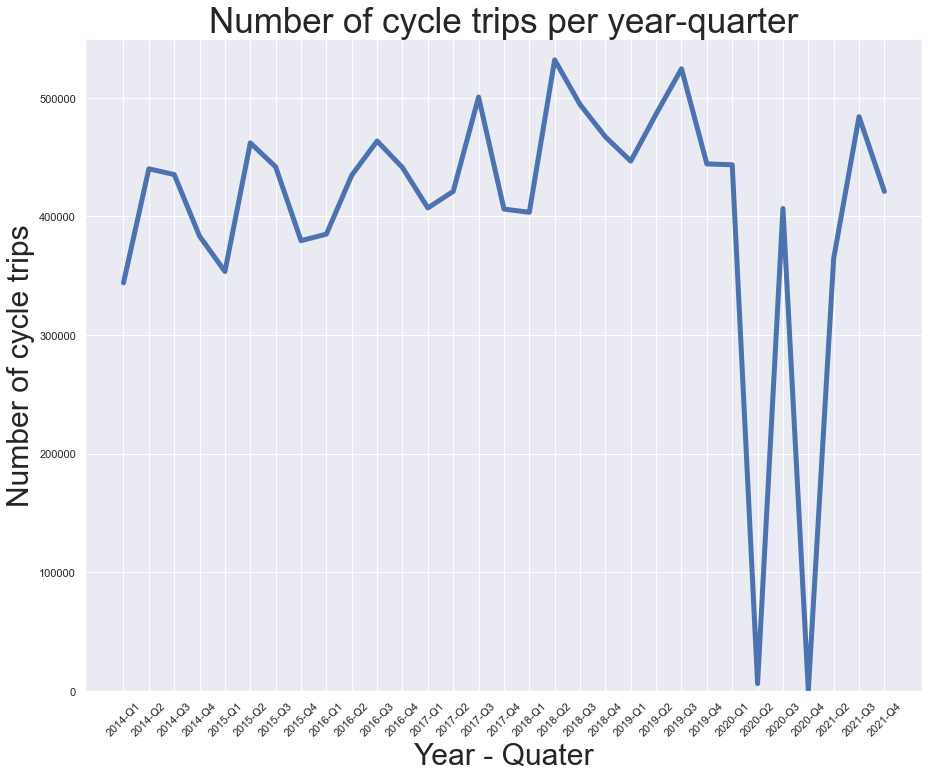

In [335]:
# Plot total number of cycle trips by year-quarter.
# Create a lineplot.
lineplot_yq = sns.lineplot(x='Year-Quarter', y='Total_cycles', 
                           data=year_Q_ttl.sort_values('Year-Quarter', ascending=1), 
                           linewidth=5)

# Update title, x and y labels and legend.
lineplot_yq.set_title('Number of cycle trips per year-quarter', 
                      fontdict={'fontsize':35})
lineplot_yq.set_xlabel('Year - Quater', fontdict={'fontsize':30})
lineplot_yq.set_ylabel('Number of cycle trips', fontdict={'fontsize':30})
plt.xticks(rotation=45)
plt.ylim(0, 550000)

# View plot.
plt.show()

# Due to low number of observations for 2020-Q2 and 2020-Q4; and no observations for 2021-Q1 line between 2020-Q1 
# and 2021-Q2 does not represent the true trend.
# Seasonal trend is clear with more trips during Q2 and Q3.

Observation: 

Graphs back up the general trend we have seen that cycling as on the rise pre pandemic both in total number and the average numner trips increasing. 


We can also see seasonality in number of cyclists on the roads were observed between 2014-2019 with the higher number of cyclists on the roads in Q2 (April-June) and Q3 (July-September) possibly due to better weather conditions.


## Outer London

### Insights and observations related to Date and Time

In [336]:
# What year has the largest number of records?
london_outer['Survey wave (year)'].value_counts()

2015    57728
2016    57728
2017    57728
2018    57728
2019    57600
2021    57472
2020    29676
Name: Survey wave (year), dtype: int64

In [337]:
# Total number of cycle trips per calendar year.
year_ttl_OL = london_outer.groupby('Survey wave (year)')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0)

# View DataFrame.
year_ttl_OL

,Survey wave (year),Total cycles
6,2021,99067
3,2018,91966
2,2017,86588
0,2015,82228
4,2019,82117
1,2016,80295
5,2020,74924


In [338]:
# What year has the highest average number of cycles (every 15 mins)?
year_15mns_OL = london_outer.groupby('Survey wave (year)')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0)

# View DataFrame.
year_15mns_OL

,Survey wave (year),Total cycles
5,2020,2.52
6,2021,1.72
3,2018,1.59
2,2017,1.50
4,2019,1.43
0,2015,1.42
1,2016,1.39


In [339]:
# What quater has the largest number of records?
london_outer['Quarter'].value_counts()

Q2         296864
Q3          60508
Q4          17120
Unknown      1168
Name: Quarter, dtype: int64

In [340]:
# Total number of cycle trips per calendar quater.
Q_ttl_OL = london_outer.groupby('Quarter')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
Q_ttl_OL

,Quarter,Total cycles
0,Q2,427012
1,Q3,128205
2,Q4,36095
3,Unknown,5873


In [341]:
# What quater has the highest average number of cycles (every 15 mins)?
Q_15mns_OL = london_outer.groupby('Quarter')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
Q_15mns_OL

,Quarter,Total cycles
0,Unknown,5.03
1,Q3,2.12
2,Q4,2.11
3,Q2,1.44


In [342]:
# Top 10 dates with the highest number of cycle trips?
date_ttl_OL = london_outer.groupby('Date')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
date_ttl_OL.head(10)

,Date,Total cycles
0,2021-05-12,6532
1,2020-09-17,5906
2,2020-10-06,5838
3,2020-10-07,5678
4,2021-05-11,4876
5,2018-06-05,4420
6,2021-05-13,4380
7,2020-09-15,4277
8,2021-06-10,4258
9,2018-06-04,3944


In [343]:
# Top 10 dates with the highest average number of cycles (every 15 mins)?
date_15mns_OL = london_outer.groupby('Date')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
date_15mns_OL.head(10)

,Date,Total cycles
0,2021-07-16,14.00
1,2020-09-09,6.59
2,2021-07-14,6.15
3,2016-07-18,6.11
4,2016-07-20,5.28
5,2020-10-07,5.22
6,2020-09-10,5.21
7,2017-07-07,5.15
8,2015-07-20,4.26
9,2018-05-01,4.13


In [344]:
# Combine year and quarter in one column and divide by '-'.
london_outer['Year-Quarter'] = london_outer['Survey wave (year)'].astype(str) + '-' + london_outer['Quarter'].astype(str)
london_outer.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Year-Quarter
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2,2015-Q2
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday,June,Q2,2015-Q2
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday,June,Q2,2015-Q2
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday,June,Q2,2015-Q2
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday,June,Q2,2015-Q2


In [345]:
# Total number of cycle trips per Year-Quarter.
year_Q_ttl_OL = london_outer.groupby('Year-Quarter')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).\
reset_index(drop=True)

# View DataFrame (top 10).
year_Q_ttl_OL.head(10)

,Year-Quarter,Total cycles
0,2021-Q2,91188
1,2018-Q2,71255
2,2015-Q2,71145
3,2016-Q2,67387
4,2017-Q2,65413
5,2019-Q2,60624
6,2020-Q3,39432
7,2020-Q4,35492
8,2019-Q3,21493
9,2017-Q3,20108


In [346]:
# What year & Q has the highest average number of cycles (every 15 mins)?
year_Q_15mns_OL = london_outer.groupby('Year-Quarter')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).\
reset_index(drop=True)

# View DataFrame (top 10).
year_Q_15mns_OL.head(10)

,Year-Quarter,Total cycles
0,2016-Unknown,6.82
1,2015-Unknown,5.70
2,2020-Q3,2.93
3,2017-Unknown,2.78
4,2020-Q4,2.19
5,2021-Q3,2.12
6,2018-Q3,2.02
7,2019-Q3,1.99
8,2016-Q3,1.99
9,2017-Q3,1.87


In [347]:
# Check which quarters are missing.
london_outer['Year-Quarter'].value_counts().sort_index()

# Missing/unknown: 
# 2015: Q1, Q4 + fewer values for Q3; 
# 2016: Q1, Q4 + fewer values for Q3; 
# 2017: Q1, Q4 + fewer values for Q3; 
# 2018: Q1, very few values for Q4 + fewer values for Q3;
# 2019: Q1, Q4 + fewer values for Q3; 
# 2020: Q1, Q2;
# 2021: Q1, Q4 + fewer values for Q3.

2015-Q2         50648
2015-Q3          6696
2015-Unknown      384
2016-Q2         52164
2016-Q3          5180
2016-Unknown      384
2017-Q2         46590
2017-Q3         10754
2017-Unknown      384
2018-Q2         46902
2018-Q3          9930
2018-Q4           896
2019-Q2         46802
2019-Q3         10782
2019-Unknown       16
2020-Q3         13452
2020-Q4         16224
2021-Q2         53758
2021-Q3          3714
Name: Year-Quarter, dtype: int64

In [348]:
# Total number of cycle trips per time period.
period_ttl_OL = london_outer.groupby('Period')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
period_ttl_OL

,Period,Total cycles
0,PM peak (16:00-19:00),174393
1,Inter-peak (10:00-16:00),156771
2,AM peak (07:00-10:00),152068
3,Evening (19:00-22:00),85007
4,Early Morning (06:00-07:00),28946


In [349]:
# What time period has the highest average number of cycles (every 15 mins)?
period_15mns_OL = london_outer.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
period_15mns_OL

,Period,Total cycles
0,PM peak (16:00-19:00),2.48
1,AM peak (07:00-10:00),2.16
2,Early Morning (06:00-07:00),1.23
3,Evening (19:00-22:00),1.21
4,Inter-peak (10:00-16:00),1.11


In [350]:
# View number of entries per time period per year.
Period_year_OL = london_outer.groupby(['Period', 'Survey wave (year)']).agg({'Total cycles':'count'}).reset_index()
Period_year_OL.head()

,Period,Survey wave (year),Total cycles
0,AM peak (07:00-10:00),2015,10824
1,AM peak (07:00-10:00),2016,10824
2,AM peak (07:00-10:00),2017,10824
3,AM peak (07:00-10:00),2018,10824
4,AM peak (07:00-10:00),2019,10800


In [351]:
# View average number of entries per time period per year (every 15 mins).
Period_year_OL_mean = london_outer.groupby(['Period', 'Survey wave (year)']).agg({'Total cycles':'mean'}).reset_index()
Period_year_OL_mean.head()

,Period,Survey wave (year),Total cycles
0,AM peak (07:00-10:00),2015,2.058481
1,AM peak (07:00-10:00),2016,1.955746
2,AM peak (07:00-10:00),2017,2.114006
3,AM peak (07:00-10:00),2018,2.156689
4,AM peak (07:00-10:00),2019,1.999722


In [352]:
# Total number of cycle trips per time slot.
time_ttl_OL = london_outer.groupby('Time')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
time_ttl_OL

,Time,Total cycles
0,1745 - 1800,17431
1,1800 - 1815,17347
2,0815 - 0830,16970
3,0745 - 0800,16947
4,1730 - 1745,16922
...,...,...
59,2100 - 2115,4795
60,0600 - 0615,4549
61,2115 - 2130,4317
62,2130 - 2145,3616


In [353]:
# What time slot has the highest average number of cycles (every 15 mins)?
time_15mns_OL = london_outer.groupby('Time')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
time_15mns_OL

,Time,Total cycles
0,1745 - 1800,2.97
1,1800 - 1815,2.96
2,0745 - 0800,2.89
3,0815 - 0830,2.89
4,1730 - 1745,2.88
...,...,...
59,2100 - 2115,0.82
60,0600 - 0615,0.77
61,2115 - 2130,0.74
62,2130 - 2145,0.62


In [354]:
# What day of the week has the highest number of cycle trips?
time_wd_ttl_OL = london_outer.groupby('Day')\
[['Total cycles']].sum().round(2).reset_index().reset_index(drop=True)

# Sort days of the week in order.
time_wd_ttl_OL = time_wd_ttl_OL.set_index('Day')

time_wd_ttl_OL = time_wd_ttl_OL.reindex(index = order)
time_wd_ttl_OL = time_wd_ttl_OL.reset_index()

# View DataFrame.
time_wd_ttl_OL

,Day,Total cycles
0,Monday,92447
1,Tuesday,160699
2,Wednesday,141325
3,Thursday,125715
4,Friday,70752
5,Saturday,314
6,Sunday,60


In [355]:
# What day of the week has the highest average number of cycle trips (per 15 mins)?
time_wd_15mns_OL = london_outer.groupby('Day')\
[['Total cycles']].mean().round(2).reset_index().reset_index(drop=True)

# Sort days of the week in order.
time_wd_15mns_OL = time_wd_15mns_OL.set_index('Day')

time_wd_15mns_OL = time_wd_15mns_OL.reindex(index = order)
time_wd_15mns_OL = time_wd_15mns_OL.reset_index()

# View DataFrame.
time_wd_15mns_OL

,Day,Total cycles
0,Monday,1.63
1,Tuesday,1.69
2,Wednesday,1.60
3,Thursday,1.55
4,Friday,1.34
5,Saturday,1.83
6,Sunday,0.71


In [356]:
# View number of entries per day of the week per year.
WD_year_OL = london_outer.groupby(['Day', 'Survey wave (year)']).agg({'Total cycles':'count'}).reset_index()

WD_year_OL.head()

,Day,Survey wave (year),Total cycles
0,Friday,2015,9646
1,Friday,2016,8570
2,Friday,2017,8922
3,Friday,2018,7464
4,Friday,2019,7960


## Visualisations related to Date and Time

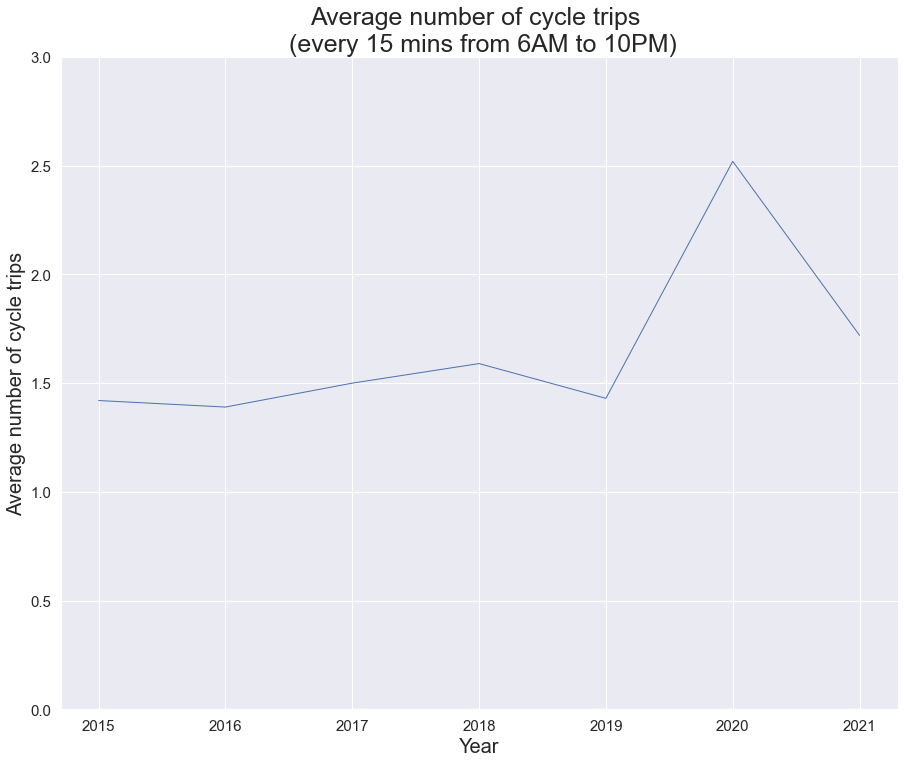

In [357]:
# Plot annualy average numbers of cycles.
# Create a lineplot.
lineplot_y = sns.lineplot(x='Survey wave (year)', y='Total cycles', 
                           data=year_15mns_OL, 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_y.set_title('Average number of cycle trips \n (every 15 mins from 6AM to 10PM)', 
                      fontdict={'fontsize':25})
lineplot_y.set_xlabel('Year', fontdict={'fontsize':20})
lineplot_y.set_ylabel('Average number of cycle trips', fontdict={'fontsize':20})
plt.ylim(0, 3)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

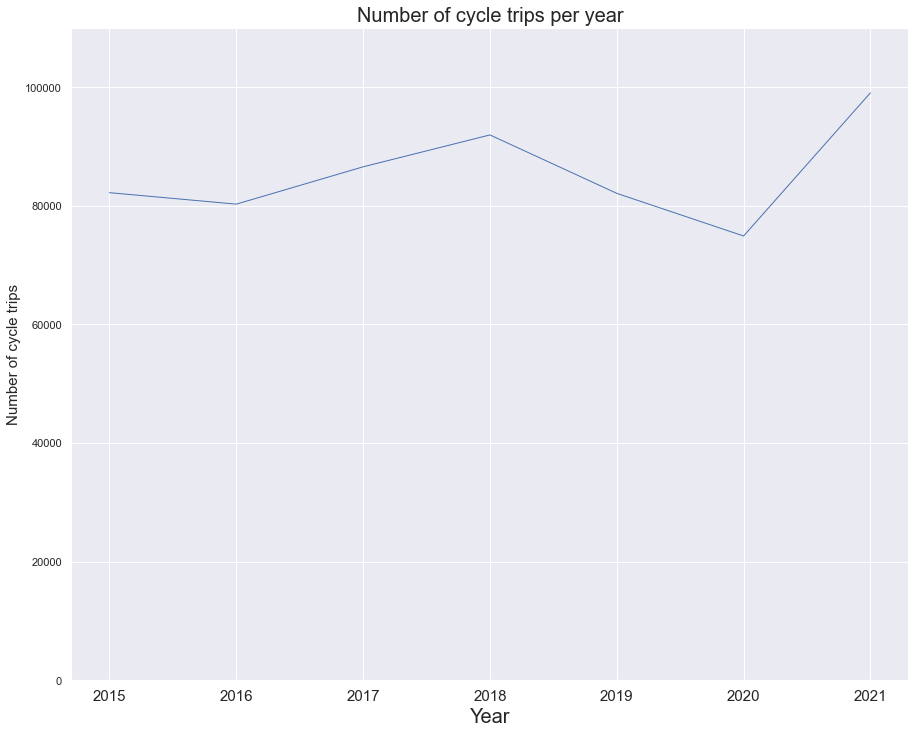

In [358]:
# Plot total numbers of cycle trips by year.
# Create a lineplot.
lineplot_y = sns.lineplot(x='Survey wave (year)', y='Total cycles', 
                           data=year_ttl_OL, 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_y.set_title('Number of cycle trips per year', 
                      fontdict={'fontsize':20})
lineplot_y.set_xlabel('Year', fontdict={'fontsize':20})
lineplot_y.set_ylabel('Number of cycle trips', fontdict={'fontsize':15})
plt.ylim(0, 110000)
plt.xticks(fontsize = 15)

# View plot.
plt.show()

# Low number of observations for 2020-Q2 and 2020-Q4; and no observations for 2021-Q1, therefore the drop from 
# 2019 does not represent the real trend.

See a sharp rise in both the average number of cycle trips and number of cycle trips post pandemic. Further provides evidence that peoples trends have changed and that during the pandemic individuals might have taken up cycling as a way of exercise or travel when they may not have felt comfortable at a gym or on the tube. 

This also leads up to a hypothesis we will explore later as it suggests that maybe when roads were less busy that individuals found time to cycle and felt more comfortable / safer.

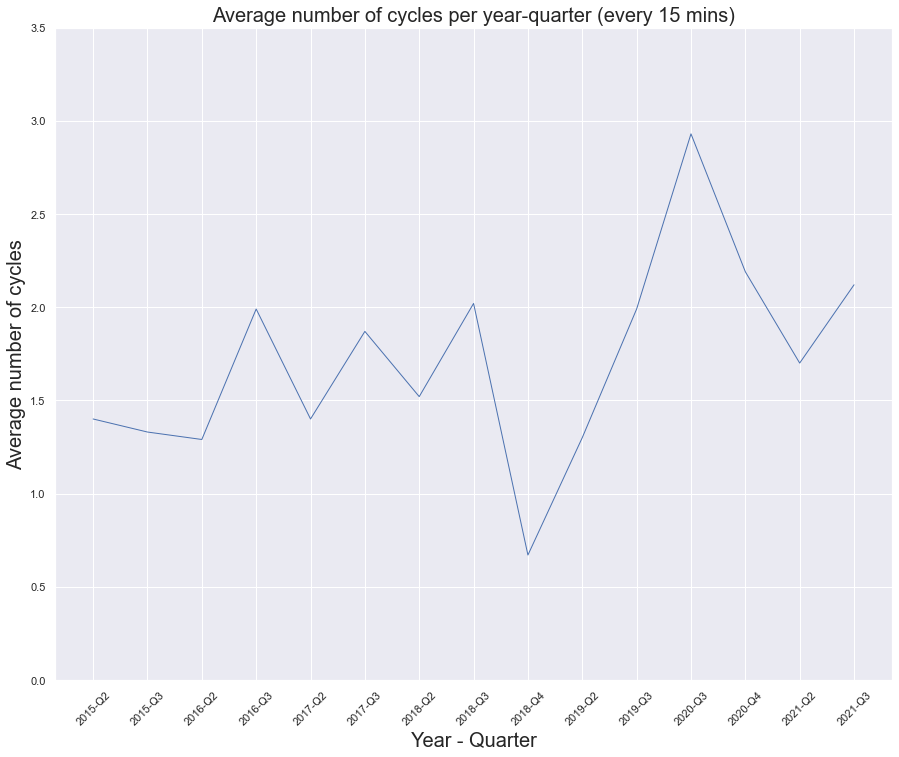

In [359]:
# Remove Unknown quarters.
year_Q_15mns_OL_1 = year_Q_15mns_OL[(year_Q_15mns_OL['Year-Quarter'] != '2015-Unknown') & 
                                    (year_Q_15mns_OL['Year-Quarter'] != '2016-Unknown') &
                                    (year_Q_15mns_OL['Year-Quarter'] != '2017-Unknown') &
                                    (year_Q_15mns_OL['Year-Quarter'] != '2019-Unknown')]

# Plot annualy (incl quarters) average numbers of cycles.
# Create a lineplot.
lineplot_yq = sns.lineplot(x='Year-Quarter', y='Total cycles', 
                           data=year_Q_15mns_OL_1.sort_values('Year-Quarter', ascending=1), 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_yq.set_title('Average number of cycles per year-quarter (every 15 mins)', 
                      fontdict={'fontsize':20})
lineplot_yq.set_xlabel('Year - Quarter', fontdict={'fontsize':20})
lineplot_yq.set_ylabel('Average number of cycles', fontdict={'fontsize':20})
plt.xticks(rotation=45)
plt.ylim(0, 3.5)

# View plot.
plt.show()

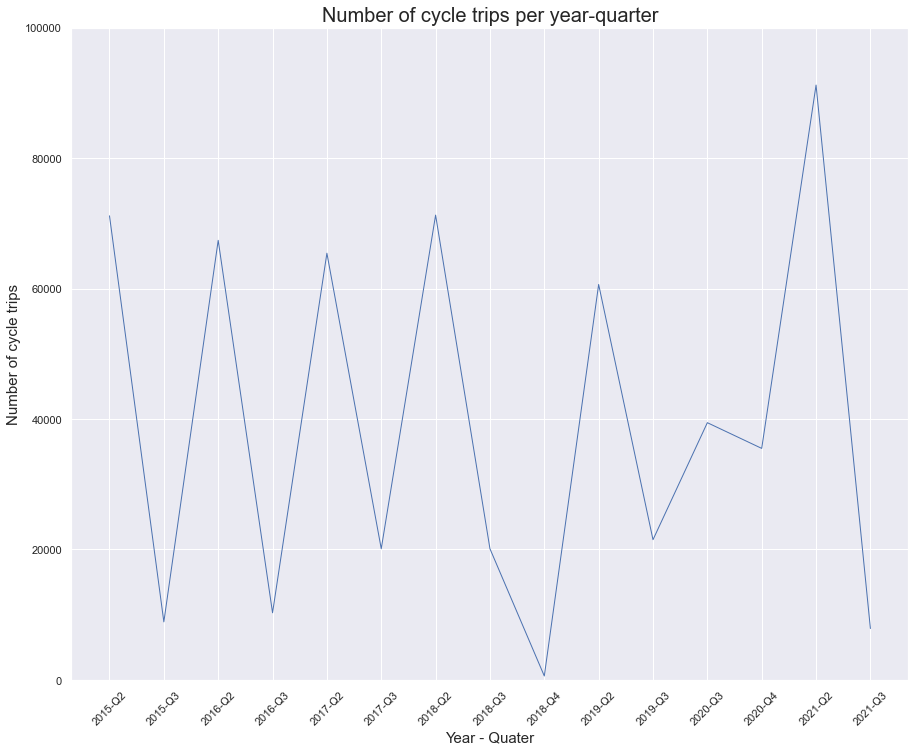

In [360]:
# Remove Unknown quarters.
year_Q_ttl_OL_1 = year_Q_ttl_OL[(year_Q_ttl_OL['Year-Quarter'] != '2015-Unknown') & 
                                (year_Q_ttl_OL['Year-Quarter'] != '2016-Unknown') &
                                (year_Q_ttl_OL['Year-Quarter'] != '2017-Unknown') &
                                (year_Q_ttl_OL['Year-Quarter'] != '2019-Unknown')]

# Plot total number of cycle trips by year-quarter.
# Create a lineplot.
lineplot_yq = sns.lineplot(x='Year-Quarter', y='Total cycles', 
                           data=year_Q_ttl_OL_1.sort_values('Year-Quarter', ascending=1), 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_yq.set_title('Number of cycle trips per year-quarter', 
                      fontdict={'fontsize':20})
lineplot_yq.set_xlabel('Year - Quater', fontdict={'fontsize':15})
lineplot_yq.set_ylabel('Number of cycle trips', fontdict={'fontsize':15})
plt.xticks(rotation=45)
plt.ylim(0, 100000)

# View plot.
plt.show()

It is not possible to explore the annual seasonal tends related to the number of cycle trips because the data is mainly present for April-July. Nevertheless, an upward trend between April and July 2021 was observed (similar to April-July 2017); during this period only in April 2021 the average number of cycle trips was below any another year (2018).

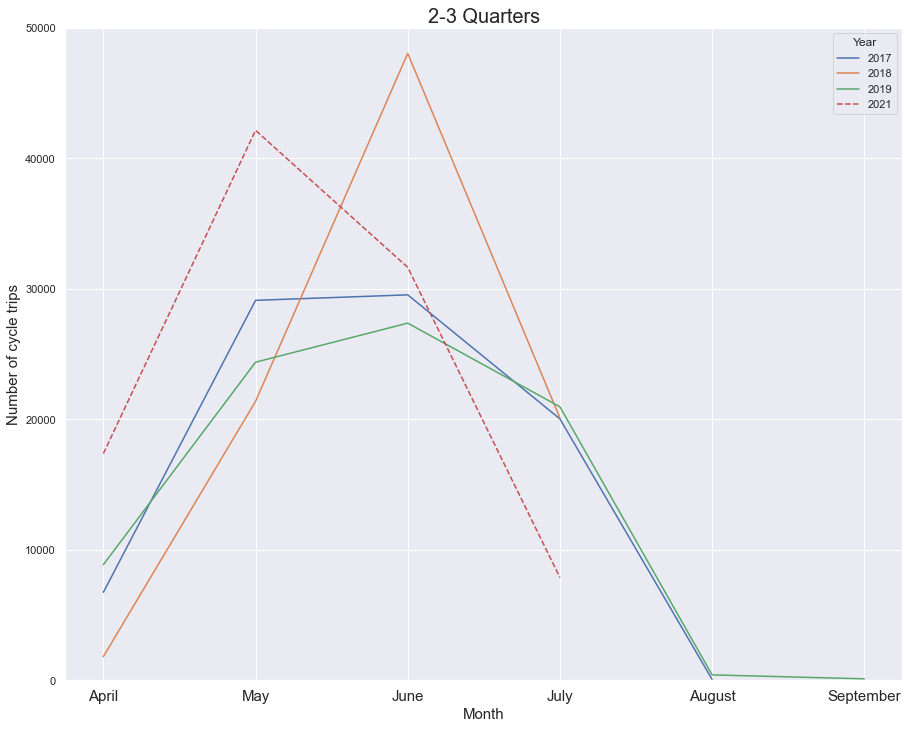

In [361]:
# Import CategoricalDtype.
from pandas.api.types import CategoricalDtype

# Compare 2&3 Qs from: 2017 (before London Mayor's Transport Strategy (March 2018) - 384 dates are missing = 0.7% 
# of entries related to 2017); 2018 (pre-COVID pandemic); 2019 (no lockdowns in London) - 16 dates are missing = 
# 0.03% of entries related to 2019); and 2021 (no lockdowns in London). 2020-Q2 is not included in the data set.

# Restrictions related to COVID pansemic:
# 12 April 2021: Non-essential retail, hairdressers, public buildings (e.g. libraries and museums) reopen. Outdoor 
# venues, including pubs and restaurants, zoos and theme parks also open, as well as indoor leisure (e.g. gyms).
# Self-contained holiday accommodation opens.

# 17 May 2021: Limit of 30 people allowed to mix outdoors. ‘Rule of six’ or two households allowed for indoor 
# social gatherings. Indoor venues were reopen, including pubs, restaurants, cinemas. Up to 10,000 spectators can 
# attend the very largest outdoor-seated venues like football stadiums.

# 14 June 2021: last restrictions were kept in place for another four weeks, until 19 July, as the government 
# accelerated the vaccination programme.

# 19 July 2021: Most legal limits on social contact related to COVID pandemic removed; closed sectors of the 
# economy reopened (e.g. nightclubs).

# Select relevant rows.
Q2_Q3_2017_OL = london_outer[(london_outer['Year-Quarter'] == '2017-Q2') | 
                           (london_outer['Year-Quarter'] == '2017-Q3')]

Q2_Q3_2018_OL = london_outer[(london_outer['Year-Quarter'] == '2018-Q2') | 
                           (london_outer['Year-Quarter'] == '2018-Q3')]

Q2_Q3_2019_OL = london_outer[(london_outer['Year-Quarter'] == '2019-Q2') | 
                           (london_outer['Year-Quarter'] == '2019-Q3')]

Q2_Q3_2021_OL = london_outer[(london_outer['Year-Quarter'] == '2021-Q2') | 
                           (london_outer['Year-Quarter'] == '2021-Q3')]

# Group number of cycle trips by month within each DataFrame.
Q2_Q3_2017_month_OL = Q2_Q3_2017_OL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

Q2_Q3_2018_month_OL = Q2_Q3_2018_OL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

Q2_Q3_2019_month_OL = Q2_Q3_2019_OL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

Q2_Q3_2021_month_OL = Q2_Q3_2021_OL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

# Set month order.
cat_month_Q2_Q3 = CategoricalDtype(['April', 'May', 'June', 'July', 'August', 'September'], ordered=True)

# Sort months in the calendar order.
Q2_Q3_2017_month_OL['Month'] = Q2_Q3_2017_month_OL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2017_month_OL = Q2_Q3_2017_month_OL.sort_values('Month').reset_index(drop=True)

Q2_Q3_2018_month_OL['Month'] = Q2_Q3_2018_month_OL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2018_month_OL = Q2_Q3_2018_month_OL.sort_values('Month').reset_index(drop=True)

Q2_Q3_2019_month_OL['Month'] = Q2_Q3_2019_month_OL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2019_month_OL = Q2_Q3_2019_month_OL.sort_values('Month').reset_index(drop=True)

Q2_Q3_2021_month_OL['Month'] = Q2_Q3_2021_month_OL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2021_month_OL = Q2_Q3_2021_month_OL.sort_values('Month').reset_index(drop=True)

# Create plot.
plt.plot('Month', 'Total cycles', data=Q2_Q3_2017_month_OL, label = '2017')
plt.plot('Month', 'Total cycles', data=Q2_Q3_2018_month_OL, label = '2018')
plt.plot('Month', 'Total cycles', data=Q2_Q3_2019_month_OL, label = '2019')
plt.plot('Month', 'Total cycles', data=Q2_Q3_2021_month_OL, label = '2021', linestyle = '--')
plt.legend(title='Year')
plt.xlabel('Month', size=15)
plt.ylabel('Number of cycle trips', size=15)
plt.ylim(0, 50000)
plt.title('2-3 Quarters', fontdict={'fontsize':20})
plt.xticks(fontsize = 15)

# View plot.
plt.show()

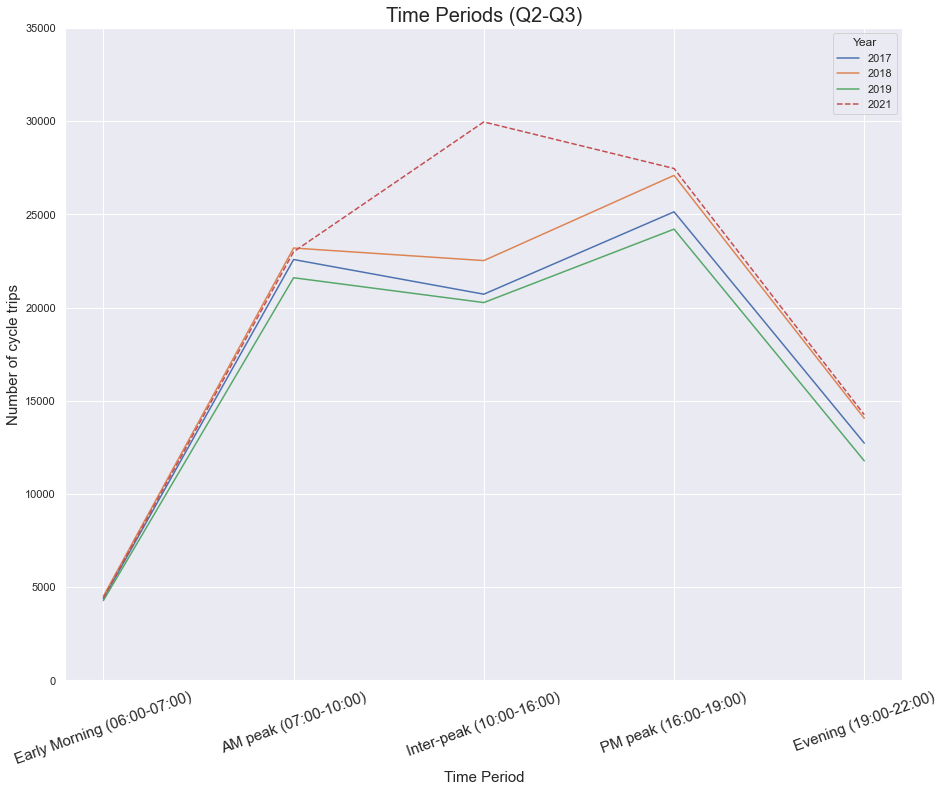

In [362]:
# Group number of cycle trips by time period within each DataFrame.
Q2_Q3_2017_period_OL = Q2_Q3_2017_OL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2018_period_OL = Q2_Q3_2018_OL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2019_period_OL = Q2_Q3_2019_OL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2021_period_OL = Q2_Q3_2021_OL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

# Set time period order.
cat_period_Q2_Q3 = CategoricalDtype(['Early Morning (06:00-07:00)', 'AM peak (07:00-10:00)', 'Inter-peak (10:00-16:00)', 
                                     'PM peak (16:00-19:00)', 'Evening (19:00-22:00)'], ordered=True)

# Sort periods in the time order.
Q2_Q3_2017_period_OL['Period'] = Q2_Q3_2017_period_OL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2017_period_OL = Q2_Q3_2017_period_OL.sort_values('Period').reset_index(drop=True)

Q2_Q3_2018_period_OL['Period'] = Q2_Q3_2018_period_OL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2018_period_OL = Q2_Q3_2018_period_OL.sort_values('Period').reset_index(drop=True)

Q2_Q3_2019_period_OL['Period'] = Q2_Q3_2019_period_OL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2019_period_OL = Q2_Q3_2019_period_OL.sort_values('Period').reset_index(drop=True)

Q2_Q3_2021_period_OL['Period'] = Q2_Q3_2021_period_OL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2021_period_OL = Q2_Q3_2021_period_OL.sort_values('Period').reset_index(drop=True)

# Create plot.
plt.plot('Period', 'Total cycles', data=Q2_Q3_2017_period_OL, label = '2017')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2018_period_OL, label = '2018')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2019_period_OL, label = '2019')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2021_period_OL, label = '2021', linestyle = '--')
plt.legend(title='Year')
plt.xlabel('Time Period', size=15)
plt.ylabel('Number of cycle trips', size=15)
plt.ylim(0, 35000)
plt.title('Time Periods (Q2-Q3)', fontdict={'fontsize':20})
plt.xticks(fontsize = 15, rotation=20)

# View plot.
plt.show()

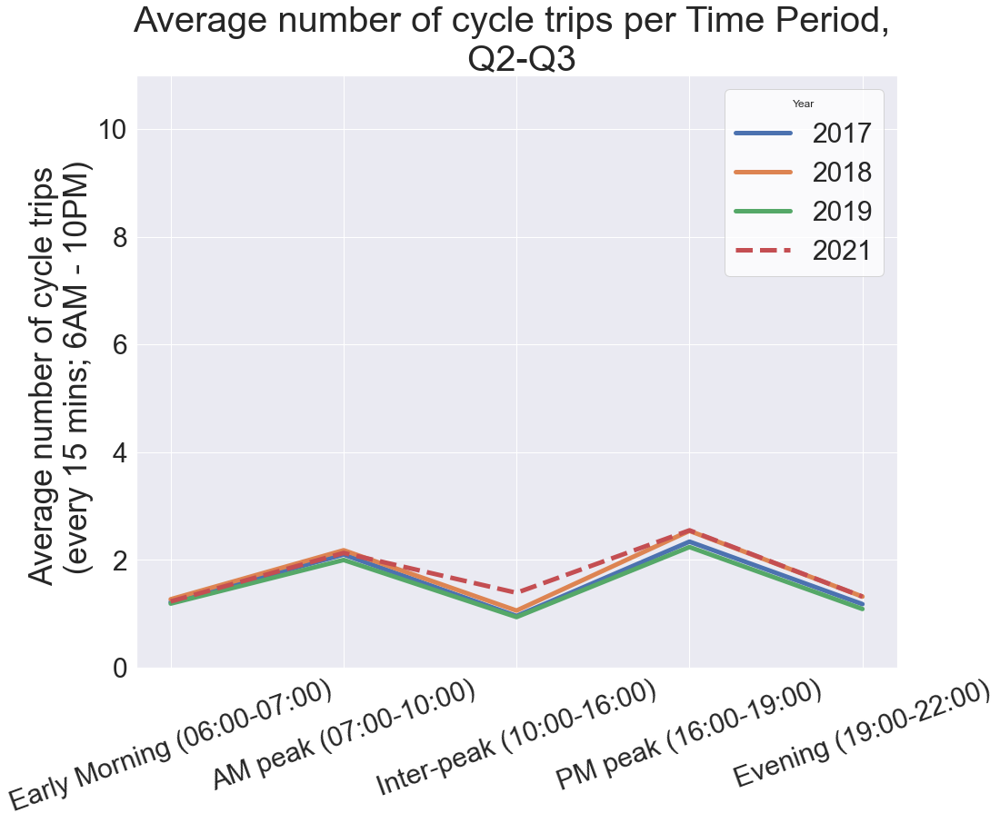

In [363]:
# Average values.
# Group number of cycle trips by time period within each DataFrame.
Q2_Q3_2017_period_OL_avg = Q2_Q3_2017_OL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2018_period_OL_avg = Q2_Q3_2018_OL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2019_period_OL_avg = Q2_Q3_2019_OL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2021_period_OL_avg = Q2_Q3_2021_OL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

# Sort periods in the time order.
Q2_Q3_2017_period_OL_avg['Period'] = Q2_Q3_2017_period_OL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2017_period_OL_avg = Q2_Q3_2017_period_OL_avg.sort_values('Period').reset_index(drop=True)

Q2_Q3_2018_period_OL_avg['Period'] = Q2_Q3_2018_period_OL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2018_period_OL_avg = Q2_Q3_2018_period_OL_avg.sort_values('Period').reset_index(drop=True)

Q2_Q3_2019_period_OL_avg['Period'] = Q2_Q3_2019_period_OL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2019_period_OL_avg = Q2_Q3_2019_period_OL_avg.sort_values('Period').reset_index(drop=True)

Q2_Q3_2021_period_OL_avg['Period'] = Q2_Q3_2021_period_OL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2021_period_OL_avg = Q2_Q3_2021_period_OL_avg.sort_values('Period').reset_index(drop=True)

# Create plot.
plt.plot('Period', 'Total cycles', data=Q2_Q3_2017_period_OL_avg, linewidth=5, label = '2017')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2018_period_OL_avg, linewidth=5, label = '2018')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2019_period_OL_avg, linewidth=5, label = '2019')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2021_period_OL_avg, linewidth=5, label = '2021', linestyle = '--')
plt.legend(fontsize = 30, facecolor='white', title='Year')
plt.ylabel('Time Period', size=35)
plt.ylabel('Average number of cycle trips \n (every 15 mins; 6AM - 10PM)', size=35)
plt.ylim(0, 11)
plt.title('Average number of cycle trips per Time Period, \n Q2-Q3', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30, rotation=20)
plt.yticks(fontsize = 30)

# View plot.
plt.show()

Observations:

2020 is excluded due to the effects of the pandemic. 

In 2021 we have seen an increase in the number of trips made at inter peak time compared to previous years. Suggests that individuals might be cycling more for leisure at this time as opposed to travelling to and from work during the AM and PM peak hours. This could be due to a change in working environment for people who are now WFH or hybrid working. 

## Inner London

### Insights and observations related to Date and Time

In [364]:
# What year has the largest number of records?
london_inner['Survey wave (year)'].value_counts()

2015    76416
2016    76416
2017    76416
2018    76416
2019    76416
2021    76323
2020    50304
Name: Survey wave (year), dtype: int64

In [365]:
# Total number of cycle trips per calendar year.
year_ttl_IL = london_inner.groupby('Year')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0)

# View DataFrame.
year_ttl_IL

,Year,Total cycles
6,2021,476438
3,2018,461087
2,2017,450467
0,2015,449955
4,2019,446198
1,2016,441594
5,2020,429418


In [366]:
# What year has the highest average number of cycles (every 15 mins)?
year_15mns_IL = london_inner.groupby('Year')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0)

# View DataFrame.
year_15mns_IL

,Year,Total cycles
5,2020,8.54
6,2021,6.24
3,2018,6.01
0,2015,5.89
2,2017,5.89
4,2019,5.86
1,2016,5.79


In [367]:
# What quater has the largest number of records?
london_inner['Quarter'].value_counts()

Q2         370607
Q3         110652
Q4          24606
Unknown      2752
Q1             90
Name: Quarter, dtype: int64

In [368]:
# Total number of cycle trips per calendar quater.
Q_ttl_IL = london_inner.groupby('Quarter')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
Q_ttl_IL

,Quarter,Total cycles
0,Q2,2182805
1,Q3,753101
2,Q4,205062
3,Unknown,14076
4,Q1,113


In [369]:
# What quater has the highest average number of cycles (every 15 mins)?
Q_15mns_IL = london_inner.groupby('Quarter')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
Q_15mns_IL

,Quarter,Total cycles
0,Q4,8.33
1,Q3,6.81
2,Q2,5.89
3,Unknown,5.11
4,Q1,1.26


In [370]:
# Top 10 dates with the highest number of cycle trips?
date_ttl_IL = london_inner.groupby('Date')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
date_ttl_IL.head(10)

,Date,Total cycles
0,2020-09-10,27496
1,2021-04-22,24359
2,2020-09-15,24021
3,2020-10-08,23464
4,2020-09-24,21671
5,2020-10-20,21432
6,2021-05-27,21121
7,2020-09-22,20159
8,2017-05-08,19759
9,2020-09-16,19716


In [371]:
# Top 10 dates with the highest average number of cycles (every 15 mins)?
date_15mns_IL = london_inner.groupby('Date')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
date_15mns_IL.head(10)

,Date,Total cycles
0,2021-04-14,18.94
1,2019-05-25,15.84
2,2021-04-26,15.54
3,2020-11-04,14.08
4,2020-11-03,13.67
5,2020-10-23,12.71
6,2021-04-27,11.87
7,2020-09-10,11.61
8,2016-06-15,11.52
9,2020-10-07,11.43


In [372]:
# Combine year and quarter in one column and divide by '-'.
london_inner['Year-Quarter'] = london_inner['Year'].astype(str) + '-' + london_inner['Quarter'].astype(str)
london_inner.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Year-Quarter
0,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2015-05-20,Wednesday,2015,May,Q2,2015-Q2
1,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2,2015-Q2
2,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,2,0,2,2015-05-20,Wednesday,2015,May,Q2,2015-Q2
3,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2,2015-Q2
4,2015,INNCY001,Grove Road,"mer, 20/05/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,4,0,4,2015-05-20,Wednesday,2015,May,Q2,2015-Q2


In [373]:
# Total number of cycle trips per Year-Quarter.
year_Q_ttl_IL = london_inner.groupby('Year-Quarter')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).\
reset_index(drop=True)

# View DataFrame (top 10).
year_Q_ttl_IL.head(10)

,Year-Quarter,Total cycles
0,2021-Q2,410200
1,2016-Q2,383730
2,2015-Q2,379106
3,2018-Q2,360054
4,2017-Q2,339206
5,2019-Q2,310509
6,2020-Q3,226178
7,2020-Q4,203240
8,2019-Q3,135330
9,2017-Q3,102789


In [374]:
# What year & Q has the highest average number of cycles (every 15 mins)?
year_Q_15mns_IL = london_inner.groupby('Year-Quarter')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).\
reset_index(drop=True)

# View DataFrame (top 10).
year_Q_15mns_IL.head(10)

,Year-Quarter,Total cycles
0,2020-Q3,8.67
1,2020-Q4,8.39
2,2018-Q3,7.08
3,2019-Q3,6.76
4,2017-Unknown,6.62
5,2021-Q2,6.37
6,2017-Q3,6.06
7,2015-Q2,5.96
8,2016-Q3,5.85
9,2017-Q2,5.82


In [375]:
# Check which quarters are missing.
london_inner['Year-Quarter'].value_counts().sort_index()

# Missing/unknown: 
# 2015: Q1, Q4 + fewer values for Q3; 
# 2016: Q1, Q4 + fewer values for Q3; 
# 2017: Q1, Q4 + fewer values for Q3; 
# 2018: very few values for Q1 and Q4 + fewer values for Q3;
# 2019: very few values for Q1 and Q4 + fewer values for Q3; 
# 2020: Q1, Q2;
# 2021: Q1, Q4 + fewer values for Q3.

2015-Q2         63652
2015-Q3         12380
2015-Unknown      384
2016-Q2         66320
2016-Q3          9712
2016-Unknown      256
2017-Q2         58298
2017-Q3         16966
2017-Unknown     1280
2018-Q1            24
2018-Q2         62008
2018-Q3         13616
2018-Q4           384
2018-Unknown      640
2019-Q1            66
2019-Q2         55892
2019-Q3         20010
2019-Unknown      192
2020-Q3         26082
2020-Q4         24222
2021-Q2         64437
2021-Q3         11886
Name: Year-Quarter, dtype: int64

In [376]:
# Total number of cycle trips per time period.
period_ttl_IL = london_inner.groupby('Period')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
period_ttl_IL

,Period,Total cycles
0,PM peak (16:00-19:00),929809
1,AM peak (07:00-10:00),924129
2,Inter-peak (10:00-16:00),685293
3,Evening (19:00-22:00),518241
4,Early Morning (06:00-07:00),97685


In [377]:
# What time period has the highest average number of cycles (every 15 mins)?
period_15mns_IL = london_inner.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
period_15mns_IL

,Period,Total cycles
0,PM peak (16:00-19:00),9.75
1,AM peak (07:00-10:00),9.69
2,Evening (19:00-22:00),5.44
3,Inter-peak (10:00-16:00),3.59
4,Early Morning (06:00-07:00),3.07


In [378]:
# View number of entries per time period per year.
Period_year_IL = london_inner.groupby(['Period', 'Year']).agg({'Total cycles':'count'}).reset_index()
Period_year_IL.head()

,Period,Year,Total cycles
0,AM peak (07:00-10:00),2015,14328
1,AM peak (07:00-10:00),2016,14304
2,AM peak (07:00-10:00),2017,14352
3,AM peak (07:00-10:00),2018,14376
4,AM peak (07:00-10:00),2019,14280


In [379]:
# View average number of entries per time period per year (every 15 mins).
Period_year_IL_mean = london_inner.groupby(['Period', 'Year']).agg({'Total cycles':'mean'}).reset_index()
Period_year_IL_mean.head()

,Period,Year,Total cycles
0,AM peak (07:00-10:00),2015,9.947864
1,AM peak (07:00-10:00),2016,9.561102
2,AM peak (07:00-10:00),2017,9.847269
3,AM peak (07:00-10:00),2018,9.998261
4,AM peak (07:00-10:00),2019,9.835924


In [380]:
# Total number of cycle trips per time slot.
time_ttl_IL = london_inner.groupby('Time')\
[['Total cycles']].sum().reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
time_ttl_IL

,Time,Total cycles
0,0830 - 0845,109043
1,1815 - 1830,108835
2,0815 - 0830,106945
3,1800 - 1815,103984
4,1830 - 1845,102543
...,...,...
59,1100 - 1115,24369
60,2130 - 2145,23833
61,2145 - 2200,21461
62,0615 - 0630,19398


In [381]:
# What time slot has the highest average number of cycles (every 15 mins)?
time_15mns_IL = london_inner.groupby('Time')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0).reset_index(drop=True)

# View DataFrame.
time_15mns_IL

,Time,Total cycles
0,0830 - 0845,13.71
1,1815 - 1830,13.69
2,0815 - 0830,13.45
3,1800 - 1815,13.08
4,1830 - 1845,12.90
...,...,...
59,1100 - 1115,3.06
60,2130 - 2145,3.01
61,2145 - 2200,2.71
62,0615 - 0630,2.44


In [382]:
# What time slot has the highest number of cycle hire bikes (every 15 mins)?
time_hb_ttl_IL = london_inner.groupby('Time')\
[['Number of cycle hire bikes']].sum().round(2).reset_index().sort_values('Number of cycle hire bikes', 
                                                                           ascending=0).reset_index(drop=True)

# View DataFrame.
time_hb_ttl_IL

,Time,Number of cycle hire bikes
0,1815 - 1830,4553
1,1800 - 1815,4297
2,1830 - 1845,4141
3,1745 - 1800,4076
4,0830 - 0845,3906
...,...,...
59,2130 - 2145,989
60,2145 - 2200,900
61,0630 - 0645,828
62,0615 - 0630,499


In [383]:
# What time slot has the highest average number of cycle hire bikes (every 15 mins)?
time_hb_15mns_IL = london_inner.groupby('Time')\
[['Number of cycle hire bikes']].mean().round(2).reset_index().sort_values('Number of cycle hire bikes', 
                                                                           ascending=0).reset_index(drop=True)

# View DataFrame.
time_hb_15mns_IL

,Time,Number of cycle hire bikes
0,1815 - 1830,0.57
1,1800 - 1815,0.54
2,1830 - 1845,0.52
3,1745 - 1800,0.51
4,0830 - 0845,0.49
...,...,...
59,2130 - 2145,0.12
60,2145 - 2200,0.11
61,0630 - 0645,0.10
62,0615 - 0630,0.06


In [384]:
# What day of the week has the highest number of cycle trips?
time_wd_ttl_IL = london_inner.groupby('Day')\
[['Total cycles']].sum().round(2).reset_index().reset_index(drop=True)

# Sort days of the week in order.
time_wd_ttl_IL = time_wd_ttl_IL.set_index('Day')

time_wd_ttl_IL = time_wd_ttl_IL.reindex(index = order)
time_wd_ttl_IL = time_wd_ttl_IL.reset_index()

# View DataFrame.
time_wd_ttl_IL

,Day,Total cycles
0,Monday,529848
1,Tuesday,773329
2,Wednesday,775228
3,Thursday,670474
4,Friday,390735
5,Saturday,836
6,Sunday,631


In [385]:
# What day of the week has the highest average number of cycle trips (per 15 mins)?
time_wd_15mns_IL = london_inner.groupby('Day')\
[['Total cycles']].mean().round(2).reset_index().reset_index(drop=True)

# Sort days of the week in order.
time_wd_15mns_IL = time_wd_15mns_IL.set_index('Day')

time_wd_15mns_IL = time_wd_15mns_IL.reindex(index = order)
time_wd_15mns_IL = time_wd_15mns_IL.reset_index()

# View DataFrame.
time_wd_15mns_IL

,Day,Total cycles
0,Monday,6.45
1,Tuesday,6.51
2,Wednesday,6.17
3,Thursday,6.35
4,Friday,5.33
5,Saturday,3.91
6,Sunday,2.39


In [386]:
# View number of entries per day of the week per year.
WD_year_IL = london_inner.groupby(['Day', 'Year']).agg({'Total cycles':'count'}).reset_index()
WD_year_IL.head()

,Day,Year,Total cycles
0,Friday,2015,10772
1,Friday,2016,10362
2,Friday,2017,10852
3,Friday,2018,10722
4,Friday,2019,10378


## Visualisations related to Date and Time for Inner London

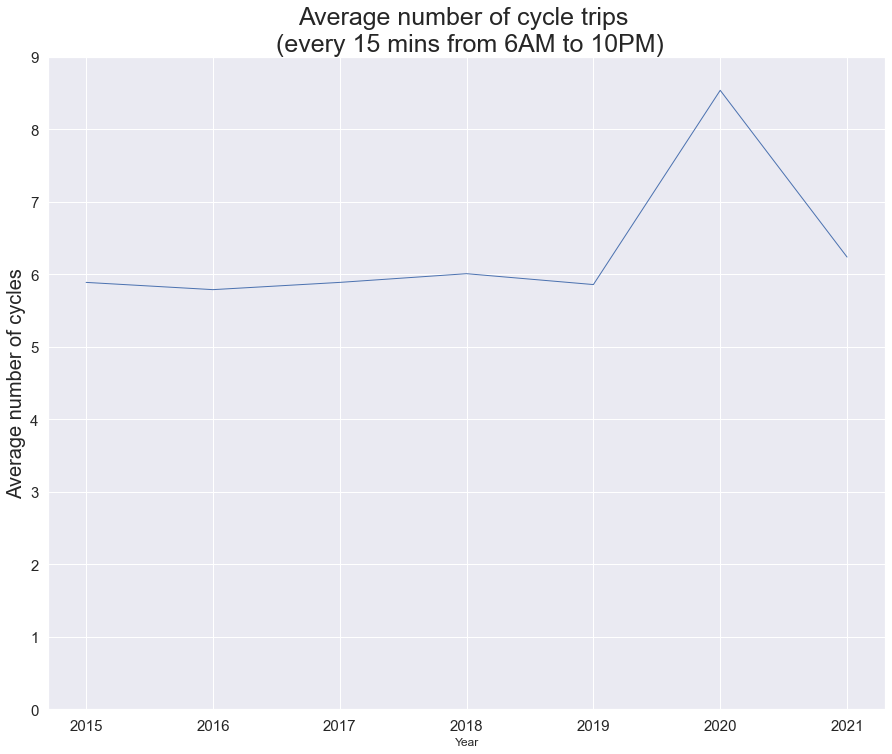

In [387]:
# Plot annualy average numbers of cycles.
# Create a lineplot.
lineplot_y = sns.lineplot(x='Year', y='Total cycles', 
                           data=year_15mns_IL, 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_y.set_title('Average number of cycle trips \n (every 15 mins from 6AM to 10PM)', 
                      fontdict={'fontsize':25})
lineplot_y.set_xlabel('Year')
lineplot_y.set_ylabel('Average number of cycles', fontdict={'fontsize':20})
plt.ylim(0, 9)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

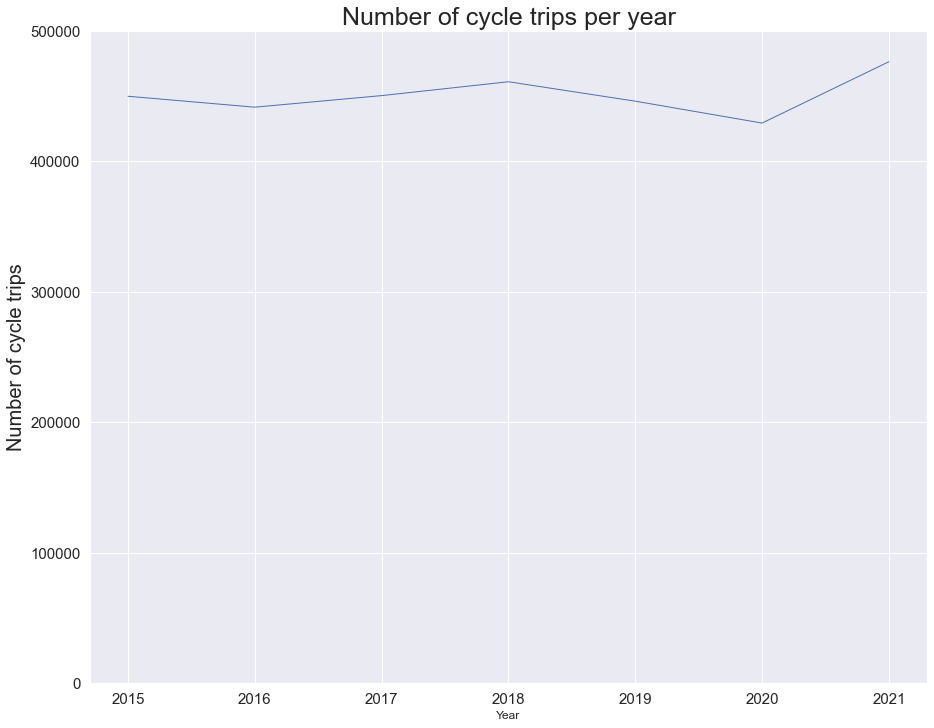

In [388]:
# Plot total numbers of cycle trips by year.
# Create a lineplot.
lineplot_y = sns.lineplot(x='Year', y='Total cycles', 
                           data=year_ttl_IL, 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_y.set_title('Number of cycle trips per year', 
                      fontdict={'fontsize':25})
lineplot_y.set_xlabel('Year')
lineplot_y.set_ylabel('Number of cycle trips', fontdict={'fontsize':20})
plt.ylim(0, 500000)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

# Low number of observations for 2020-Q2 and 2020-Q4; and no observations for 2021-Q1, therefore the drop from 
# 2019 does not represent the real trend.

Further backs up our findings from outer london around the presumption in change of trends and attitudes. 

It is positive to see that cycling numbers are on the rise already for inner and outer london.

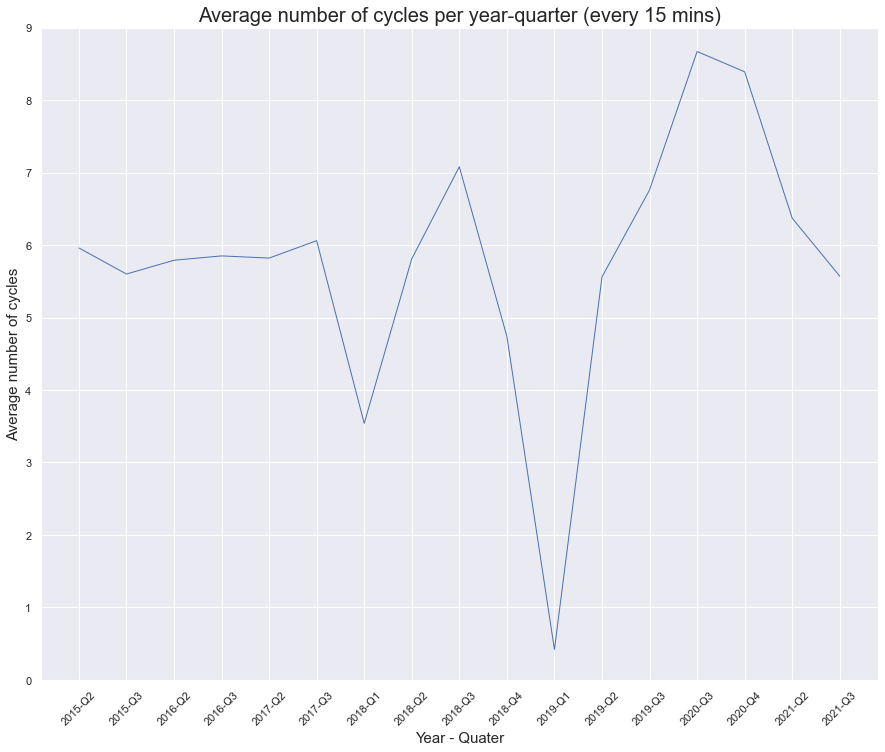

In [389]:
# Remove Unknown quarters.
year_Q_15mns_IL_1 = year_Q_15mns_IL[(year_Q_15mns_IL['Year-Quarter'] != '2015-Unknown') & 
                                    (year_Q_15mns_IL['Year-Quarter'] != '2016-Unknown') &
                                    (year_Q_15mns_IL['Year-Quarter'] != '2017-Unknown') &
                                    (year_Q_15mns_IL['Year-Quarter'] != '2018-Unknown') &
                                    (year_Q_15mns_IL['Year-Quarter'] != '2019-Unknown')]

# Plot annualy (incl quarters) average numbers of cycles.
# Create a lineplot.
lineplot_yq = sns.lineplot(x='Year-Quarter', y='Total cycles', 
                           data=year_Q_15mns_IL_1.sort_values('Year-Quarter', ascending=1), 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_yq.set_title('Average number of cycles per year-quarter (every 15 mins)', 
                      fontdict={'fontsize':20})
lineplot_yq.set_xlabel('Year - Quater', fontdict={'fontsize':15})
lineplot_yq.set_ylabel('Average number of cycles', fontdict={'fontsize':15})
plt.xticks(rotation=45)
plt.ylim(0, 9)

# View plot.
plt.show()

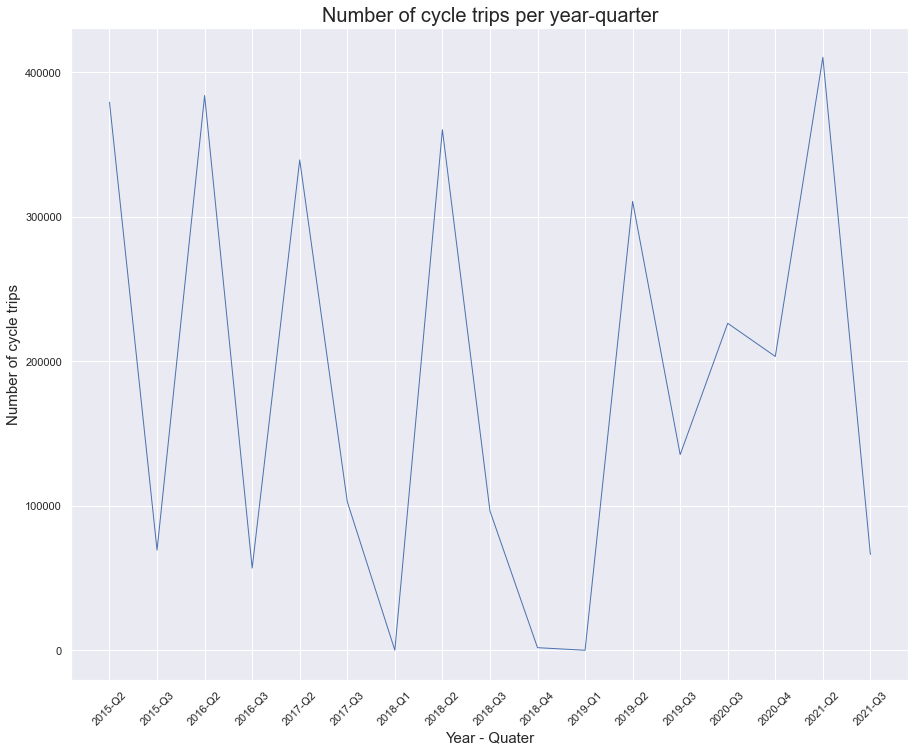

In [390]:
# Remove Unknown quarters.
year_Q_ttl_IL_1 = year_Q_ttl_IL[(year_Q_ttl_IL['Year-Quarter'] != '2015-Unknown') & 
                                (year_Q_ttl_IL['Year-Quarter'] != '2016-Unknown') &
                                (year_Q_ttl_IL['Year-Quarter'] != '2017-Unknown') &
                                (year_Q_ttl_IL['Year-Quarter'] != '2018-Unknown') &
                                (year_Q_ttl_IL['Year-Quarter'] != '2019-Unknown')]

# Plot total number of cycle trips by year-quarter.
# Create a lineplot.
lineplot_yq = sns.lineplot(x='Year-Quarter', y='Total cycles', 
                           data=year_Q_ttl_IL_1.sort_values('Year-Quarter', ascending=1), 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_yq.set_title('Number of cycle trips per year-quarter', 
                      fontdict={'fontsize':20})
lineplot_yq.set_xlabel('Year - Quater', fontdict={'fontsize':15})
lineplot_yq.set_ylabel('Number of cycle trips', fontdict={'fontsize':15})
plt.xticks(rotation=45)


# View plot.
plt.show()

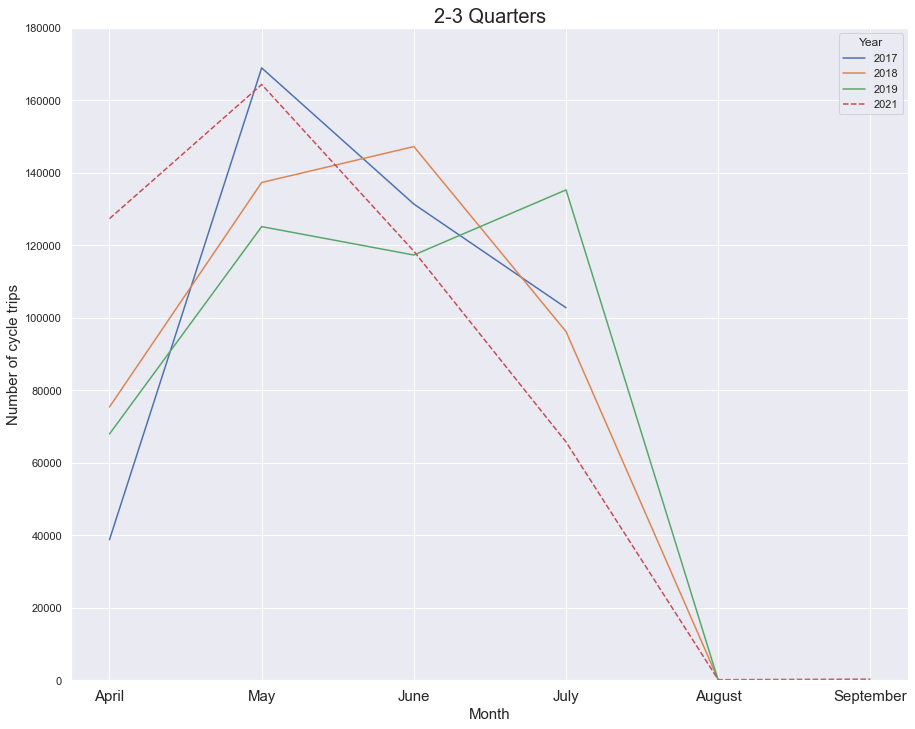

In [391]:
# Compare 2&3 Qs from: 2017 (before London Mayor's Transport Strategy (March 2018) - 1280 dates are missing = 1.7% 
# of entries related to 2017); 2018 (pre-COVID pandemic) - 640 dates are missing = 0.8% of entries related to 2018; 
# 2019 (no lockdowns in London) - 192 dates are missing = 0.3% of entries related to 2019); and 2021 (no lockdowns 
# in London). 2020-Q2 is not included in the data set.

# Restrictions related to COVID pansemic:
# 12 April 2021: Non-essential retail, hairdressers, public buildings (e.g. libraries and museums) reopen. Outdoor 
# venues, including pubs and restaurants, zoos and theme parks also open, as well as indoor leisure (e.g. gyms).
# Self-contained holiday accommodation opens.

# 17 May 2021: Limit of 30 people allowed to mix outdoors. ‘Rule of six’ or two households allowed for indoor 
# social gatherings. Indoor venues were reopen, including pubs, restaurants, cinemas. Up to 10,000 spectators can 
# attend the very largest outdoor-seated venues like football stadiums.

# 14 June 2021: last restrictions were kept in place for another four weeks, until 19 July, as the government 
# accelerated the vaccination programme.

# 19 July 2021: Most legal limits on social contact related to COVID pandemic removed; closed sectors of the 
# economy reopened (e.g. nightclubs).

# Select relevant rows.
Q2_Q3_2017_IL = london_inner[(london_inner['Year-Quarter'] == '2017-Q2') | 
                           (london_inner['Year-Quarter'] == '2017-Q3')]

Q2_Q3_2018_IL = london_inner[(london_inner['Year-Quarter'] == '2018-Q2') | 
                           (london_inner['Year-Quarter'] == '2018-Q3')]

Q2_Q3_2019_IL = london_inner[(london_inner['Year-Quarter'] == '2019-Q2') | 
                           (london_inner['Year-Quarter'] == '2019-Q3')]

Q2_Q3_2021_IL = london_inner[(london_inner['Year-Quarter'] == '2021-Q2') | 
                           (london_inner['Year-Quarter'] == '2021-Q3')]

# Group number of cycle trips by month within each DataFrame.
Q2_Q3_2017_month_IL = Q2_Q3_2017_IL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

Q2_Q3_2018_month_IL = Q2_Q3_2018_IL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

Q2_Q3_2019_month_IL = Q2_Q3_2019_IL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

Q2_Q3_2021_month_IL = Q2_Q3_2021_IL.groupby('Month')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Month', ascending=1).reset_index(drop=True)

# Sort months in the calendar order.
Q2_Q3_2017_month_IL['Month'] = Q2_Q3_2017_month_IL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2017_month_IL = Q2_Q3_2017_month_IL.sort_values('Month').reset_index(drop=True)

Q2_Q3_2018_month_IL['Month'] = Q2_Q3_2018_month_IL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2018_month_IL = Q2_Q3_2018_month_IL.sort_values('Month').reset_index(drop=True)

Q2_Q3_2019_month_IL['Month'] = Q2_Q3_2019_month_IL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2019_month_IL = Q2_Q3_2019_month_IL.sort_values('Month').reset_index(drop=True)

Q2_Q3_2021_month_IL['Month'] = Q2_Q3_2021_month_IL['Month'].astype(cat_month_Q2_Q3)
Q2_Q3_2021_month_IL = Q2_Q3_2021_month_IL.sort_values('Month').reset_index(drop=True)

# Create plot.
plt.plot('Month', 'Total cycles', data=Q2_Q3_2017_month_IL, label = '2017')
plt.plot('Month', 'Total cycles', data=Q2_Q3_2018_month_IL, label = '2018')
plt.plot('Month', 'Total cycles', data=Q2_Q3_2019_month_IL, label = '2019')
plt.plot('Month', 'Total cycles', data=Q2_Q3_2021_month_IL, label = '2021', linestyle = '--')
plt.legend(title='Year')
plt.ylabel('Number of cycle trips', size=15)
plt.xlabel('Month', size=15)
plt.ylim(0, 180000)
plt.title('2-3 Quarters', fontdict={'fontsize':20})
plt.xticks(fontsize = 15)

# View plot.
plt.show()

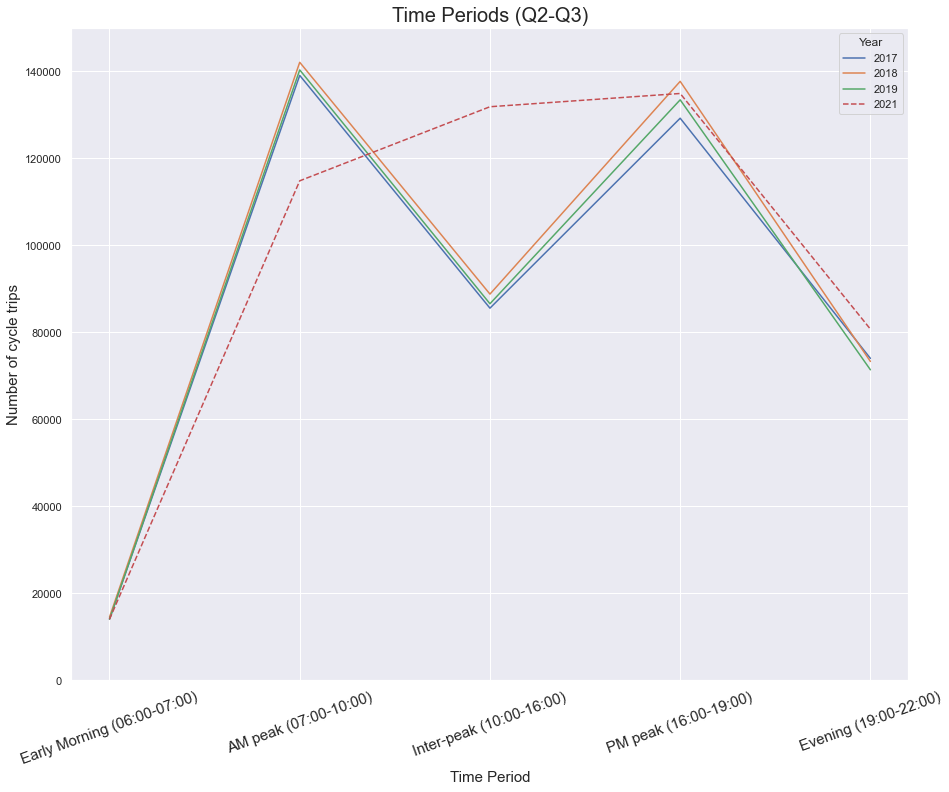

In [392]:
# Group number of cycle trips by time period within each DataFrame.
Q2_Q3_2017_period_IL = Q2_Q3_2017_IL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2018_period_IL = Q2_Q3_2018_IL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2019_period_IL = Q2_Q3_2019_IL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2021_period_IL = Q2_Q3_2021_IL.groupby('Period')\
[['Total cycles']].sum().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

# Sort periods in the time order.
Q2_Q3_2017_period_IL['Period'] = Q2_Q3_2017_period_IL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2017_period_IL = Q2_Q3_2017_period_IL.sort_values('Period').reset_index(drop=True)

Q2_Q3_2018_period_IL['Period'] = Q2_Q3_2018_period_IL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2018_period_IL = Q2_Q3_2018_period_IL.sort_values('Period').reset_index(drop=True)

Q2_Q3_2019_period_IL['Period'] = Q2_Q3_2019_period_IL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2019_period_IL = Q2_Q3_2019_period_IL.sort_values('Period').reset_index(drop=True)

Q2_Q3_2021_period_IL['Period'] = Q2_Q3_2021_period_IL['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2021_period_IL = Q2_Q3_2021_period_IL.sort_values('Period').reset_index(drop=True)

# Create plot.
plt.plot('Period', 'Total cycles', data=Q2_Q3_2017_period_IL, label = '2017')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2018_period_IL, label = '2018')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2019_period_IL, label = '2019')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2021_period_IL, label = '2021', linestyle = '--')
plt.legend(title='Year')
plt.ylabel('Number of cycle trips', size=15)
plt.xlabel('Time Period', size=15)
plt.ylim(0, 150000)
plt.title('Time Periods (Q2-Q3)', fontdict={'fontsize':20})
plt.xticks(fontsize = 15, rotation=20)

# View plot.
plt.show()

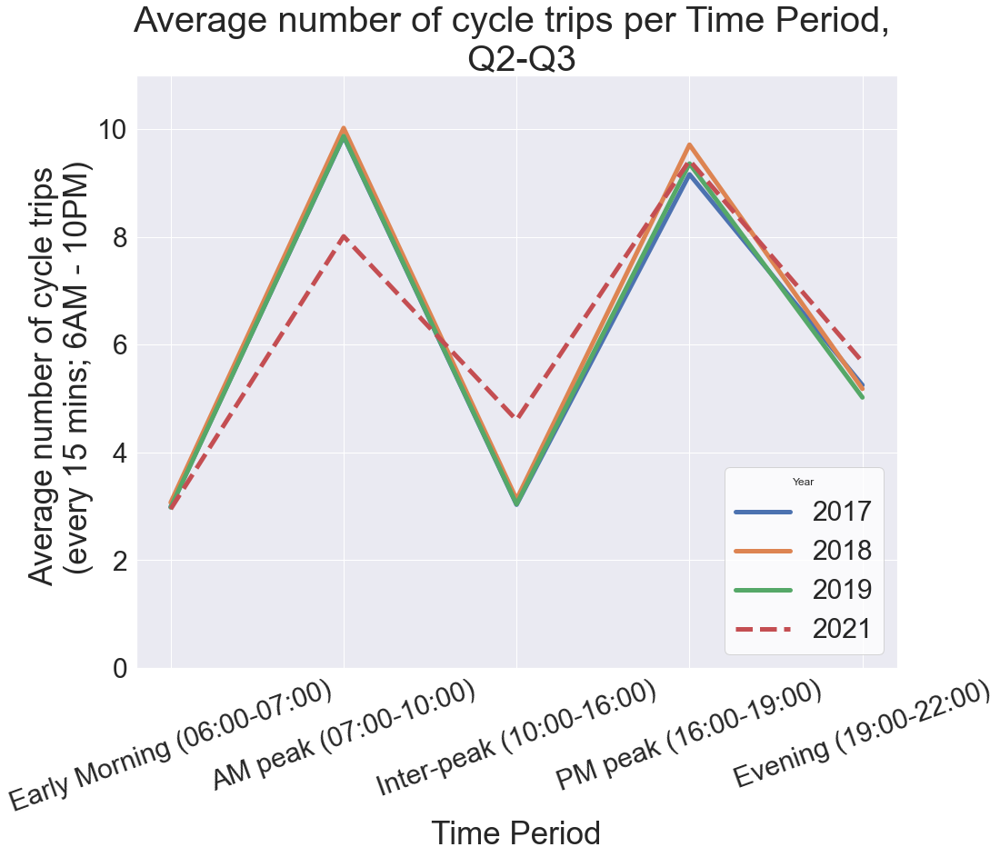

In [393]:
# Average values.
# Group number of cycle trips by time period within each DataFrame.
Q2_Q3_2017_period_IL_avg = Q2_Q3_2017_IL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2018_period_IL_avg = Q2_Q3_2018_IL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2019_period_IL_avg = Q2_Q3_2019_IL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

Q2_Q3_2021_period_IL_avg = Q2_Q3_2021_IL.groupby('Period')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Period', ascending=1).reset_index(drop=True)

# Sort periods in the time order.
Q2_Q3_2017_period_IL_avg['Period'] = Q2_Q3_2017_period_IL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2017_period_IL_avg = Q2_Q3_2017_period_IL_avg.sort_values('Period').reset_index(drop=True)

Q2_Q3_2018_period_IL_avg['Period'] = Q2_Q3_2018_period_IL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2018_period_IL_avg = Q2_Q3_2018_period_IL_avg.sort_values('Period').reset_index(drop=True)

Q2_Q3_2019_period_IL_avg['Period'] = Q2_Q3_2019_period_IL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2019_period_IL_avg = Q2_Q3_2019_period_IL_avg.sort_values('Period').reset_index(drop=True)

Q2_Q3_2021_period_IL_avg['Period'] = Q2_Q3_2021_period_IL_avg['Period'].astype(cat_period_Q2_Q3)
Q2_Q3_2021_period_IL_avg = Q2_Q3_2021_period_IL_avg.sort_values('Period').reset_index(drop=True)

# Create plot.
plt.plot('Period', 'Total cycles', data=Q2_Q3_2017_period_IL_avg, linewidth=5, label = '2017')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2018_period_IL_avg, linewidth=5, label = '2018')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2019_period_IL_avg, linewidth=5, label = '2019')
plt.plot('Period', 'Total cycles', data=Q2_Q3_2021_period_IL_avg, linewidth=5, label = '2021', linestyle = '--')
plt.legend(fontsize = 30, facecolor='white', title='Year')
plt.ylabel('Average number of cycle trips \n (every 15 mins; 6AM - 10PM)', size=35)
plt.xlabel('Time Period', size=35)
plt.ylim(0, 11)
plt.title('Average number of cycle trips per Time Period, \n Q2-Q3', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30, rotation=20)
plt.yticks(fontsize = 30)

# View plot.
plt.show()

Observation: 

Similar to the outer london graph as we see a rise in the inter-peak suggesting that trend that individuals are cycling more for leisure at this time and linking to the WFH / Hybrid working point. 

We also see a rise in the evening line both compared to mornings for 2021 and in comparison to evening lines of the other years. This could hint towards that leisure point and a change in trends. People are more likely going to be meeting friends for a drink and dinner and then might be used to cycling for travel than taking the tube due to change in travelling during the pandemic.

## Hypothesis testing

### 1) Number of cycle trips depends on the population

In [394]:
# Read the provided CSV file/data set.            
Population = pd.read_csv('Population for csv.csv')

# Fill missing values with 0.
Population = Population.fillna(0)

# Covert population columns to integer.
Population['2015'] = Population['2015'].astype(int)
Population['2016'] = Population['2016'].astype(int)
Population['2017'] = Population['2017'].astype(int)
Population['2018'] = Population['2018'].astype(int)
Population['2019'] = Population['2019'].astype(int)
Population['2020'] = Population['2020'].astype(int)
Population['2021'] = Population['2021'].astype(int)

# View DataFrame.
Population.head()

,Borough,Area,2015,2016,2017,2018,2019,2020,2021
0,Camden,Inner,237000,246000,250000,256000,260000,263000,210100
1,City of London,Inner,0,0,0,0,0,0,8600
2,Hackney,Inner,268000,272000,277000,281000,285000,289000,259200
3,Hammersmith and Fulham,Inner,176000,181000,182000,180000,180000,180000,183200
4,Haringey,Inner,270000,275000,278000,276000,279000,281000,264200


In [395]:
# Create subset for Inner London.
Population_IL = Population[Population['Area'] == 'Inner']

# View DataFrame.
Population_IL.head()

,Borough,Area,2015,2016,2017,2018,2019,2020,2021
0,Camden,Inner,237000,246000,250000,256000,260000,263000,210100
1,City of London,Inner,0,0,0,0,0,0,8600
2,Hackney,Inner,268000,272000,277000,281000,285000,289000,259200
3,Hammersmith and Fulham,Inner,176000,181000,182000,180000,180000,180000,183200
4,Haringey,Inner,270000,275000,278000,276000,279000,281000,264200


In [396]:
# View info.
Population_IL.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14 entries, 0 to 13
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Borough  14 non-null     object
 1   Area     14 non-null     object
 2   2015     14 non-null     int64 
 3   2016     14 non-null     int64 
 4   2017     14 non-null     int64 
 5   2018     14 non-null     int64 
 6   2019     14 non-null     int64 
 7   2020     14 non-null     int64 
 8   2021     14 non-null     int64 
dtypes: int64(7), object(2)
memory usage: 1.1+ KB


In [397]:
# Create subset for Outer London.
Population_OL = Population[Population['Area'] == 'Outer']

# View DataFrame.
Population_OL.head()

,Borough,Area,2015,2016,2017,2018,2019,2020,2021
14,Barking and Dagenham,Outer,201000,206000,210000,215000,219000,222000,218900
15,Barnet,Outer,378000,385000,391000,391000,396000,400000,389300
16,Bexley,Outer,242000,244000,247000,249000,251000,254000,246500
17,Brent,Outer,323000,329000,333000,328000,330000,332000,339800
18,Bromley,Outer,322000,326000,330000,332000,335000,338000,330000


In [398]:
# View info.
Population_OL.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19 entries, 14 to 32
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Borough  19 non-null     object
 1   Area     19 non-null     object
 2   2015     19 non-null     int64 
 3   2016     19 non-null     int64 
 4   2017     19 non-null     int64 
 5   2018     19 non-null     int64 
 6   2019     19 non-null     int64 
 7   2020     19 non-null     int64 
 8   2021     19 non-null     int64 
dtypes: int64(7), object(2)
memory usage: 1.5+ KB


## Inner London: Q2 & Q3 from Central London & Original Inner London Data Sets

In [399]:
# Select Q2 and Q3 from Central London data set.
L_centr_fnl_0_Q2_Q3 = L_centr_fnl_0[(L_centr_fnl_0['Quarter'] == 'Q2') | (L_centr_fnl_0['Quarter'] == 'Q3')]

# Exclude 2014.
L_centr_fnl_0_Q2_Q3 = L_centr_fnl_0_Q2_Q3 [L_centr_fnl_0_Q2_Q3['Year'] > 2014]

# Select requested columns.
L_centr_fnl_0_Q2_Q31 = L_centr_fnl_0_Q2_Q3[['Year', 'Total_cycles']].reset_index(drop=True)

# Rename column.
L_centr_fnl_0_Q2_Q31.rename(columns = {'Total_cycles':'Total cycles'}, inplace = True)

In [400]:
# Select Q2 and Q3 from Inner London data set.
london_inner_Q2_Q3 = london_inner[(london_inner['Quarter'] == 'Q2') | (london_inner['Quarter'] == 'Q3')]

# Select requested columns.
london_inner_Q2_Q31 = london_inner_Q2_Q3[['Year', 'Total cycles']].reset_index(drop=True)

In [401]:
# Concatenate two DataFrames.
london_inner_fnl = pd.concat([L_centr_fnl_0_Q2_Q31, london_inner_Q2_Q31]).reset_index(drop=True)

# View DataFrame.
london_inner_fnl.head()

,Year,Total cycles
0,2015,27.0
1,2015,17.0
2,2015,15.0
3,2015,13.0
4,2015,8.0


In [402]:
# What year has the highest average number of cycles (every 15 mins)?
london_inner_fnl_15mns = london_inner_fnl.groupby('Year')\
[['Total cycles']].mean().round(2).reset_index().sort_values('Total cycles', ascending=0)

# View DataFrame.
london_inner_fnl_15mns

,Year,Total cycles
5,2020,12.08
3,2018,11.57
4,2019,11.44
2,2017,10.73
1,2016,10.68
0,2015,10.61
6,2021,10.35


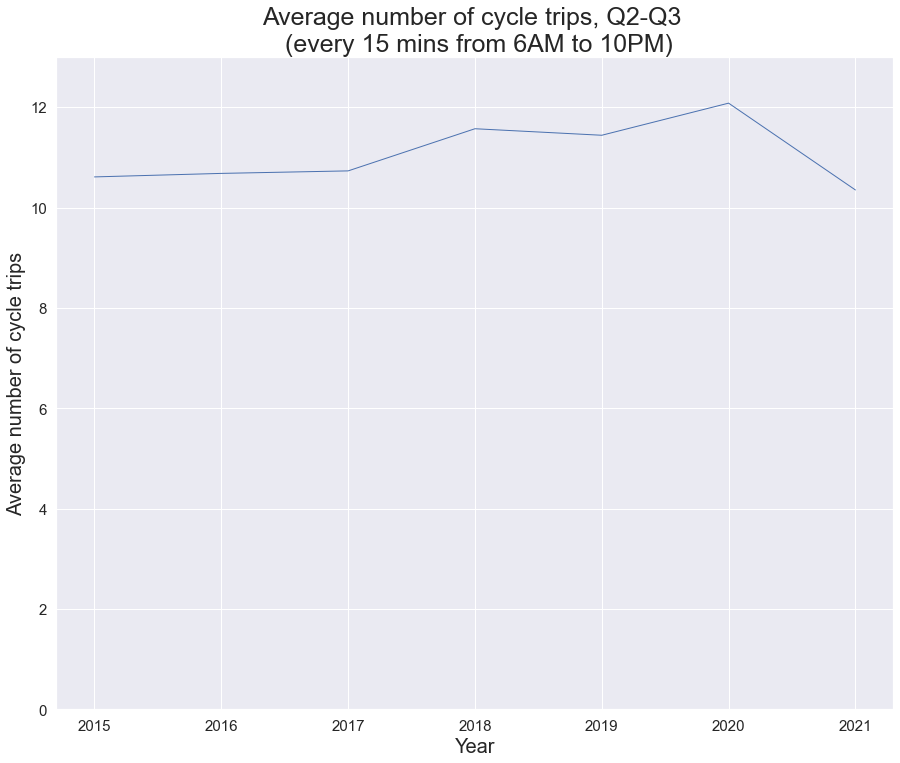

In [403]:
# Plot annualy average numbers of cycles.
# Create a lineplot.
lineplot_y = sns.lineplot(x='Year', y='Total cycles', 
                           data=london_inner_fnl_15mns, 
                           linewidth=1)

# Update title, x and y labels and legend.
lineplot_y.set_title('Average number of cycle trips, Q2-Q3 \n (every 15 mins from 6AM to 10PM)', 
                      fontdict={'fontsize':25})
lineplot_y.set_xlabel('Year', fontdict={'fontsize':20})
lineplot_y.set_ylabel('Average number of cycle trips', fontdict={'fontsize':20})
plt.ylim(0, 13)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

## Population Analysis

Comparing populations in Inner and Outer London

In [404]:
# Extract population by area.
Population_IL_year = Population_IL.groupby('Area').sum()

#Swap rows and columns
Population_IL_year = Population_IL_year.T.reset_index()

# Rename columns.
Population_IL_year = Population_IL_year.rename(columns={'index': 'Year', 'Inner': 'Population'})

#View DataFrame.
Population_IL_year

Area,Year,Population
0,2015,3425000
1,2016,3506000
2,2017,3560000
3,2018,3574000
4,2019,3612000
5,2020,3643000
6,2021,3404400


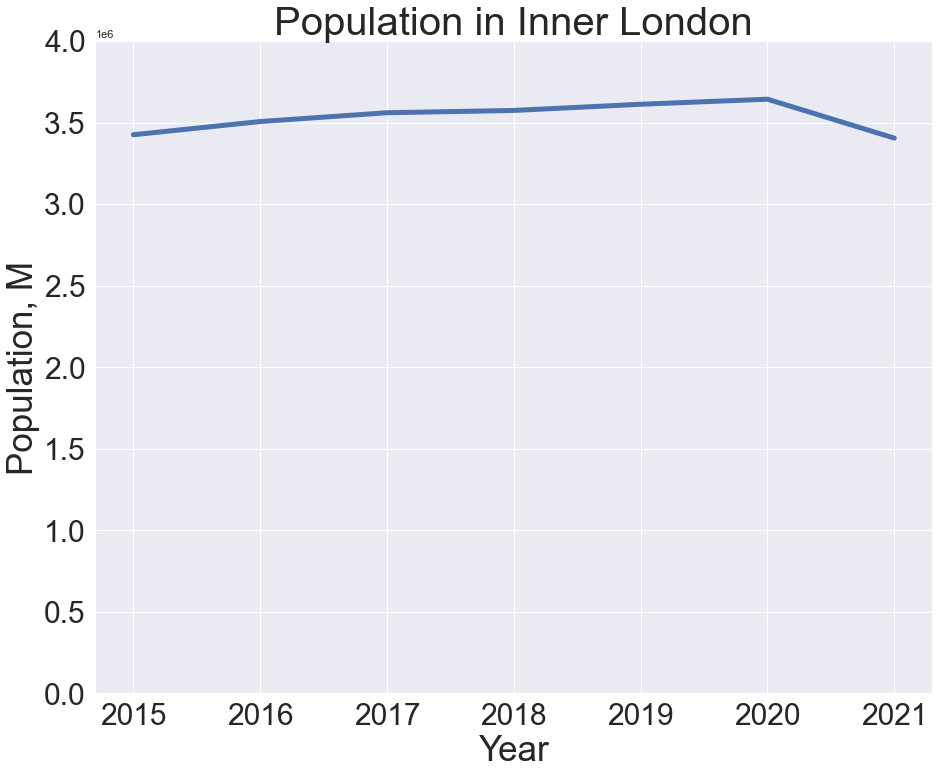

In [405]:
# Plot annualy average numbers of cycles.
# Create a lineplot.
lineplot_y = sns.lineplot(x='Year', y='Population', 
                           data=Population_IL_year, 
                           linewidth=5)

# Update title, x and y labels and legend.
lineplot_y.set_title('Population in Inner London', 
                      fontdict={'fontsize':40})
lineplot_y.set_xlabel('Year', fontdict={'fontsize':35})
lineplot_y.set_ylabel('Population, M', fontdict={'fontsize':35})
plt.ylim(0, 4000000)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

# View plot.
plt.show()

## Outer London

In [406]:
# Extract population by area.
Population_OL_year = Population_OL.groupby('Area').sum()

#Swap rows and columns
Population_OL_year = Population_OL_year.T.reset_index()

# Rename columns.
Population_OL_year = Population_OL_year.rename(columns={'index': 'Year', 'Outer': 'Population'})

#View DataFrame.
Population_OL_year

Area,Year,Population
0,2015,5170000
1,2016,5260000
2,2017,5329000
3,2018,5322000
4,2019,5371000
5,2020,5416000
6,2021,5395600


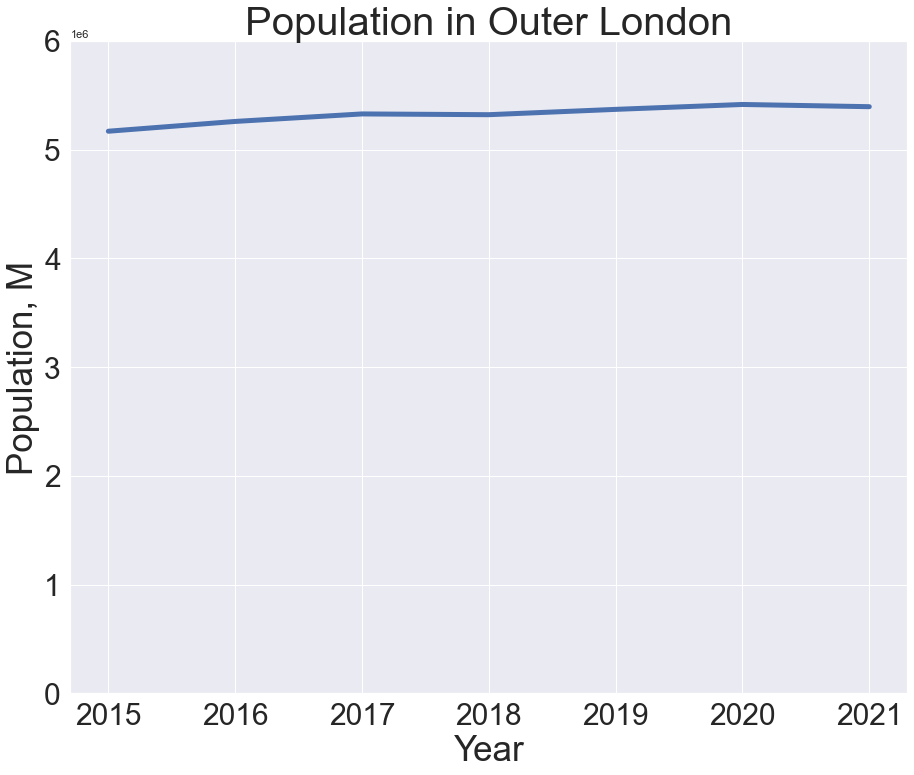

In [407]:
# Create a lineplot.
lineplot_y = sns.lineplot(x='Year', y='Population', 
                           data=Population_OL_year, 
                           linewidth=5)

# Update title, x and y labels and legend.
lineplot_y.set_title('Population in Outer London', 
                      fontdict={'fontsize':40})
lineplot_y.set_xlabel('Year', fontdict={'fontsize':35})
lineplot_y.set_ylabel('Population, M', fontdict={'fontsize':35})
plt.ylim(0, 6000000)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

# View plot.
plt.show()

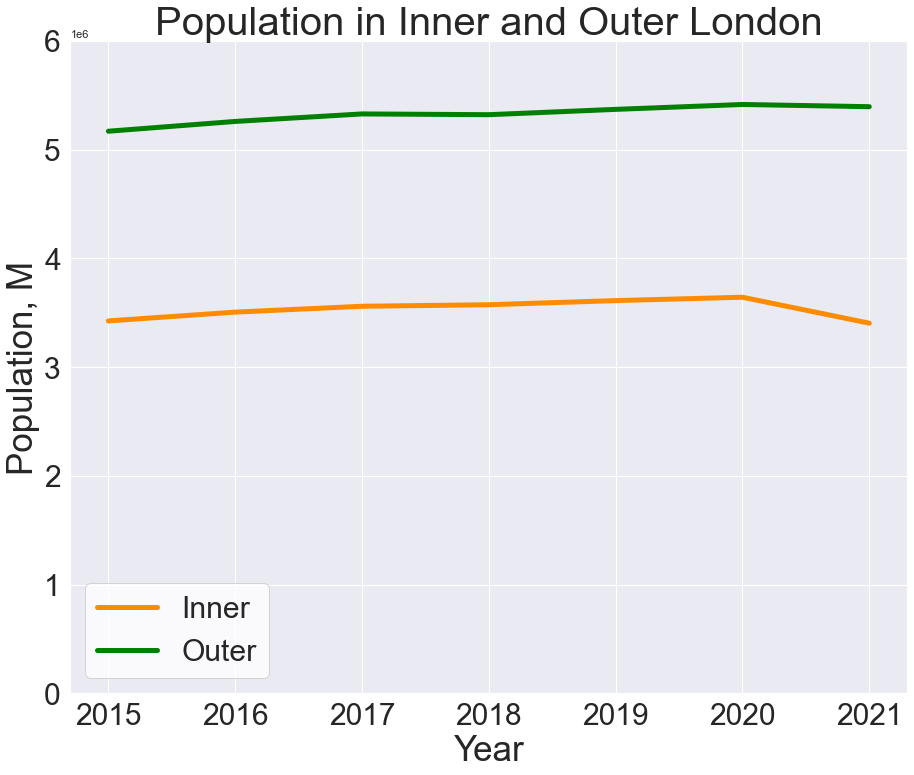

In [408]:
# Create plot.
plt.plot('Year', 'Population', data=Population_IL_year, linewidth=5, label = 'Inner', color='darkorange')
plt.plot('Year', 'Population', data=Population_OL_year, linewidth=5, label = 'Outer', color='green')
plt.legend(fontsize = 30, facecolor='white')
plt.title('Population in Inner and Outer London', 
                      fontdict={'fontsize':40})
plt.xlabel('Year', fontdict={'fontsize':35})
plt.ylabel('Population, M', fontdict={'fontsize':35})
plt.ylim(0, 6000000)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

# View plot.
plt.show()

### SUMMARY:

**Inner London:**

Population in Inner London has dropped in 2021 below 2015 level, the average number of cycle trips (every 15 mins) in Q2-Q3 2021 has also dropped below Q2-Q3 2015 level.

**Outer London:**

Population in Outer London has decrease between 2020 and 2021 by 0.38%, the average number of cycle trips (every 15 mins) has decreased by 31.75%.

### Key part of analysis: 

This was a key part of our analysis process. Earlier we had seeen the huge difference between cycling numbers of central and inner London compared to outer london. After learning that outer London actually has a population of 1.5 times larger. Therefore, for the majority of our future analysis we focused on outer London.

# Earnings 

### Overaching hypothesis:  "do boroughs with hire earnings have higher rates of cycling?" and "as earnings increase does rates of private cycles also increase?" 

## Importing external earnigns file to look at salary per borough


Data set produced by Office of National Statistics - this file has been edited in Excel so the layout is compatible with Python

In [409]:
# Import file
total_week_earn = pd.read_excel('total_weekly_earnings.xlsx')
total_week_earn.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,762.4,...,#,#,#,#,#,#,909.4,#,#,#
1,00AB,Barking and Dagenham,383.3,354.9,360.1,375.1,417.6,446.7,449.9,448.8,...,450,441.2,422.5,436.6,462.2,461,479.1,471,486.7,523.5
2,00AC,Barnet,427.4,450.1,453.3,442.3,466.1,460,502.2,528.1,...,503.1,517.5,479.1,491,485.6,522.6,536.6,536.4,538.8,574.9
3,00AD,Bexley,405,431.9,438.1,452.4,443.4,469.8,483.9,486.3,...,509.1,497.9,512.6,491.1,487,513,512.7,553.4,566.5,584.8
4,00AE,Brent,368.4,359.8,395.5,394.7,398.7,421.6,437,439.1,...,442,441.8,441.8,457.6,467,471,479.9,524,531.8,553.1


In [410]:
# Change Area to Borough for consistency
total_week_earn = total_week_earn.rename(columns={'Area': 'Borough'})
total_week_earn.head()

,Code,Borough,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,762.4,...,#,#,#,#,#,#,909.4,#,#,#
1,00AB,Barking and Dagenham,383.3,354.9,360.1,375.1,417.6,446.7,449.9,448.8,...,450,441.2,422.5,436.6,462.2,461,479.1,471,486.7,523.5
2,00AC,Barnet,427.4,450.1,453.3,442.3,466.1,460,502.2,528.1,...,503.1,517.5,479.1,491,485.6,522.6,536.6,536.4,538.8,574.9
3,00AD,Bexley,405,431.9,438.1,452.4,443.4,469.8,483.9,486.3,...,509.1,497.9,512.6,491.1,487,513,512.7,553.4,566.5,584.8
4,00AE,Brent,368.4,359.8,395.5,394.7,398.7,421.6,437,439.1,...,442,441.8,441.8,457.6,467,471,479.9,524,531.8,553.1


In [411]:
# Create subset to only look at the boroughs in central london
cent_earnings_borough = total_week_earn[(total_week_earn['Borough'].isin(['Camden', 'City of London', 'Hackney',
                                                                       'Islington', 'Lambeth', 'Southwark',
                                                                      'Tower Hamlets', 'Westminster']))].reset_index()

cent_earnings_borough.head()

,index,Code,Borough,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,0,00AA,City of London,!,!,#,#,#,#,#,...,#,#,#,#,#,#,909.4,#,#,#
1,6,00AG,Camden,470.8,491.1,507.9,541,552.2,592.6,614.6,...,612,629.5,613.1,588.1,632.5,614.3,634.4,662,623,694.2
2,11,00AM,Hackney,387.1,395.2,411.1,432.1,428.8,451.1,472.6,...,511.4,519,513,534.5,527.8,558.1,555.4,574.9,574.9,575.1
3,18,00AU,Islington,465,472,499,532.5,503.7,517.5,566.7,...,605.1,606,613.5,603.7,613.3,646.1,687.7,699.1,690.1,665.6
4,21,00AY,Lambeth,404.3,425.5,446.7,460.3,455.6,490.7,494.5,...,574.8,536.6,547,542.9,551.7,594.6,617.1,634.8,670.8,673.6


In [412]:
# Drop index column
cent_earnings = cent_earnings_borough.drop(['index'], axis=1)
cent_earnings.head()

,Code,Borough,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,762.4,...,#,#,#,#,#,#,909.4,#,#,#
1,00AG,Camden,470.8,491.1,507.9,541,552.2,592.6,614.6,621.1,...,612,629.5,613.1,588.1,632.5,614.3,634.4,662,623,694.2
2,00AM,Hackney,387.1,395.2,411.1,432.1,428.8,451.1,472.6,503.7,...,511.4,519,513,534.5,527.8,558.1,555.4,574.9,574.9,575.1
3,00AU,Islington,465,472,499,532.5,503.7,517.5,566.7,588.2,...,605.1,606,613.5,603.7,613.3,646.1,687.7,699.1,690.1,665.6
4,00AY,Lambeth,404.3,425.5,446.7,460.3,455.6,490.7,494.5,522.4,...,574.8,536.6,547,542.9,551.7,594.6,617.1,634.8,670.8,673.6


In [413]:
# Create new subset to isolate the 2014 - 2019 columns 
earnings_cent = cent_earnings.iloc[:, 0:20]
earnings_cent.head()

,Code,Borough,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),2010 Pay (£),2011 Pay (£),2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,762.4,#,#,#,#,#,#,#,#,909.4,#
1,00AG,Camden,470.8,491.1,507.9,541,552.2,592.6,614.6,621.1,583,612,612,629.5,613.1,588.1,632.5,614.3,634.4,662
2,00AM,Hackney,387.1,395.2,411.1,432.1,428.8,451.1,472.6,503.7,501.3,517.4,511.4,519,513,534.5,527.8,558.1,555.4,574.9
3,00AU,Islington,465,472,499,532.5,503.7,517.5,566.7,588.2,599,598.5,605.1,606,613.5,603.7,613.3,646.1,687.7,699.1
4,00AY,Lambeth,404.3,425.5,446.7,460.3,455.6,490.7,494.5,522.4,574.9,536.7,574.8,536.6,547,542.9,551.7,594.6,617.1,634.8


In [414]:
# further removal of columns to extract required columns 
earnings_cent = earnings_cent.drop(earnings_cent.iloc[:, 2:14].columns, axis=1).reset_index()
earnings_cent

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£)
0,0,00AA,City of London,#,#,#,#,909.4,#
1,1,00AG,Camden,613.1,588.1,632.5,614.3,634.4,662
2,2,00AM,Hackney,513,534.5,527.8,558.1,555.4,574.9
3,3,00AU,Islington,613.5,603.7,613.3,646.1,687.7,699.1
4,4,00AY,Lambeth,547,542.9,551.7,594.6,617.1,634.8
5,5,00BE,Southwark,529,557,543,587.1,589.4,628
6,6,00BG,Tower Hamlets,574.9,554.9,557.9,592,627.6,688.9
7,7,00BK,Westminster,659.6,656,667.5,730.8,757.1,703.9


In [415]:
# Drop City of London row due to missing data - unable to make calculations
earnings_cent = earnings_cent.drop(labels=0, axis=0)
earnings_cent

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£)
1,1,00AG,Camden,613.1,588.1,632.5,614.3,634.4,662
2,2,00AM,Hackney,513,534.5,527.8,558.1,555.4,574.9
3,3,00AU,Islington,613.5,603.7,613.3,646.1,687.7,699.1
4,4,00AY,Lambeth,547,542.9,551.7,594.6,617.1,634.8
5,5,00BE,Southwark,529,557,543,587.1,589.4,628
6,6,00BG,Tower Hamlets,574.9,554.9,557.9,592,627.6,688.9
7,7,00BK,Westminster,659.6,656,667.5,730.8,757.1,703.9


In [416]:
# Add column to calculate the percentage change in salary from 2014 to 2019
earnings_cent['£_14_19%'] = earnings_cent[['2014 Pay (£)', '2019 Pay (£)']]\
.pct_change(axis=1)['2019 Pay (£)'].round(2)
earnings_cent.head()

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),£_14_19%
1,1,00AG,Camden,613.1,588.1,632.5,614.3,634.4,662,0.08
2,2,00AM,Hackney,513,534.5,527.8,558.1,555.4,574.9,0.12
3,3,00AU,Islington,613.5,603.7,613.3,646.1,687.7,699.1,0.14
4,4,00AY,Lambeth,547,542.9,551.7,594.6,617.1,634.8,0.16
5,5,00BE,Southwark,529,557,543,587.1,589.4,628,0.19


## Comparing earnings to cycling rates in Central London between 2014 and 2019

In [417]:
# view the Central London Earnings df
earnings_cent

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),£_14_19%
1,1,00AG,Camden,613.1,588.1,632.5,614.3,634.4,662,0.08
2,2,00AM,Hackney,513,534.5,527.8,558.1,555.4,574.9,0.12
3,3,00AU,Islington,613.5,603.7,613.3,646.1,687.7,699.1,0.14
4,4,00AY,Lambeth,547,542.9,551.7,594.6,617.1,634.8,0.16
5,5,00BE,Southwark,529,557,543,587.1,589.4,628,0.19
6,6,00BG,Tower Hamlets,574.9,554.9,557.9,592,627.6,688.9,0.20
7,7,00BK,Westminster,659.6,656,667.5,730.8,757.1,703.9,0.07


In [418]:
# view the Central London cycling df
fourteen_nineteen

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles,% Change in private cycles,% Change in hire cycles,% Change Total Cycles
0,Camden,241626,265966,28591,30832,270217,296798,0.10,0.08,0.10
1,City of London,308651,426720,38141,55365,346792,482085,0.38,0.45,0.39
2,Hackney,2864,6113,472,678,3336,6791,1.13,0.44,1.04
3,Islington,120968,133374,12386,13319,133354,146693,0.10,0.08,0.10
4,Lambeth,163769,153244,17871,21397,181640,174641,-0.06,0.20,-0.04
5,Southwark,197126,272904,16344,24116,213470,297020,0.38,0.48,0.39
6,Tower Hamlets,2432,3282,476,506,2908,3788,0.35,0.06,0.30
7,Westminster,398925,425736,52355,68449,451280,494185,0.07,0.31,0.10


In [419]:
# subset for only 2014 and 2019
# to see overall % change
earnings_cent_ss = earnings_cent.loc[:, ['Borough', '£_14_19%']]
earnings_cent_ss.head()

,Borough,£_14_19%
1,Camden,0.08
2,Hackney,0.12
3,Islington,0.14
4,Lambeth,0.16
5,Southwark,0.19


In [420]:
# Create copy of fourteen_nineteen df
fourteen_nineteen_ss = fourteen_nineteen.copy()
fourteen_nineteen_ss

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles,% Change in private cycles,% Change in hire cycles,% Change Total Cycles
0,Camden,241626,265966,28591,30832,270217,296798,0.10,0.08,0.10
1,City of London,308651,426720,38141,55365,346792,482085,0.38,0.45,0.39
2,Hackney,2864,6113,472,678,3336,6791,1.13,0.44,1.04
3,Islington,120968,133374,12386,13319,133354,146693,0.10,0.08,0.10
4,Lambeth,163769,153244,17871,21397,181640,174641,-0.06,0.20,-0.04
5,Southwark,197126,272904,16344,24116,213470,297020,0.38,0.48,0.39
6,Tower Hamlets,2432,3282,476,506,2908,3788,0.35,0.06,0.30
7,Westminster,398925,425736,52355,68449,451280,494185,0.07,0.31,0.10


In [421]:
# drop unecessary column
fourteen_nineteen_ss.drop(fourteen_nineteen.index[1], inplace=True)
fourteen_nineteen_ss

,Borough,2014 Number of private cycles,2019 Number of private cycles,2014 Number of hire cycles,2019 Number of hire cycles,2014 Total_cycles,2019 Total_cycles,% Change in private cycles,% Change in hire cycles,% Change Total Cycles
0,Camden,241626,265966,28591,30832,270217,296798,0.10,0.08,0.10
2,Hackney,2864,6113,472,678,3336,6791,1.13,0.44,1.04
3,Islington,120968,133374,12386,13319,133354,146693,0.10,0.08,0.10
4,Lambeth,163769,153244,17871,21397,181640,174641,-0.06,0.20,-0.04
5,Southwark,197126,272904,16344,24116,213470,297020,0.38,0.48,0.39
6,Tower Hamlets,2432,3282,476,506,2908,3788,0.35,0.06,0.30
7,Westminster,398925,425736,52355,68449,451280,494185,0.07,0.31,0.10


In [422]:
# take only relevant columns 
fourteen_nineteen_ss = fourteen_nineteen_ss.loc[:, ['Borough', '% Change in private cycles', 
                                                 '% Change in hire cycles', '% Change Total Cycles']]
                                                 
fourteen_nineteen_ss

,Borough,% Change in private cycles,% Change in hire cycles,% Change Total Cycles
0,Camden,0.10,0.08,0.10
2,Hackney,1.13,0.44,1.04
3,Islington,0.10,0.08,0.10
4,Lambeth,-0.06,0.20,-0.04
5,Southwark,0.38,0.48,0.39
6,Tower Hamlets,0.35,0.06,0.30
7,Westminster,0.07,0.31,0.10


In [423]:
# merge both dfs
cent_earn_total = pd.merge(fourteen_nineteen_ss,
                 earnings_cent_ss[['Borough', '£_14_19%']],
                 on='Borough')
cent_earn_total.head()

,Borough,% Change in private cycles,% Change in hire cycles,% Change Total Cycles,£_14_19%
0,Camden,0.10,0.08,0.10,0.08
1,Hackney,1.13,0.44,1.04,0.12
2,Islington,0.10,0.08,0.10,0.14
3,Lambeth,-0.06,0.20,-0.04,0.16
4,Southwark,0.38,0.48,0.39,0.19


Hard to distinguish any relevant relationship between pay and cycling numbers of either private or hire cycles in Central London. 

Boroughs like Camden, Hackney, Islington, Southwark all see a small increase in the weekly total pay and there is also a small increase in the number of private and hire cycles but nothing which is concrete. 

Lambeth stands out as it experiences the second highest % increase in weekly earnings but is the only borough to see a decrease in private cycles and a reduction in overall total cycles.

## Earnings and Inner London

In [424]:
# Determine which boroughs fall in inner london
borough_li.Borough.unique()

array(['Tower Hamlets', 'Waltham Forest', 'Islington', 'Haringey',
       'Hackney', 'Lambeth', 'Lewisham', 'Southwark', 'Merton',
       'Wandsworth', 'Hammersmith & Fulham', 'Kensington & Chelsea',
       'Ealing', 'Camden', 'Westminster', 'Richmond upon Thames', 'Brent',
       'Bromley', 'Hounslow', 'Greenwich', 'Newham'], dtype=object)

In [425]:
# Import external dataframe
# edited in Excel 
fulltime_weekly = pd.read_excel('Full Time Weekly.xlsx')
fulltime_weekly.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,#,#,#,#,#,#,#,767.6,...,#,#,#,#,1034.1,#,1032.2,#,#,#
1,00AB,Barking and Dagenham,439.5,404.3,413.6,429.5,478.2,494.3,499.4,523.7,...,549.2,521.4,511.8,534.1,543.3,555.9,572.3,589.8,580.7,643.4
2,00AC,Barnet,499.1,529.5,531.8,546.5,553.5,551.7,588.8,622.1,...,596.8,611.9,617.6,628.5,637.7,690,677.6,677.5,663.1,685.2
3,00AD,Bexley,464.6,494.1,490.2,517.1,527,546.2,591,575.2,...,611.8,616,612.4,609,646.7,624.6,641.5,671,731.4,709.4
4,00AE,Brent,428.4,421,451.7,460,460.1,479.1,513.6,525.3,...,542.8,536.8,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8


In [426]:
# Extract only inner boroughs
inner_fulltime = fulltime_weekly[(fulltime_weekly['Area'].isin(['Tower Hamlets', 'Waltham Forest', 'Islington', 'Haringey',
                                                      'Hackney', 'Lambeth', 'Lewisham', 'Southwark', 'Merton',
                                                      'Wandsworth', 'Hammersmith and Fulham', 'Kensington and Chelsea',
                                                      'Ealing', 'Camden', 'Westminster', 'Richmond upon Thames', 'Brent',
                                                      'Bromley', 'Hounslow', 'Greenwich', 'Newham']))]

inner_fulltime.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
4,00AE,Brent,428.4,421,451.7,460,460.1,479.1,513.6,525.3,...,542.8,536.8,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
5,00AF,Bromley,506.1,537.4,531.9,566.3,574.8,609,643,644.9,...,670.8,684.8,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
6,00AG,Camden,542.7,538.8,547.7,595,608.8,637.8,695.9,710.1,...,694.6,717.9,718.7,726.4,737.5,725.5,766.6,795.4,745.3,785.7
8,00AJ,Ealing,472.4,479.8,483.9,491.1,505.7,530.9,556.1,559.7,...,565.7,566.4,575,561.5,580.5,597.9,631.5,622.4,632.3,670.7
10,00AL,Greenwich,472.5,497.1,504.2,496.4,516.7,546,575,601.1,...,583.9,588.2,590.5,597.3,597.6,638.9,659.9,679.6,684,740


In [427]:
# drop irrelevant dates
inner_ft = inner_fulltime.drop(inner_fulltime.iloc[:, 2:14].columns, axis=1).reset_index()
inner_ft.head()

,index,Code,Area,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,4,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
1,5,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
2,6,00AG,Camden,718.7,726.4,737.5,725.5,766.6,795.4,745.3,785.7
3,8,00AJ,Ealing,575,561.5,580.5,597.9,631.5,622.4,632.3,670.7
4,10,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684,740


In [428]:
# Rename Area column
inner_ft = inner_ft.rename(columns={'Area': 'Borough'})
inner_ft.head()

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,4,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
1,5,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
2,6,00AG,Camden,718.7,726.4,737.5,725.5,766.6,795.4,745.3,785.7
3,8,00AJ,Ealing,575,561.5,580.5,597.9,631.5,622.4,632.3,670.7
4,10,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684,740


In [429]:
# drop index column
inner_ft = inner_ft.drop(['index'], axis=1)
inner_ft

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
1,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
2,00AG,Camden,718.7,726.4,737.5,725.5,766.6,795.4,745.3,785.7
3,00AJ,Ealing,575,561.5,580.5,597.9,631.5,622.4,632.3,670.7
4,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684,740
5,00AM,Hackney,612.7,602.1,613.3,659.8,659.1,709.2,702.5,705.3
6,00AN,Hammersmith and Fulham,670.8,686.3,699.1,709.8,748.5,795.3,788,782.9
7,00AP,Haringey,573.8,576.5,575.3,624.4,653.4,670.8,707.9,703.1
8,00AT,Hounslow,562.6,560.6,585.8,596.5,617.4,658.8,589.2,675.2
9,00AU,Islington,688.3,670.8,713.7,721.5,804.6,801,819.7,774.7


In [430]:
# Ensure spelling is the same in both datasets 
inner_ft = inner_ft.replace(to_replace="Hammersmith and Fulham",
                                              value="Hammersmith & Fulham")

inner_ft = inner_ft.replace(to_replace="Kensington and Chelsea",
                                              value="Kensington & Chelsea")

inner_ft

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
1,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
2,00AG,Camden,718.7,726.4,737.5,725.5,766.6,795.4,745.3,785.7
3,00AJ,Ealing,575.0,561.5,580.5,597.9,631.5,622.4,632.3,670.7
4,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684.0,740.0
5,00AM,Hackney,612.7,602.1,613.3,659.8,659.1,709.2,702.5,705.3
6,00AN,Hammersmith & Fulham,670.8,686.3,699.1,709.8,748.5,795.3,788.0,782.9
7,00AP,Haringey,573.8,576.5,575.3,624.4,653.4,670.8,707.9,703.1
8,00AT,Hounslow,562.6,560.6,585.8,596.5,617.4,658.8,589.2,675.2
9,00AU,Islington,688.3,670.8,713.7,721.5,804.6,801.0,819.7,774.7


In [431]:
# sort by 2019 pay
inner_ft.sort_values(by=['2019 Pay (£)'])

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
3,00AJ,Ealing,575.0,561.5,580.5,597.9,631.5,622.4,632.3,670.7
14,00BB,Newham,508.3,505.8,524.2,584.9,587.7,622.8,631.6,677.6
12,00AZ,Lewisham,604.8,606.6,617.0,633.7,622.2,654.1,689.7,721.4
8,00AT,Hounslow,562.6,560.6,585.8,596.5,617.4,658.8,589.2,675.2
7,00AP,Haringey,573.8,576.5,575.3,624.4,653.4,670.8,707.9,703.1
4,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684.0,740.0
18,00BH,Waltham Forest,542.9,546.9,577.1,574.9,622.9,680.3,716.2,727.7
16,00BE,Southwark,620.9,642.4,643.4,670.1,672.1,709.1,732.9,724.1
5,00AM,Hackney,612.7,602.1,613.3,659.8,659.1,709.2,702.5,705.3


In [432]:
# Subset borough_li df on cycling numbers by the year 2019
li_19 = borough_li[borough_li['Year'] == 2019]
li_19.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Borough,Functional cycling area
512,2019,INNCY001,Grove Road,"mar, 30/04/19",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,1,0,1,2019-04-30,Tuesday,2019,April,Q2,Tower Hamlets,Inner
513,2019,INNCY001,Grove Road,"mar, 30/04/19",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,1,0,1,2019-04-30,Tuesday,2019,April,Q2,Tower Hamlets,Inner
514,2019,INNCY001,Grove Road,"mar, 30/04/19",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,4,0,4,2019-04-30,Tuesday,2019,April,Q2,Tower Hamlets,Inner
515,2019,INNCY001,Grove Road,"mar, 30/04/19",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,11,0,11,2019-04-30,Tuesday,2019,April,Q2,Tower Hamlets,Inner
516,2019,INNCY001,Grove Road,"mar, 30/04/19",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,7,0,7,2019-04-30,Tuesday,2019,April,Q2,Tower Hamlets,Inner


In [433]:
# group to see total number of cycles for each borough in 2019
li_19.groupby(['Year', 'Borough']).sum().sort_values(by='Number of private cycles', ascending=False).reset_index()

,Year,Borough,Survey wave (year),Start hour,Start minute,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2019,Islington,12146304,81216.0,135360.0,54823,1217,56040
1,2019,Hackney,13438464,89856.0,149760.0,52357,1092,53449
2,2019,Wandsworth,18607104,124416.0,207360.0,44008,2596,46604
3,2019,Tower Hamlets,14472192,96768.0,161280.0,42639,3418,46057
4,2019,Kensington & Chelsea,12146304,81216.0,135360.0,40273,5642,45915
5,2019,Hammersmith & Fulham,11112576,74304.0,123840.0,39770,2567,42337
6,2019,Lambeth,16022784,107136.0,178560.0,32884,960,33844
7,2019,Southwark,13696896,91584.0,152640.0,32726,364,33090
8,2019,Westminster,11629440,77760.0,129600.0,31450,5134,36584
9,2019,Camden,10078848,67392.0,112320.0,23486,698,24184


In [434]:
# compare two df
inner_ft.sort_values(by=['2019 Pay (£)'], ascending=False)

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
10,00AW,Kensington & Chelsea,791.3,771.4,735.0,854.8,831.2,901.3,916.6,976.2
15,00BD,Richmond upon Thames,763.9,743.9,784.6,739.9,799.4,820.3,885.0,812.5
20,00BK,Westminster,766.6,766.5,781.8,807.4,833.7,812.8,817.3,841.8
19,00BJ,Wandsworth,708.3,719.7,762.3,757.4,773.5,811.8,807.0,842.9
9,00AU,Islington,688.3,670.8,713.7,721.5,804.6,801.0,819.7,774.7
2,00AG,Camden,718.7,726.4,737.5,725.5,766.6,795.4,745.3,785.7
6,00AN,Hammersmith & Fulham,670.8,686.3,699.1,709.8,748.5,795.3,788.0,782.9
1,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
17,00BG,Tower Hamlets,662.6,634.7,664.7,710.4,725.5,780.4,779.2,797.3
11,00AY,Lambeth,628.3,616.5,616.2,666.1,689.9,714.4,766.6,746.4


In [435]:
# subset li_19 data
inner_cycle_2019 = li_19.loc[:, ['Year', 'Borough', 'Number of private cycles', 'Number of cycle hire bikes',
                                 'Total cycles']].reset_index()

# drop unecessary column
inner_cycle_2019 = inner_cycle_2019.drop(['index'], axis=1)


inner_cycle_2019.head()

,Year,Borough,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2019,Tower Hamlets,1,0,1
1,2019,Tower Hamlets,1,0,1
2,2019,Tower Hamlets,4,0,4
3,2019,Tower Hamlets,11,0,11
4,2019,Tower Hamlets,7,0,7


In [436]:
# create subset group
inner_cycle_group_2019 = inner_cycle_2019.groupby(['Year', 'Borough']).sum().reset_index()
inner_cycle_group_2019 

,Year,Borough,Number of private cycles,Number of cycle hire bikes,Total cycles
0,2019,Brent,1035,14,1049
1,2019,Bromley,249,2,251
2,2019,Camden,23486,698,24184
3,2019,Ealing,2227,5,2232
4,2019,Greenwich,106,0,106
5,2019,Hackney,52357,1092,53449
6,2019,Hammersmith & Fulham,39770,2567,42337
7,2019,Haringey,4326,24,4350
8,2019,Hounslow,256,6,262
9,2019,Islington,54823,1217,56040


In [437]:
# subset li_19 data
inner_ft_2019 = inner_ft.loc[:, ['Borough', '2019 Pay (£)']].reset_index()

# drop unecessary column
inner_ft_2019 = inner_ft_2019.drop(['index'], axis=1)

inner_ft_2019

,Borough,2019 Pay (£)
0,Brent,609.6
1,Bromley,785.3
2,Camden,795.4
3,Ealing,622.4
4,Greenwich,679.6
5,Hackney,709.2
6,Hammersmith & Fulham,795.3
7,Haringey,670.8
8,Hounslow,658.8
9,Islington,801.0


In [438]:
# merge both dfs
inner_cycle_ft_19 = pd.merge(inner_cycle_group_2019,
                             inner_ft_2019[['Borough', '2019 Pay (£)']],
                             on='Borough')

inner_cycle_ft_19

,Year,Borough,Number of private cycles,Number of cycle hire bikes,Total cycles,2019 Pay (£)
0,2019,Brent,1035,14,1049,609.6
1,2019,Bromley,249,2,251,785.3
2,2019,Camden,23486,698,24184,795.4
3,2019,Ealing,2227,5,2232,622.4
4,2019,Greenwich,106,0,106,679.6
5,2019,Hackney,52357,1092,53449,709.2
6,2019,Hammersmith & Fulham,39770,2567,42337,795.3
7,2019,Haringey,4326,24,4350,670.8
8,2019,Hounslow,256,6,262,658.8
9,2019,Islington,54823,1217,56040,801.0


In [439]:
# compare two df
inner_cycle_ft_19.sort_values(by=['2019 Pay (£)'], ascending=False)

,Year,Borough,Number of private cycles,Number of cycle hire bikes,Total cycles,2019 Pay (£)
10,2019,Kensington & Chelsea,40273,5642,45915,901.3
15,2019,Richmond upon Thames,1922,47,1969,820.3
20,2019,Westminster,31450,5134,36584,812.8
19,2019,Wandsworth,44008,2596,46604,811.8
9,2019,Islington,54823,1217,56040,801.0
2,2019,Camden,23486,698,24184,795.4
6,2019,Hammersmith & Fulham,39770,2567,42337,795.3
1,2019,Bromley,249,2,251,785.3
17,2019,Tower Hamlets,42639,3418,46057,780.4
11,2019,Lambeth,32884,960,33844,714.4


Slight correlation between earnings and cycle rates in in inner london. Islington and Wandsworth rank 1st and 3rd for private cycles and are also the boroughs which have the third and fifth highest total weekly earnings. 

However, we also have boroughs like Bromley which ranks second bottom for private cycles (19th) but is 8th for earnings. This could be the make up of the borough, which isnt cycle friendly. This sort of finding caused us to focus much of our analysis on infrastructure (which we will see later in the notebook) as without safe cycling infrastructure we felt people wouldnt cycle regardless of earnings. 

## Earnings Outer London

In [440]:
# Read the provided CSV file/data set.            
outer = pd.read_csv('london_outer_cl.csv')
outer.head()

,Unnamed: 0,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter
0,0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2
1,1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday,June,Q2
2,2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday,June,Q2
3,3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday,June,Q2
4,4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday,June,Q2


In [441]:
# Rename column to match column name in other dataframes
london_sites = london_sites.rename(columns={'UnqID': 'Site ID'})
london_sites.head()

,Unnamed: 0,Site ID,ProgID,SurveyDescription,Easting,Northing,Location,Borough,Functional cycling area
0,0,CENCY001,CENCY,Central area cycle surveys,530251.49,178742.45,Millbank (south of Thorney Street),Westminster,Central
1,1,CENCY002,CENCY,Central area cycle surveys,533362.68,181824.45,Bishopsgate,City of London,Central
2,2,CENCY003,CENCY,Central area cycle surveys,532334.06,180520.37,Southwark Bridge,Southwark,Central
3,3,CENCY004,CENCY,Central area cycle surveys,532052.50,179677.64,Southwark Bridge Road,Southwark,Central
4,4,CENCY005,CENCY,Central area cycle surveys,533031.59,180213.46,Tooley Street,Southwark,Central


In [442]:
# merge outer and biking sites file
borough_lo = pd.merge(outer,
                 london_sites[['Site ID', 'Borough', 'Functional cycling area']],
                 on='Site ID')
borough_lo.head()

,Unnamed: 0,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,...,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
0,0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,...,2,1,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
1,1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,...,3,0,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
2,2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,...,2,0,0,2,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
3,3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,...,4,0,0,4,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
4,4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,...,4,1,0,5,2015-06-26,Friday,June,Q2,Waltham Forest,Outer


In [443]:
# drop unnecessary column
borough_lo = borough_lo.drop(['Unnamed: 0'], axis=1)
borough_lo.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday,June,Q2,Waltham Forest,Outer


In [444]:
# create group subset
borough_lo_group = borough_lo.groupby(['Borough', 'Survey wave (year)']).sum().reset_index()
borough_lo_group.head()

,Borough,Survey wave (year),Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,Barking & Dagenham,2015,20736,34560,1177,139,34,1350
1,Barking & Dagenham,2016,20736,34560,1073,196,10,1279
2,Barking & Dagenham,2017,20736,34560,1025,135,26,1186
3,Barking & Dagenham,2018,20736,34560,1220,143,5,1368
4,Barking & Dagenham,2019,20736,34560,939,142,30,1111


In [445]:
# export to csv to transpose file in Excel
borough_lo_group.to_csv('borough_lo_group.csv')

In [446]:
# import transposed file
outer_reshape = pd.read_csv('outer_reshape.csv')
outer_reshape.head()

,Borough,2015 Male cycles,2015 Female cycles,2015 Unknown cycles,2015 Total cycles,2016 Male cycles,2016 Female cycles,2016 Unknown cycles,2016 Total cycles,2017 Male cycles,...,2019 Unknown cycles,2019 Total cycles,2020 Male cycles,2020 Female cycles,2020 Unknown cycles,2020 Total cycles,2021 Male cycles,2021 Female cycles,2021 Unknown cycles,2021 Total cycles
0,Barking & Dagenham,1177,139,34,1350,1073,196,10,1279,1025,...,30,1111,1066.0,139.0,4.0,1209.0,1269,168,0,1437
1,Barnet,2126,262,18,2406,2310,298,29,2637,2255,...,68,2773,1049.0,62.0,0.0,1111.0,2930,854,3,3787
2,Bexley,987,88,32,1107,993,55,19,1067,1032,...,10,1056,864.0,74.0,31.0,969.0,979,59,0,1038
3,Brent,3183,484,38,3705,3169,467,13,3649,3577,...,48,3553,2988.0,346.0,7.0,3341.0,3929,860,16,4805
4,Bromley,2347,267,40,2654,2136,153,16,2305,2566,...,35,2650,1416.0,128.0,106.0,1650.0,3087,351,1,3439


file has been reshaped and transposed in Excel to work more effectively in Python

In [447]:
# Gain over view of total figures for the analysed data set
borough_lo.groupby(['Borough']).sum()

,Survey wave (year),Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
Borough,,,,,,,
Barking & Dagenham,21180416,141696,236160,7769,1062,109,8940
Barnet,33318400,222912,371520,15309,2438,146,17893
Bexley,33576960,224640,374400,6811,556,132,7499
Brent,30219264,202176,336960,23591,3448,138,27177
Bromley,48814080,326592,544320,16446,1672,241,18359
Croydon,39775232,266112,443520,17174,1446,166,18786
Ealing,51658240,345600,576000,41055,9719,576,51350
Enfield,33318272,222912,371520,9711,1824,29,11564
Greenwich,37967104,254016,423360,17740,2508,298,20546


In [448]:
# check boroughs in outer london
borough_lo.Borough.unique()

array(['Waltham Forest', 'Redbridge', 'Barking & Dagenham', 'Havering',
       'Enfield', 'Newham', 'Haringey', 'Greenwich', 'Croydon',
       'Lewisham', 'Bexley', 'Bromley', 'Kingston upon Thames', 'Sutton',
       'Merton', 'Richmond upon Thames', 'Hillingdon', 'Ealing',
       'Hounslow', 'Barnet', 'Harrow', 'Brent', 'Lambeth', 'Wandsworth'],
      dtype=object)

In [449]:
# subset earnings file for outer boroughs
outer_fulltime = fulltime_weekly[(fulltime_weekly['Area'].isin(['Waltham Forest', 'Redbridge', 'Barking and Dagenham', 'Havering',
                                                                'Enfield', 'Newham', 'Haringey', 'Greenwich', 'Croydon',
                                                                'Lewisham', 'Bexley', 'Bromley', 'Kingston upon Thames', 'Sutton',
                                                                'Merton', 'Richmond upon Thames', 'Hillingdon', 'Ealing',
                                                                'Hounslow', 'Barnet', 'Harrow', 'Brent', 'Lambeth', 'Wandsworth']))]

outer_fulltime.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
1,00AB,Barking and Dagenham,439.5,404.3,413.6,429.5,478.2,494.3,499.4,523.7,...,549.2,521.4,511.8,534.1,543.3,555.9,572.3,589.8,580.7,643.4
2,00AC,Barnet,499.1,529.5,531.8,546.5,553.5,551.7,588.8,622.1,...,596.8,611.9,617.6,628.5,637.7,690,677.6,677.5,663.1,685.2
3,00AD,Bexley,464.6,494.1,490.2,517.1,527,546.2,591,575.2,...,611.8,616,612.4,609,646.7,624.6,641.5,671,731.4,709.4
4,00AE,Brent,428.4,421,451.7,460,460.1,479.1,513.6,525.3,...,542.8,536.8,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
5,00AF,Bromley,506.1,537.4,531.9,566.3,574.8,609,643,644.9,...,670.8,684.8,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1


In [450]:
# Ensure spelling is the same in both datasets 
outer_fulltime = outer_fulltime.replace(to_replace="Barking and Dagenham",
                                              value="Barking & Dagenham")

outer_fulltime.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
1,00AB,Barking & Dagenham,439.5,404.3,413.6,429.5,478.2,494.3,499.4,523.7,...,549.2,521.4,511.8,534.1,543.3,555.9,572.3,589.8,580.7,643.4
2,00AC,Barnet,499.1,529.5,531.8,546.5,553.5,551.7,588.8,622.1,...,596.8,611.9,617.6,628.5,637.7,690.0,677.6,677.5,663.1,685.2
3,00AD,Bexley,464.6,494.1,490.2,517.1,527.0,546.2,591.0,575.2,...,611.8,616.0,612.4,609.0,646.7,624.6,641.5,671.0,731.4,709.4
4,00AE,Brent,428.4,421.0,451.7,460.0,460.1,479.1,513.6,525.3,...,542.8,536.8,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
5,00AF,Bromley,506.1,537.4,531.9,566.3,574.8,609.0,643.0,644.9,...,670.8,684.8,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1


In [451]:
# drop years outside of range
outer_ft = outer_fulltime.drop(outer_fulltime.iloc[:, 2:14].columns, axis=1).reset_index()
outer_ft.head()

,index,Code,Area,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,1,00AB,Barking & Dagenham,511.8,534.1,543.3,555.9,572.3,589.8,580.7,643.4
1,2,00AC,Barnet,617.6,628.5,637.7,690.0,677.6,677.5,663.1,685.2
2,3,00AD,Bexley,612.4,609.0,646.7,624.6,641.5,671.0,731.4,709.4
3,4,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
4,5,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1


In [452]:
# Rename Area column
outer_ft = outer_ft.rename(columns={'Area': 'Borough'})
outer_ft.head()

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,1,00AB,Barking & Dagenham,511.8,534.1,543.3,555.9,572.3,589.8,580.7,643.4
1,2,00AC,Barnet,617.6,628.5,637.7,690.0,677.6,677.5,663.1,685.2
2,3,00AD,Bexley,612.4,609.0,646.7,624.6,641.5,671.0,731.4,709.4
3,4,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
4,5,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1


In [453]:
# drop unecessary column
outer_ft = outer_ft.drop(['index'], axis=1)
outer_ft

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AB,Barking & Dagenham,511.8,534.1,543.3,555.9,572.3,589.8,580.7,643.4
1,00AC,Barnet,617.6,628.5,637.7,690.0,677.6,677.5,663.1,685.2
2,00AD,Bexley,612.4,609.0,646.7,624.6,641.5,671.0,731.4,709.4
3,00AE,Brent,547.5,553.2,544.4,563.5,574.9,609.6,639.5,623.8
4,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
5,00AH,Croydon,591.8,602.1,602.9,631.0,653.6,671.4,676.8,707.8
6,00AJ,Ealing,575.0,561.5,580.5,597.9,631.5,622.4,632.3,670.7
7,00AK,Enfield,557.8,565.9,574.9,587.7,590.0,638.9,643.2,670.4
8,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684.0,740.0
9,00AP,Haringey,573.8,576.5,575.3,624.4,653.4,670.8,707.9,703.1


In [454]:
# subset by 2019 
lo_19 = borough_lo[borough_lo['Survey wave (year)'] == 2019]
lo_19.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
512,2019,OUTCY001,High Road Leyton,"mar, 11/06/19",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,0,0,2,2019-06-11,Tuesday,June,Q2,Waltham Forest,Outer
513,2019,OUTCY001,High Road Leyton,"mar, 11/06/19",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,1,0,0,1,2019-06-11,Tuesday,June,Q2,Waltham Forest,Outer
514,2019,OUTCY001,High Road Leyton,"mar, 11/06/19",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,6,0,0,6,2019-06-11,Tuesday,June,Q2,Waltham Forest,Outer
515,2019,OUTCY001,High Road Leyton,"mar, 11/06/19",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,3,1,0,4,2019-06-11,Tuesday,June,Q2,Waltham Forest,Outer
516,2019,OUTCY001,High Road Leyton,"mar, 11/06/19",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,2,0,0,2,2019-06-11,Tuesday,June,Q2,Waltham Forest,Outer


In [455]:
# view by borough for total cycles in 2019
lo_19.groupby(['Survey wave (year)', 'Borough']).sum().sort_values(by='Total cycles', ascending=False).reset_index()

,Survey wave (year),Borough,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,2019,Richmond upon Thames,39744,66240,8158,2510,62,10730
1,2019,Ealing,51840,86400,5757,1637,61,7455
2,2019,Hounslow,32832,54720,5210,1165,58,6433
3,2019,Newham,36288,60480,5121,956,67,6144
4,2019,Kingston upon Thames,25920,43200,4730,1060,92,5882
5,2019,Lewisham,25920,43200,4204,572,20,4796
6,2019,Waltham Forest,31104,51840,3468,949,4,4421
7,2019,Merton,31104,51840,3723,495,76,4294
8,2019,Haringey,22464,37440,3283,417,43,3743
9,2019,Brent,31104,51840,3112,393,48,3553


In [456]:
# view outer by earnings in 2019 sorted in decending order
outer_ft.sort_values(by=['2019 Pay (£)'], ascending=False)

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
20,00BD,Richmond upon Thames,763.9,743.9,784.6,739.9,799.4,820.3,885.0,812.5
23,00BJ,Wandsworth,708.3,719.7,762.3,757.4,773.5,811.8,807.0,842.9
4,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
14,00AX,Kingston upon Thames,704.2,710.2,707.8,706.9,736.7,742.8,759.4,766.6
15,00AY,Lambeth,628.3,616.5,616.2,666.1,689.9,714.4,766.6,746.4
17,00BA,Merton,614.2,619.6,663.3,675.0,688.3,710.4,703.7,681.7
10,00AQ,Harrow,592.9,626.9,636.4,656.1,671.6,693.5,715.4,748.6
19,00BC,Redbridge,616.4,653.7,603.0,644.9,633.2,683.9,703.9,732.4
22,00BH,Waltham Forest,542.9,546.9,577.1,574.9,622.9,680.3,716.2,727.7
8,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684.0,740.0


In [457]:
# subset li_19 data
outer_cycle_2019 = lo_19.loc[:, ['Survey wave (year)', 'Borough', 'Number of male cycles', 'Number of female cycles',
                                 'Total cycles']].reset_index()

# drop unecessary column
outer_cycle_2019 = outer_cycle_2019.drop(['index'], axis=1)

# create subset group
outer_cycle_group_2019 = outer_cycle_2019.groupby(['Survey wave (year)', 'Borough']).sum().reset_index()
outer_cycle_group_2019.head()

,Survey wave (year),Borough,Number of male cycles,Number of female cycles,Total cycles
0,2019,Barking & Dagenham,939,142,1111
1,2019,Barnet,2369,336,2773
2,2019,Bexley,954,92,1056
3,2019,Brent,3112,393,3553
4,2019,Bromley,2402,213,2650


In [458]:
# subset li_19 data
outer_ft_2019 = outer_ft.loc[:, ['Borough', '2019 Pay (£)']].reset_index()

# drop unecessary column
outer_ft_2019 = outer_ft_2019.drop(['index'], axis=1)

outer_ft_2019.head()

,Borough,2019 Pay (£)
0,Barking & Dagenham,589.8
1,Barnet,677.5
2,Bexley,671.0
3,Brent,609.6
4,Bromley,785.3


In [459]:
# merge both dfs
outer_cycle_ft_19 = pd.merge(outer_cycle_group_2019,
                             outer_ft_2019[['Borough', '2019 Pay (£)']],
                             on='Borough')
outer_cycle_ft_19

,Survey wave (year),Borough,Number of male cycles,Number of female cycles,Total cycles,2019 Pay (£)
0,2019,Barking & Dagenham,939,142,1111,589.8
1,2019,Barnet,2369,336,2773,677.5
2,2019,Bexley,954,92,1056,671.0
3,2019,Brent,3112,393,3553,609.6
4,2019,Bromley,2402,213,2650,785.3
5,2019,Croydon,2508,202,2718,671.4
6,2019,Ealing,5757,1637,7455,622.4
7,2019,Enfield,1342,212,1561,638.9
8,2019,Greenwich,2698,363,3072,679.6
9,2019,Haringey,3283,417,3743,670.8


In [460]:
# compare two df
outer_cycle_ft_19.sort_values(by=['2019 Pay (£)'], ascending=False)

,Survey wave (year),Borough,Number of male cycles,Number of female cycles,Total cycles,2019 Pay (£)
20,2019,Richmond upon Thames,8158,2510,10730,820.3
23,2019,Wandsworth,46,21,67,811.8
4,2019,Bromley,2402,213,2650,785.3
14,2019,Kingston upon Thames,4730,1060,5882,742.8
15,2019,Lambeth,152,33,185,714.4
17,2019,Merton,3723,495,4294,710.4
10,2019,Harrow,661,125,797,693.5
19,2019,Redbridge,1225,193,1426,683.9
22,2019,Waltham Forest,3468,949,4421,680.3
8,2019,Greenwich,2698,363,3072,679.6


Comparing the two files there is a very weak correlation between earnings and total cycles in outer london. 

Richmond upon Thames has the highest full time earnings in 2019 and also has the highest total cycles in outer london for that year, however as we will see later this could be due to other factors.

Kingston upon Thames also seems to show signs of a correlation, however this was part of the mini holland initiative which we will analyse later and could be due to infrastructure as much as earnings. 

Boroughs such as Ealing, Hounslow and Lewisham seem to suggest that earnings and total cycling numbers have very little correlation.

## Male and Female Cycling and Earnings 

In [461]:
# taken from the same ONS Earnings Data set
# extracted the male earnings sheet and loaded in a seperate Excel File
male_earn = pd.read_excel('Male Weekly.xlsx')
male_earn.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,#,...,#,#,#,#,#,#,#,#,#,#
1,00AB,Barking and Dagenham,468.9,438.9,427.3,424,490.8,504.2,513.1,533,...,518.1,517.6,488.4,514.2,531.8,538,555.1,565.1,562.7,617.9
2,00AC,Barnet,520.2,575.8,565.3,563.3,571.3,572.3,588.5,603.4,...,580,616.3,589.8,586.1,575.1,627.3,632.4,616.3,590.6,638.9
3,00AD,Bexley,493.1,538.5,559.2,570.7,551.1,573.5,632.4,599.3,...,612.3,614,608.6,613.2,656.9,626.4,642.2,660.6,711.2,701.9
4,00AE,Brent,411.9,401.2,418.1,430.2,437.6,427.3,445,470.2,...,476,479.3,467.6,478.5,505.6,526.8,531.5,574.4,622.9,614.8


In [462]:
# Change Area to Borough for consistency
male_earn = male_earn.rename(columns={'Area': 'Borough'})
male_earn.head()

,Code,Borough,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,#,...,#,#,#,#,#,#,#,#,#,#
1,00AB,Barking and Dagenham,468.9,438.9,427.3,424,490.8,504.2,513.1,533,...,518.1,517.6,488.4,514.2,531.8,538,555.1,565.1,562.7,617.9
2,00AC,Barnet,520.2,575.8,565.3,563.3,571.3,572.3,588.5,603.4,...,580,616.3,589.8,586.1,575.1,627.3,632.4,616.3,590.6,638.9
3,00AD,Bexley,493.1,538.5,559.2,570.7,551.1,573.5,632.4,599.3,...,612.3,614,608.6,613.2,656.9,626.4,642.2,660.6,711.2,701.9
4,00AE,Brent,411.9,401.2,418.1,430.2,437.6,427.3,445,470.2,...,476,479.3,467.6,478.5,505.6,526.8,531.5,574.4,622.9,614.8


In [463]:
# Create subset droping unecessary years
male_earn_sub = male_earn.drop(male_earn.iloc[:, 2:15].columns, axis=1).reset_index()
male_earn_sub.head()

,index,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,0,00AA,City of London,#,#,#,#,#,#,#
1,1,00AB,Barking and Dagenham,514.2,531.8,538,555.1,565.1,562.7,617.9
2,2,00AC,Barnet,586.1,575.1,627.3,632.4,616.3,590.6,638.9
3,3,00AD,Bexley,613.2,656.9,626.4,642.2,660.6,711.2,701.9
4,4,00AE,Brent,478.5,505.6,526.8,531.5,574.4,622.9,614.8


In [464]:
# drop index column
male_earn_sub = male_earn_sub.drop(['index'], axis=1)
male_earn_sub.head()

,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,#,#,#,#,#,#,#
1,00AB,Barking and Dagenham,514.2,531.8,538,555.1,565.1,562.7,617.9
2,00AC,Barnet,586.1,575.1,627.3,632.4,616.3,590.6,638.9
3,00AD,Bexley,613.2,656.9,626.4,642.2,660.6,711.2,701.9
4,00AE,Brent,478.5,505.6,526.8,531.5,574.4,622.9,614.8


In [465]:
# extract only the outer boroughs 
male_outer_earn = male_earn_sub[(male_earn_sub['Borough'].isin\
                                 (['Waltham Forest', 'Redbridge', 'Barking and Dagenham', 'Havering',
                                   'Enfield', 'Newham', 'Haringey', 'Greenwich', 'Croydon',
                                   'Lewisham', 'Bexley', 'Bromley', 'Kingston upon Thames', 'Sutton',
                                   'Merton', 'Richmond upon Thames', 'Hillingdon', 'Ealing',
                                   'Hounslow', 'Barnet', 'Harrow', 'Brent', 'Lambeth', 'Wandsworth']))]
male_outer_earn.head()

,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
1,00AB,Barking and Dagenham,514.2,531.8,538,555.1,565.1,562.7,617.9
2,00AC,Barnet,586.1,575.1,627.3,632.4,616.3,590.6,638.9
3,00AD,Bexley,613.2,656.9,626.4,642.2,660.6,711.2,701.9
4,00AE,Brent,478.5,505.6,526.8,531.5,574.4,622.9,614.8
5,00AF,Bromley,675,728.5,763.6,766.6,779.6,797,796.9


In [466]:
# calculate percentage change in earnings between 2015 and 2021
male_outer_earn['pct_£_15_21'] = male_outer_earn[['2015 Pay (£)', 
                                                       '2021 Pay (£)']].pct_change(axis=1)['2021 Pay (£)']
male_outer_earn

,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£),pct_£_15_21
1,00AB,Barking and Dagenham,514.2,531.8,538,555.1,565.1,562.7,617.9,0.201673
2,00AC,Barnet,586.1,575.1,627.3,632.4,616.3,590.6,638.9,0.090087
3,00AD,Bexley,613.2,656.9,626.4,642.2,660.6,711.2,701.9,0.144651
4,00AE,Brent,478.5,505.6,526.8,531.5,574.4,622.9,614.8,0.284848
5,00AF,Bromley,675,728.5,763.6,766.6,779.6,797,796.9,0.180593
7,00AH,Croydon,555.8,574.9,613.4,627.8,632.8,666,675.2,0.214825
8,00AJ,Ealing,536.6,542.6,547.9,582.1,598,590.2,605.8,0.128960
9,00AK,Enfield,517.8,511.8,549.3,537.1,573.5,530.1,579.7,0.119544
10,00AL,Greenwich,601.8,598.1,617.6,632.1,652,654.8,726.5,0.207212
13,00AP,Haringey,538.5,533.4,590.1,610.8,614.3,638,651.3,0.209471


In [467]:
# subset outer london to view cycling numbers for 
borough_lo_male = borough_lo.loc[:, ['Borough', 'Location', 'Number of male cycles',
                                     'Day', 'Month', 'Quarter', 'Functional cycling area',
                                     'Survey wave (year)']]

borough_lo_male.head()

,Borough,Location,Number of male cycles,Day,Month,Quarter,Functional cycling area,Survey wave (year)
0,Waltham Forest,High Road Leyton,2,Friday,June,Q2,Outer,2015
1,Waltham Forest,High Road Leyton,3,Friday,June,Q2,Outer,2015
2,Waltham Forest,High Road Leyton,2,Friday,June,Q2,Outer,2015
3,Waltham Forest,High Road Leyton,4,Friday,June,Q2,Outer,2015
4,Waltham Forest,High Road Leyton,4,Friday,June,Q2,Outer,2015


In [468]:
# group by borough and year
borough_male = borough_lo_male.groupby(['Borough', 'Survey wave (year)']).sum('Number of male cycles').reset_index()
borough_male

,Borough,Survey wave (year),Number of male cycles
0,Barking & Dagenham,2015,1177
1,Barking & Dagenham,2016,1073
2,Barking & Dagenham,2017,1025
3,Barking & Dagenham,2018,1220
4,Barking & Dagenham,2019,939
...,...,...,...
161,Wandsworth,2016,42
162,Wandsworth,2017,60
163,Wandsworth,2018,72
164,Wandsworth,2019,46


In [469]:
# export to csv to transpose
borough_male.to_csv('borough_male.csv')

In [470]:
# reimport tranposed dataframe 
borough_male_reshape = pd.read_csv('borough_male_reshape.csv')
borough_male_reshape.head()

,Borough,2015_cycles,2016_cycles,2017_cycles,2018_cycles,2019_cycles,2020_cycles,2021_cycles
0,Barking & Dagenham,1177,1073,1025,1220,939,1066.0,1269
1,Barnet,2126,2310,2255,2270,2369,1049.0,2930
2,Bexley,987,993,1032,1002,954,864.0,979
3,Brent,3183,3169,3577,3633,3112,2988.0,3929
4,Bromley,2347,2136,2566,2492,2402,1416.0,3087


In [471]:
# calculate percentage change in numbers between 2015 and 2021
borough_male_reshape['pct_change_15_21'] = borough_male_reshape[['2015_cycles', 
                                                       '2021_cycles']].pct_change(axis=1)['2021_cycles']
borough_male_reshape.head()

,Borough,2015_cycles,2016_cycles,2017_cycles,2018_cycles,2019_cycles,2020_cycles,2021_cycles,pct_change_15_21
0,Barking & Dagenham,1177,1073,1025,1220,939,1066.0,1269,0.078165
1,Barnet,2126,2310,2255,2270,2369,1049.0,2930,0.378175
2,Bexley,987,993,1032,1002,954,864.0,979,-0.008105
3,Brent,3183,3169,3577,3633,3112,2988.0,3929,0.234370
4,Bromley,2347,2136,2566,2492,2402,1416.0,3087,0.315296


In [472]:
# merge mens earning and mens cycling dataframes
male_earn_cycle = pd.merge(borough_male_reshape,
                 male_outer_earn[['Borough', 'pct_£_15_21']],
                 on='Borough')
male_earn_cycle

,Borough,2015_cycles,2016_cycles,2017_cycles,2018_cycles,2019_cycles,2020_cycles,2021_cycles,pct_change_15_21,pct_£_15_21
0,Barnet,2126,2310,2255,2270,2369,1049.0,2930,0.378175,0.090087
1,Bexley,987,993,1032,1002,954,864.0,979,-0.008105,0.144651
2,Brent,3183,3169,3577,3633,3112,2988.0,3929,0.234370,0.284848
3,Bromley,2347,2136,2566,2492,2402,1416.0,3087,0.315296,0.180593
4,Croydon,2319,2498,2613,2613,2508,1922.0,2701,0.164726,0.214825
5,Ealing,5767,5444,5306,6257,5757,6123.0,6401,0.109936,0.128960
6,Enfield,1496,1339,1686,1568,1342,984.0,1296,-0.133690,0.119544
7,Greenwich,2430,2482,2762,2840,2698,1212.0,3316,0.364609,0.207212
8,Haringey,3533,3484,3222,3506,3283,3338.0,4693,0.328333,0.209471
9,Harrow,756,641,668,942,661,1056.0,651,-0.138889,0.149919


In [473]:
# drop unecessary columns 
male_earn_cycle_ss = male_earn_cycle.drop(male_earn_cycle.iloc[:, 1:8].columns, axis=1).reset_index()
male_earn_cycle_ss

,index,Borough,pct_change_15_21,pct_£_15_21
0,0,Barnet,0.378175,0.090087
1,1,Bexley,-0.008105,0.144651
2,2,Brent,0.234370,0.284848
3,3,Bromley,0.315296,0.180593
4,4,Croydon,0.164726,0.214825
5,5,Ealing,0.109936,0.128960
6,6,Enfield,-0.133690,0.119544
7,7,Greenwich,0.364609,0.207212
8,8,Haringey,0.328333,0.209471
9,9,Harrow,-0.138889,0.149919


In [474]:
# drop index column
male_earn_cycle_ss = male_earn_cycle_ss.drop(['index'], axis=1)
male_earn_cycle_ss.head()

,Borough,pct_change_15_21,pct_£_15_21
0,Barnet,0.378175,0.090087
1,Bexley,-0.008105,0.144651
2,Brent,0.234370,0.284848
3,Bromley,0.315296,0.180593
4,Croydon,0.164726,0.214825


In [475]:
# sort by change in cycles and see how the chnage in pay related
male_earn_cycle_ss.sort_values(by=['pct_change_15_21'], ascending=False)

,Borough,pct_change_15_21,pct_£_15_21
22,Wandsworth,1.393939,0.168178
17,Newham,0.667283,0.273339
14,Lambeth,0.590604,0.233261
18,Redbridge,0.581512,0.097104
0,Barnet,0.378175,0.090087
7,Greenwich,0.364609,0.207212
8,Haringey,0.328333,0.209471
3,Bromley,0.315296,0.180593
20,Sutton,0.268686,0.011193
21,Waltham Forest,0.262857,0.284990


Again very difficult to make a concrete statement whether earnings have an effect on cycling numbers. 

Whilst it is true that the boroughs which experiences the greatest change in cycling numbers being: Wandsworth, Newham and Lambeth all also experience a health rise over the same period. The boroughs at the bottom of the list (e.g. Enfield, Harrow and Havering) which actually see a reduction in the number of cycles also experiences healthy rises in the male earnings which isnt reflected in the cycling numbers. 

### Female cycling and Earnings 

In [476]:
# read the female earnings 
female_earn = pd.read_excel('Female Weekly.xlsx')
female_earn.head()

,Code,Area,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,648.6,...,#,#,661.6,#,#,#,691.9,#,#,#
1,00AB,Barking and Dagenham,291.2,287,286.3,319.3,327.5,344.8,363.8,359.8,...,369.4,342.1,354.2,359.6,376.3,366.1,420.4,382.6,431.3,443.5
2,00AC,Barnet,308.8,348.1,359.5,345,370.9,383.3,420.8,403.9,...,447.4,445.8,413.7,421.3,425.7,456.9,460.0,480,460.9,500.1
3,00AD,Bexley,307.7,327.3,319.1,348.5,343,358.9,341.9,356.1,...,394.9,388,402.5,385.9,381.9,436.9,439.5,466.5,500.1,499.7
4,00AE,Brent,330.4,321.9,360.9,366.6,367.7,401.4,419,400.9,...,406.9,401.7,407.3,426.3,426.1,403.7,422.2,479.9,458.9,459.3


Like male earnings this has been extracted from the ONS file and inputed into a seperate excel spreadsheet

In [477]:
# Change Area to Borough for consistency
female_earn = female_earn.rename(columns={'Area': 'Borough'})
female_earn.head()

,Code,Borough,2002 Pay (£),2003 Pay (£),2004 Pay (£),2005 Pay (£),2006 Pay (£),2007 Pay (£),2008 Pay (£),2009 Pay (£),...,2012 Pay (£),2013 Pay (£),2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,!,!,#,#,#,#,#,648.6,...,#,#,661.6,#,#,#,691.9,#,#,#
1,00AB,Barking and Dagenham,291.2,287,286.3,319.3,327.5,344.8,363.8,359.8,...,369.4,342.1,354.2,359.6,376.3,366.1,420.4,382.6,431.3,443.5
2,00AC,Barnet,308.8,348.1,359.5,345,370.9,383.3,420.8,403.9,...,447.4,445.8,413.7,421.3,425.7,456.9,460.0,480,460.9,500.1
3,00AD,Bexley,307.7,327.3,319.1,348.5,343,358.9,341.9,356.1,...,394.9,388,402.5,385.9,381.9,436.9,439.5,466.5,500.1,499.7
4,00AE,Brent,330.4,321.9,360.9,366.6,367.7,401.4,419,400.9,...,406.9,401.7,407.3,426.3,426.1,403.7,422.2,479.9,458.9,459.3


In [478]:
# extract relevant columns
female_earn_sub = female_earn.drop(female_earn.iloc[:, 2:15].columns, axis=1).reset_index()
female_earn_sub.head()

,index,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,0,00AA,City of London,#,#,#,691.9,#,#,#
1,1,00AB,Barking and Dagenham,359.6,376.3,366.1,420.4,382.6,431.3,443.5
2,2,00AC,Barnet,421.3,425.7,456.9,460.0,480,460.9,500.1
3,3,00AD,Bexley,385.9,381.9,436.9,439.5,466.5,500.1,499.7
4,4,00AE,Brent,426.3,426.1,403.7,422.2,479.9,458.9,459.3


In [479]:
# drop index column
female_earn_sub = female_earn_sub.drop(['index'], axis=1)
female_earn_sub.head()

,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AA,City of London,#,#,#,691.9,#,#,#
1,00AB,Barking and Dagenham,359.6,376.3,366.1,420.4,382.6,431.3,443.5
2,00AC,Barnet,421.3,425.7,456.9,460.0,480,460.9,500.1
3,00AD,Bexley,385.9,381.9,436.9,439.5,466.5,500.1,499.7
4,00AE,Brent,426.3,426.1,403.7,422.2,479.9,458.9,459.3


In [480]:
# subset by the outer boroughs again
female_outer_earn = female_earn_sub[(male_earn_sub['Borough'].isin\
                                 (['Waltham Forest', 'Redbridge', 'Barking and Dagenham', 'Havering',
                                   'Enfield', 'Newham', 'Haringey', 'Greenwich', 'Croydon',
                                   'Lewisham', 'Bexley', 'Bromley', 'Kingston upon Thames', 'Sutton',
                                   'Merton', 'Richmond upon Thames', 'Hillingdon', 'Ealing',
                                   'Hounslow', 'Barnet', 'Harrow', 'Brent', 'Lambeth', 'Wandsworth']))].reset_index()

female_outer_earn.head()

,index,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,1,00AB,Barking and Dagenham,359.6,376.3,366.1,420.4,382.6,431.3,443.5
1,2,00AC,Barnet,421.3,425.7,456.9,460.0,480,460.9,500.1
2,3,00AD,Bexley,385.9,381.9,436.9,439.5,466.5,500.1,499.7
3,4,00AE,Brent,426.3,426.1,403.7,422.2,479.9,458.9,459.3
4,5,00AF,Bromley,479.3,470.5,497.8,537.4,536.6,498.9,492.8


In [481]:
# Ensure spelling is the same in both datasets 
female_outer_earn = female_outer_earn.replace(to_replace="Barking and Dagenham",
                                              value="Barking & Dagenham")

female_outer_earn.head()

,index,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,1,00AB,Barking & Dagenham,359.6,376.3,366.1,420.4,382.6,431.3,443.5
1,2,00AC,Barnet,421.3,425.7,456.9,460.0,480.0,460.9,500.1
2,3,00AD,Bexley,385.9,381.9,436.9,439.5,466.5,500.1,499.7
3,4,00AE,Brent,426.3,426.1,403.7,422.2,479.9,458.9,459.3
4,5,00AF,Bromley,479.3,470.5,497.8,537.4,536.6,498.9,492.8


In [482]:
# drop index column 
female_outer_earn = female_outer_earn.drop(['index'], axis=1)
female_outer_earn.head()

,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,00AB,Barking & Dagenham,359.6,376.3,366.1,420.4,382.6,431.3,443.5
1,00AC,Barnet,421.3,425.7,456.9,460.0,480.0,460.9,500.1
2,00AD,Bexley,385.9,381.9,436.9,439.5,466.5,500.1,499.7
3,00AE,Brent,426.3,426.1,403.7,422.2,479.9,458.9,459.3
4,00AF,Bromley,479.3,470.5,497.8,537.4,536.6,498.9,492.8


In [483]:
# calculate percentage change over time period
female_outer_earn['pct_£_15_21'] = female_outer_earn[['2015 Pay (£)', 
                                                       '2021 Pay (£)']].pct_change(axis=1)['2021 Pay (£)']
female_outer_earn

,Code,Borough,2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£),pct_£_15_21
0,00AB,Barking & Dagenham,359.6,376.3,366.1,420.4,382.6,431.3,443.5,0.233315
1,00AC,Barnet,421.3,425.7,456.9,460.0,480.0,460.9,500.1,0.187040
2,00AD,Bexley,385.9,381.9,436.9,439.5,466.5,500.1,499.7,0.294895
3,00AE,Brent,426.3,426.1,403.7,422.2,479.9,458.9,459.3,0.077410
4,00AF,Bromley,479.3,470.5,497.8,537.4,536.6,498.9,492.8,0.028166
5,00AH,Croydon,432.5,460.0,460.0,464.4,498.6,499.7,557.8,0.289711
6,00AJ,Ealing,414.0,435.2,443.0,453.4,459.8,503.5,492.6,0.189855
7,00AK,Enfield,439.6,413.1,437.5,421.5,439.0,459.7,460.0,0.046406
8,00AL,Greenwich,439.9,455.8,479.1,479.1,520.7,478.2,546.2,0.241646
9,00AP,Haringey,469.7,444.0,471.2,460.0,487.8,491.4,473.7,0.008516


In [484]:
# extract female cycling from borough_lo subset
borough_lo_female = borough_lo.loc[:, ['Borough', 'Location', 'Number of female cycles',
                                     'Day', 'Month', 'Quarter', 'Functional cycling area',
                                     'Survey wave (year)']]

borough_lo_female.head()

,Borough,Location,Number of female cycles,Day,Month,Quarter,Functional cycling area,Survey wave (year)
0,Waltham Forest,High Road Leyton,1,Friday,June,Q2,Outer,2015
1,Waltham Forest,High Road Leyton,0,Friday,June,Q2,Outer,2015
2,Waltham Forest,High Road Leyton,0,Friday,June,Q2,Outer,2015
3,Waltham Forest,High Road Leyton,0,Friday,June,Q2,Outer,2015
4,Waltham Forest,High Road Leyton,1,Friday,June,Q2,Outer,2015


In [485]:
# group by cycles
borough_female = borough_lo_female.groupby(['Borough', 
                                            'Survey wave (year)']).sum('Number of female cycles').reset_index()
borough_female

,Borough,Survey wave (year),Number of female cycles
0,Barking & Dagenham,2015,139
1,Barking & Dagenham,2016,196
2,Barking & Dagenham,2017,135
3,Barking & Dagenham,2018,143
4,Barking & Dagenham,2019,142
...,...,...,...
161,Wandsworth,2016,18
162,Wandsworth,2017,11
163,Wandsworth,2018,7
164,Wandsworth,2019,21


In [486]:
# export to csv to transpose
borough_female.to_csv('borough_female.csv')

In [487]:
# import transposed file
borough_female_reshape = pd.read_csv('borough_female_reshape.csv')
borough_female_reshape.head()

,Borough,2015_cycles,2016_cycles,2017_cycles,2018_cycles,2019_cycles,2020_cycles,2021_cycles
0,Barking & Dagenham,139,196,135,143,142,139.0,168
1,Barnet,262,298,351,275,336,62.0,854
2,Bexley,88,55,100,88,92,74.0,59
3,Brent,484,467,517,381,393,346.0,860
4,Bromley,267,153,289,271,213,128.0,351


In [488]:
# calculate percentage change in cycles
borough_female_reshape['pct_change_15_21'] = borough_female_reshape[['2015_cycles', 
                                                       '2021_cycles']].pct_change(axis=1)['2021_cycles']
borough_female_reshape

,Borough,2015_cycles,2016_cycles,2017_cycles,2018_cycles,2019_cycles,2020_cycles,2021_cycles,pct_change_15_21
0,Barking & Dagenham,139,196,135,143,142,139.0,168,0.208633
1,Barnet,262,298,351,275,336,62.0,854,2.259542
2,Bexley,88,55,100,88,92,74.0,59,-0.329545
3,Brent,484,467,517,381,393,346.0,860,0.776860
4,Bromley,267,153,289,271,213,128.0,351,0.314607
5,Croydon,187,159,251,202,202,163.0,282,0.508021
6,Ealing,1264,1256,1256,1328,1637,950.0,2028,0.604430
7,Enfield,347,247,278,252,212,149.0,339,-0.023055
8,Greenwich,247,288,528,412,363,128.0,542,1.194332
9,Haringey,354,377,672,496,417,269.0,930,1.627119


In [489]:
# merge dataframes
female_earn_cycle = pd.merge(borough_female_reshape,
                 female_outer_earn[['Borough', 'pct_£_15_21']],
                 on='Borough')
female_earn_cycle

,Borough,2015_cycles,2016_cycles,2017_cycles,2018_cycles,2019_cycles,2020_cycles,2021_cycles,pct_change_15_21,pct_£_15_21
0,Barking & Dagenham,139,196,135,143,142,139.0,168,0.208633,0.233315
1,Barnet,262,298,351,275,336,62.0,854,2.259542,0.187040
2,Bexley,88,55,100,88,92,74.0,59,-0.329545,0.294895
3,Brent,484,467,517,381,393,346.0,860,0.776860,0.077410
4,Bromley,267,153,289,271,213,128.0,351,0.314607,0.028166
5,Croydon,187,159,251,202,202,163.0,282,0.508021,0.289711
6,Ealing,1264,1256,1256,1328,1637,950.0,2028,0.604430,0.189855
7,Enfield,347,247,278,252,212,149.0,339,-0.023055,0.046406
8,Greenwich,247,288,528,412,363,128.0,542,1.194332,0.241646
9,Haringey,354,377,672,496,417,269.0,930,1.627119,0.008516


In [490]:
# drop unecessary columns
female_earn_cycle_ss = female_earn_cycle.drop(male_earn_cycle.iloc[:, 1:8].columns, axis=1)
female_earn_cycle_ss

,Borough,pct_change_15_21,pct_£_15_21
0,Barking & Dagenham,0.208633,0.233315
1,Barnet,2.259542,0.187040
2,Bexley,-0.329545,0.294895
3,Brent,0.776860,0.077410
4,Bromley,0.314607,0.028166
5,Croydon,0.508021,0.289711
6,Ealing,0.604430,0.189855
7,Enfield,-0.023055,0.046406
8,Greenwich,1.194332,0.241646
9,Haringey,1.627119,0.008516


In [491]:
# sort by change in cycles and see how the chnage in pay related
female_earn_cycle_ss.sort_values(by=['pct_change_15_21'], ascending=False)

,Borough,pct_change_15_21,pct_£_15_21
1,Barnet,2.259542,0.187040
9,Haringey,1.627119,0.008516
22,Waltham Forest,1.348877,0.509444
8,Greenwich,1.194332,0.241646
19,Redbridge,1.023669,0.037184
3,Brent,0.776860,0.077410
6,Ealing,0.604430,0.189855
5,Croydon,0.508021,0.289711
13,Hounslow,0.443970,0.086107
12,Hillingdon,0.425926,0.180449


Very similar story to the male dataframe in terms of the relation to earnings and cycling. 

Can't say that earnings has an effect on male or female cycling numbers

# Observations

Reject the following hypotheses: 

1) Boroughs with higher earnings also have higher rates of cycling numbers 

2) As earnings increase for either male or females the cycling numbers also increase 

Following the above analysis there is not enough information to determine / or conclude that earnings has a significant relation to total cycling numbers, male cyling numbers or female cyclings numbers 

After failing to conclude that earnings had a influence on cycling numbers we decided to look at other factors which might obstruct individuals to cycle. 

After some discussion and looking at some reports we found that safety was a major concern. Therefore, our next analysis and the following sections will be focused on saftety and infrastructure. 

# Accidents 

In [492]:
# Subset the Inner London data from 2017-2019 timeframe.
inner_lc = london_inner.loc[(london_inner['Year'] >= 2017) & (london_inner['Year'] <= 2019)]
# Subset the Outer London data from 2017-2019 timeframe.
outer_lc = london_outer.loc[(london_outer['Survey wave (year)'] >= 2017) 
                            & (london_outer['Survey wave (year)'] <= 2019)]

In [493]:
# Merge the subset with the information by borough.
inner_sites = pd.merge(inner_lc,
                 london_sites[['Site ID','Borough', 'Functional cycling area']],
                 on='Site ID', how='left')

outer_sites = pd.merge(outer_lc,
                 london_sites[['Site ID','Borough', 'Functional cycling area']],
                 on='Site ID', how='left')

In [494]:
# view dataframe
inner_sites.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,...,Number of cycle hire bikes,Total cycles,Date,Day,Year,Month,Quarter,Year-Quarter,Borough,Functional cycling area
0,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0600 - 0615,Early Morning (06:00-07:00),Northbound,6.0,0.0,...,0,1,2017-05-15,Monday,2017,May,Q2,2017-Q2,Wandsworth,Inner
1,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0615 - 0630,Early Morning (06:00-07:00),Northbound,6.0,15.0,...,0,1,2017-05-15,Monday,2017,May,Q2,2017-Q2,Wandsworth,Inner
2,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0630 - 0645,Early Morning (06:00-07:00),Northbound,6.0,30.0,...,0,0,2017-05-15,Monday,2017,May,Q2,2017-Q2,Wandsworth,Inner
3,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0645 - 0700,Early Morning (06:00-07:00),Northbound,6.0,45.0,...,0,0,2017-05-15,Monday,2017,May,Q2,2017-Q2,Wandsworth,Inner
4,2016,INNCY365,Wildcroft Road,"lun, 15/05/17",Unknown,0700 - 0715,AM peak (07:00-10:00),Northbound,7.0,0.0,...,0,0,2017-05-15,Monday,2017,May,Q2,2017-Q2,Wandsworth,Inner


In [495]:
# View info
inner_sites.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 229376 entries, 0 to 229375
Data columns (total 21 columns):
 #   Column                      Non-Null Count   Dtype         
---  ------                      --------------   -----         
 0   Survey wave (year)          229376 non-null  int64         
 1   Site ID                     229376 non-null  object        
 2   Location                    229376 non-null  object        
 3   Survey date                 227264 non-null  object        
 4   Weather                     229376 non-null  object        
 5   Time                        229376 non-null  object        
 6   Period                      229376 non-null  object        
 7   Direction                   229376 non-null  object        
 8   Start hour                  229376 non-null  float64       
 9   Start minute                229376 non-null  float64       
 10  Number of private cycles    229376 non-null  int64         
 11  Number of cycle hire bikes  229376 non-

In [496]:
# view dataframe
outer_sites.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,...,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Year-Quarter,Borough,Functional cycling area
0,2017,OUTCY001,High Road Leyton,"mer, 07/06/17",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,...,0,0,0,2017-06-07,Wednesday,June,Q2,2017-Q2,Waltham Forest,Outer
1,2017,OUTCY001,High Road Leyton,"mer, 07/06/17",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,...,0,0,1,2017-06-07,Wednesday,June,Q2,2017-Q2,Waltham Forest,Outer
2,2017,OUTCY001,High Road Leyton,"mer, 07/06/17",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,...,0,0,5,2017-06-07,Wednesday,June,Q2,2017-Q2,Waltham Forest,Outer
3,2017,OUTCY001,High Road Leyton,"mer, 07/06/17",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,...,0,0,0,2017-06-07,Wednesday,June,Q2,2017-Q2,Waltham Forest,Outer
4,2017,OUTCY001,High Road Leyton,"mer, 07/06/17",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,...,0,0,7,2017-06-07,Wednesday,June,Q2,2017-Q2,Waltham Forest,Outer


In [497]:
# View info
outer_sites.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 173056 entries, 0 to 173055
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   Survey wave (year)        173056 non-null  int64         
 1   Site ID                   173056 non-null  object        
 2   Location                  173056 non-null  object        
 3   Survey date               172656 non-null  object        
 4   Weather                   173056 non-null  object        
 5   Time                      173056 non-null  object        
 6   Period                    173056 non-null  object        
 7   Direction                 173056 non-null  object        
 8   Start hour                173056 non-null  int64         
 9   Start minute              173056 non-null  int64         
 10  Number of male cycles     173056 non-null  int64         
 11  Number of female cycles   173056 non-null  int64         
 12  Nu

In [498]:
# Determine total cycles count by inner london boroughs.
inner_cycle_count = inner_sites.groupby(['Borough', 'Year'])['Total cycles'].sum().\
                        reset_index().sort_values(by=['Borough', 'Year','Total cycles'])

# renaming column headers
inner_cycle_count.rename(columns = {'Year':'year',
                                   'Borough':'borough'}, inplace = True)

# changing column type for visualisation purposes
inner_cycle_count["year"] = inner_cycle_count["year"].apply(str)

inner_cycle_count.head()

,borough,year,Total cycles
0,Brent,2017,1030
1,Brent,2018,1025
2,Brent,2019,1049
3,Bromley,2017,188
4,Bromley,2018,150


In [499]:
# Determine total cycles count by outer london boroughs.
outer_cycle_count = outer_sites.groupby(['Borough', 'Survey wave (year)'])['Total cycles'].sum().\
                        reset_index().sort_values(by=['Borough', 'Survey wave (year)','Total cycles'])

# renaming column headers
outer_cycle_count.rename(columns = {'Survey wave (year)':'year',
                                   'Borough':'borough'}, inplace = True)

# changing column type for visualisation purposes
outer_cycle_count["year"]=outer_cycle_count["year"].apply(str)

outer_cycle_count.head()

,borough,year,Total cycles
0,Barking & Dagenham,2017,1186
1,Barking & Dagenham,2018,1368
2,Barking & Dagenham,2019,1111
3,Barnet,2017,2633
4,Barnet,2018,2546


## Finding the number of accidents in each borough

In [500]:
# import accidents data 
accidents = pd.read_csv('accidents.csv')
accidents

,id,lat,lon,location,date,time,borough,mode,year
0,355411,51.295233,-0.131061,On Ditches Lane 1400 metres north of The Junct...,2019-06-01,11:42:00,Croydon,PedalCycle,2019
1,310697,51.306105,-0.148022,Starrock Road junction with Petworth Close,2017-04-26,07:15:00,Croydon,PedalCycle,2017
2,310704,51.308056,-0.129292,Mead Way 21 metres south of junction with Toll...,2017-04-24,07:45:00,Croydon,PedalCycle,2017
3,367157,51.310405,-0.144721,On Harwoods Garage- Brighton Road Near The Jun...,2019-11-12,14:20:00,Croydon,PedalCycle,2019
4,310346,51.310609,0.035676,Main Road 25 metres south of junction with Leb...,2017-12-02,14:09:00,Bromley,PedalCycle,2017
...,...,...,...,...,...,...,...,...,...
13226,691118,51.680013,-0.050139,Bullsmoor Lane 50 metres east of junction with...,2017-10-17,16:40:00,Enfield,PedalCycle,2017
13227,729995,51.680408,-0.047417,On Bullsmoor Lane Near The Junction With Lackm...,2019-07-18,06:00:00,Enfield,PedalCycle,2019
13228,345752,51.680499,-0.033989,Hertford Road 30 metres north of junction with...,2018-12-07,08:30:00,Enfield,PedalCycle,2018
13229,369919,51.681720,-0.033372,On Hertford Road Near The Junction With Hertfo...,2019-12-18,06:41:00,Enfield,PedalCycle,2019


In [501]:
# View info
accidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13231 entries, 0 to 13230
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        13231 non-null  int64  
 1   lat       13231 non-null  float64
 2   lon       13231 non-null  float64
 3   location  13231 non-null  object 
 4   date      13231 non-null  object 
 5   time      13231 non-null  object 
 6   borough   13231 non-null  object 
 7   mode      13231 non-null  object 
 8   year      13231 non-null  int64  
dtypes: float64(2), int64(2), object(5)
memory usage: 930.4+ KB


In [502]:
# changing the year column into categorical for visualisation purposes.
accidents['year'] = accidents['year'].astype(str)
accidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13231 entries, 0 to 13230
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   id        13231 non-null  int64  
 1   lat       13231 non-null  float64
 2   lon       13231 non-null  float64
 3   location  13231 non-null  object 
 4   date      13231 non-null  object 
 5   time      13231 non-null  object 
 6   borough   13231 non-null  object 
 7   mode      13231 non-null  object 
 8   year      13231 non-null  object 
dtypes: float64(2), int64(1), object(6)
memory usage: 930.4+ KB


In [503]:
# renaming column header for clarity
accidents.rename(columns = {'mode': 'total_accidents'}, inplace = True)

In [504]:
# Finding the number of pedalcycle accidents in each borough and year.
accidents_count = accidents.groupby(['year','borough'])[['total_accidents']].count().reset_index()
accidents_count.head()

,year,borough,total_accidents
0,2017,Barking & Dagenham,41
1,2017,Barnet,59
2,2017,Bexley,18
3,2017,Brent,85
4,2017,Bromley,92


In [505]:
# merging inner london total cycle counts and inner london accident total counts
accidents_totalcycle_inner = pd.merge(inner_cycle_count, accidents_count, on=['borough','year'], how='left')


accidents_totalcycle_inner.head()

,borough,year,Total cycles,total_accidents
0,Brent,2017,1030,85
1,Brent,2018,1025,82
2,Brent,2019,1049,76
3,Bromley,2017,188,92
4,Bromley,2018,150,81


In [506]:
# view info
accidents_totalcycle_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 63 entries, 0 to 62
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   borough          63 non-null     object
 1   year             63 non-null     object
 2   Total cycles     63 non-null     int64 
 3   total_accidents  63 non-null     int64 
dtypes: int64(2), object(2)
memory usage: 2.5+ KB


In [507]:
# checking for null values
accidents_totalcycle_inner.total_accidents.isnull().sum()

0

In [508]:
# merging inner london total cycle counts and inner london accident total counts
accidents_totalcycle_outer = pd.merge(outer_cycle_count, accidents_count, on=['borough','year'], how='left')

accidents_totalcycle_outer.head()

,borough,year,Total cycles,total_accidents
0,Barking & Dagenham,2017,1186,41
1,Barking & Dagenham,2018,1368,41
2,Barking & Dagenham,2019,1111,57
3,Barnet,2017,2633,59
4,Barnet,2018,2546,79


In [509]:
# checking for null values
accidents_totalcycle_outer.total_accidents.isnull().sum()

0

## Visualising the results

In [510]:
# df = accidents_count[accidents_count['area'] == 'Inner']
# view accidents each year for each borough in inner london

df = accidents_totalcycle_inner

fig = px.bar(df,
             x="borough",
             y="total_accidents",
             color="year",
             labels={"borough": "Borough",
                     "total_accidents": "Number of accidents"},
             title="Cyclist accidents in Inner London from 2017 to 2019")
fig.show()

In [511]:
# view accidents each year for each borough in outer london

df1 = accidents_totalcycle_outer

fig = px.bar(df1,
             x="borough",
             y="total_accidents",
             color="year",
             labels={"borough": "Borough",
                     "total_accidents": "Number of accidents"},
             title="Cyclist accidents in Outer London from 2017 to 2019")
fig.show()

In [512]:
# Inner london total cycles vs accidents
fig = px.scatter(accidents_totalcycle_inner,
                 x='Total cycles',
                 y='total_accidents',
                 color='year',
                 labels={"Total cycles": "Number of cycles",
                         "total_accidents": "Number of accidents"},
                 title="Relationship between cycling and accidents in Inner London from 2017 to 2019")
fig.show()

In [513]:
# Outer london total cycles vs accidents
fig = px.scatter(accidents_totalcycle_outer,
                 x='Total cycles',
                 y='total_accidents',
                 color='year',
                 labels={"Total cycles": "Number of cycles",
                         "total_accidents": "Number of accidents"},
                 title="Relationship between cycling and accidents in Outer London from 2017 to 2019")
fig.show()

Each dot on the scatter graphs above represent accidents in borough in either 2017, 2018 or 2019. 

These graphs are utilised less for each boroughs accidents but more to view the relationship between cycles and accidents.

There is a plausible positive relationship that the number of accidents increases as the number of cycles increases in both Inner and Outer London. There are relatively minimal changes over the years in terms of this relationship. More could be done to reduce the number of accidents as we move forward to increase the number of cycles in the future. Next, we look how these accidents are reported to TFL to gain some insights into some causes of the accidents.

### Wordcloud

In [514]:
## creating a word cloud to visualise the most common location that have frequent accidents in london
from textblob import TextBlob
from wordcloud import WordCloud
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
# Import the class.
from nltk.probability import FreqDist

[nltk_data] Downloading package punkt to /Users/owner/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [515]:
# Transform data to lowercase.
accidents['location'] = accidents['location'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# Preview the result.
accidents['location'].head()

0    on ditches lane 1400 metres north of the junct...
1           starrock road junction with petworth close
2    mead way 21 metres south of junction with toll...
3    on harwoods garage- brighton road near the jun...
4    main road 25 metres south of junction with leb...
Name: location, dtype: object

In [516]:
# Remove punctuation.
accidents['location'] = accidents['location'].str.replace('[^\w\s]','')

# Preview the result.
accidents['location'].head()

0    on ditches lane 1400 metres north of the junct...
1           starrock road junction with petworth close
2    mead way 21 metres south of junction with toll...
3    on harwoods garage brighton road near the junc...
4    main road 25 metres south of junction with leb...
Name: location, dtype: object

In [517]:
# Check the number of duplicate values in the COMMENTS column.
accidents.location.duplicated().sum()

1106

In [518]:
# Drop duplicates.
accidents_data = accidents.drop_duplicates(subset=['location'])

# Preview data.
accidents_data.reset_index(inplace=True)
accidents_data.head()

,index,id,lat,lon,location,date,time,borough,total_accidents,year
0,0,355411,51.295233,-0.131061,on ditches lane 1400 metres north of the junct...,2019-06-01,11:42:00,Croydon,PedalCycle,2019
1,1,310697,51.306105,-0.148022,starrock road junction with petworth close,2017-04-26,07:15:00,Croydon,PedalCycle,2017
2,2,310704,51.308056,-0.129292,mead way 21 metres south of junction with toll...,2017-04-24,07:45:00,Croydon,PedalCycle,2017
3,3,367157,51.310405,-0.144721,on harwoods garage brighton road near the junc...,2019-11-12,14:20:00,Croydon,PedalCycle,2019
4,4,310346,51.310609,0.035676,main road 25 metres south of junction with leb...,2017-12-02,14:09:00,Bromley,PedalCycle,2017


In [519]:
# String all the comments together in a single variable.
# Create an empty string variable.
all_location = ''
for i in range(accidents_data.shape[0]):
    # Add each location.
    all_location = all_location + accidents_data['location'][i]

In [520]:
all_location

'on ditches lane 1400 metres north of the junction with rook lanestarrock road junction with petworth closemead way 21 metres south of junction with tollers laneon harwoods garage brighton road near the junction with namain road 25 metres south of junction with lebanon gardensbrighton road 21 metres east of junction with woodplace laneportnalls road 500 metres south of junction with portnalls rise coulsdonon jail lane near the junction with the laurelssingle street junction with berrys hillon brighton road near the junction with marlpit lanelion green road 20 metres south east of junction with chisptead valley roadon main road near the junction with main roadon higher drive 30 metres north of the junction with cullesden rob2030 junction with windermere roadstoats nest road junction with windemere roadwoodcote grove road junction with the wenddowne road 0 metres south of junction with downe roadhigher drive junction with burcott roadjewels hill 100 metres west of junction with oaklands 

In [521]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900,
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(all_location) 

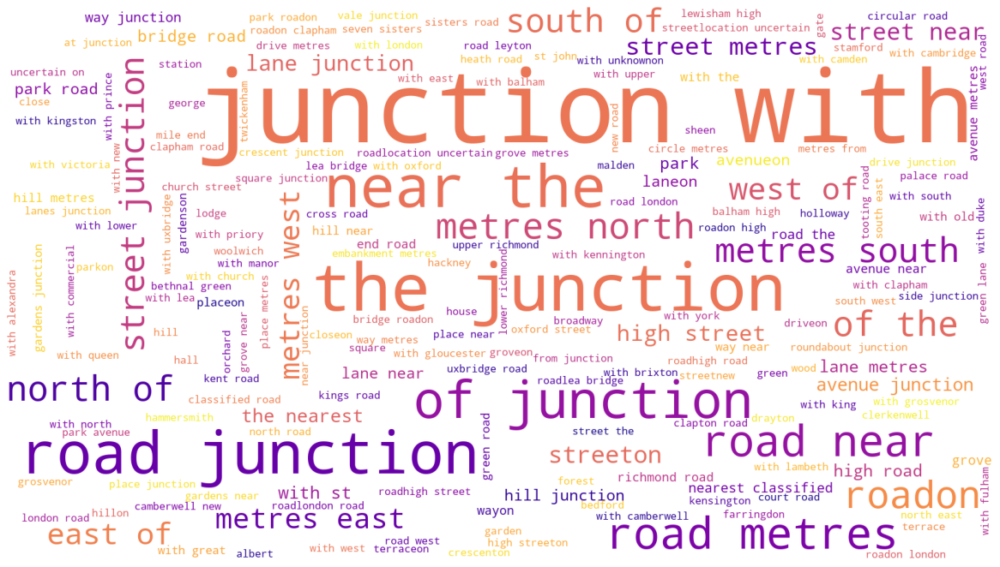

In [522]:
# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

### Tokenising the text data

In [523]:
# tokenising the text data
tokenised_sentence = sent_tokenize(all_location)

# Check the result.
print(tokenised_sentence)

['on ditches lane 1400 metres north of the junction with rook lanestarrock road junction with petworth closemead way 21 metres south of junction with tollers laneon harwoods garage brighton road near the junction with namain road 25 metres south of junction with lebanon gardensbrighton road 21 metres east of junction with woodplace laneportnalls road 500 metres south of junction with portnalls rise coulsdonon jail lane near the junction with the laurelssingle street junction with berrys hillon brighton road near the junction with marlpit lanelion green road 20 metres south east of junction with chisptead valley roadon main road near the junction with main roadon higher drive 30 metres north of the junction with cullesden rob2030 junction with windermere roadstoats nest road junction with windemere roadwoodcote grove road junction with the wenddowne road 0 metres south of junction with downe roadhigher drive junction with burcott roadjewels hill 100 metres west of junction with oaklands

In [524]:
# Tokenise the text data.
tokenised_word = word_tokenize(all_location)

# Check the result.
print(tokenised_word)

['on', 'ditches', 'lane', '1400', 'metres', 'north', 'of', 'the', 'junction', 'with', 'rook', 'lanestarrock', 'road', 'junction', 'with', 'petworth', 'closemead', 'way', '21', 'metres', 'south', 'of', 'junction', 'with', 'tollers', 'laneon', 'harwoods', 'garage', 'brighton', 'road', 'near', 'the', 'junction', 'with', 'namain', 'road', '25', 'metres', 'south', 'of', 'junction', 'with', 'lebanon', 'gardensbrighton', 'road', '21', 'metres', 'east', 'of', 'junction', 'with', 'woodplace', 'laneportnalls', 'road', '500', 'metres', 'south', 'of', 'junction', 'with', 'portnalls', 'rise', 'coulsdonon', 'jail', 'lane', 'near', 'the', 'junction', 'with', 'the', 'laurelssingle', 'street', 'junction', 'with', 'berrys', 'hillon', 'brighton', 'road', 'near', 'the', 'junction', 'with', 'marlpit', 'lanelion', 'green', 'road', '20', 'metres', 'south', 'east', 'of', 'junction', 'with', 'chisptead', 'valley', 'roadon', 'main', 'road', 'near', 'the', 'junction', 'with', 'main', 'roadon', 'higher', 'drive',

In [525]:
# Create a frequency distribution object.
freq_dist_of_words = FreqDist(tokenised_word)

# Show the five most common elements in the data set.
freq_dist_of_words.most_common(10)

[('junction', 11895),
 ('with', 11853),
 ('road', 6887),
 ('the', 4234),
 ('of', 3188),
 ('metres', 3156),
 ('near', 2945),
 ('street', 2125),
 ('roadon', 1481),
 ('north', 1159)]

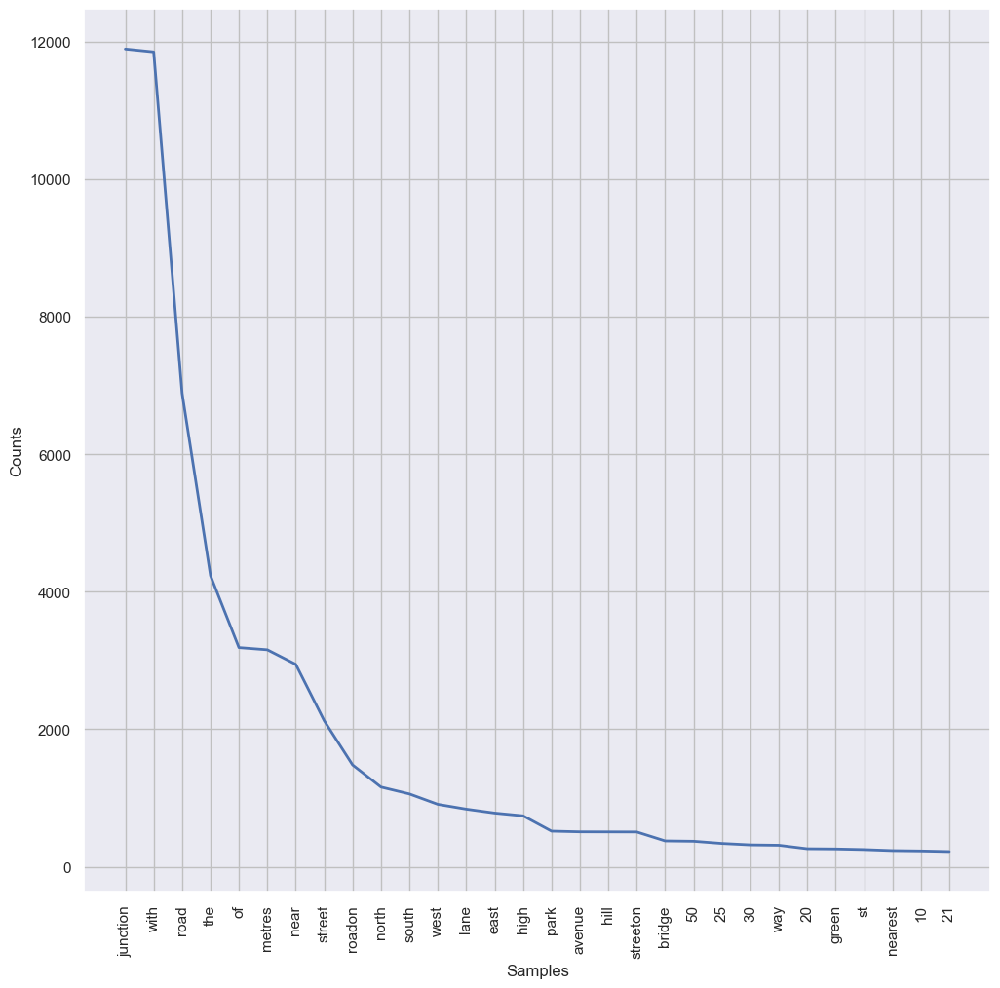

In [526]:
# Define the figure and axes.
fig, ax = plt.subplots(dpi=100)
fig.set_size_inches(12, 12)

# Plot the data set.
freq_dist_of_words.plot(30, cumulative=False)

# Display the result.
plt.show()

It appears that the location in which accidents commonly occur and/or reported in London are at junctions. 

Hence, one way to decrease the number of accidents would be to look into the sufficiency of infrastructures where accidents occured.

## Infrastructure

This section looks at the importance of infrastructure, the level of infrastructure and how infrastructure can effect cycling rates

In this part we use .csv files generated using R script to get infrastructure from TFL database.
We analyse the following infrastructure:
- parking capacity
- cycle lanes length:
    -  segregated fully and partially
    - cycle lanes and tracks along waterways and in the parks
- traffic calming measures (speed humps, road narrowing etc.)
- Advanced Stop Lines (ASL) length (junction safety)
- signal lights for cyclists (junction safety)
- crossings for cyclists (junction safety)

## Cycle Parking

In [527]:
# Read the provided CSV file: cycle_parking.csv.
cycle_parking = pd.read_csv('cycle_parking.csv') 

# View the DataFrame, types and shape of the data.
print(cycle_parking.shape)
print(cycle_parking.dtypes)
cycle_parking.head()

(23758, 22)
FEATURE_ID    object
SVDATE        object
PRK_CARR       int64
PRK_COVER      int64
PRK_SECURE     int64
PRK_LOCKER     int64
PRK_SHEFF      int64
PRK_MSTAND     int64
PRK_PSTAND     int64
PRK_HOOP       int64
PRK_POST       int64
PRK_BUTERF     int64
PRK_WHEEL      int64
PRK_HANGAR     int64
PRK_TIER       int64
PRK_OTHER      int64
PRK_PROVIS     int64
PRK_CPT        int64
BOROUGH       object
PHOTO1_URL    object
PHOTO2_URL    object
geometry      object
dtype: object


,FEATURE_ID,SVDATE,PRK_CARR,PRK_COVER,PRK_SECURE,PRK_LOCKER,PRK_SHEFF,PRK_MSTAND,PRK_PSTAND,PRK_HOOP,...,PRK_WHEEL,PRK_HANGAR,PRK_TIER,PRK_OTHER,PRK_PROVIS,PRK_CPT,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry
0,RWG014703,2017-09-07,0,0,0,0,0,0,0,0,...,0,1,0,0,1,6,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2427797672, 51.5103212773)"
1,RWG014704,2017-09-07,0,0,0,0,0,0,0,0,...,0,1,0,0,1,6,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2427846609, 51.5102610544)"
2,RWG014970,2017-06-20,0,0,0,0,1,0,0,0,...,0,0,0,0,1,2,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2405751224, 51.5014706358)"
3,RWG015506,2017-06-24,0,0,0,0,1,0,0,0,...,0,0,0,0,2,4,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2382877591, 51.5065007339)"
4,RWG015513,2017-09-07,0,0,0,0,1,0,0,0,...,0,0,0,0,2,4,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2384457427, 51.5062848196)"


In [528]:
# Determine whether there are missing values.
cycle_parking.isnull().sum()

FEATURE_ID    0
SVDATE        0
PRK_CARR      0
PRK_COVER     0
PRK_SECURE    0
PRK_LOCKER    0
PRK_SHEFF     0
PRK_MSTAND    0
PRK_PSTAND    0
PRK_HOOP      0
PRK_POST      0
PRK_BUTERF    0
PRK_WHEEL     0
PRK_HANGAR    0
PRK_TIER      0
PRK_OTHER     0
PRK_PROVIS    0
PRK_CPT       0
BOROUGH       0
PHOTO1_URL    0
PHOTO2_URL    0
geometry      0
dtype: int64

In [529]:
# Determine the metadata of the data set.
cycle_parking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23758 entries, 0 to 23757
Data columns (total 22 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   FEATURE_ID  23758 non-null  object
 1   SVDATE      23758 non-null  object
 2   PRK_CARR    23758 non-null  int64 
 3   PRK_COVER   23758 non-null  int64 
 4   PRK_SECURE  23758 non-null  int64 
 5   PRK_LOCKER  23758 non-null  int64 
 6   PRK_SHEFF   23758 non-null  int64 
 7   PRK_MSTAND  23758 non-null  int64 
 8   PRK_PSTAND  23758 non-null  int64 
 9   PRK_HOOP    23758 non-null  int64 
 10  PRK_POST    23758 non-null  int64 
 11  PRK_BUTERF  23758 non-null  int64 
 12  PRK_WHEEL   23758 non-null  int64 
 13  PRK_HANGAR  23758 non-null  int64 
 14  PRK_TIER    23758 non-null  int64 
 15  PRK_OTHER   23758 non-null  int64 
 16  PRK_PROVIS  23758 non-null  int64 
 17  PRK_CPT     23758 non-null  int64 
 18  BOROUGH     23758 non-null  object
 19  PHOTO1_URL  23758 non-null  object
 20  PHOTO2

In [530]:
# Convert 'SVDATE' column to datetime dtype.
cycle_parking['SVDATE'] = pd.to_datetime(cycle_parking['SVDATE'])
# Check the types.
cycle_parking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23758 entries, 0 to 23757
Data columns (total 22 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   FEATURE_ID  23758 non-null  object        
 1   SVDATE      23758 non-null  datetime64[ns]
 2   PRK_CARR    23758 non-null  int64         
 3   PRK_COVER   23758 non-null  int64         
 4   PRK_SECURE  23758 non-null  int64         
 5   PRK_LOCKER  23758 non-null  int64         
 6   PRK_SHEFF   23758 non-null  int64         
 7   PRK_MSTAND  23758 non-null  int64         
 8   PRK_PSTAND  23758 non-null  int64         
 9   PRK_HOOP    23758 non-null  int64         
 10  PRK_POST    23758 non-null  int64         
 11  PRK_BUTERF  23758 non-null  int64         
 12  PRK_WHEEL   23758 non-null  int64         
 13  PRK_HANGAR  23758 non-null  int64         
 14  PRK_TIER    23758 non-null  int64         
 15  PRK_OTHER   23758 non-null  int64         
 16  PRK_PROVIS  23758 non-

In [531]:
# Determine the descriptive statistics of the data set.
cycle_parking.describe()

,PRK_CARR,PRK_COVER,PRK_SECURE,PRK_LOCKER,PRK_SHEFF,PRK_MSTAND,PRK_PSTAND,PRK_HOOP,PRK_POST,PRK_BUTERF,PRK_WHEEL,PRK_HANGAR,PRK_TIER,PRK_OTHER,PRK_PROVIS,PRK_CPT
count,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000,23758.000000
mean,0.032747,0.050678,0.008418,0.010817,0.738446,0.035525,0.004967,0.103039,0.001052,0.009386,0.006903,0.039187,0.004209,0.049541,2.846999,6.142857
std,0.177977,0.219343,0.091366,0.103445,0.439490,0.185106,0.070301,0.304016,0.032422,0.096429,0.082798,0.194043,0.064742,0.217000,3.340991,6.894307
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,4.000000
75%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,95.000000,168.000000


In [532]:
# Import and sense-check the boroughs.csv data set as boroughs.
boroughs = pd.read_csv('boroughs.csv') 

# View the DataFrame, shape and type of data.
print(boroughs.shape)
print(boroughs.dtypes)
boroughs.head()

(33, 2)
BOROUGH    object
Area       object
dtype: object


,BOROUGH,Area
0,Camden,Inner
1,City of London,Inner
2,Hackney,Inner
3,Hammersmith & Fulham,Inner
4,Haringey,Inner


In [533]:
# Merge to add information about Inner/Outer area of London with the cycle_parking.
cycle_parking = pd.merge(cycle_parking, boroughs, how='left', on = 'BOROUGH')

# View the result.
cycle_parking.head()

,FEATURE_ID,SVDATE,PRK_CARR,PRK_COVER,PRK_SECURE,PRK_LOCKER,PRK_SHEFF,PRK_MSTAND,PRK_PSTAND,PRK_HOOP,...,PRK_HANGAR,PRK_TIER,PRK_OTHER,PRK_PROVIS,PRK_CPT,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,Area
0,RWG014703,2017-09-07,0,0,0,0,0,0,0,0,...,1,0,0,1,6,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2427797672, 51.5103212773)",Inner
1,RWG014704,2017-09-07,0,0,0,0,0,0,0,0,...,1,0,0,1,6,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2427846609, 51.5102610544)",Inner
2,RWG014970,2017-06-20,0,0,0,0,1,0,0,0,...,0,0,0,1,2,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2405751224, 51.5014706358)",Inner
3,RWG015506,2017-06-24,0,0,0,0,1,0,0,0,...,0,0,0,2,4,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2382877591, 51.5065007339)",Inner
4,RWG015513,2017-09-07,0,0,0,0,1,0,0,0,...,0,0,0,2,4,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG01...,https://cycleassetimages.data.tfl.gov.uk/RWG01...,"c(-0.2384457427, 51.5062848196)",Inner


<AxesSubplot:xlabel='SVDATE', ylabel='Count'>

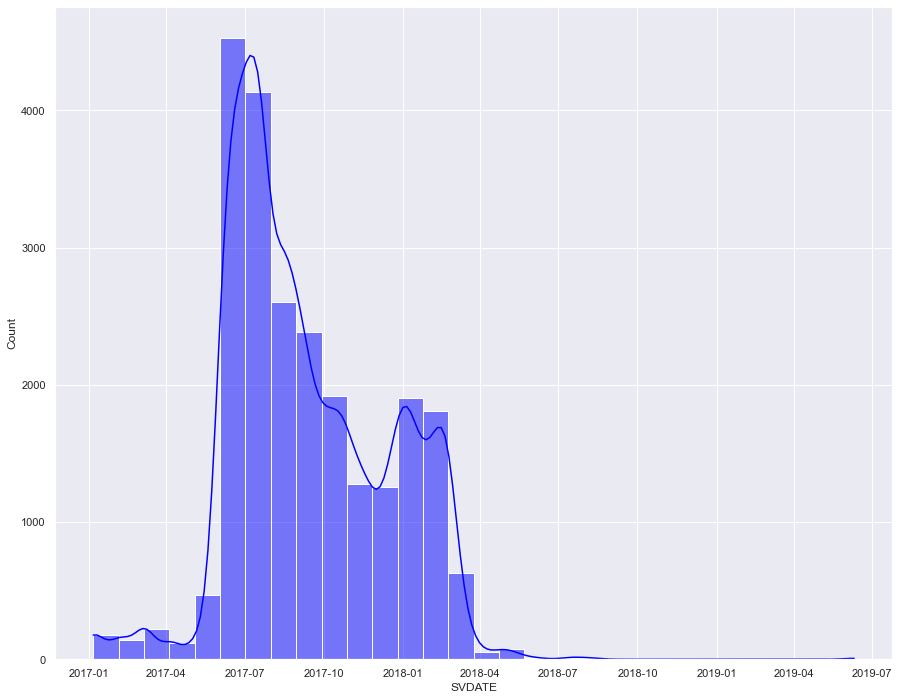

In [534]:
# Histogram to see the distribution of data.
sns.histplot(data = cycle_parking, x = 'SVDATE', color = 'blue', bins = 30, kde = True)

Note: most of the information about cycle lanes was updated in 2017. Most probably 2017 includes all cycle lanes built earlier and it is the first survey done by TFL.

In [535]:
# Determine boroughs WITH LARGEST cycle parking capacity in Inner and Outer London.
df_parking = cycle_parking.groupby(['Area', 'BOROUGH']) \
                                    ['PRK_CARR', 'PRK_COVER', 'PRK_LOCKER',
                                    'PRK_SHEFF', 'PRK_MSTAND', 'PRK_PSTAND',
                                    'PRK_HOOP', 'PRK_POST', 'PRK_BUTERF',
                                    'PRK_WHEEL', 'PRK_HANGAR', 'PRK_TIER',
                                    'PRK_OTHER', 'PRK_PROVIS', 'PRK_CPT'].sum() \
                            .reset_index() \
                            .sort_values(by= ['Area', 'PRK_CPT'])
df_parking.head()

,Area,BOROUGH,PRK_CARR,PRK_COVER,PRK_LOCKER,PRK_SHEFF,PRK_MSTAND,PRK_PSTAND,PRK_HOOP,PRK_POST,PRK_BUTERF,PRK_WHEEL,PRK_HANGAR,PRK_TIER,PRK_OTHER,PRK_PROVIS,PRK_CPT
1,Inner,City of London,2,14,0,273,0,0,11,0,2,9,0,1,8,1427,3046
4,Inner,Haringey,45,34,2,500,6,0,14,0,7,11,46,2,32,1424,3229
8,Inner,Lewisham,2,36,0,423,3,2,19,0,4,6,16,4,10,1630,3465
9,Inner,Newham,17,41,0,490,3,1,1,0,3,1,38,0,21,1974,4402
12,Inner,Wandsworth,4,53,5,618,39,1,37,4,17,9,5,0,22,2356,4879


In [536]:
# Overview summary statistics.
df_parking.describe()

,PRK_CARR,PRK_COVER,PRK_LOCKER,PRK_SHEFF,PRK_MSTAND,PRK_PSTAND,PRK_HOOP,PRK_POST,PRK_BUTERF,PRK_WHEEL,PRK_HANGAR,PRK_TIER,PRK_OTHER,PRK_PROVIS,PRK_CPT
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,23.575758,36.484848,7.787879,531.636364,25.575758,3.575758,74.181818,0.757576,6.757576,4.969697,28.212121,3.030303,35.666667,2049.666667,4422.484848
std,50.259968,18.267323,22.620176,356.866381,124.695136,12.031288,147.232056,1.768303,4.717191,3.860739,59.016818,3.745705,73.347489,1371.397204,2909.920243
min,0.000000,11.000000,0.000000,89.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,527.000000,1180.000000
25%,1.000000,23.000000,0.000000,288.000000,0.000000,0.000000,3.000000,0.000000,3.000000,2.000000,2.000000,0.000000,11.000000,1035.000000,2392.000000
50%,2.000000,36.000000,1.000000,423.000000,2.000000,0.000000,14.000000,0.000000,6.000000,4.000000,8.000000,2.000000,15.000000,1540.000000,3387.000000
75%,20.000000,48.000000,3.000000,668.000000,4.000000,2.000000,37.000000,0.000000,10.000000,7.000000,18.000000,4.000000,38.000000,2885.000000,5902.000000
max,243.000000,90.000000,103.000000,1448.000000,719.000000,68.000000,509.000000,7.000000,18.000000,14.000000,299.000000,15.000000,427.000000,5332.000000,12322.000000


- There are 33 boroughs in the dataframe.
- In average there are 2049 parking sites for 4422 cycles in every borough.
- Maximum number of parking sites is 5332.
- Sheffield stand is the most frequent kind of cycle parking in London's borough (mean of 531).
- Post stand has less than 1 mean value and the rarest in London (0.76)

In [537]:
# Export .csv with information on cycle parking by borough.
df_parking.to_csv('df_parking.csv')

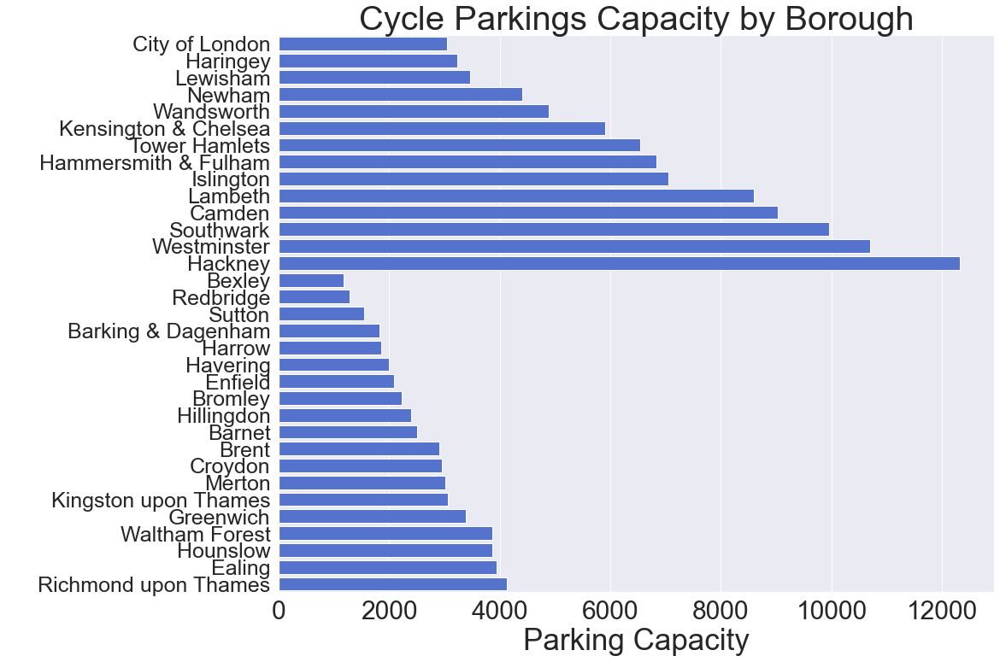

In [538]:
# Visualize the distribution of cycle capacity between boroues in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot showing the parking capacity for each borough.
b=sns.barplot(y='BOROUGH', x='PRK_CPT', data=df_parking, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Parking Capacity', fontsize=35)
b.set_title('Cycle Parkings Capacity by Borough', fontsize=40)
i=0

## Cycle Lanes

In [539]:
# Read the provided CSV file: cycle_lane.csv.
cycle_lane = pd.read_csv('cycle_lane.csv')

# View the DataFrame, types and shape of the data.
print(cycle_lane.shape)
print(cycle_lane.dtypes)
cycle_lane.head()

(24690, 24)
FEATURE_ID     object
SVDATE         object
CLT_CARR        int64
CLT_SEGREG      int64
CLT_STEPP       int64
CLT_PARSEG      int64
CLT_SHARED      int64
CLT_MANDAT      int64
CLT_ADVIS       int64
CLT_PRIORI      int64
CLT_CONTRA      int64
CLT_BIDIRE      int64
CLT_CBYPAS      int64
CLT_BBYPAS      int64
CLT_PARKR       int64
CLT_WATERR      int64
CLT_PTIME       int64
CLT_ACCESS     object
CLT_COLOUR     object
BOROUGH        object
PHOTO1_URL     object
PHOTO2_URL     object
geometry       object
length_m      float64
dtype: object


,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_PARKR,CLT_WATERR,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,length_m
0,RWG154837,2017-10-14,1,0,0,0,0,0,1,0,...,0,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1353420094, 0.1334807414, 51.57163711...",133.855087
1,RWG154839,2017-10-14,1,0,0,0,0,0,1,0,...,0,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1318879179, 0.1312756444, 0.130977767...",85.062151
2,RWG154848,2017-10-14,1,0,0,0,0,0,1,1,...,0,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1353045555, 0.1348398673, 0.134440865...",250.379093
3,RWG154853,2017-10-15,1,0,0,0,0,0,1,0,...,0,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.141811741, 0.1412961068, 51.572411971...",142.500994
4,RWG155003,2017-10-17,1,0,0,0,0,1,0,0,...,0,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1408697848, 0.1406946062, 0.140513785...",24.619673


In [540]:
# Determine whether there are missing values.
cycle_lane.isnull().sum()

FEATURE_ID    0
SVDATE        0
CLT_CARR      0
CLT_SEGREG    0
CLT_STEPP     0
CLT_PARSEG    0
CLT_SHARED    0
CLT_MANDAT    0
CLT_ADVIS     0
CLT_PRIORI    0
CLT_CONTRA    0
CLT_BIDIRE    0
CLT_CBYPAS    0
CLT_BBYPAS    0
CLT_PARKR     0
CLT_WATERR    0
CLT_PTIME     0
CLT_ACCESS    0
CLT_COLOUR    0
BOROUGH       0
PHOTO1_URL    0
PHOTO2_URL    0
geometry      0
length_m      0
dtype: int64

In [541]:
# Determine the metadata of the data set.
cycle_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24690 entries, 0 to 24689
Data columns (total 24 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   FEATURE_ID  24690 non-null  object 
 1   SVDATE      24690 non-null  object 
 2   CLT_CARR    24690 non-null  int64  
 3   CLT_SEGREG  24690 non-null  int64  
 4   CLT_STEPP   24690 non-null  int64  
 5   CLT_PARSEG  24690 non-null  int64  
 6   CLT_SHARED  24690 non-null  int64  
 7   CLT_MANDAT  24690 non-null  int64  
 8   CLT_ADVIS   24690 non-null  int64  
 9   CLT_PRIORI  24690 non-null  int64  
 10  CLT_CONTRA  24690 non-null  int64  
 11  CLT_BIDIRE  24690 non-null  int64  
 12  CLT_CBYPAS  24690 non-null  int64  
 13  CLT_BBYPAS  24690 non-null  int64  
 14  CLT_PARKR   24690 non-null  int64  
 15  CLT_WATERR  24690 non-null  int64  
 16  CLT_PTIME   24690 non-null  int64  
 17  CLT_ACCESS  24690 non-null  object 
 18  CLT_COLOUR  24690 non-null  object 
 19  BOROUGH     24690 non-nul

In [542]:
# Convert 'SVDATE' column to datetime dtype.
cycle_lane['SVDATE'] = pd.to_datetime(cycle_lane['SVDATE'])
# Check the types.
cycle_lane.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24690 entries, 0 to 24689
Data columns (total 24 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   FEATURE_ID  24690 non-null  object        
 1   SVDATE      24690 non-null  datetime64[ns]
 2   CLT_CARR    24690 non-null  int64         
 3   CLT_SEGREG  24690 non-null  int64         
 4   CLT_STEPP   24690 non-null  int64         
 5   CLT_PARSEG  24690 non-null  int64         
 6   CLT_SHARED  24690 non-null  int64         
 7   CLT_MANDAT  24690 non-null  int64         
 8   CLT_ADVIS   24690 non-null  int64         
 9   CLT_PRIORI  24690 non-null  int64         
 10  CLT_CONTRA  24690 non-null  int64         
 11  CLT_BIDIRE  24690 non-null  int64         
 12  CLT_CBYPAS  24690 non-null  int64         
 13  CLT_BBYPAS  24690 non-null  int64         
 14  CLT_PARKR   24690 non-null  int64         
 15  CLT_WATERR  24690 non-null  int64         
 16  CLT_PTIME   24690 non-

In [543]:
# Merge to add information about Inner/Outer area of London to the df.
cycle_lane = pd.merge(cycle_lane, boroughs, how='left', on = 'BOROUGH')
cycle_lane.head()

,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_WATERR,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,length_m,Area
0,RWG154837,2017-10-14,1,0,0,0,0,0,1,0,...,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1353420094, 0.1334807414, 51.57163711...",133.855087,Outer
1,RWG154839,2017-10-14,1,0,0,0,0,0,1,0,...,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1318879179, 0.1312756444, 0.130977767...",85.062151,Outer
2,RWG154848,2017-10-14,1,0,0,0,0,0,1,1,...,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1353045555, 0.1348398673, 0.134440865...",250.379093,Outer
3,RWG154853,2017-10-15,1,0,0,0,0,0,1,0,...,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.141811741, 0.1412961068, 51.572411971...",142.500994,Outer
4,RWG155003,2017-10-17,1,0,0,0,0,1,0,0,...,0,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1408697848, 0.1406946062, 0.140513785...",24.619673,Outer


In [544]:
# Add length in km to the dataframe.
cycle_lane['length_km'] = cycle_lane['length_m']/1000
cycle_lane.head()

,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,length_m,Area,length_km
0,RWG154837,2017-10-14,1,0,0,0,0,0,1,0,...,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1353420094, 0.1334807414, 51.57163711...",133.855087,Outer,0.133855
1,RWG154839,2017-10-14,1,0,0,0,0,0,1,0,...,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1318879179, 0.1312756444, 0.130977767...",85.062151,Outer,0.085062
2,RWG154848,2017-10-14,1,0,0,0,0,0,1,1,...,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1353045555, 0.1348398673, 0.134440865...",250.379093,Outer,0.250379
3,RWG154853,2017-10-15,1,0,0,0,0,0,1,0,...,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.141811741, 0.1412961068, 51.572411971...",142.500994,Outer,0.142501
4,RWG155003,2017-10-17,1,0,0,0,0,1,0,0,...,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1408697848, 0.1406946062, 0.140513785...",24.619673,Outer,0.024620


In [545]:
# Determine the descriptive statistics of the data set.
cycle_lane.describe()

,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_m,length_km
count,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000,24690.000000
mean,0.555853,0.077116,0.004212,0.142851,0.404820,0.073876,0.290117,0.090725,0.060186,0.407250,0.002552,0.005346,0.161320,0.022155,0.111219,115.819779,0.115820
std,0.496881,0.266781,0.064766,0.349928,0.490867,0.261574,0.453826,0.287223,0.237837,0.491332,0.050450,0.072924,0.367834,0.147190,0.314410,398.226822,0.398227
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.278985,0.000279
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.852690,0.015853
50%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.564727,0.043565
75%,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.450818,0.107451
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,19778.644986,19.778645


- 24690 cycles lanes defined in the dataframe.
- Average length of 115.82 meters.
- Maximum length of cycle lane is 19.78km.

<AxesSubplot:xlabel='SVDATE', ylabel='Count'>

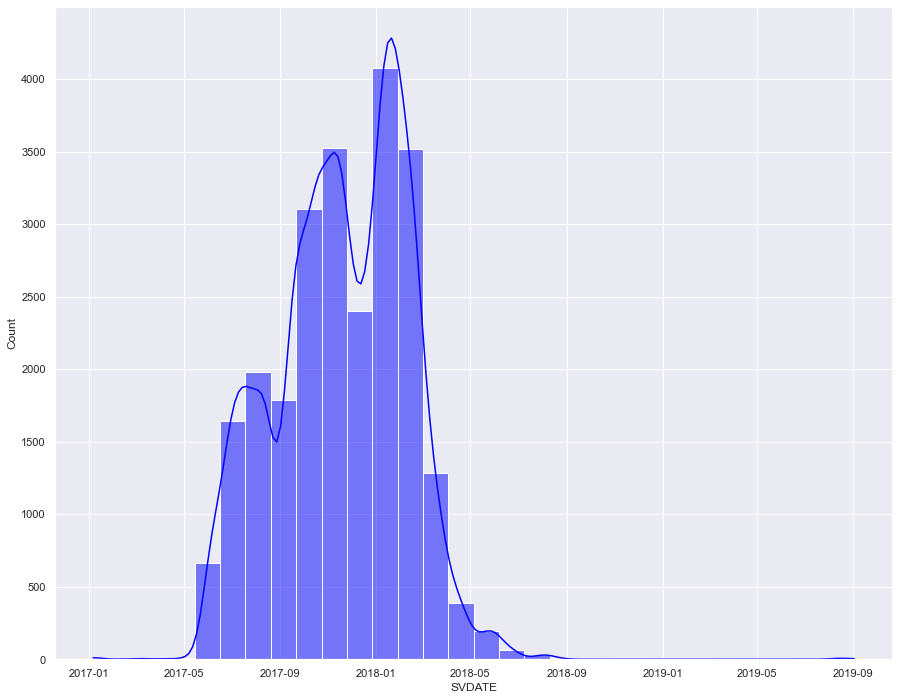

In [546]:
# Histogram to see the distribution.
sns.histplot(data = cycle_lane, x = 'SVDATE', color = 'blue', bins = 30, kde = True)

most of information created between May 2017 and May 2018.

In [547]:
# Determine boroughs with the longest cycle lanes available in Inner and Outer London.
df_cl = cycle_lane.groupby(['Area', 'BOROUGH']) \
                            ['CLT_CARR', 'CLT_SEGREG', 'CLT_STEPP', 'CLT_PARSEG',
                             'CLT_SHARED', 'CLT_MANDAT', 'CLT_ADVIS', 'CLT_PRIORI',
                             'CLT_CONTRA', 'CLT_BIDIRE', 'CLT_CBYPAS', 'CLT_BBYPAS',
                             'CLT_PARKR', 'CLT_WATERR', 
                             'CLT_PTIME', 'length_km'].sum().reset_index().sort_values(by=['Area', 'length_km'])
df_cl.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km
1,Inner,City of London,310,52,1,9,58,40,123,26,107,83,0,0,0,0,10,20.811776
6,Inner,Kensington & Chelsea,170,8,0,9,43,31,88,20,60,42,1,0,19,4,11,26.600216
5,Inner,Islington,512,85,3,33,278,48,200,40,75,139,1,2,76,7,142,41.866446
0,Inner,Camden,718,118,19,64,225,140,228,49,145,76,0,5,32,6,145,45.881350
13,Inner,Westminster,509,58,4,50,203,108,176,36,42,114,1,0,60,10,145,55.141315


In [548]:
# Overview summary statistics.
df_cl.describe()

,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,415.878788,57.696970,3.151515,106.878788,302.878788,55.272727,217.060606,67.878788,45.030303,304.696970,1.909091,4.000000,120.696970,16.575758,83.212121,86.654253
std,190.154831,34.421546,5.178810,80.264312,120.815137,38.000224,116.431026,43.542190,39.846961,143.560851,2.578319,7.062223,62.943171,17.106341,64.223125,31.804299
min,90.000000,2.000000,0.000000,9.000000,43.000000,4.000000,22.000000,5.000000,3.000000,42.000000,0.000000,0.000000,0.000000,0.000000,9.000000,20.811776
25%,294.000000,36.000000,0.000000,52.000000,225.000000,29.000000,111.000000,34.000000,10.000000,228.000000,0.000000,0.000000,76.000000,6.000000,29.000000,65.816011
50%,420.000000,52.000000,1.000000,88.000000,292.000000,40.000000,200.000000,60.000000,32.000000,291.000000,1.000000,1.000000,106.000000,10.000000,61.000000,88.488331
75%,512.000000,66.000000,3.000000,146.000000,369.000000,83.000000,299.000000,104.000000,75.000000,392.000000,2.000000,5.000000,167.000000,25.000000,142.000000,111.455532
max,796.000000,162.000000,19.000000,405.000000,545.000000,140.000000,487.000000,158.000000,145.000000,564.000000,9.000000,30.000000,235.000000,87.000000,256.000000,139.940911


In [549]:
# Export .csv with cycle lanes length by borough information.
df_cl.to_csv('df_cl.csv')

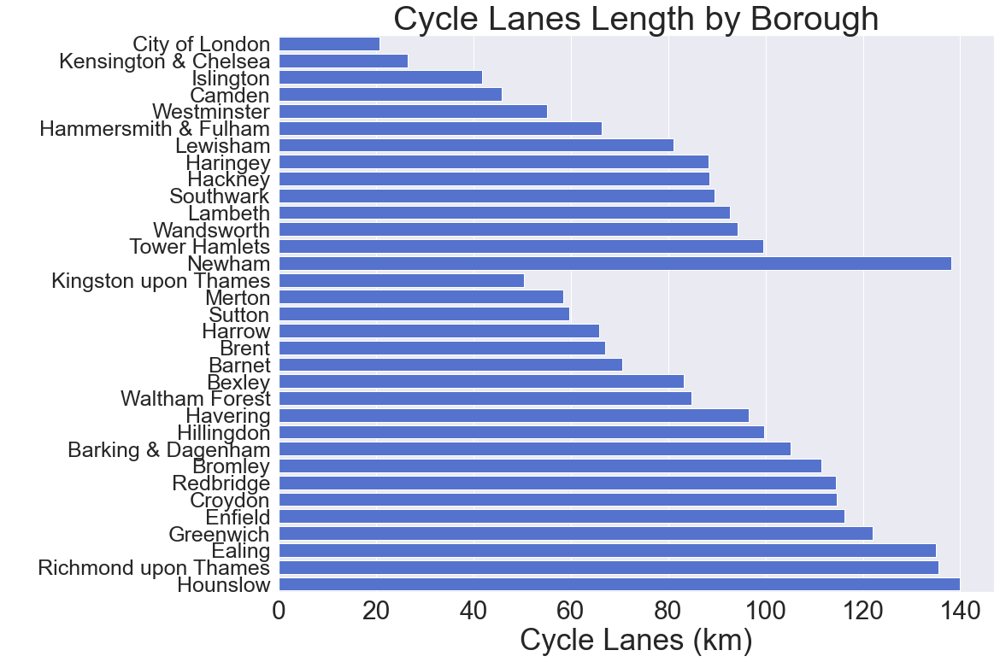

In [550]:
# Visualize the distribution of cycle lanes length between boroughs in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot with total cycle lanes length by boroughs in Inner and Outer London.
b=sns.barplot(y='BOROUGH', x='length_km', data=df_cl, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Cycle Lanes (km)', fontsize=35)
b.set_title('Cycle Lanes Length by Borough', fontsize=40)
i=0

# Investigate Partially Segregated Cycle Lanes.

In [551]:
# Create a df only for patially segregated cycle lanes.
segregate = cycle_lane[(cycle_lane['CLT_PARSEG'] != 0)]
segregate.head()

,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,length_m,Area,length_km
19,RWG154849,2017-10-15,1,0,0,1,0,0,0,0,...,0,not available,NONE,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1305244042, 0.1303930605, 51.56912227...",9.375293,Outer,0.009375
174,RWG149149,2017-09-19,1,0,0,1,0,1,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.0814313392, -0.0812211506, 51.636948...",23.967129,Outer,0.023967
175,RWG149150,2017-09-19,1,0,0,1,0,1,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.1049969981, -0.1048186428, -0.104654...",51.334770,Outer,0.051335
181,RWG149115,2017-09-17,1,0,0,1,0,1,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.0819586501, -0.0820243231, -0.082096...",119.646147,Outer,0.119646
183,RWG149117,2017-09-17,1,0,0,1,0,1,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.083622347, -0.0839279218, -0.0841402...",80.188739,Outer,0.080189


In [552]:
# Determine boroughs with the longest segregated or partially segregated cycle lanes available in Inner and Outer London.
df_seg = segregate.groupby(['Area', 'BOROUGH']) \
                           ['CLT_CARR', 'CLT_SEGREG', 'CLT_STEPP', 'CLT_PARSEG',
                             'CLT_SHARED', 'CLT_MANDAT', 'CLT_ADVIS', 'CLT_PRIORI',
                             'CLT_CONTRA', 'CLT_BIDIRE', 'CLT_CBYPAS', 'CLT_BBYPAS',
                             'CLT_PARKR', 'CLT_WATERR', 
                             'CLT_PTIME', 'length_km'].sum().reset_index().sort_values(by=['Area', 'length_km'])
df_seg.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km
1,Inner,City of London,4,0,0,9,0,0,0,0,0,9,0,0,0,0,0,0.276686
5,Inner,Islington,8,0,0,33,6,0,1,0,4,16,0,0,4,0,0,0.881073
6,Inner,Kensington & Chelsea,4,0,0,9,0,0,0,0,4,2,0,0,1,0,0,1.125628
7,Inner,Lambeth,10,0,0,52,2,1,3,0,4,17,3,0,2,0,0,2.029672
2,Inner,Hackney,1,0,0,47,3,0,1,0,2,28,0,0,4,0,0,2.609187


In [553]:
# Rename the column for the length of segregated cycle lanes.
df_seg.rename(columns={'length_km' : 'seg_length_km'}, inplace=True)
df_seg.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,seg_length_km
1,Inner,City of London,4,0,0,9,0,0,0,0,0,9,0,0,0,0,0,0.276686
5,Inner,Islington,8,0,0,33,6,0,1,0,4,16,0,0,4,0,0,0.881073
6,Inner,Kensington & Chelsea,4,0,0,9,0,0,0,0,4,2,0,0,1,0,0,1.125628
7,Inner,Lambeth,10,0,0,52,2,1,3,0,4,17,3,0,2,0,0,2.029672
2,Inner,Hackney,1,0,0,47,3,0,1,0,2,28,0,0,4,0,0,2.609187


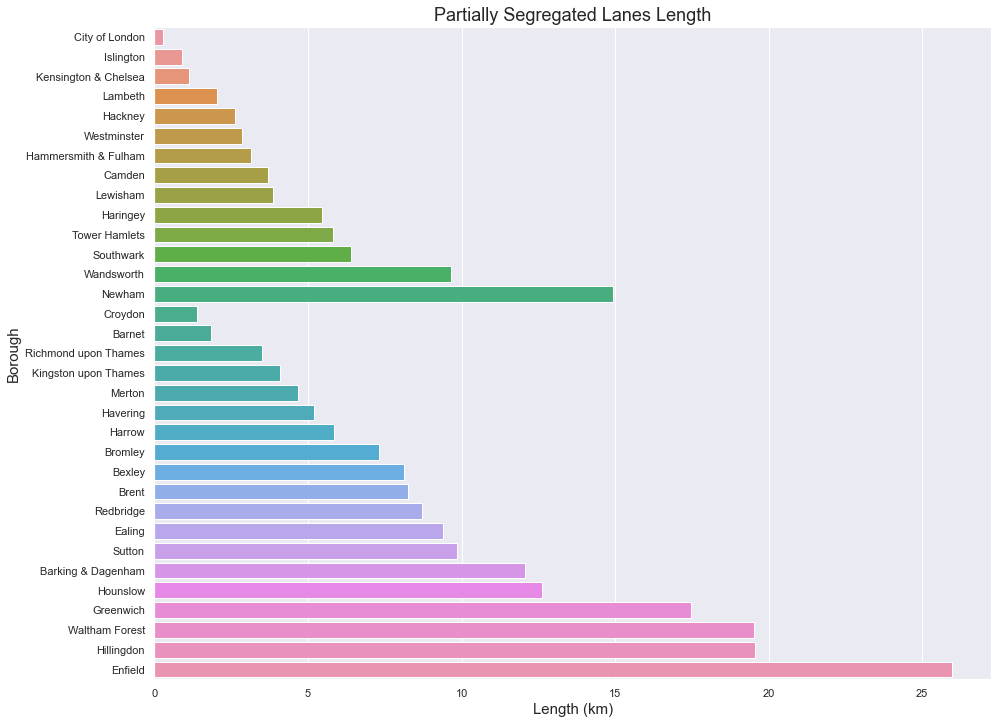

In [554]:
# Create a barplot for segregated lanes in Inner and Outer London.
b=sns.barplot(y='BOROUGH', x='seg_length_km', data=df_seg)

# Annotate the axes, labels and ticks.
b.set_xlabel('Length (km)', fontsize=15)
b.set_ylabel('Borough', fontsize=15)
b.set_title('Partially Segregated Lanes Length', fontsize=18)
sns.set_style('ticks',{'axes.grid' : True})
i=0

In [555]:
# Merge to add information about segregated lanes Inner/Outer area of London to the df.
df_cl_seg = pd.merge(df_cl, df_seg[['BOROUGH', 'seg_length_km']], on = 'BOROUGH')
df_cl_seg.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,seg_length_km
0,Inner,City of London,310,52,1,9,58,40,123,26,107,83,0,0,0,0,10,20.811776,0.276686
1,Inner,Kensington & Chelsea,170,8,0,9,43,31,88,20,60,42,1,0,19,4,11,26.600216,1.125628
2,Inner,Islington,512,85,3,33,278,48,200,40,75,139,1,2,76,7,142,41.866446,0.881073
3,Inner,Camden,718,118,19,64,225,140,228,49,145,76,0,5,32,6,145,45.881350,3.712710
4,Inner,Westminster,509,58,4,50,203,108,176,36,42,114,1,0,60,10,145,55.141315,2.840690


In [556]:
# Create a column with %-ge of segregated lanes out of total by borough.
df_cl_seg['Segregated %'] = df_cl_seg['seg_length_km']/df_cl_seg['length_km']*100
df_cl_seg = df_cl_seg.sort_values(by = ['Area', 'Segregated %'])
df_cl_seg.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,seg_length_km,Segregated %
0,Inner,City of London,310,52,1,9,58,40,123,26,107,83,0,0,0,0,10,20.811776,0.276686,1.329468
2,Inner,Islington,512,85,3,33,278,48,200,40,75,139,1,2,76,7,142,41.866446,0.881073,2.104485
10,Inner,Lambeth,796,106,13,52,471,105,292,92,82,240,8,10,160,4,256,92.613811,2.029672,2.191543
8,Inner,Hackney,400,61,0,47,369,18,87,5,124,242,0,0,147,26,173,88.488331,2.609187,2.948622
1,Inner,Kensington & Chelsea,170,8,0,9,43,31,88,20,60,42,1,0,19,4,11,26.600216,1.125628,4.231648


In [557]:
# General statistics.
df_cl_seg.describe()

,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,seg_length_km,Segregated %
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,415.878788,57.696970,3.151515,106.878788,302.878788,55.272727,217.060606,67.878788,45.030303,304.696970,1.909091,4.000000,120.696970,16.575758,83.212121,86.654253,7.521001,8.245160
std,190.154831,34.421546,5.178810,80.264312,120.815137,38.000224,116.431026,43.542190,39.846961,143.560851,2.578319,7.062223,62.943171,17.106341,64.223125,31.804299,6.196760,5.672782
min,90.000000,2.000000,0.000000,9.000000,43.000000,4.000000,22.000000,5.000000,3.000000,42.000000,0.000000,0.000000,0.000000,0.000000,9.000000,20.811776,0.276686,1.207943
25%,294.000000,36.000000,0.000000,52.000000,225.000000,29.000000,111.000000,34.000000,10.000000,228.000000,0.000000,0.000000,76.000000,6.000000,29.000000,65.816011,3.159275,4.748284
50%,420.000000,52.000000,1.000000,88.000000,292.000000,40.000000,200.000000,60.000000,32.000000,291.000000,1.000000,1.000000,106.000000,10.000000,61.000000,88.488331,5.830711,7.153604
75%,512.000000,66.000000,3.000000,146.000000,369.000000,83.000000,299.000000,104.000000,75.000000,392.000000,2.000000,5.000000,167.000000,25.000000,142.000000,111.455532,9.667435,10.261832
max,796.000000,162.000000,19.000000,405.000000,545.000000,140.000000,487.000000,158.000000,145.000000,564.000000,9.000000,30.000000,235.000000,87.000000,256.000000,139.940911,25.960354,23.017130


- On average only about 8.24% of all cycle lanes in London's borough is partially segregated.
- It is about 7.5km of partially segregated cycle lanes by borough. Maximum is 25.96km.
- Maximum is 23.02% of segregated lanes in one borough

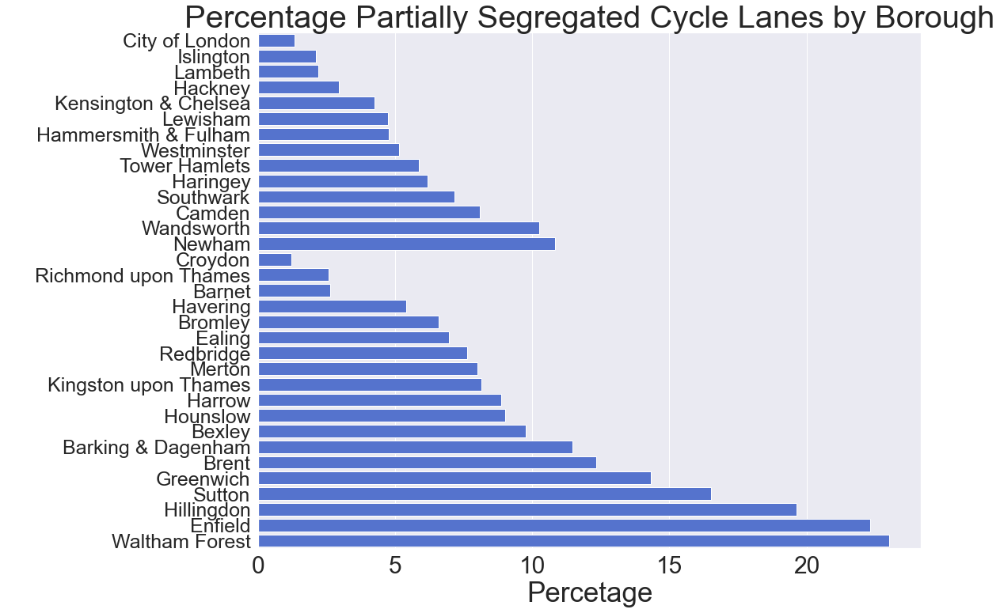

In [558]:
# Visualize share of segregated and partially segregated cycle lanes by borough among Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot to see the %-ge of segregated lanes out of total by borough.
b=sns.barplot(y='BOROUGH', x='Segregated %', data=df_cl_seg, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Percetage', fontsize=35)
b.set_title('Percentage Partially Segregated Cycle Lanes by Borough', fontsize=40)
i=0

In [559]:
# Export .csv with segregated partially cycle lanes length by borough information.
df_cl_seg.to_csv('df_cl_seg.csv')

# Investigate Fully Segregated Cycle Lanes 

In [560]:
# Create a df only for fully or patially segregated cycle lanes.
segregate_full = cycle_lane[(cycle_lane['CLT_SEGREG'] != 0)]
segregate_full.head()

,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,length_m,Area,length_km
118,RWG155561,2017-10-24,1,1,0,0,0,0,0,0,...,0,not available,GREEN,Barking & Dagenham,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(0.1634612039, 0.1635476983, 0.163570972...",23.417367,Outer,0.023417
416,RWG149683,2017-09-20,1,1,0,0,0,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.0910148879, -0.0909951557, 51.636408...",3.316372,Outer,0.003316
417,RWG149684,2017-09-20,1,1,0,0,0,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.0905636387, -0.0904706532, 51.636519...",6.506346,Outer,0.006506
418,RWG149686,2017-09-21,1,1,0,0,0,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.0815341517, -0.0813995754, 51.644747...",16.389542,Outer,0.016390
419,RWG276354,2017-09-21,1,1,0,0,0,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"list(c(-0.0902795186, -0.0904321589, 51.636368...",10.835360,Outer,0.010835


In [561]:
# Determine boroughs with the longest segregated or partially segregated cycle lanes available in Inner and Outer London.
df_seg_full = segregate_full.groupby(['Area', 'BOROUGH']) \
                           ['CLT_CARR', 'CLT_SEGREG', 'CLT_STEPP', 'CLT_PARSEG',
                             'CLT_SHARED', 'CLT_MANDAT', 'CLT_ADVIS', 'CLT_PRIORI',
                             'CLT_CONTRA', 'CLT_BIDIRE', 'CLT_CBYPAS', 'CLT_BBYPAS',
                             'CLT_PARKR', 'CLT_WATERR', 
                             'CLT_PTIME', 'length_km'].sum().reset_index().sort_values(by=['Area', 'length_km'])
df_seg_full.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km
6,Inner,Kensington & Chelsea,7,8,0,0,0,0,0,0,6,0,1,0,0,0,0,0.183730
3,Inner,Hammersmith & Fulham,22,23,0,0,0,0,0,0,13,4,0,0,0,0,0,0.459237
8,Inner,Lewisham,39,42,0,0,0,0,0,0,24,15,0,0,4,0,0,0.538591
4,Inner,Haringey,27,33,1,0,0,0,0,0,19,7,0,0,0,0,0,0.933287
2,Inner,Hackney,55,61,0,0,0,0,1,0,30,13,0,0,2,0,0,0.963485


In [562]:
# Rename the column for the length of segregated cycle lanes.
df_seg_full.rename(columns={'length_km' : 'seg_f_length_km'}, inplace=True)
df_seg_full.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,seg_f_length_km
6,Inner,Kensington & Chelsea,7,8,0,0,0,0,0,0,6,0,1,0,0,0,0,0.183730
3,Inner,Hammersmith & Fulham,22,23,0,0,0,0,0,0,13,4,0,0,0,0,0,0.459237
8,Inner,Lewisham,39,42,0,0,0,0,0,0,24,15,0,0,4,0,0,0.538591
4,Inner,Haringey,27,33,1,0,0,0,0,0,19,7,0,0,0,0,0,0.933287
2,Inner,Hackney,55,61,0,0,0,0,1,0,30,13,0,0,2,0,0,0.963485


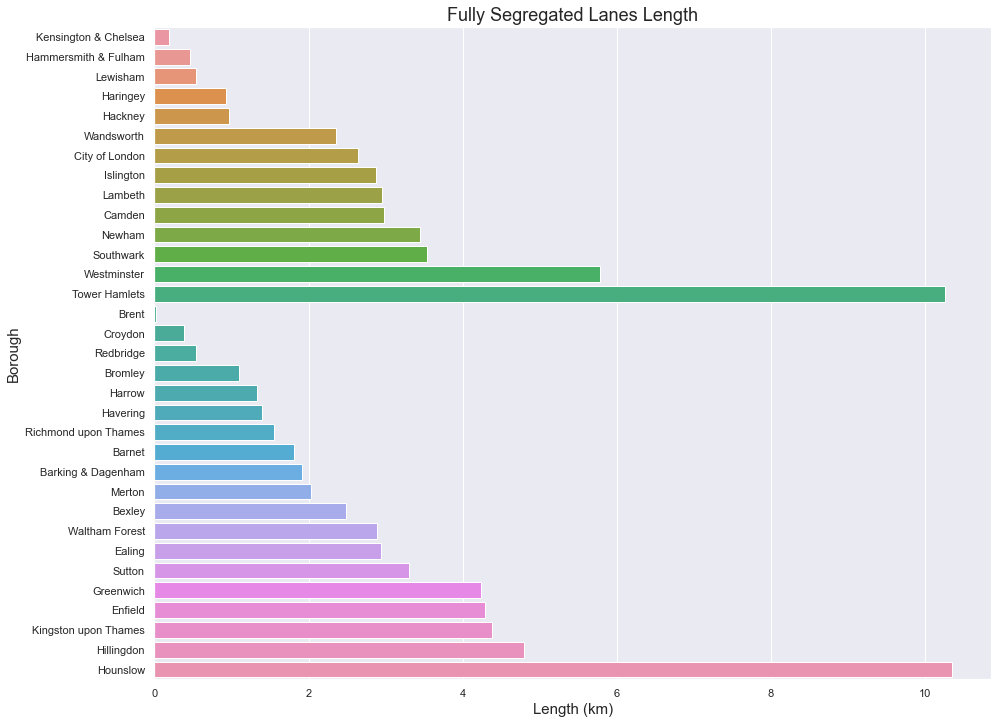

In [563]:
# Create a barplot for segregated lanes in Inner and Outer London.
b=sns.barplot(y='BOROUGH', x='seg_f_length_km', data=df_seg_full)

# Annotate the axes, labels and ticks.
b.set_xlabel('Length (km)', fontsize=15)
b.set_ylabel('Borough', fontsize=15)
b.set_title('Fully Segregated Lanes Length', fontsize=18)
sns.set_style('ticks',{'axes.grid' : True})
i=0

In [564]:
# Merge to add information about segregated lanes Inner/Outer area of London to the df.
df_cl_seg_full = pd.merge(df_cl, df_seg_full[['BOROUGH', 'seg_f_length_km']], on = 'BOROUGH')
df_cl_seg_full.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,seg_f_length_km
0,Inner,City of London,310,52,1,9,58,40,123,26,107,83,0,0,0,0,10,20.811776,2.646310
1,Inner,Kensington & Chelsea,170,8,0,9,43,31,88,20,60,42,1,0,19,4,11,26.600216,0.183730
2,Inner,Islington,512,85,3,33,278,48,200,40,75,139,1,2,76,7,142,41.866446,2.876882
3,Inner,Camden,718,118,19,64,225,140,228,49,145,76,0,5,32,6,145,45.881350,2.979783
4,Inner,Westminster,509,58,4,50,203,108,176,36,42,114,1,0,60,10,145,55.141315,5.788730


In [565]:
# Create a column with %-ge of segregated lanes out of total by borough.
df_cl_seg_full['Segregated %'] = df_cl_seg_full['seg_f_length_km']/df_cl_seg_full['length_km']*100
df_cl_seg_full = df_cl_seg_full.sort_values(by = ['Area', 'Segregated %'])
df_cl_seg_full.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,seg_f_length_km,Segregated %
6,Inner,Lewisham,332,42,0,57,429,35,102,26,62,338,0,0,230,19,153,81.176006,0.538591,0.663486
1,Inner,Kensington & Chelsea,170,8,0,9,43,31,88,20,60,42,1,0,19,4,11,26.600216,0.183730,0.690707
5,Inner,Hammersmith & Fulham,424,23,0,31,274,8,263,105,32,175,0,0,106,8,119,66.455247,0.459237,0.691048
7,Inner,Haringey,315,33,1,105,506,32,89,32,76,449,9,0,235,9,106,88.248793,0.933287,1.057564
8,Inner,Hackney,400,61,0,47,369,18,87,5,124,242,0,0,147,26,173,88.488331,0.963485,1.088827


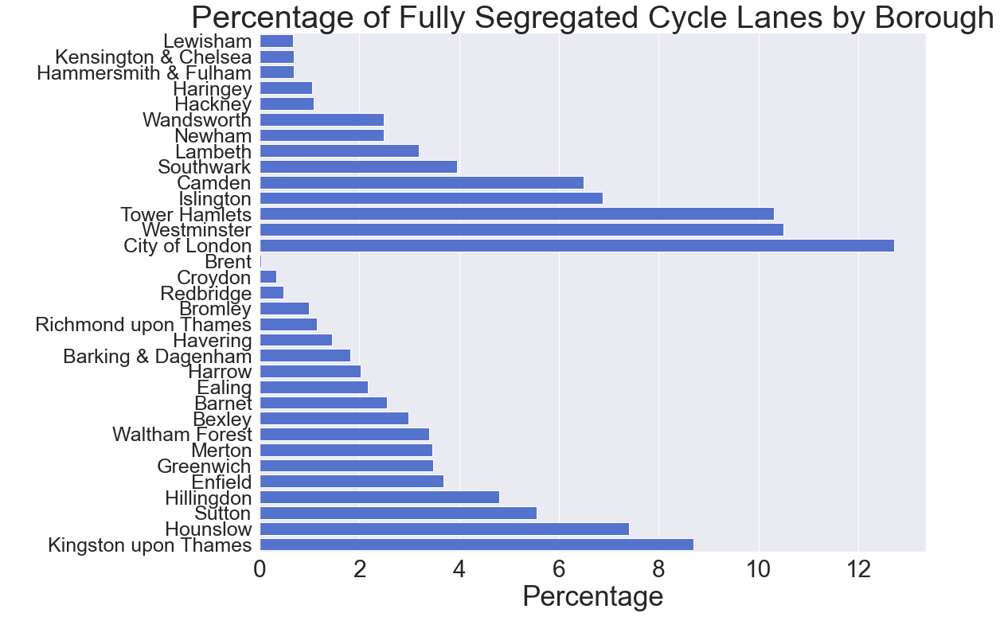

In [566]:
# Visualize share of segregated cycle lanes by borough among Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot to see the %-ge of segregated lanes out of total by borough.
b=sns.barplot(y='BOROUGH', x='Segregated %', data=df_cl_seg_full, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Percentage', fontsize=35)
b.set_title('Percentage of Fully Segregated Cycle Lanes by Borough', fontsize=40)
i=0

In [567]:
# General statistics.
df_cl_seg_full.describe()

,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,seg_f_length_km,Segregated %
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,415.878788,57.696970,3.151515,106.878788,302.878788,55.272727,217.060606,67.878788,45.030303,304.696970,1.909091,4.000000,120.696970,16.575758,83.212121,86.654253,2.777758,3.626224
std,190.154831,34.421546,5.178810,80.264312,120.815137,38.000224,116.431026,43.542190,39.846961,143.560851,2.578319,7.062223,62.943171,17.106341,64.223125,31.804299,2.421900,3.265006
min,90.000000,2.000000,0.000000,9.000000,43.000000,4.000000,22.000000,5.000000,3.000000,42.000000,0.000000,0.000000,0.000000,0.000000,9.000000,20.811776,0.021138,0.031541
25%,294.000000,36.000000,0.000000,52.000000,225.000000,29.000000,111.000000,34.000000,10.000000,228.000000,0.000000,0.000000,76.000000,6.000000,29.000000,65.816011,1.102853,1.088827
50%,420.000000,52.000000,1.000000,88.000000,292.000000,40.000000,200.000000,60.000000,32.000000,291.000000,1.000000,1.000000,106.000000,10.000000,61.000000,88.488331,2.489878,2.560933
75%,512.000000,66.000000,3.000000,146.000000,369.000000,83.000000,299.000000,104.000000,75.000000,392.000000,2.000000,5.000000,167.000000,25.000000,142.000000,111.455532,3.447382,4.806688
max,796.000000,162.000000,19.000000,405.000000,545.000000,140.000000,487.000000,158.000000,145.000000,564.000000,9.000000,30.000000,235.000000,87.000000,256.000000,139.940911,10.347685,12.715444


- On average only about 3.63% of all cycle lanes in one borough is fully segregated.
- It is about 2.78km of segregated cycle lanes by borough. Maximum is 10.35km.
- Maximum is 12.72% of fully segregated lanes in one borough.

In [568]:
# Export .csv with fully segregated cycle lanes length by borough information.
df_cl_seg_full.to_csv('df_cl_seg_full.csv')

# Investigate Cycle Lanes in the Parks or Along Waterways.

In [569]:
# Create a df only for cycle lanes in parks and along the riversides.
parks = cycle_lane[(cycle_lane['CLT_PARKR'] != 0) & (cycle_lane['CLT_CARR'] == 0) | (cycle_lane['CLT_WATERR'] != 0)]
parks.head()

,FEATURE_ID,SVDATE,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,...,CLT_PTIME,CLT_ACCESS,CLT_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,length_m,Area,length_km
559,RWG149763,2017-09-18,0,0,0,1,0,0,0,0,...,0,not available,RED,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.052688023, -0.052713642, -0.05272272...",146.483905,Outer,0.146484
560,RWG149764,2017-09-18,0,0,0,1,0,0,0,0,...,0,not available,RED,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG14...,https://cycleassetimages.data.tfl.gov.uk/RWG14...,"list(c(-0.0518417439, -0.0518291946, -0.051825...",4.149434,Outer,0.004149
579,RWG150240,2017-09-21,0,0,0,0,0,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.0383326002, -0.0386514142, -0.038874...",214.846447,Outer,0.214846
633,RWG187334,2017-09-21,0,0,0,0,1,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.0237004495, -0.0237925174, -0.023915...",219.928194,Outer,0.219928
634,RWG150247,2017-09-22,0,0,0,0,1,0,0,0,...,0,not available,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.0184346779, -0.01901299, -0.01917123...",258.530073,Outer,0.258530


In [570]:
# Determine boroughs with the longest cycle lanes in the parks or along watersides in London.
df_parks = parks.groupby(['Area', 'BOROUGH'])['CLT_CARR', 'CLT_SEGREG', 'CLT_STEPP', 'CLT_PARSEG',
                             'CLT_SHARED', 'CLT_MANDAT', 'CLT_ADVIS', 'CLT_PRIORI',
                             'CLT_CONTRA', 'CLT_BIDIRE', 'CLT_CBYPAS', 'CLT_BBYPAS',
                             'CLT_PARKR', 'CLT_WATERR', 
                             'CLT_PTIME', 'length_km'].sum().reset_index().sort_values(by=['Area', 'length_km'])
df_parks.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km
0,Inner,Camden,0,0,0,9,25,0,0,0,0,31,0,0,31,6,2,8.845096
4,Inner,Islington,0,2,1,4,77,0,0,0,0,83,0,0,76,7,0,9.593462
5,Inner,Kensington & Chelsea,0,0,0,1,20,0,0,0,1,21,0,0,18,4,5,11.961094
12,Inner,Westminster,0,0,0,3,33,0,0,0,0,32,0,0,31,10,8,19.833409
2,Inner,Hammersmith & Fulham,0,0,0,8,100,0,0,0,0,107,0,0,101,8,10,29.131812


In [571]:
# Rename the column for the length of cycle lanes in the parks or watersides.
df_parks.rename(columns={'length_km' : 'park_length_km'}, inplace=True)
df_parks.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,park_length_km
0,Inner,Camden,0,0,0,9,25,0,0,0,0,31,0,0,31,6,2,8.845096
4,Inner,Islington,0,2,1,4,77,0,0,0,0,83,0,0,76,7,0,9.593462
5,Inner,Kensington & Chelsea,0,0,0,1,20,0,0,0,1,21,0,0,18,4,5,11.961094
12,Inner,Westminster,0,0,0,3,33,0,0,0,0,32,0,0,31,10,8,19.833409
2,Inner,Hammersmith & Fulham,0,0,0,8,100,0,0,0,0,107,0,0,101,8,10,29.131812


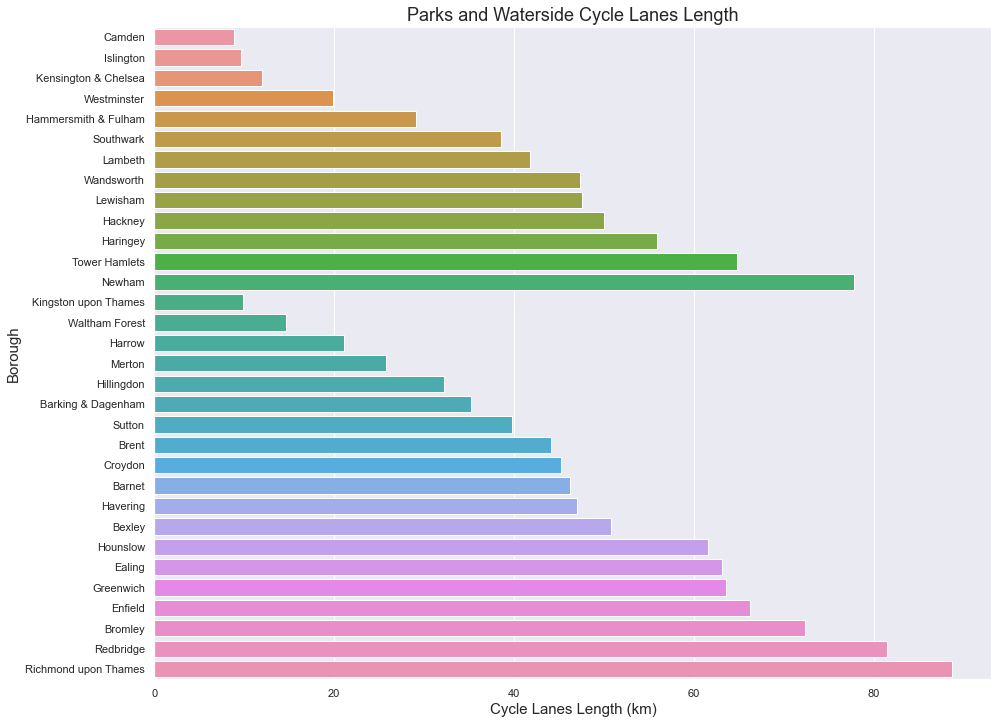

In [572]:
# Create a barplot for park and waterside lanes in Inner and Outer London.
b=sns.barplot(y='BOROUGH', x='park_length_km', data=df_parks)

# Annotate the axes, labels and ticks.
b.set_xlabel('Cycle Lanes Length (km)', fontsize=15)
b.set_ylabel('Borough', fontsize=15)
b.set_title('Parks and Waterside Cycle Lanes Length', fontsize=18)
sns.set_style('ticks',{'axes.grid' : True})
i=0

In [573]:
# Merge to add information about parks and waterside lanes Inner/Outer area of London to the df.
df_cl_parks = pd.merge(df_cl, df_parks[['BOROUGH', 'park_length_km']], on = 'BOROUGH')
df_cl_parks.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,park_length_km
0,Inner,Kensington & Chelsea,170,8,0,9,43,31,88,20,60,42,1,0,19,4,11,26.600216,11.961094
1,Inner,Islington,512,85,3,33,278,48,200,40,75,139,1,2,76,7,142,41.866446,9.593462
2,Inner,Camden,718,118,19,64,225,140,228,49,145,76,0,5,32,6,145,45.881350,8.845096
3,Inner,Westminster,509,58,4,50,203,108,176,36,42,114,1,0,60,10,145,55.141315,19.833409
4,Inner,Hammersmith & Fulham,424,23,0,31,274,8,263,105,32,175,0,0,106,8,119,66.455247,29.131812


In [574]:
# Create a column with %-ge of parks and waterside lanes out of total by borough.
df_cl_parks['Parks %'] = df_cl_parks['park_length_km']/df_cl_parks['length_km']*100
df_cl_parks = df_cl_parks.sort_values(by = ['Area', 'Parks %'])
df_cl_parks.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,park_length_km,Parks %
2,Inner,Camden,718,118,19,64,225,140,228,49,145,76,0,5,32,6,145,45.881350,8.845096,19.278194
1,Inner,Islington,512,85,3,33,278,48,200,40,75,139,1,2,76,7,142,41.866446,9.593462,22.914441
3,Inner,Westminster,509,58,4,50,203,108,176,36,42,114,1,0,60,10,145,55.141315,19.833409,35.968327
8,Inner,Southwark,759,92,1,93,426,135,286,82,112,286,1,6,134,9,186,89.563560,38.502335,42.988839
4,Inner,Hammersmith & Fulham,424,23,0,31,274,8,263,105,32,175,0,0,106,8,119,66.455247,29.131812,43.836738


In [575]:
# Check the summary statistics.
df_cl_parks.describe()

,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,park_length_km,Parks %
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.00000,32.000000,32.000000,32.00000,32.00000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000
mean,419.187500,57.875000,3.218750,109.937500,310.531250,55.750000,220.000000,69.18750,43.093750,311.625000,1.96875,4.12500,124.468750,17.093750,85.500000,88.711830,44.105605,47.865677
std,192.229943,34.956886,5.247023,79.570597,114.334254,38.507645,117.043416,43.57451,38.874786,140.141116,2.59633,7.13804,60.041912,17.115093,63.869827,29.998776,21.989914,15.433299
min,90.000000,2.000000,0.000000,9.000000,43.000000,4.000000,22.000000,5.00000,3.000000,42.000000,0.00000,0.00000,19.000000,0.000000,9.000000,26.600216,8.845096,17.275135
25%,282.750000,35.500000,0.000000,55.750000,229.500000,28.750000,110.250000,35.50000,9.750000,232.500000,0.00000,0.00000,79.750000,6.750000,36.500000,66.295438,28.275053,38.555666
50%,422.000000,50.000000,1.000000,90.500000,294.000000,41.500000,214.000000,69.50000,29.500000,294.500000,1.00000,1.00000,120.000000,11.000000,65.000000,89.025945,45.711003,47.664927
75%,514.000000,67.500000,3.250000,148.250000,383.250000,84.000000,299.500000,104.25000,72.750000,400.000000,2.00000,5.00000,167.250000,25.000000,142.750000,112.221748,61.934733,61.586176
max,796.000000,162.000000,19.000000,405.000000,545.000000,140.000000,487.000000,158.00000,145.000000,564.000000,9.00000,30.00000,235.000000,87.000000,256.000000,139.940911,88.644012,71.176755


- 32 boroughs (i.e. one has none cycle ways in park or along waterway)
- Average 47.87% of cycle lanes are located in the parks or along the waterways.
- Average length of such lanes is 44.10km.
- In one of the borough 71.18% of cycle lanes are located in the parks or along the waterways.

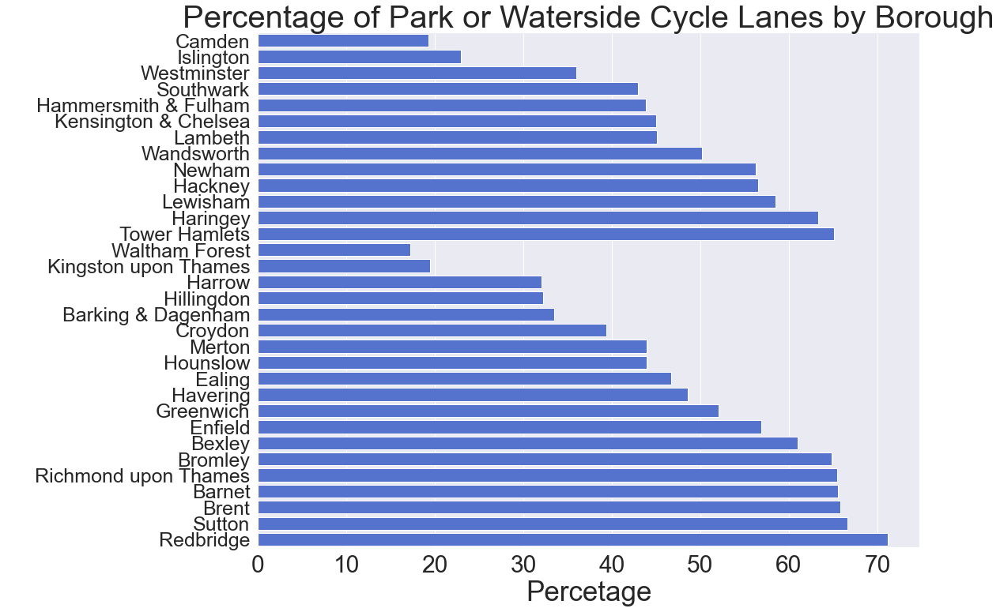

In [576]:
# Visualize %-ge of cycle lanes in the parks or along the waterways by borough in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot to see the %-ge of parks or waterside lanes out of total by borough.
b=sns.barplot(y='BOROUGH', x='Parks %', data=df_cl_parks, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Percetage', fontsize=35)
b.set_title('Percentage of Park or Waterside Cycle Lanes by Borough', fontsize=40)
i=0

In [577]:
# Create a separate view only for the boroughs in Outer London.
df_cl_parks_out = df_cl_parks[(df_cl_parks['Area'] == 'Outer')]
df_cl_parks_out.head()

,Area,BOROUGH,CLT_CARR,CLT_SEGREG,CLT_STEPP,CLT_PARSEG,CLT_SHARED,CLT_MANDAT,CLT_ADVIS,CLT_PRIORI,CLT_CONTRA,CLT_BIDIRE,CLT_CBYPAS,CLT_BBYPAS,CLT_PARKR,CLT_WATERR,CLT_PTIME,length_km,park_length_km,Parks %
20,Outer,Waltham Forest,501,46,2,200,151,33,377,158,75,197,4,17,44,7,46,84.811159,14.651242,17.275135
13,Outer,Kingston upon Thames,432,97,4,88,190,49,274,123,24,234,7,5,42,3,29,50.436164,9.819084,19.468339
16,Outer,Harrow,344,36,0,215,224,4,299,115,4,392,6,2,72,0,19,65.816011,21.129162,32.103376
22,Outer,Hillingdon,249,63,3,168,317,29,156,42,5,469,1,1,91,39,20,99.693894,32.155508,32.254240
23,Outer,Barking & Dagenham,420,38,0,146,296,32,301,123,21,335,1,2,94,8,58,105.235904,35.207247,33.455547


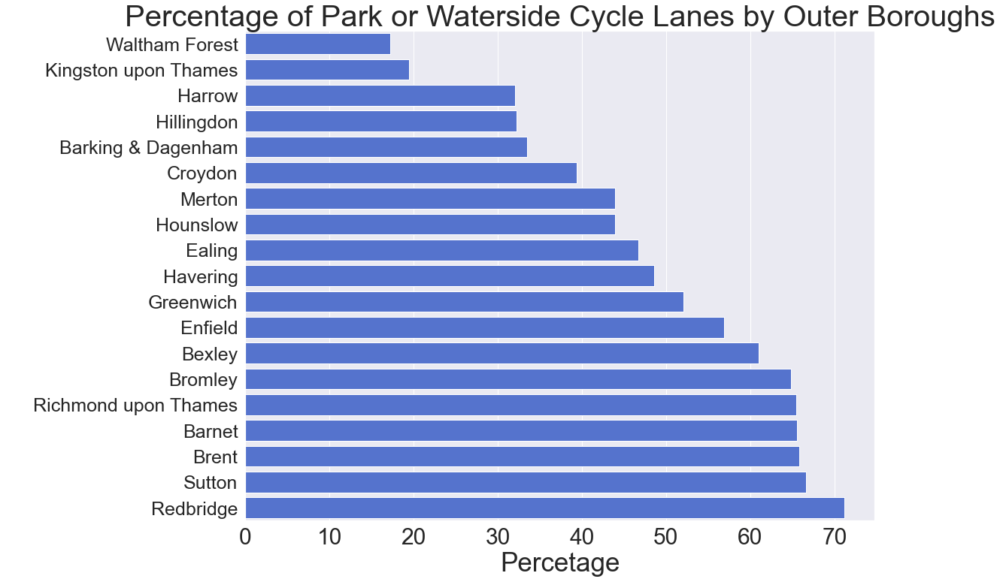

In [578]:
# Visualize %-ge of the cycle lanes in the parks or waterways in Outer London only.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot to see the %-ge of parks or waterside lanes out of total by borough in Outer London only.
b=sns.barplot(y='BOROUGH', x='Parks %', data=df_cl_parks_out, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Percetage', fontsize=35)
b.set_title('Percentage of Park or Waterside Cycle Lanes by Outer Boroughs', fontsize=40)
i=0

## Traffic Calming

In [579]:
# Read the provided CSV file: cycle_calm.csv.
cycle_calm = pd.read_csv('cycle_calm.csv')

# View the DataFrame, types and shape of the data.
print(cycle_calm.shape)
print(cycle_calm.dtypes)
cycle_calm.head()

(58565, 14)
FEATURE_ID    object
SVDATE        object
TRF_RAISED     int64
TRF_ENTRY      int64
TRF_CUSHI      int64
TRF_HUMP       int64
TRF_SINUSO     int64
TRF_BARIER     int64
TRF_NAROW      int64
TRF_CALM       int64
BOROUGH       object
PHOTO1_URL    object
PHOTO2_URL    object
geometry      object
dtype: object


,FEATURE_ID,SVDATE,TRF_RAISED,TRF_ENTRY,TRF_CUSHI,TRF_HUMP,TRF_SINUSO,TRF_BARIER,TRF_NAROW,TRF_CALM,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry
0,RWG001968,2017-05-29,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1741789436, 51.5553017001)"
1,RWG001970,2017-05-29,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1757749508, 51.5516771201)"
2,RWG001983,2017-05-30,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1761533961, 51.5556973953)"
3,RWG001985,2017-05-30,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1746229436, 51.5576445334)"
4,RWG002008,2017-05-30,1,0,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.146761597, 51.5486138321)"


In [580]:
# Determine whether there are missing values.
cycle_calm.isnull().sum()

FEATURE_ID    0
SVDATE        0
TRF_RAISED    0
TRF_ENTRY     0
TRF_CUSHI     0
TRF_HUMP      0
TRF_SINUSO    0
TRF_BARIER    0
TRF_NAROW     0
TRF_CALM      0
BOROUGH       0
PHOTO1_URL    0
PHOTO2_URL    0
geometry      0
dtype: int64

In [581]:
# Determine the metadata of the data set.
cycle_calm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58565 entries, 0 to 58564
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   FEATURE_ID  58565 non-null  object
 1   SVDATE      58565 non-null  object
 2   TRF_RAISED  58565 non-null  int64 
 3   TRF_ENTRY   58565 non-null  int64 
 4   TRF_CUSHI   58565 non-null  int64 
 5   TRF_HUMP    58565 non-null  int64 
 6   TRF_SINUSO  58565 non-null  int64 
 7   TRF_BARIER  58565 non-null  int64 
 8   TRF_NAROW   58565 non-null  int64 
 9   TRF_CALM    58565 non-null  int64 
 10  BOROUGH     58565 non-null  object
 11  PHOTO1_URL  58565 non-null  object
 12  PHOTO2_URL  58565 non-null  object
 13  geometry    58565 non-null  object
dtypes: int64(8), object(6)
memory usage: 6.3+ MB


In [582]:
# Convert 'SVDATE' column to datetime dtype.
cycle_calm['SVDATE'] = pd.to_datetime(cycle_calm['SVDATE'])
# Check the types.
cycle_calm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58565 entries, 0 to 58564
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   FEATURE_ID  58565 non-null  object        
 1   SVDATE      58565 non-null  datetime64[ns]
 2   TRF_RAISED  58565 non-null  int64         
 3   TRF_ENTRY   58565 non-null  int64         
 4   TRF_CUSHI   58565 non-null  int64         
 5   TRF_HUMP    58565 non-null  int64         
 6   TRF_SINUSO  58565 non-null  int64         
 7   TRF_BARIER  58565 non-null  int64         
 8   TRF_NAROW   58565 non-null  int64         
 9   TRF_CALM    58565 non-null  int64         
 10  BOROUGH     58565 non-null  object        
 11  PHOTO1_URL  58565 non-null  object        
 12  PHOTO2_URL  58565 non-null  object        
 13  geometry    58565 non-null  object        
dtypes: datetime64[ns](1), int64(8), object(5)
memory usage: 6.3+ MB


In [583]:
# Merge to add information about Inner/Outer area of London to the df.
cycle_calm = pd.merge(cycle_calm, boroughs, how='left', on = 'BOROUGH')
cycle_calm.head()

,FEATURE_ID,SVDATE,TRF_RAISED,TRF_ENTRY,TRF_CUSHI,TRF_HUMP,TRF_SINUSO,TRF_BARIER,TRF_NAROW,TRF_CALM,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,Area
0,RWG001968,2017-05-29,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1741789436, 51.5553017001)",Inner
1,RWG001970,2017-05-29,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1757749508, 51.5516771201)",Inner
2,RWG001983,2017-05-30,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1761533961, 51.5556973953)",Inner
3,RWG001985,2017-05-30,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1746229436, 51.5576445334)",Inner
4,RWG002008,2017-05-30,1,0,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.146761597, 51.5486138321)",Inner


<AxesSubplot:xlabel='SVDATE', ylabel='Count'>

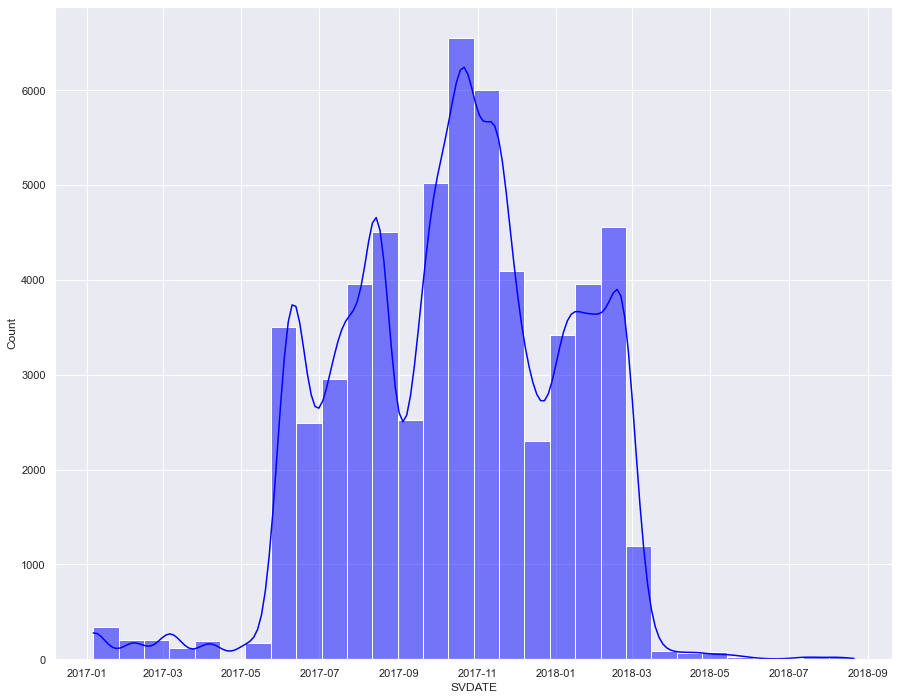

In [584]:
# Histogram to see the distribution.
sns.histplot(data = cycle_calm, x = 'SVDATE', color = 'blue', bins = 30, kde = True)

most of data included between July 2017 and March 2018

In [585]:
# Create additional column summing up all types of calming traffic measures.
cycle_calm['TOTAL_TRF'] = cycle_calm[['TRF_RAISED', 'TRF_ENTRY', 'TRF_CUSHI',
                                    'TRF_HUMP', 'TRF_SINUSO', 'TRF_BARIER',
                                    'TRF_NAROW', 'TRF_CALM']].sum(axis=1)
cycle_calm.head() 

,FEATURE_ID,SVDATE,TRF_RAISED,TRF_ENTRY,TRF_CUSHI,TRF_HUMP,TRF_SINUSO,TRF_BARIER,TRF_NAROW,TRF_CALM,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,Area,TOTAL_TRF
0,RWG001968,2017-05-29,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1741789436, 51.5553017001)",Inner,1
1,RWG001970,2017-05-29,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1757749508, 51.5516771201)",Inner,1
2,RWG001983,2017-05-30,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1761533961, 51.5556973953)",Inner,1
3,RWG001985,2017-05-30,0,1,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1746229436, 51.5576445334)",Inner,1
4,RWG002008,2017-05-30,1,0,0,0,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.146761597, 51.5486138321)",Inner,1


In [586]:
# Determine boroughs with the largest number of speed calming measures in Inner and Outer London.
df_calm = cycle_calm.groupby(['Area', 'BOROUGH']) \
                            ['TRF_RAISED', 'TRF_ENTRY', 'TRF_CUSHI',
                            'TRF_HUMP', 'TRF_SINUSO', 'TRF_BARIER',
                            'TRF_NAROW', 'TRF_CALM', 'TOTAL_TRF'].sum() \
                    .reset_index().sort_values(by=['Area', 'TOTAL_TRF'])
df_calm.head()

,Area,BOROUGH,TRF_RAISED,TRF_ENTRY,TRF_CUSHI,TRF_HUMP,TRF_SINUSO,TRF_BARIER,TRF_NAROW,TRF_CALM,TOTAL_TRF
1,Inner,City of London,19,111,0,29,8,18,3,2,190
6,Inner,Kensington & Chelsea,24,171,3,157,19,2,1,2,379
13,Inner,Westminster,63,227,17,373,49,28,2,6,765
3,Inner,Hammersmith & Fulham,50,283,705,272,45,24,25,4,1408
0,Inner,Camden,140,311,208,981,248,33,8,0,1929


In [587]:
# Overview the summary statistics.
df_calm.describe()

,TRF_RAISED,TRF_ENTRY,TRF_CUSHI,TRF_HUMP,TRF_SINUSO,TRF_BARIER,TRF_NAROW,TRF_CALM,TOTAL_TRF
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,84.000000,229.727273,382.606061,1008.212121,203.636364,28.333333,20.060606,21.848485,1978.424242
std,50.891429,129.469415,305.435543,635.046640,220.634004,17.515469,13.214432,16.822829,1106.674467
min,10.000000,21.000000,0.000000,29.000000,8.000000,2.000000,1.000000,0.000000,190.000000
25%,44.000000,123.000000,199.000000,577.000000,49.000000,17.000000,10.000000,7.000000,1081.000000
50%,68.000000,227.000000,339.000000,890.000000,117.000000,26.000000,18.000000,18.000000,1630.000000
75%,120.000000,311.000000,520.000000,1356.000000,253.000000,37.000000,27.000000,36.000000,3008.000000
max,204.000000,507.000000,1458.000000,2521.000000,908.000000,84.000000,51.000000,57.000000,4264.000000


- On average there are 1978 calming measuers per borough in London.
- Speed humps are the most frequent, average of 1008 per borough.
- Narrowings of the road to reduce speed is the rarest - 20 per borough.
- Maximum number of total calming measures is 4264 in one borough.

In [588]:
# Export .csv with information about calming measures by borough and by area.
df_calm.to_csv('df_calm.csv')

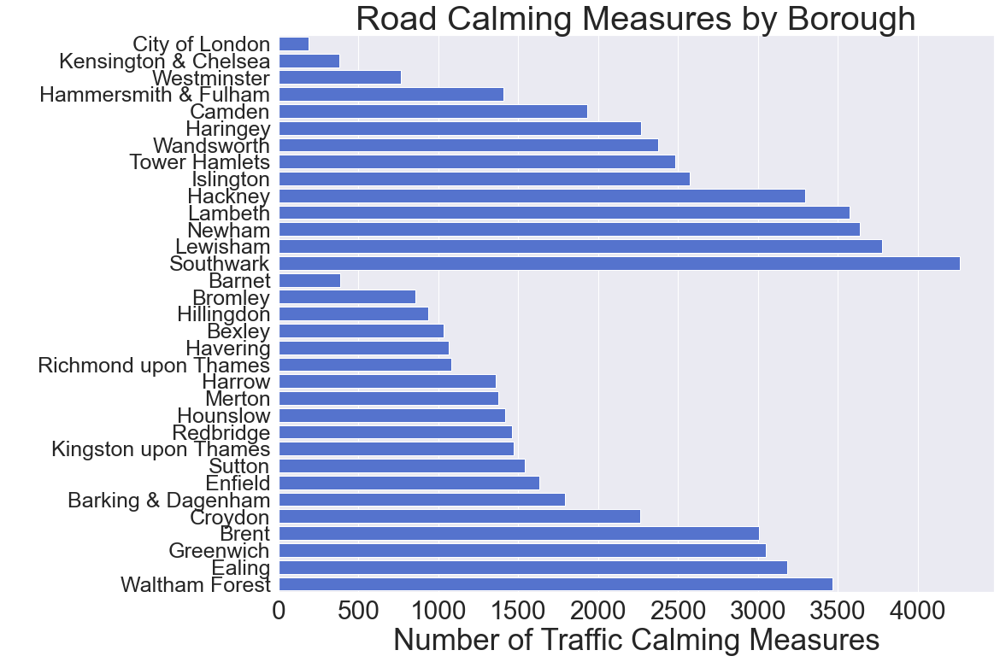

In [589]:
# Visualize the distribution of traffic calming measures between boroughs in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot to see all calming mesures by boroughs of inner and Outer London.
c=sns.barplot(y='BOROUGH', x='TOTAL_TRF', data=df_calm, color='royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
c.set_ylabel('Borough', fontsize=35, color = 'white')
c.set_xlabel('Number of Traffic Calming Measures', fontsize=35)
c.set_title('Road Calming Measures by Borough', fontsize=40)
i=0

## Advanced Stop Lines (ASL)

In [590]:
# Read the provided CSV file: cycle_asl.csv.
cycle_asl = pd.read_csv('cycle_asl.csv')

# View the DataFrame, types and shape of the data.
print(cycle_asl.shape)
print(cycle_asl.dtypes)
cycle_asl.head()

(3775, 13)
FEATURE_ID       object
SVDATE           object
ASL_FDR           int64
ASL_FDRLFT        int64
ASL_FDCENT        int64
ASL_FDRIGH        int64
ASL_SHARED        int64
ASL_COLOUR       object
BOROUGH          object
PHOTO1_URL       object
PHOTO2_URL       object
geometry         object
asl_length_m    float64
dtype: object


,FEATURE_ID,SVDATE,ASL_FDR,ASL_FDRLFT,ASL_FDCENT,ASL_FDRIGH,ASL_SHARED,ASL_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,asl_length_m
0,RWG276569,2018-03-07,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"c(-0.1092281318, -0.1091707856, 51.6179137048,...",3.990710
1,RWG276570,2018-03-09,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"c(-0.1098967152, -0.1098310271, 51.6157537853,...",4.611985
2,RWG276571,2018-03-09,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"c(-0.109366475, -0.1093217146, 51.6178078951, ...",4.380597
3,RWG150409,2017-09-19,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"c(-0.0954800686, -0.0953756273, 51.6320199482,...",8.264028
4,RWG150410,2017-09-20,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"c(-0.0600649014, -0.0601774558, 51.6448590734,...",7.766458


In [591]:
# Determine whether there are missing values.
cycle_asl.isnull().sum()

FEATURE_ID      0
SVDATE          0
ASL_FDR         0
ASL_FDRLFT      0
ASL_FDCENT      0
ASL_FDRIGH      0
ASL_SHARED      0
ASL_COLOUR      0
BOROUGH         0
PHOTO1_URL      0
PHOTO2_URL      0
geometry        0
asl_length_m    0
dtype: int64

In [592]:
# Determine the metadata of the data set.
cycle_calm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58565 entries, 0 to 58564
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   FEATURE_ID  58565 non-null  object        
 1   SVDATE      58565 non-null  datetime64[ns]
 2   TRF_RAISED  58565 non-null  int64         
 3   TRF_ENTRY   58565 non-null  int64         
 4   TRF_CUSHI   58565 non-null  int64         
 5   TRF_HUMP    58565 non-null  int64         
 6   TRF_SINUSO  58565 non-null  int64         
 7   TRF_BARIER  58565 non-null  int64         
 8   TRF_NAROW   58565 non-null  int64         
 9   TRF_CALM    58565 non-null  int64         
 10  BOROUGH     58565 non-null  object        
 11  PHOTO1_URL  58565 non-null  object        
 12  PHOTO2_URL  58565 non-null  object        
 13  geometry    58565 non-null  object        
 14  Area        58565 non-null  object        
 15  TOTAL_TRF   58565 non-null  int64         
dtypes: datetime64[ns](1), 

In [593]:
# Convert 'SVDATE' column to datetime dtype.
cycle_asl['SVDATE'] = pd.to_datetime(cycle_asl['SVDATE'])
# Check the types.
cycle_asl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3775 entries, 0 to 3774
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   FEATURE_ID    3775 non-null   object        
 1   SVDATE        3775 non-null   datetime64[ns]
 2   ASL_FDR       3775 non-null   int64         
 3   ASL_FDRLFT    3775 non-null   int64         
 4   ASL_FDCENT    3775 non-null   int64         
 5   ASL_FDRIGH    3775 non-null   int64         
 6   ASL_SHARED    3775 non-null   int64         
 7   ASL_COLOUR    3775 non-null   object        
 8   BOROUGH       3775 non-null   object        
 9   PHOTO1_URL    3775 non-null   object        
 10  PHOTO2_URL    3775 non-null   object        
 11  geometry      3775 non-null   object        
 12  asl_length_m  3775 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(5), object(6)
memory usage: 383.5+ KB


In [594]:
# Merge to add information about Inner/Outer area of London to the df.
cycle_asl = pd.merge(cycle_asl, boroughs, how='left', on = 'BOROUGH')
cycle_asl.head()

,FEATURE_ID,SVDATE,ASL_FDR,ASL_FDRLFT,ASL_FDCENT,ASL_FDRIGH,ASL_SHARED,ASL_COLOUR,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,asl_length_m,Area
0,RWG276569,2018-03-07,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"c(-0.1092281318, -0.1091707856, 51.6179137048,...",3.990710,Outer
1,RWG276570,2018-03-09,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"c(-0.1098967152, -0.1098310271, 51.6157537853,...",4.611985,Outer
2,RWG276571,2018-03-09,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG27...,https://cycleassetimages.data.tfl.gov.uk/RWG27...,"c(-0.109366475, -0.1093217146, 51.6178078951, ...",4.380597,Outer
3,RWG150409,2017-09-19,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"c(-0.0954800686, -0.0953756273, 51.6320199482,...",8.264028,Outer
4,RWG150410,2017-09-20,0,0,0,0,0,NONE,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"c(-0.0600649014, -0.0601774558, 51.6448590734,...",7.766458,Outer


<AxesSubplot:xlabel='SVDATE', ylabel='Count'>

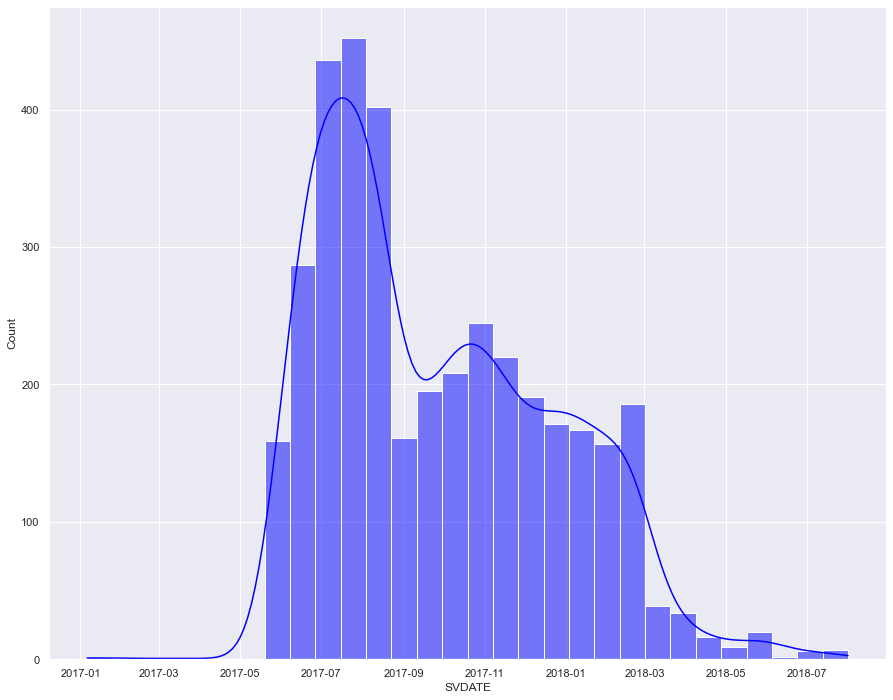

In [595]:
# Histogram to see the distribution.
sns.histplot(data = cycle_asl, x = 'SVDATE', color = 'blue', bins = 30, kde = True)

In [596]:
# Overview the statistics.
cycle_asl.describe()

,ASL_FDR,ASL_FDRLFT,ASL_FDCENT,ASL_FDRIGH,ASL_SHARED,asl_length_m
count,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000,3775.000000
mean,0.472318,0.449007,0.020662,0.007152,0.001854,4.588807
std,0.499299,0.497459,0.142270,0.084280,0.043027,1.217385
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.221646
25%,0.000000,0.000000,0.000000,0.000000,0.000000,3.891573
50%,0.000000,0.000000,0.000000,0.000000,0.000000,4.494096
75%,1.000000,1.000000,0.000000,0.000000,0.000000,5.074204
max,1.000000,1.000000,1.000000,1.000000,1.000000,20.571711


In [597]:
# Determine boroughs with the longest of ASL in Inner and Outer London. 
df_asl = cycle_asl.groupby(['Area', 'BOROUGH']) \
                            ['ASL_FDR', 'ASL_FDRLFT', 'ASL_FDCENT',
                            'ASL_FDRIGH', 'ASL_SHARED', 'asl_length_m'].sum() \
                        .reset_index().sort_values(by=['Area', 'asl_length_m'])
df_asl.head()

,Area,BOROUGH,ASL_FDR,ASL_FDRLFT,ASL_FDCENT,ASL_FDRIGH,ASL_SHARED,asl_length_m
6,Inner,Kensington & Chelsea,50,50,1,1,0,367.316204
4,Inner,Haringey,14,13,1,0,0,377.352841
3,Inner,Hammersmith & Fulham,45,42,1,3,0,379.818844
11,Inner,Tower Hamlets,59,59,0,0,0,525.496060
8,Inner,Lewisham,27,29,1,0,0,609.164892


In [598]:
# Overview summary statistics.
df_asl.describe()

,ASL_FDR,ASL_FDRLFT,ASL_FDCENT,ASL_FDRIGH,ASL_SHARED,asl_length_m
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,54.030303,51.363636,2.363636,0.818182,0.212121,524.931692
std,38.867149,36.721773,2.725094,1.685500,0.484612,376.268487
min,1.000000,1.000000,0.000000,0.000000,0.000000,27.150502
25%,27.000000,29.000000,0.000000,0.000000,0.000000,253.856426
50%,43.000000,41.000000,1.000000,0.000000,0.000000,423.912897
75%,68.000000,66.000000,3.000000,1.000000,0.000000,626.409370
max,145.000000,140.000000,10.000000,9.000000,2.000000,1595.787052


- Mean length of all ASLs per borough is 524.93 meters.
- Sum of longest ASLs is 1.6km in a borough.
- Most of ASL is Feeder lane left (54) - closest to the footlane and maximum of 145.
- The rarest is shared ASL (0.2 per botough).

In [599]:
# Export.csv file with ASL per borough and area details.
df_asl.to_csv('df_asl.csv')

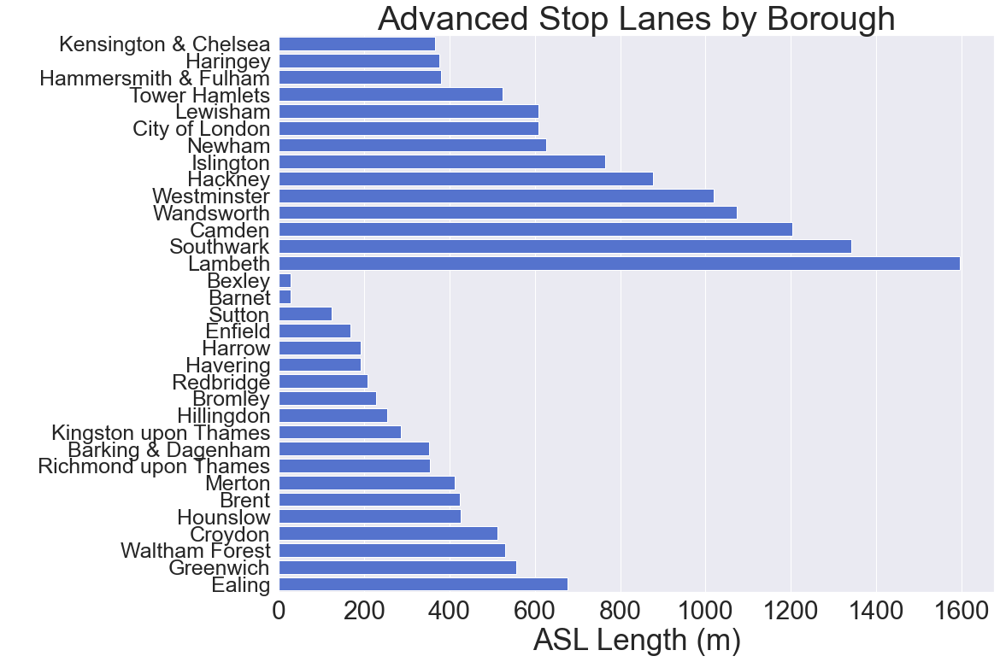

In [600]:
# Visualize the distribution of ASLs lengths between boroughs in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot.
c=sns.barplot(y='BOROUGH', x='asl_length_m', data=df_asl, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
c.set_ylabel('Borough', fontsize=35, color = 'white')
c.set_xlabel('ASL Length (m)', fontsize=35)
c.set_title('Advanced Stop Lanes by Borough', fontsize=40)
i=0

## Signals for Cycles

In [601]:
# Read the provided CSV file: cycle_signal.csv.
cycle_signal = pd.read_csv('cycle_signal.csv')

# View the DataFrame, types and shape of the data.
print(cycle_signal.shape)
print(cycle_signal.dtypes)
cycle_signal.head()

(443, 11)
FEATURE_ID    object
SVDATE        object
SIG_HEAD       int64
SIG_SEPARA     int64
SIG_EARLY      int64
SIG_TWOSTG     int64
SIG_GATE       int64
BOROUGH       object
PHOTO1_URL    object
PHOTO2_URL    object
geometry      object
dtype: object


,FEATURE_ID,SVDATE,SIG_HEAD,SIG_SEPARA,SIG_EARLY,SIG_TWOSTG,SIG_GATE,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry
0,RWG039736,2017-08-24,1,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG03...,https://cycleassetimages.data.tfl.gov.uk/RWG03...,"c(-0.1755857349, 51.5396791863)"
1,RWG039729,2017-07-06,1,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG03...,https://cycleassetimages.data.tfl.gov.uk/RWG03...,"c(-0.1759533843, 51.5396826444)"
2,RWG108125,2017-06-21,1,0,1,0,0,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG10...,https://cycleassetimages.data.tfl.gov.uk/RWG10...,"c(-0.2247455377, 51.5052380151)"
3,RWG001914,2017-05-31,1,1,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1526615341, 51.5437873193)"
4,RWG001915,2017-05-31,1,1,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1460845881, 51.5367136901)"


In [602]:
# Determine whether there are missing values.
cycle_signal.isnull().sum()

FEATURE_ID    0
SVDATE        0
SIG_HEAD      0
SIG_SEPARA    0
SIG_EARLY     0
SIG_TWOSTG    0
SIG_GATE      0
BOROUGH       0
PHOTO1_URL    0
PHOTO2_URL    0
geometry      0
dtype: int64

In [603]:
# Determine the metadata of the data set.
cycle_signal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 443 entries, 0 to 442
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   FEATURE_ID  443 non-null    object
 1   SVDATE      443 non-null    object
 2   SIG_HEAD    443 non-null    int64 
 3   SIG_SEPARA  443 non-null    int64 
 4   SIG_EARLY   443 non-null    int64 
 5   SIG_TWOSTG  443 non-null    int64 
 6   SIG_GATE    443 non-null    int64 
 7   BOROUGH     443 non-null    object
 8   PHOTO1_URL  443 non-null    object
 9   PHOTO2_URL  443 non-null    object
 10  geometry    443 non-null    object
dtypes: int64(5), object(6)
memory usage: 38.2+ KB


In [604]:
# Convert 'SVDATE' column to datetime dtype.
cycle_signal['SVDATE'] = pd.to_datetime(cycle_signal['SVDATE'])
# Check the types.
cycle_signal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 443 entries, 0 to 442
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   FEATURE_ID  443 non-null    object        
 1   SVDATE      443 non-null    datetime64[ns]
 2   SIG_HEAD    443 non-null    int64         
 3   SIG_SEPARA  443 non-null    int64         
 4   SIG_EARLY   443 non-null    int64         
 5   SIG_TWOSTG  443 non-null    int64         
 6   SIG_GATE    443 non-null    int64         
 7   BOROUGH     443 non-null    object        
 8   PHOTO1_URL  443 non-null    object        
 9   PHOTO2_URL  443 non-null    object        
 10  geometry    443 non-null    object        
dtypes: datetime64[ns](1), int64(5), object(5)
memory usage: 38.2+ KB


<AxesSubplot:xlabel='SVDATE', ylabel='Count'>

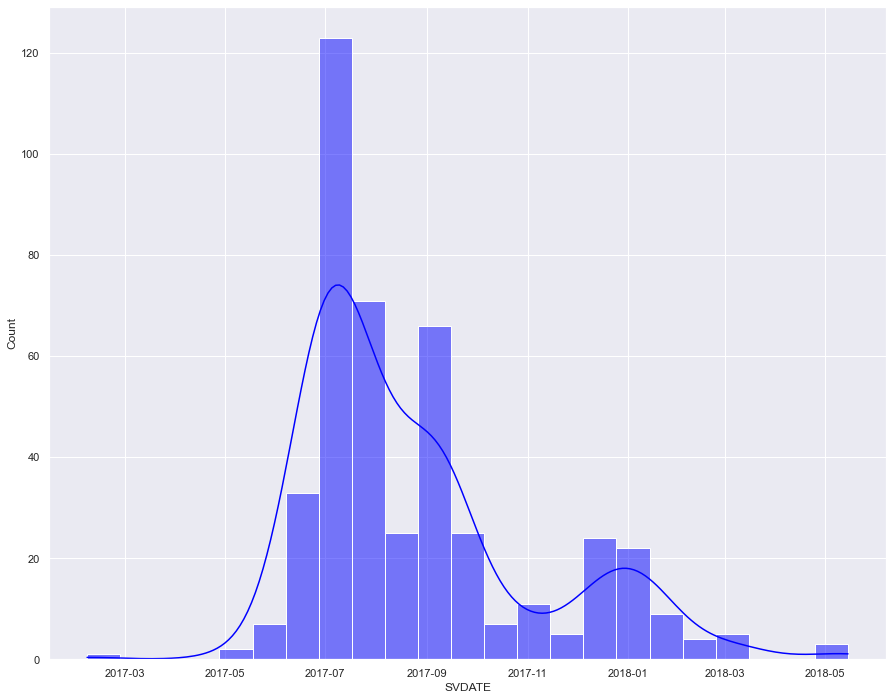

In [605]:
# Histogram to see the distribution.
sns.histplot(data = cycle_signal, x = 'SVDATE', color = 'blue', kde = True)

In [606]:
# Merge to add information about Inner/Outer area of London to the df.
cycle_signal = pd.merge(cycle_signal, boroughs, how='left', on = 'BOROUGH')
cycle_signal.head()

,FEATURE_ID,SVDATE,SIG_HEAD,SIG_SEPARA,SIG_EARLY,SIG_TWOSTG,SIG_GATE,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,Area
0,RWG039736,2017-08-24,1,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG03...,https://cycleassetimages.data.tfl.gov.uk/RWG03...,"c(-0.1755857349, 51.5396791863)",Inner
1,RWG039729,2017-07-06,1,0,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG03...,https://cycleassetimages.data.tfl.gov.uk/RWG03...,"c(-0.1759533843, 51.5396826444)",Inner
2,RWG108125,2017-06-21,1,0,1,0,0,Hammersmith & Fulham,https://cycleassetimages.data.tfl.gov.uk/RWG10...,https://cycleassetimages.data.tfl.gov.uk/RWG10...,"c(-0.2247455377, 51.5052380151)",Inner
3,RWG001914,2017-05-31,1,1,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1526615341, 51.5437873193)",Inner
4,RWG001915,2017-05-31,1,1,0,0,0,Camden,https://cycleassetimages.data.tfl.gov.uk/RWG00...,https://cycleassetimages.data.tfl.gov.uk/RWG00...,"c(-0.1460845881, 51.5367136901)",Inner


In [607]:
# Determine boroughs with the largest number of signals in London.
df_signal = cycle_signal.groupby(['Area', 'BOROUGH']) \
                                ['SIG_HEAD', 'SIG_SEPARA', 'SIG_EARLY',
                                'SIG_TWOSTG', 'SIG_GATE'].sum() \
                        .reset_index().sort_values(by=['Area', 'SIG_HEAD'])
df_signal.head()

,Area,BOROUGH,SIG_HEAD,SIG_SEPARA,SIG_EARLY,SIG_TWOSTG,SIG_GATE
7,Inner,Lewisham,1,1,0,0,0
3,Inner,Hammersmith & Fulham,3,0,1,0,0
5,Inner,Kensington & Chelsea,5,2,3,0,0
4,Inner,Islington,16,11,3,0,3
10,Inner,Wandsworth,17,12,0,1,2


In [608]:
# Overview summary statistics.
df_signal.describe()

,SIG_HEAD,SIG_SEPARA,SIG_EARLY,SIG_TWOSTG,SIG_GATE
count,23.000000,23.000000,23.000000,23.000000,23.000000
mean,19.043478,11.130435,3.478261,1.217391,1.217391
std,25.180220,16.515294,5.229893,3.059360,2.354040
min,1.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,1.000000,0.000000,0.000000,0.000000
50%,5.000000,2.000000,1.000000,0.000000,0.000000
75%,29.000000,12.500000,5.000000,0.500000,2.000000
max,96.000000,68.000000,20.000000,13.000000,11.000000


- 23 boroughs only.
- The most common is the signal with cycle sign on it (19 per borough).
- Maximum the borough has 11 signals.
- The rearest is two stages turn signal (1.2 per borough mean).

In [609]:
# Export.csv file with signal lights per borough and area details.
df_signal.to_csv('df_signal.csv')

Text(0.5, 1.0, 'Signal Lights with Cycle Sign by Borough')

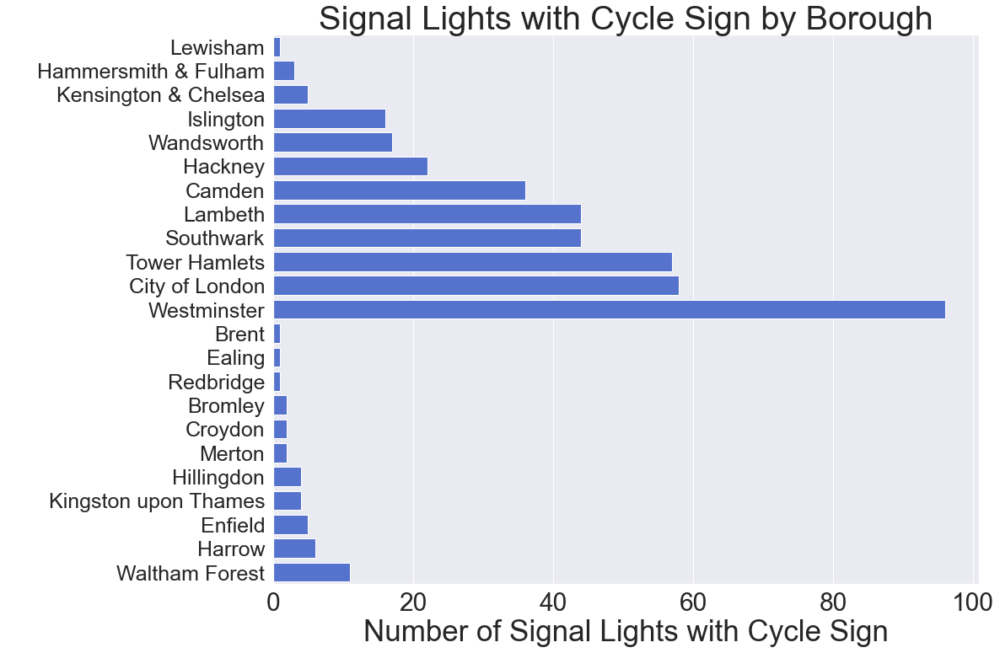

In [610]:
# Visualize the distribution of signal lights for cyclists between boroughs in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot.
c=sns.barplot(y='BOROUGH', x='SIG_HEAD', data=df_signal, color='royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
c.set_ylabel('Borough', fontsize=35, color = 'white')
c.set_xlabel('Number of Signal Lights with Cycle Sign', fontsize=35)
c.set_title('Signal Lights with Cycle Sign by Borough', fontsize=40)

# Crossings For Cycles.

In [611]:
# Read the provided CSV file: cycle_cross.csv.
cycle_cross = pd.read_csv('cycle_cross.csv')

# View the DataFrame, types and shape of the data.
print(cycle_cross.shape)
print(cycle_cross.dtypes)
cycle_cross.head()

(1687, 12)
FEATURE_ID         object
SVDATE             object
CRS_SIGNAL          int64
CRS_SEGREG          int64
CRS_CYGAP           int64
CRS_PEDEST          int64
CRS_LEVEL           int64
BOROUGH            object
PHOTO1_URL         object
PHOTO2_URL         object
geometry           object
cross_length_m    float64
dtype: object


,FEATURE_ID,SVDATE,CRS_SIGNAL,CRS_SEGREG,CRS_CYGAP,CRS_PEDEST,CRS_LEVEL,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,cross_length_m
0,RWG150471,2017-09-17,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.0813618204, -0.0814923292, 51.636843...",11.602453
1,RWG150537,2017-09-27,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.1237165558, -0.1237476924, 51.651697...",8.595692
2,RWG187222,2017-09-28,1,1,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.1097495774, -0.1097409659, 51.615594...",17.172971
3,RWG187223,2017-09-28,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.1019413172, -0.1018617852, -0.101791...",27.245645
4,RWG187224,2018-01-19,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.0457269989, -0.0458484188, 51.627070...",8.710514


In [612]:
# Check for missing values.
cycle_cross.isnull().sum()

FEATURE_ID        0
SVDATE            0
CRS_SIGNAL        0
CRS_SEGREG        0
CRS_CYGAP         0
CRS_PEDEST        0
CRS_LEVEL         0
BOROUGH           0
PHOTO1_URL        0
PHOTO2_URL        0
geometry          0
cross_length_m    0
dtype: int64

In [613]:
# Determine the metadata of the data set.
cycle_cross.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1687 entries, 0 to 1686
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   FEATURE_ID      1687 non-null   object 
 1   SVDATE          1687 non-null   object 
 2   CRS_SIGNAL      1687 non-null   int64  
 3   CRS_SEGREG      1687 non-null   int64  
 4   CRS_CYGAP       1687 non-null   int64  
 5   CRS_PEDEST      1687 non-null   int64  
 6   CRS_LEVEL       1687 non-null   int64  
 7   BOROUGH         1687 non-null   object 
 8   PHOTO1_URL      1687 non-null   object 
 9   PHOTO2_URL      1687 non-null   object 
 10  geometry        1687 non-null   object 
 11  cross_length_m  1687 non-null   float64
dtypes: float64(1), int64(5), object(6)
memory usage: 158.3+ KB


In [614]:
# Convert 'SVDATE' column to datetime dtype.
cycle_cross['SVDATE'] = pd.to_datetime(cycle_cross['SVDATE'])
# Check the types.
cycle_cross.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1687 entries, 0 to 1686
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   FEATURE_ID      1687 non-null   object        
 1   SVDATE          1687 non-null   datetime64[ns]
 2   CRS_SIGNAL      1687 non-null   int64         
 3   CRS_SEGREG      1687 non-null   int64         
 4   CRS_CYGAP       1687 non-null   int64         
 5   CRS_PEDEST      1687 non-null   int64         
 6   CRS_LEVEL       1687 non-null   int64         
 7   BOROUGH         1687 non-null   object        
 8   PHOTO1_URL      1687 non-null   object        
 9   PHOTO2_URL      1687 non-null   object        
 10  geometry        1687 non-null   object        
 11  cross_length_m  1687 non-null   float64       
dtypes: datetime64[ns](1), float64(1), int64(5), object(5)
memory usage: 158.3+ KB


In [615]:
# Merge to add information about Inner/Outer area of London to the df.
cycle_cross = pd.merge(cycle_cross, boroughs, how='left', on = 'BOROUGH')
cycle_cross.head()

,FEATURE_ID,SVDATE,CRS_SIGNAL,CRS_SEGREG,CRS_CYGAP,CRS_PEDEST,CRS_LEVEL,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,cross_length_m,Area
0,RWG150471,2017-09-17,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.0813618204, -0.0814923292, 51.636843...",11.602453,Outer
1,RWG150537,2017-09-27,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.1237165558, -0.1237476924, 51.651697...",8.595692,Outer
2,RWG187222,2017-09-28,1,1,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.1097495774, -0.1097409659, 51.615594...",17.172971,Outer
3,RWG187223,2017-09-28,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.1019413172, -0.1018617852, -0.101791...",27.245645,Outer
4,RWG187224,2018-01-19,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.0457269989, -0.0458484188, 51.627070...",8.710514,Outer


<AxesSubplot:xlabel='SVDATE', ylabel='Count'>

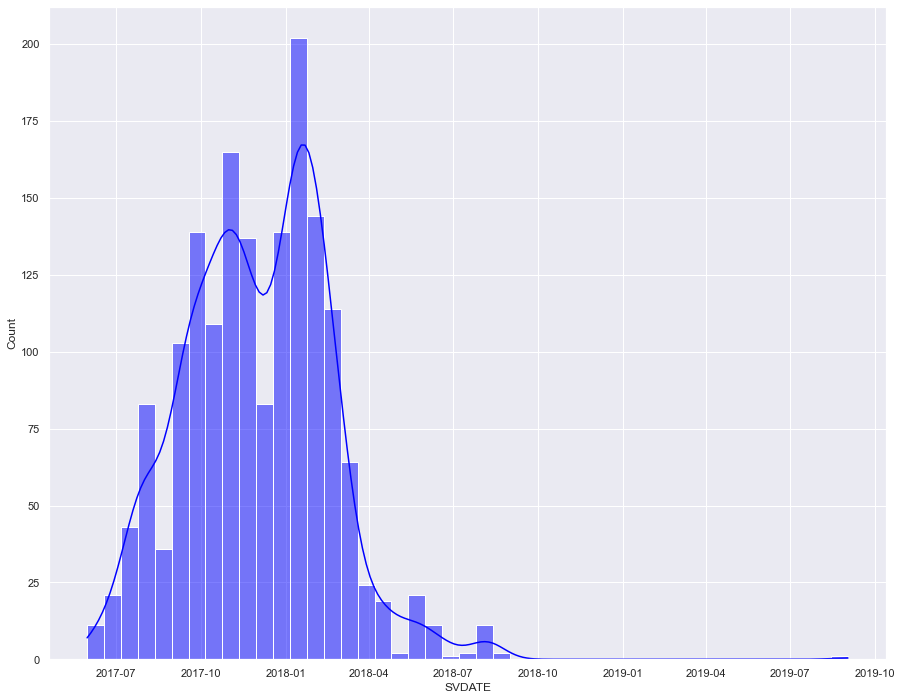

In [616]:
# Histogram to see the distribution.
sns.histplot(data = cycle_cross, x = 'SVDATE', color = 'blue', kde = True)

In [617]:
# Create a column to calculate total number of crossings for cyclists.
cycle_cross['TOTAL_CRS'] = cycle_cross[['CRS_SIGNAL', 'CRS_SEGREG', 
                                        'CRS_CYGAP','CRS_PEDEST', 'CRS_LEVEL']].sum(axis=1)
cycle_cross.head()

,FEATURE_ID,SVDATE,CRS_SIGNAL,CRS_SEGREG,CRS_CYGAP,CRS_PEDEST,CRS_LEVEL,BOROUGH,PHOTO1_URL,PHOTO2_URL,geometry,cross_length_m,Area,TOTAL_CRS
0,RWG150471,2017-09-17,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.0813618204, -0.0814923292, 51.636843...",11.602453,Outer,1
1,RWG150537,2017-09-27,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG15...,https://cycleassetimages.data.tfl.gov.uk/RWG15...,"list(c(-0.1237165558, -0.1237476924, 51.651697...",8.595692,Outer,1
2,RWG187222,2017-09-28,1,1,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.1097495774, -0.1097409659, 51.615594...",17.172971,Outer,2
3,RWG187223,2017-09-28,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.1019413172, -0.1018617852, -0.101791...",27.245645,Outer,1
4,RWG187224,2018-01-19,1,0,0,0,0,Enfield,https://cycleassetimages.data.tfl.gov.uk/RWG18...,https://cycleassetimages.data.tfl.gov.uk/RWG18...,"list(c(-0.0457269989, -0.0458484188, 51.627070...",8.710514,Outer,1


In [618]:
# Determine boroughs with the largest number of cyclists crossings by borough in Inner and Outer London.
df_cross = cycle_cross.groupby(['Area', 'BOROUGH']) \
                                ['CRS_SIGNAL', 'CRS_SEGREG', 'CRS_CYGAP',
                                'CRS_PEDEST', 'CRS_LEVEL', 'TOTAL_CRS'].sum() \
                        .reset_index().sort_values(by=['Area', 'TOTAL_CRS'])
df_cross.head()

,Area,BOROUGH,CRS_SIGNAL,CRS_SEGREG,CRS_CYGAP,CRS_PEDEST,CRS_LEVEL,TOTAL_CRS
6,Inner,Kensington & Chelsea,14,3,0,0,0,17
1,Inner,City of London,10,8,6,0,0,24
4,Inner,Haringey,29,3,2,0,0,34
5,Inner,Islington,15,12,8,0,0,35
8,Inner,Lewisham,34,3,0,0,0,37


In [619]:
# Overview summary statistics.
df_cross.describe()

,CRS_SIGNAL,CRS_SEGREG,CRS_CYGAP,CRS_PEDEST,CRS_LEVEL,TOTAL_CRS
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,38.000000,9.636364,3.757576,1.272727,0.606061,53.272727
std,19.369757,8.820495,4.279532,1.924720,2.794407,24.167738
min,10.000000,0.000000,0.000000,0.000000,0.000000,17.000000
25%,25.000000,3.000000,1.000000,0.000000,0.000000,35.000000
50%,39.000000,7.000000,2.000000,1.000000,0.000000,53.000000
75%,49.000000,12.000000,6.000000,1.000000,0.000000,66.000000
max,106.000000,34.000000,18.000000,8.000000,16.000000,118.000000


- Average number of crossings is 53 per borough.
- There are 118 crossigns in one of the boroughs.
- The most frequent is the signal controled crossing: 38 mean per borough.
- The rarest is the level crossing (0.6) crossing the railways.

In [620]:
# Export to .csv file with information about crossings per borough and area.
df_cross.to_csv('df_cross.csv')

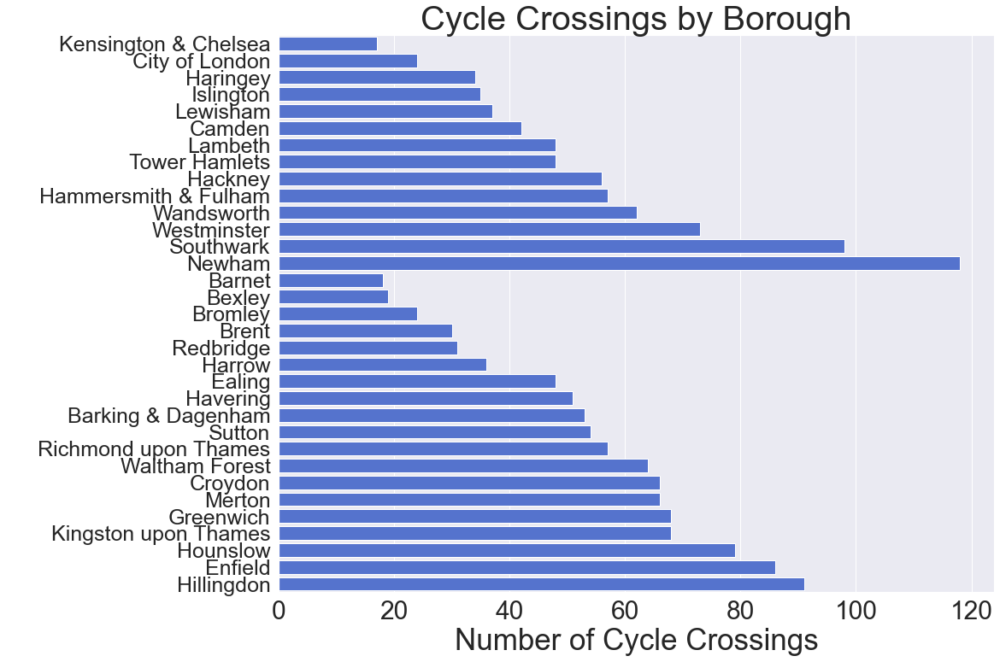

In [621]:
# Visualize the distribution of crossings for cyclists between boroughs in Inner and Outer London.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot for cyclist crossings by boroughs in Inner and Outer London.
c=sns.barplot(y='BOROUGH', x='TOTAL_CRS', data=df_cross, color='royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
c.set_ylabel('Borough', fontsize=35, color = 'white')
c.set_xlabel('Number of Cycle Crossings', fontsize=35)
c.set_title('Cycle Crossings by Borough', fontsize=40)
i=0

## Observations and Insights:

Conclusions:
- inequality found not only between Inner and Outer London infrastructure development, but also between boroughs within one area
- cycling traffic lights are almost don't exist in Outer London areas
- only about 8.24% of all cycle lanes is partially segregated
- only about 3% of al cycling lanes are fully separated
- traffic calming measures are the most widely spread
- Mini-Holland boroughs: Waltham Forest, Kensington upon Thames and Enfield all have similar kind of infrastructure development, however different level of cycling uptake, which leads us to looking into different factors and hypothesis about social factors.

Due to the disparity between the infrastructure in inner and outer london we wanted to take a look at data / analysis around residents and travel to work.

# Travel to Work

## Car related trends

### Annual vehicle kilometres (millions) and number of cars owned

#### Annual vehicle kilometres (millions)

In [622]:
# Read the provided CSV file/data set.            
cars = pd.read_csv('Annual vehicle kilometres (millions).csv')

# View DataFrame.
cars.head()

,Borough,Area,2014,2015,2016,2017,2018,2019,2020,2021
0,Camden,Inner,504,503,508,503,489,483,392,435
1,City of London,Inner,163,163,160,154,149,150,117,128
2,Hackney,Inner,469,470,480,471,456,461,390,436
3,Hammersmith & Fulham,Inner,511,511,528,520,527,528,411,465
4,Haringey,Inner,543,542,551,545,547,558,454,508


In [623]:
# Total number of km per area and per calendar year.
year_ttl_c = cars.groupby('Area').sum().T.reset_index()

# Rename columns.
year_ttl_c = year_ttl_c.rename(columns={'index': 'Year', 0: 'Inner', 1: 'Outer'})

# Drop first row.
year_ttl_c = year_ttl_c.tail(-1).reset_index(drop=True)

# View DataFrame.
year_ttl_c

Area,Year,Inner,Outer
0,2015,8697,22928
1,2016,8885,23437
2,2017,8865,23408
3,2018,8751,23424
4,2019,8794,23819
5,2020,7201,19537
6,2021,7938,21757


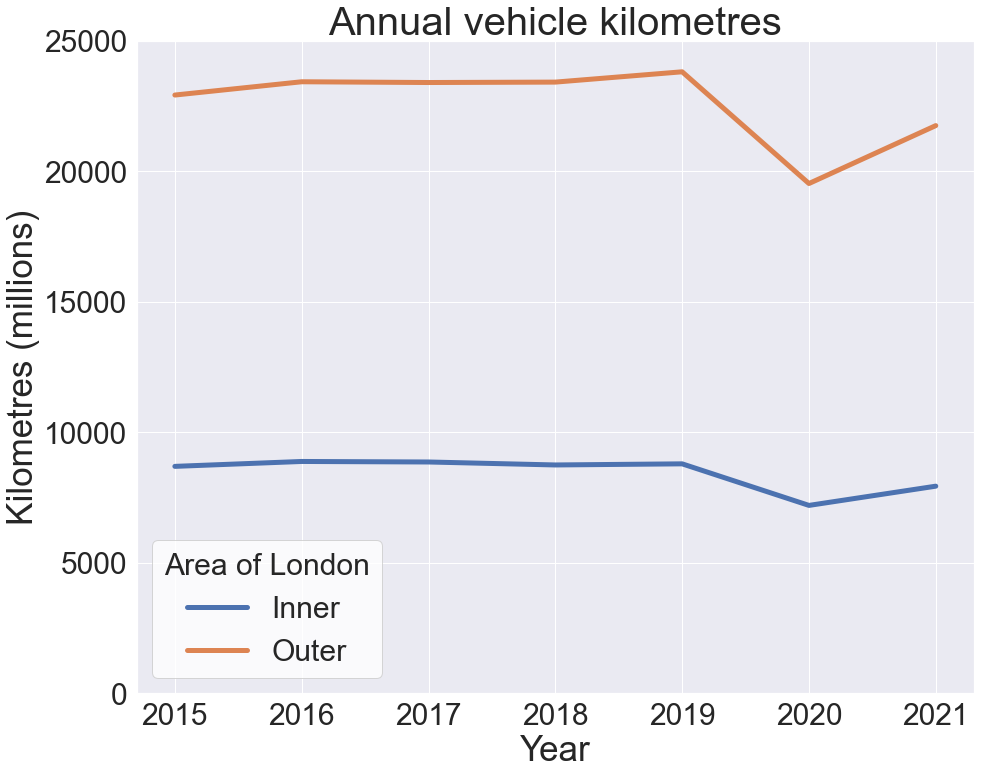

In [624]:
# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})

# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create plot.
plt.plot('Year', 'Inner', data=year_ttl_c, label = 'Inner', linewidth=5)
plt.plot('Year', 'Outer', data=year_ttl_c, label = 'Outer', linewidth=5)
plt.legend(fontsize = 30, facecolor='white', title='Area of London', title_fontsize=30)
plt.xlabel('Year', size=35)
plt.ylabel('Kilometres (millions)', size=35)
plt.title('Annual vehicle kilometres', fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 25000)

# View plot.
plt.show()

# The proportion of kilometres being driven by Outer London residents in 2021 = 73% of all kilometres driven 
# by Londoners in 2021.

In [625]:
# Select data related to Inner London Boroughs.
Inner = cars[cars['Area'] == 'Inner'].reset_index().T.reset_index()

# Rename columns.
year_ttl_Inner = Inner.rename(columns={'index': 'Year', 0: 'Camden', 1: 'City of London', 2: 'Hackney', 
                              3: 'Hammersmith & Fulham', 4: 'Haringey', 5: 'Islington', 6: 'Kensington & Chelsea',
                             7: 'Lambeth', 8: 'Lewisham', 9: 'Newham', 10: 'Southwark', 11: 'Tower Hamlets', 
                             12: 'Wandsworth', 13: 'Westminster'})

# Drop first three rows.
year_ttl_Inner = year_ttl_Inner.tail(-3).reset_index(drop=True)

# View DataFrame.
year_ttl_Inner

,Year,Camden,City of London,Hackney,Hammersmith & Fulham,Haringey,Islington,Kensington & Chelsea,Lambeth,Lewisham,Newham,Southwark,Tower Hamlets,Wandsworth,Westminster
0,2014,504,163,469,511,543,400,503,747,754,887,720,862,754,863
1,2015,503,163,470,511,542,397,502,743,757,903,727,848,759,872
2,2016,508,160,480,528,551,406,512,772,789,925,741,877,760,876
3,2017,503,154,471,520,545,399,502,778,786,951,728,881,786,861
4,2018,489,149,456,527,547,389,519,752,757,953,705,878,782,848
5,2019,483,150,461,528,558,390,527,762,770,944,718,876,803,824
6,2020,392,117,390,411,454,316,425,626,633,805,596,737,658,641
7,2021,435,128,436,465,508,351,467,706,714,837,672,804,722,693


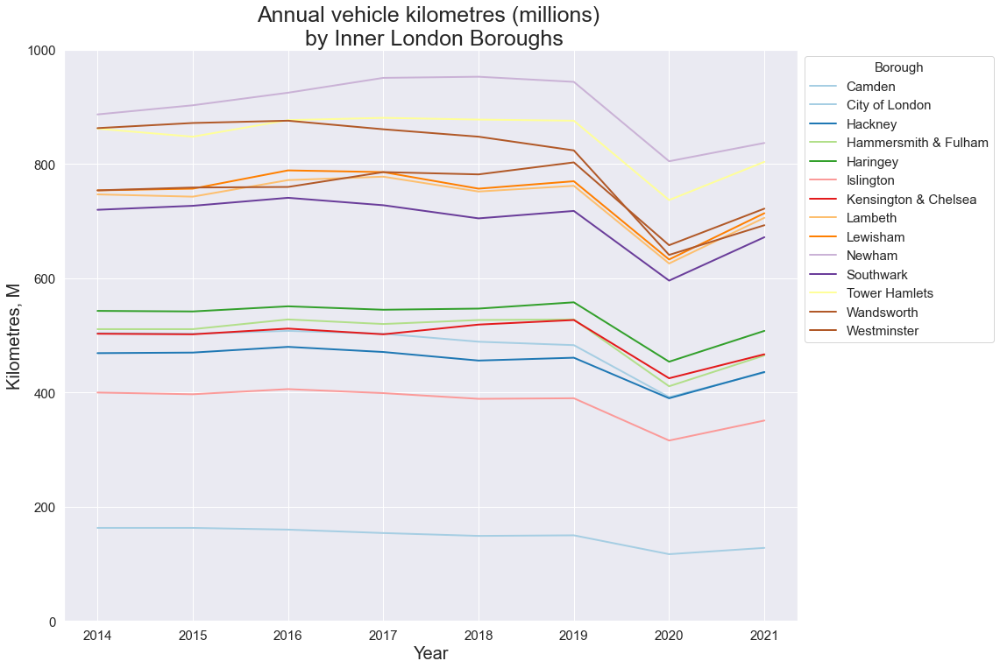

In [626]:
# Create plot.
year_ttl_Inner.plot(x='Year', y=['Camden', 'City of London', 'Hackney', 'Hammersmith & Fulham', 'Haringey', 
                                 'Islington', 'Kensington & Chelsea', 'Lambeth', 'Lewisham', 'Newham', 'Southwark',
                                 'Tower Hamlets', 'Wandsworth', 'Westminster'],
                    kind='line', colormap='Paired', linewidth=2)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Borough', title_fontsize=15)
plt.xlabel('Year', size=20)
plt.ylabel('Kilometres, M', size=20)
plt.title('Annual vehicle kilometres (millions) \n by Inner London Boroughs', fontdict={'fontsize':25})
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.ylim(0, 1000)

# View plot.
plt.show()

In [627]:
# Select data related to Outer London Boroughs.
Outer = cars[cars['Area'] == 'Outer'].reset_index().T.reset_index()

# Rename columns.
year_ttl_Outer = Outer.rename(columns={'index': 'Year', 0: 'Barking & Dagenham', 1: 'Barnet', 2: 'Bexley', 
                                       3: 'Brent', 4: 'Bromley', 5: 'Croydon', 6: 'Ealing', 7: 'Enfield', 
                                       8: 'Greenwich', 9: 'Harrow', 10: 'Havering', 11: 'Hillingdon', 
                                       12: 'Hounslow', 13: 'Kingston upon Thame', 14: 'Merton', 15: 'Redbridge', 
                                       16: 'Richmond upon Thames', 17: 'Sutton', 18: 'Waltham Forest'})

# Drop first three rows.
year_ttl_Outer = year_ttl_Outer.tail(-3).reset_index(drop=True)

# View DataFrame.
year_ttl_Outer

,Year,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Croydon,Ealing,Enfield,Greenwich,Harrow,Havering,Hillingdon,Hounslow,Kingston upon Thame,Merton,Redbridge,Richmond upon Thames,Sutton,Waltham Forest
0,2014,653,1775,993,983,1416,1333,1330,1677,1178,653,1686,2441,1671,985,654,1178,860,712,816
1,2015,653,1766,1001,962,1426,1331,1338,1741,1187,649,1692,2387,1653,984,650,1165,859,712,772
2,2016,673,1751,1031,1008,1460,1366,1344,1753,1196,661,1756,2464,1707,1012,662,1191,874,738,790
3,2017,662,1796,1033,997,1450,1349,1368,1761,1200,654,1780,2427,1679,995,654,1199,877,730,797
4,2018,660,1794,1015,999,1418,1333,1363,1776,1195,643,1794,2456,1691,986,663,1220,857,712,849
5,2019,661,1822,1034,1024,1468,1357,1370,1789,1204,662,1830,2499,1760,1010,677,1210,877,731,834
6,2020,559,1448,869,883,1195,1136,1162,1441,1029,520,1565,1990,1319,813,544,1034,700,615,715
7,2021,603,1618,964,965,1368,1285,1256,1603,1144,604,1707,2233,1494,936,617,1113,785,693,769


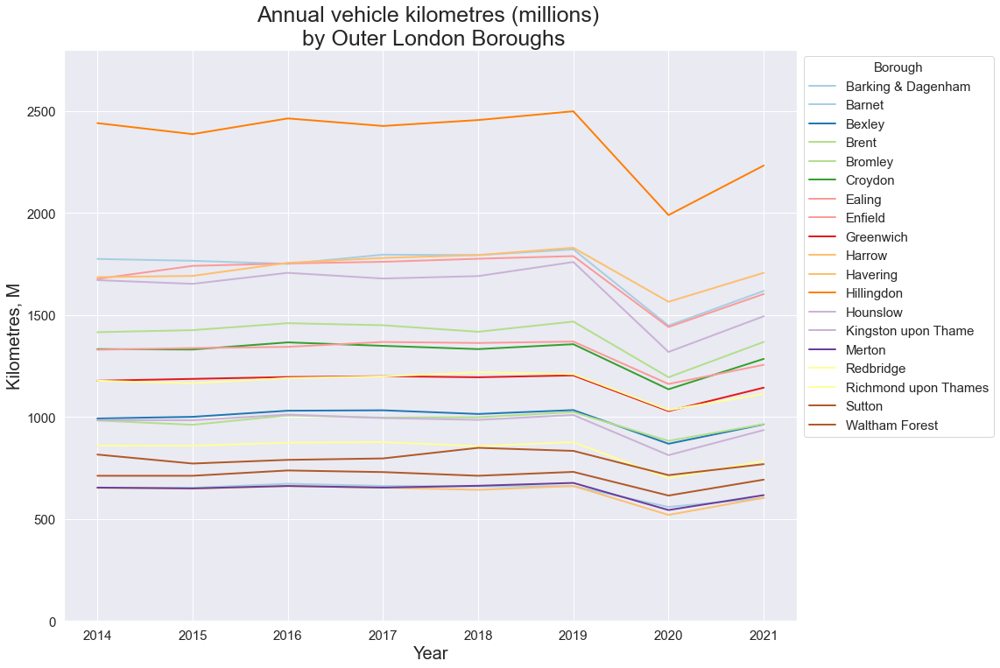

In [628]:
# Create plot.
year_ttl_Outer.plot(x='Year', y=['Barking & Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley', 'Croydon', 'Ealing', 
                                 'Enfield', 'Greenwich', 'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 
                                 'Kingston upon Thame', 'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton', 
                                 'Waltham Forest'],
                    kind='line', colormap='Paired', linewidth=2)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Borough', title_fontsize=15)
plt.xlabel('Year', size=20)
plt.ylabel('Kilometres, M', size=20)
plt.title('Annual vehicle kilometres (millions) \n by Outer London Boroughs', fontdict={'fontsize':25})
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.ylim(0, 2800)

# View plot.
plt.show()

#### Number of cars owned

In [629]:
# Read the provided CSV file/data set.            
n_cars = pd.read_csv('Number of cars owned.csv')

# View DataFrame.
n_cars.head()

,Borough,Area,2014,2015,2016,2017,2018,2019,2020,2021
0,Camden,Inner,50635,50087,49762,47781,43459,42098,41297,38080
1,City of London,Inner,2813,2762,2867,2658,2530,2455,2292,2208
2,Hackney,Inner,41129,42394,42883,42841,42540,42026,42605,41256
3,Hammersmith & Fulham,Inner,43076,43830,43896,43852,43597,43670,43968,42387
4,Haringey,Inner,61758,63622,64897,64881,64303,63827,64106,61915


In [630]:
# Total number of cars owned per area and per calendar year.
year_ttl_nc = n_cars.groupby('Area').sum().reset_index().T.reset_index()

# Rename columns.
year_ttl_nc = year_ttl_nc.rename(columns={'index': 'Year', 0: 'Inner', 1: 'Outer'})

# Drop first row.
year_ttl_nc = year_ttl_nc.tail(-1).reset_index(drop=True)

# View DataFrame.
year_ttl_nc

,Year,Inner,Outer
0,2014,716684,1992578
1,2015,730865,2032086
2,2016,739457,2059933
3,2017,739996,2055029
4,2018,729133,2053716
5,2019,721421,2049730
6,2020,719429,2019655
7,2021,693560,1981584


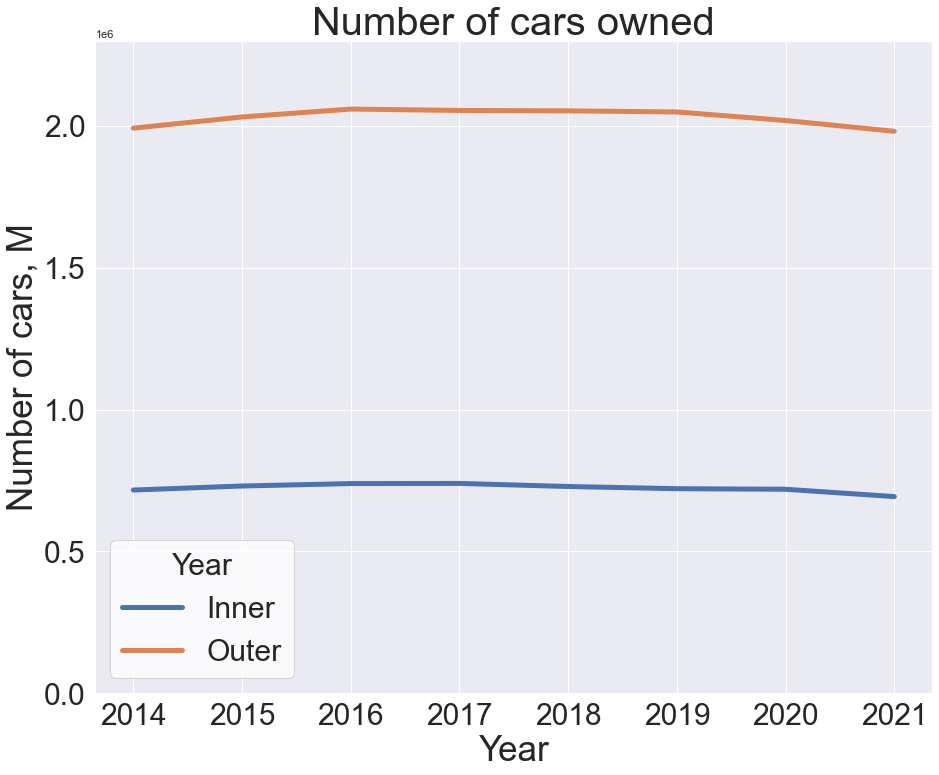

In [631]:
# Create plot.
plt.plot('Year', 'Inner', data=year_ttl_nc, label = 'Inner', linewidth=5)
plt.plot('Year', 'Outer', data=year_ttl_nc, label = 'Outer', linewidth=5)
plt.legend(fontsize = 30, facecolor='white', title='Year', title_fontsize=30)
plt.xlabel('Year', size=35)
plt.ylabel('Number of cars, M', size=35)
plt.title('Number of cars owned', fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 2300000)

# View plot.
plt.show()

74% of all cars in London in 2021 were owned by residents of Outer London.

In [632]:
# Select data related to Inner London Boroughs.
n_Inner = n_cars[n_cars['Area'] == 'Inner'].reset_index().T.reset_index()

# Rename columns.
year_ttl_n_Inner = n_Inner.rename(columns={'index': 'Year', 0: 'Camden', 1: 'City of London', 2: 'Hackney', 
                              3: 'Hammersmith & Fulham', 4: 'Haringey', 5: 'Islington', 6: 'Kensington & Chelsea',
                             7: 'Lambeth', 8: 'Lewisham', 9: 'Newham', 10: 'Southwark', 11: 'Tower Hamlets', 
                             12: 'Wandsworth', 13: 'Westminster'})

# Drop first three rows.
year_ttl_n_Inner = year_ttl_n_Inner.tail(-3).reset_index(drop=True)

# View DataFrame.
year_ttl_n_Inner

,Year,Camden,City of London,Hackney,Hammersmith & Fulham,Haringey,Islington,Kensington & Chelsea,Lambeth,Lewisham,Newham,Southwark,Tower Hamlets,Wandsworth,Westminster
0,2014,50635,2813,41129,43076,61758,36618,42320,64086,76037,63189,58160,43550,81888,51425
1,2015,50087,2762,42394,43830,63622,37358,42068,65743,78029,66964,59240,45234,82755,50779
2,2016,49762,2867,42883,43896,64897,37372,41699,66980,79792,69699,59824,46252,83018,50516
3,2017,47781,2658,42841,43852,64881,36727,41247,66943,79997,72189,59721,46694,82860,51605
4,2018,43459,2530,42540,43597,64303,36815,40689,66156,79598,72411,58935,46405,81981,49714
5,2019,42098,2455,42026,43670,63827,35921,39680,64617,78715,72632,58396,46729,81203,49452
6,2020,41297,2292,42605,43968,64106,35665,38510,65167,78823,72759,58574,46529,81757,47377
7,2021,38080,2208,41256,42387,61915,34217,36884,63142,76459,69266,56372,45907,80003,45464


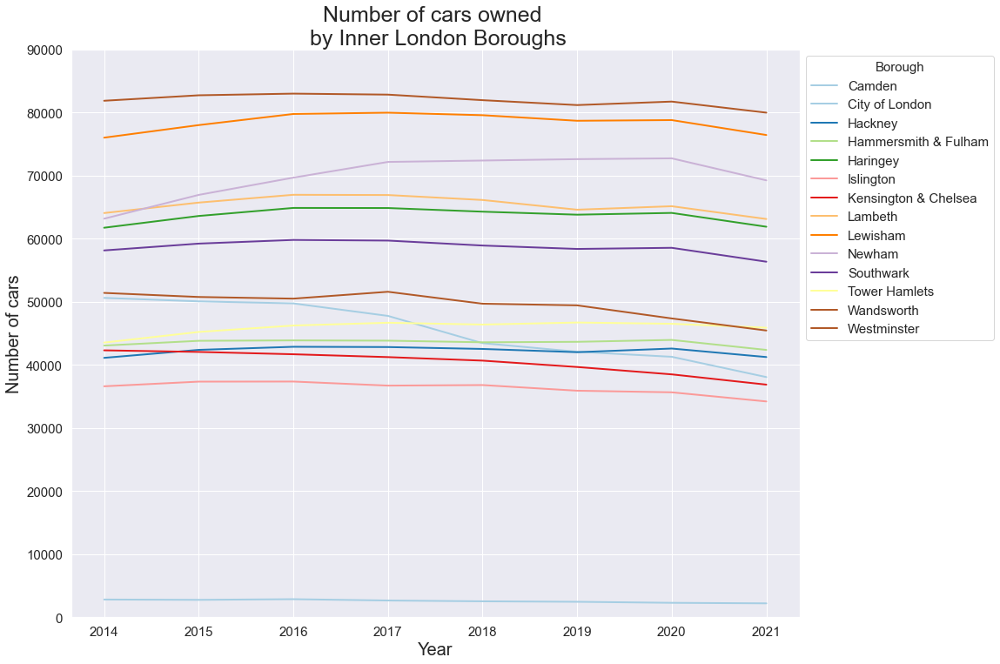

In [633]:
# Create plot.
year_ttl_n_Inner.plot(x='Year', y=['Camden', 'City of London', 'Hackney', 'Hammersmith & Fulham', 'Haringey', 
                                 'Islington', 'Kensington & Chelsea', 'Lambeth', 'Lewisham', 'Newham', 'Southwark',
                                 'Tower Hamlets', 'Wandsworth', 'Westminster'],
                    kind='line', colormap='Paired', linewidth=2)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Borough', title_fontsize=15)
plt.xlabel('Year', size=20)
plt.ylabel('Number of cars', size=20)
plt.title('Number of cars owned \n by Inner London Boroughs', fontdict={'fontsize':25})
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.ylim(0, 90000)

# View plot.
plt.show()

In [634]:
# Select data related to Outer London Boroughs.
n_Outer = n_cars[n_cars['Area'] == 'Outer'].reset_index().T.reset_index()

# Rename columns.
year_ttl_n_Outer = n_Outer.rename(columns={'index': 'Year', 0: 'Barking & Dagenham', 1: 'Barnet', 2: 'Bexley', 
                                       3: 'Brent', 4: 'Bromley', 5: 'Croydon', 6: 'Ealing', 7: 'Enfield', 
                                       8: 'Greenwich', 9: 'Harrow', 10: 'Havering', 11: 'Hillingdon', 
                                       12: 'Hounslow', 13: 'Kingston upon Thame', 14: 'Merton', 15: 'Redbridge', 
                                       16: 'Richmond upon Thames', 17: 'Sutton', 18: 'Waltham Forest'})

# Drop first three rows.
year_ttl_n_Outer = year_ttl_n_Outer.tail(-3).reset_index(drop=True)

# View DataFrame.
year_ttl_n_Outer

,Year,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Croydon,Ealing,Enfield,Greenwich,Harrow,Havering,Hillingdon,Hounslow,Kingston upon Thame,Merton,Redbridge,Richmond upon Thames,Sutton,Waltham Forest
0,2014,61807,142767,109808,96423,153709,142100,119195,123727,76513,102000,120051,146418,98384,69088,75250,106253,78945,91176,78964
1,2015,64771,145410,111208,99387,155548,145573,122331,126627,78626,103779,122809,148315,100186,69878,76593,108099,79178,92461,81307
2,2016,66390,147786,112706,101247,157357,148256,123426,128419,80297,104675,124749,148130,101566,70562,78497,109740,79553,93540,83037
3,2017,66887,147703,113172,98444,157146,148184,122672,127874,80717,104249,124686,148038,101977,70413,76811,109539,79704,93815,82998
4,2018,67855,147282,112563,97867,156765,148620,121257,127375,81211,103568,124564,152602,102085,69986,76159,109045,79062,93650,82200
5,2019,68575,147494,112522,97348,156112,148103,120829,127188,80905,103572,124275,153321,102357,70043,73974,109087,78527,93763,81735
6,2020,68561,144547,111562,96038,154575,147340,119880,126146,80947,102085,122873,142463,100807,68512,74238,107481,77721,92653,81226
7,2021,67523,140624,109845,93102,152140,144345,117411,123627,78878,99832,121714,141980,98526,67565,73385,105083,76434,91387,78183


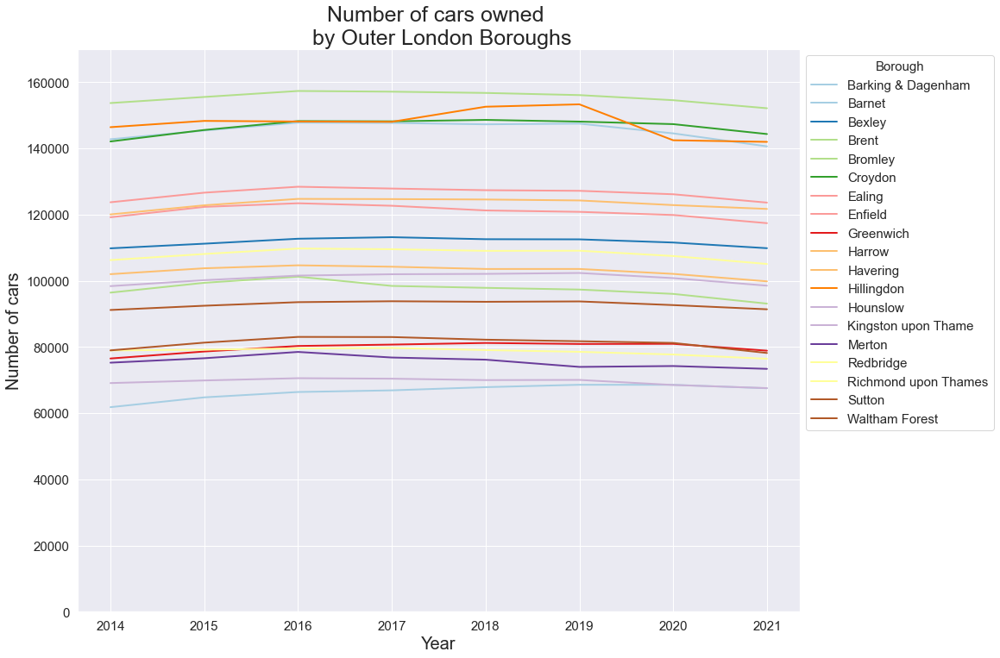

In [635]:
# Create plot.
year_ttl_n_Outer.plot(x='Year', y=['Barking & Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley', 'Croydon', 'Ealing', 
                                 'Enfield', 'Greenwich', 'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 
                                 'Kingston upon Thame', 'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton', 
                                 'Waltham Forest'],
                    kind='line', colormap='Paired', linewidth=2)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Borough', title_fontsize=15)
plt.xlabel('Year', size=20)
plt.ylabel('Number of cars', size=20)
plt.title('Number of cars owned \n by Outer London Boroughs', fontdict={'fontsize':25})
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.ylim(0, 170000)

# View plot.
plt.show()

**SUMMARY:**

Popularity of the cars in Outer London is evidential as 74% of all cars in London in 2021 were owned by residents of Outer London. Saying that the proportion of kilometres being driven by Outer London residents is less and equals to 73%. With all what we have learned so far we believe that residents of Outer London drive mainly as part of their commute comparing to Inner London, who drive mainly for the leisure purposes.

## Distance travelled to work

In [636]:
# Read the provided CSV file/data set.            
distance = pd.read_csv('Distance travelled to work.csv')

# View DataFrame.
distance.head()

,Borough,Area,Code,Distance travelled to work,Ttl_2011,Proportion_2011,Ttl_2021,Proportion_2021
0,City of London,Inner,1,2 km <,11116,3.11,676,12.64
1,City of London,Inner,2,2 km - 5 km,36847,10.31,385,7.20
2,City of London,Inner,3,5 km - 10 km,89850,25.13,241,4.51
3,City of London,Inner,4,10 km - 20 km,93698,26.21,82,1.53
4,City of London,Inner,5,20 km - 30 km,34043,9.52,15,0.28


In [637]:
# Total number of km per area and per calendar year.
year_ttl_d = distance.groupby(['Distance travelled to work', 'Area']).sum().reset_index()

# Keep relevant columns
year_ttl_d = year_ttl_d[['Area', 'Distance travelled to work', 'Ttl_2011', 'Ttl_2021']].\
sort_values(['Area', 'Distance travelled to work']).reset_index(drop=True)

# Calculate percentage by area, distance and year. 
year_ttl_d['2011'] = year_ttl_d.groupby('Area')['Ttl_2011'].apply(lambda x: x*100/x.sum()).round(2)
year_ttl_d['2021'] = year_ttl_d.groupby('Area')['Ttl_2021'].apply(lambda x: x*100/x.sum()).round(2)


# View DataFrame.
year_ttl_d

,Area,Distance travelled to work,Ttl_2011,Ttl_2021,2011,2021
0,Inner,10 km - 20 km,612155,99987,22.93,5.63
1,Inner,2 km - 5 km,374135,204462,14.01,11.52
2,Inner,2 km <,212707,139794,7.97,7.87
3,Inner,20 km - 30 km,164729,14304,6.17,0.81
4,Inner,30 km - 40 km,88018,6060,3.30,0.34
5,Inner,40 km - 60 km,137713,5307,5.16,0.30
6,Inner,5 km - 10 km,602886,219555,22.58,12.37
7,Inner,60 km >,154812,11125,5.80,0.63
8,Inner,Mainly at/from home,164102,873132,6.15,49.17
9,Inner,No fixed place,158958,201838,5.95,11.37


In [638]:
# Select data related to Inner London Boroughs.
year_ttl_d_Inner = year_ttl_d[year_ttl_d['Area'] == 'Inner'].reset_index().T.reset_index()

# Rename columns.
year_ttl_d_Inner = year_ttl_d_Inner.rename(columns={'index': 'Year', 0: '10 km - 20 km', 
                                                    1: '2 km - 5 km', 2: '2 km <', 
                                                    3: '20 km - 30 km', 4: '30 km - 40 km', 
                                                    5: '40 km - 60 km', 6: '5 km - 10 km', 
                                                    7: '60 km >', 8: 'Mainly at/from home', 
                                                    9: 'No fixed place'})

# Drop first three rows.
year_ttl_d_Inner = year_ttl_d_Inner.tail(-5).reset_index(drop=True)


# View DataFrame.
year_ttl_d_Inner

,Year,10 km - 20 km,2 km - 5 km,2 km <,20 km - 30 km,30 km - 40 km,40 km - 60 km,5 km - 10 km,60 km >,Mainly at/from home,No fixed place
0,2011,22.93,14.01,7.97,6.17,3.3,5.16,22.58,5.8,6.15,5.95
1,2021,5.63,11.52,7.87,0.81,0.34,0.3,12.37,0.63,49.17,11.37


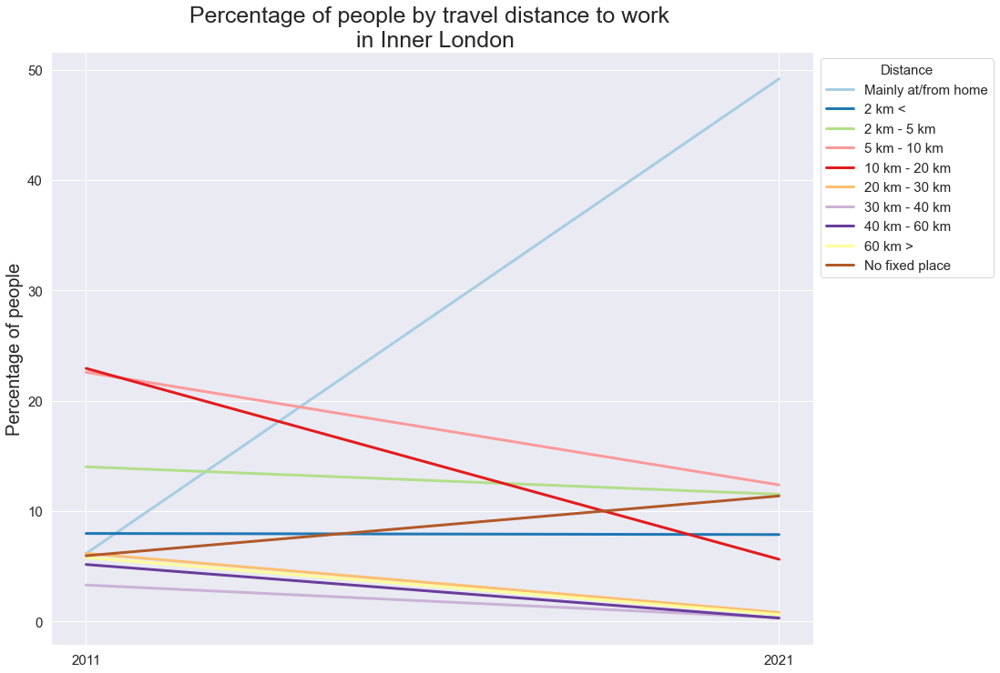

In [639]:
# Create plot.
year_ttl_d_Inner.plot(x='Year', y=['Mainly at/from home', '2 km <', '2 km - 5 km', 
                                   '5 km - 10 km', '10 km - 20 km', 
                                   '20 km - 30 km', '30 km - 40 km', 
                                   '40 km - 60 km', '60 km >', 'No fixed place'], 
                      kind='line', colormap='Paired', linewidth=3)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Distance', title_fontsize=15)
plt.xlabel('')
plt.ylabel('Percentage of people', size=20)
plt.title('Percentage of people by travel distance to work \n in Inner London', fontdict={'fontsize':25})
plt.xticks(np.arange(2), ['2011', '2021'], fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

In [640]:
# Swap columns and rows.
year_ttl_d_Inner1 = year_ttl_d_Inner.T

# Rename columns.
year_ttl_d_Inner1 = year_ttl_d_Inner1.rename(columns={0: '2011', 1: '2021'})

# Delete first row.
year_ttl_d_Inner1 = year_ttl_d_Inner1.tail(-1)

# Set an order in index column.
order = ['Mainly at/from home', '2 km <', '2 km - 5 km', '5 km - 10 km', '10 km - 20 km', 
         '20 km - 30 km', '30 km - 40 km', '40 km - 60 km', '60 km >', 'No fixed place']

year_ttl_d_Inner1 = year_ttl_d_Inner1.reindex(index = order)

# Change an index column to a normal column.
year_ttl_d_Inner1 = year_ttl_d_Inner1.reset_index().rename(columns={'index': 'Distance'})

# View DataFrame.
year_ttl_d_Inner1

,Distance,2011,2021
0,Mainly at/from home,6.15,49.17
1,2 km <,7.97,7.87
2,2 km - 5 km,14.01,11.52
3,5 km - 10 km,22.58,12.37
4,10 km - 20 km,22.93,5.63
5,20 km - 30 km,6.17,0.81
6,30 km - 40 km,3.3,0.34
7,40 km - 60 km,5.16,0.3
8,60 km >,5.8,0.63
9,No fixed place,5.95,11.37


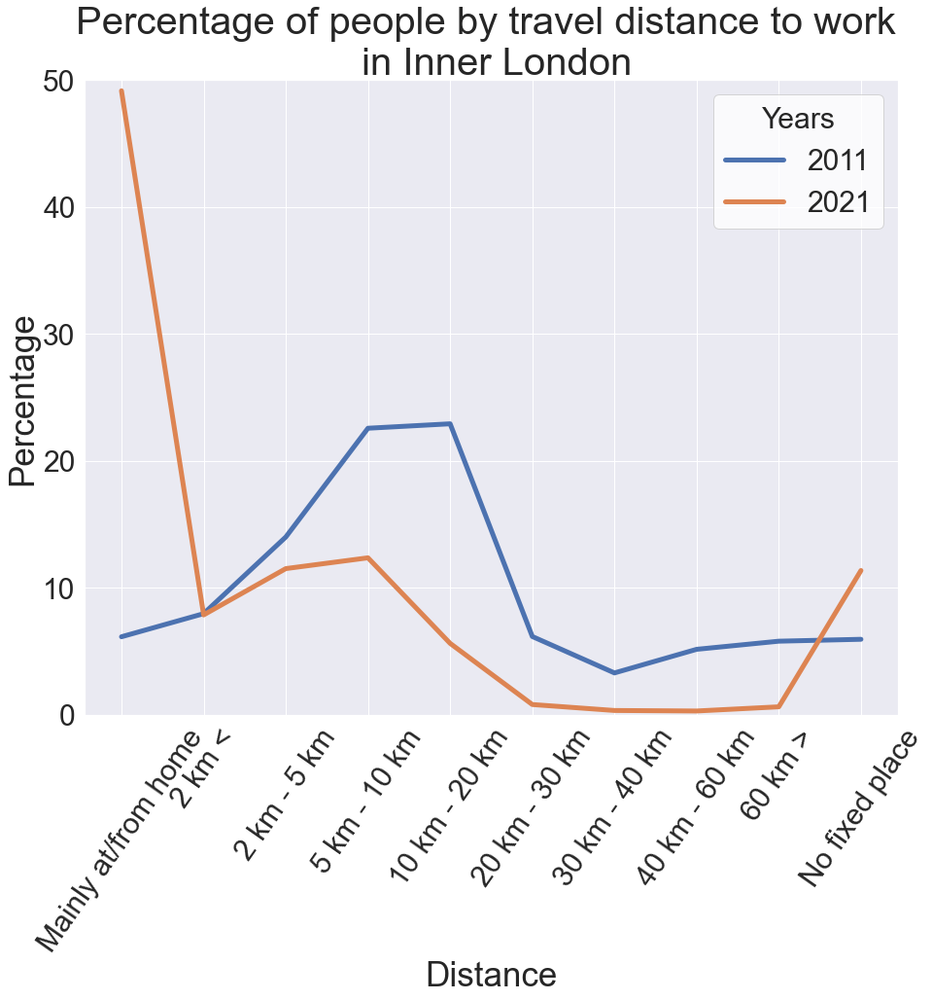

In [641]:
# Create plot.
year_ttl_d_Inner1.plot(x='Distance', y=['2011', '2021'], kind='line', linewidth=5)

plt.legend(fontsize = 30, bbox_to_anchor=(1, 1), facecolor='white', title='Years', title_fontsize=30)
plt.xlabel('Distance', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Percentage of people by travel distance to work \n in Inner London', fontdict={'fontsize':40})
plt.xticks(np.arange(10), ['Mainly at/from home', '2 km <', '2 km - 5 km', '5 km - 10 km', '10 km - 20 km', 
                           '20 km - 30 km', '30 km - 40 km', '40 km - 60 km', '60 km >', 'No fixed place'], 
           fontsize = 30, rotation=55)
plt.yticks(fontsize = 30)
plt.ylim(0, 50)

# View plot.
plt.show()

In [642]:
# Select data relevant to Inner London Borough 2021.
distance_Inner_2021 = distance[distance['Area'] == 'Inner']
distance_Inner_2021 = distance_Inner_2021[['Borough', 'Distance travelled to work', 'Proportion_2021']]

# Rename columns.
distance_Inner_2021 = distance_Inner_2021.rename(columns={'Distance travelled to work': 'Distance', 
                                                          'Proportion_2021': '2021'})

# View DataFrame.
distance_Inner_2021

,Borough,Distance,2021
0,City of London,2 km <,12.64
1,City of London,2 km - 5 km,7.20
2,City of London,5 km - 10 km,4.51
3,City of London,10 km - 20 km,1.53
4,City of London,20 km - 30 km,0.28
...,...,...,...
325,Westminster,30 km - 40 km,0.25
326,Westminster,40 km - 60 km,0.23
327,Westminster,60 km >,0.61
328,Westminster,Mainly at/from home,55.79


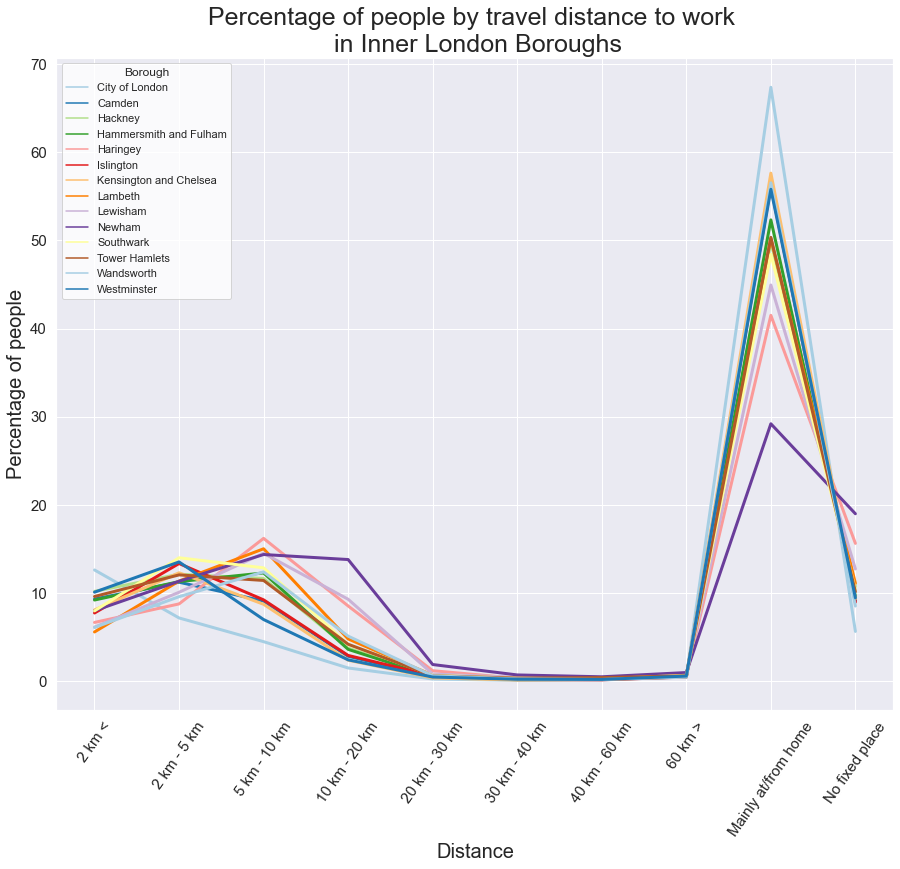

In [643]:
lineplot1 = sns.lineplot(x='Distance', y='2021', data=distance_Inner_2021, hue='Borough', palette='Paired', 
                        linewidth=3, ci=None)

# Update title, x and y labels and legend.
lineplot1.set_title('Percentage of people by travel distance to work \n in Inner London Boroughs', 
                      fontdict={'fontsize':25})
lineplot1.set_ylabel('Percentage of people', fontdict={'fontsize':20})
lineplot1.legend(title='Borough', facecolor='white')
lineplot1.set_xlabel('Distance', fontdict={'fontsize':20})
plt.xticks(fontsize = 15, rotation=55)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

In [644]:
# Select data related to Inner London Boroughs.
year_ttl_d_Outer = year_ttl_d[year_ttl_d['Area'] == 'Outer'].reset_index().T.reset_index()

# Rename columns.
year_ttl_d_Outer = year_ttl_d_Outer.rename(columns={'index': 'Year', 0: '10 km - 20 km', 
                                                    1: '2 km - 5 km', 2: '2 km <', 
                                                    3: '20 km - 30 km', 4: '30 km - 40 km', 
                                                    5: '40 km - 60 km', 6: '5 km - 10 km', 
                                                    7: '60 km >', 8: 'Mainly at/from home', 
                                                    9: 'No fixed place'})

# Drop first three rows.
year_ttl_d_Outer = year_ttl_d_Outer.tail(-5).reset_index(drop=True)


# View DataFrame.
year_ttl_d_Outer

,Year,10 km - 20 km,2 km - 5 km,2 km <,20 km - 30 km,30 km - 40 km,40 km - 60 km,5 km - 10 km,60 km >,Mainly at/from home,No fixed place
0,2011,11.89,18.86,14.31,4.33,2.1,1.59,18.06,2.67,12.05,14.14
1,2021,11.98,10.85,7.41,2.54,0.66,0.41,12.15,0.73,37.29,15.99


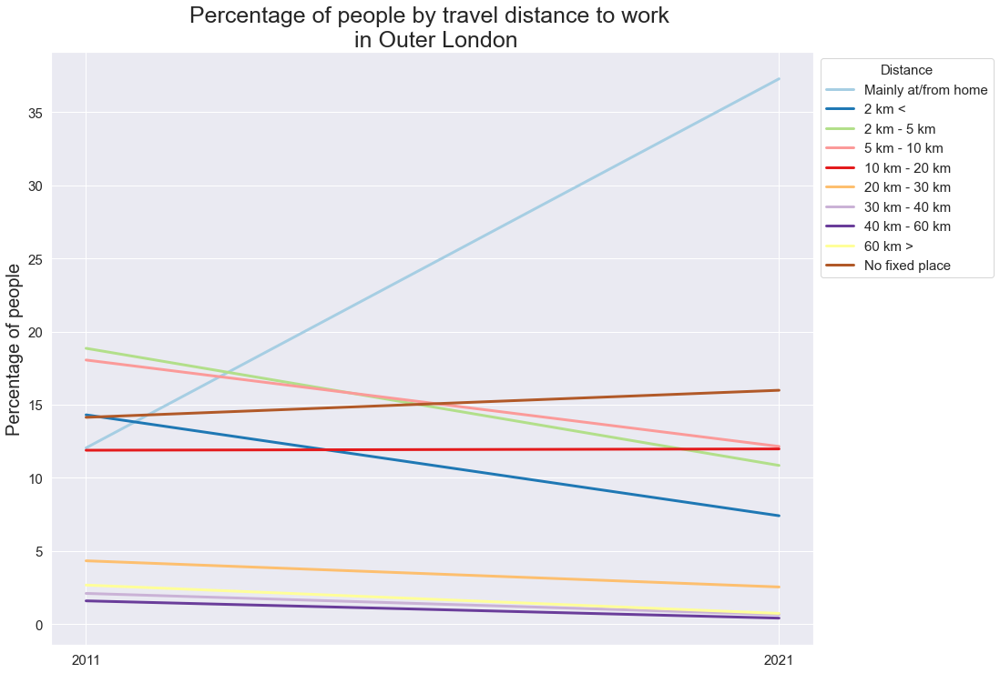

In [645]:
# Create plot.
year_ttl_d_Outer.plot(x='Year', y=['Mainly at/from home', '2 km <', '2 km - 5 km', '5 km - 10 km', '10 km - 20 km', 
                                   '20 km - 30 km', '30 km - 40 km', '40 km - 60 km', '60 km >', 'No fixed place'], 
                      kind='line', colormap='Paired', linewidth=3)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Distance', title_fontsize=15)
plt.xlabel('')
plt.ylabel('Percentage of people', size=20)
plt.title('Percentage of people by travel distance to work \n in Outer London', fontdict={'fontsize':25})
plt.xticks(np.arange(2), ['2011', '2021'], fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

In [646]:
# Swap columns and rows.
year_ttl_d_Outer1 = year_ttl_d_Outer.T

# Rename columns.
year_ttl_d_Outer1 = year_ttl_d_Outer1.rename(columns={0: '2011', 1: '2021'})

# Delete first row.
year_ttl_d_Outer1 = year_ttl_d_Outer1.tail(-1)

# Change order in the index column.
year_ttl_d_Outer1 = year_ttl_d_Outer1.reindex(index = order)

# Change an index column to a normal column.
year_ttl_d_Outer1 = year_ttl_d_Outer1.reset_index().rename(columns={'index': 'Distance'})

# View DataFrame.
year_ttl_d_Outer1

,Distance,2011,2021
0,Mainly at/from home,12.05,37.29
1,2 km <,14.31,7.41
2,2 km - 5 km,18.86,10.85
3,5 km - 10 km,18.06,12.15
4,10 km - 20 km,11.89,11.98
5,20 km - 30 km,4.33,2.54
6,30 km - 40 km,2.1,0.66
7,40 km - 60 km,1.59,0.41
8,60 km >,2.67,0.73
9,No fixed place,14.14,15.99


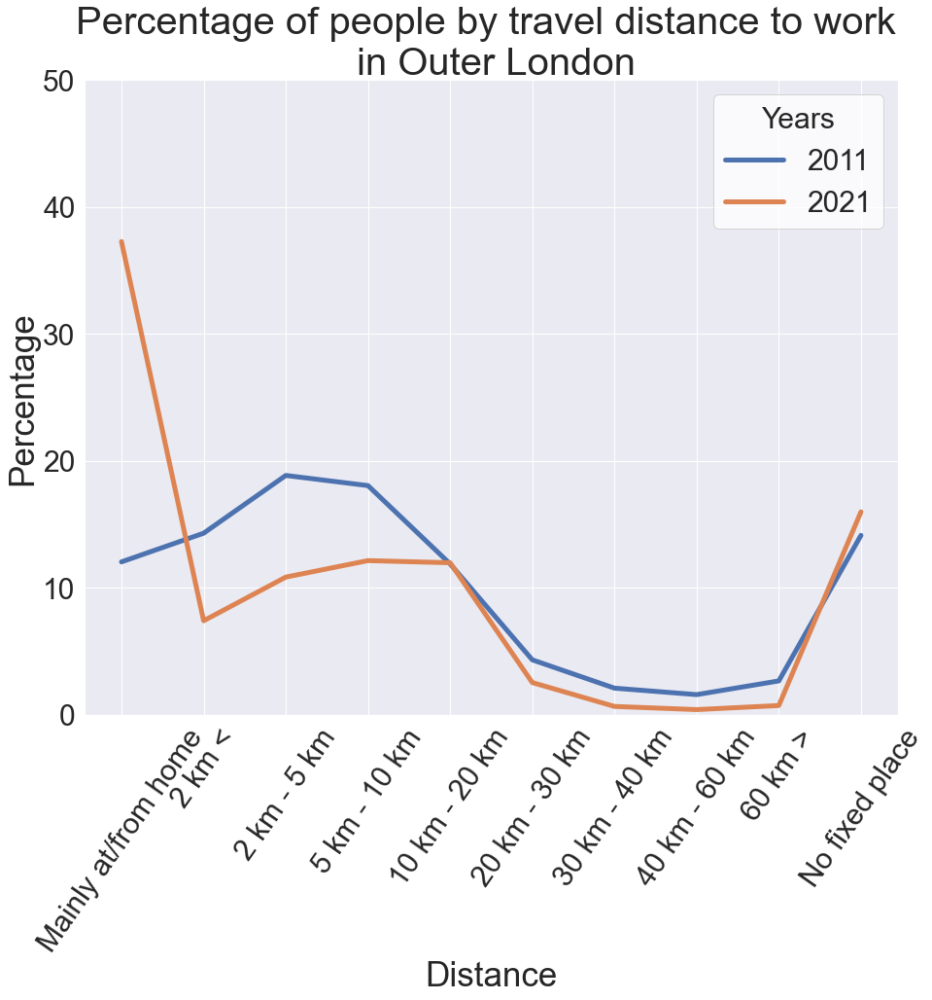

In [647]:
# Create plot.
year_ttl_d_Outer1.plot(x='Distance', y=['2011', '2021'], kind='line', linewidth=5)
plt.legend(fontsize = 30, facecolor='white', title='Years', title_fontsize=30)
plt.xlabel('Distance', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Percentage of people by travel distance to work \n in Outer London', fontdict={'fontsize':40})
plt.xticks(np.arange(10), ['Mainly at/from home', '2 km <', '2 km - 5 km', '5 km - 10 km', '10 km - 20 km', 
                           '20 km - 30 km', '30 km - 40 km', '40 km - 60 km', '60 km >', 'No fixed place'], 
           fontsize = 30, rotation=55)
plt.yticks(fontsize = 30)
plt.ylim(0, 50)

# View plot.
plt.show()

Can see that for outer london there is a greater number of individuals travelling over 10km when compared to inner london. However, the vast majority still travel between either 2km - 5km and 5km - 10km like inner london. Therefore, it is surprising that we see such a difference in terms of modes of travel to work regards cars to other modes in outer london compared to inner. It also further backs up our suggestion that outer london is an area with high potential to improve cycling numbers.

In [648]:
# Select data relevant to Outer London Borough 2021.
distance_Outer_2021 = distance[distance['Area'] == 'Outer']
distance_Outer_2021 = distance_Outer_2021[['Borough', 'Distance travelled to work', 'Proportion_2021']]

# Rename columns.
distance_Outer_2021 = distance_Outer_2021.rename(columns={'Distance travelled to work': 'Distance', 
                                                          'Proportion_2021': '2021'})

# View DataFrame.
distance_Outer_2021

,Borough,Distance,2021
10,Barking and Dagenham,2 km <,6.85
11,Barking and Dagenham,2 km - 5 km,12.64
12,Barking and Dagenham,5 km - 10 km,11.82
13,Barking and Dagenham,10 km - 20 km,17.78
14,Barking and Dagenham,20 km - 30 km,4.94
...,...,...,...
305,Waltham Forest,30 km - 40 km,0.58
306,Waltham Forest,40 km - 60 km,0.35
307,Waltham Forest,60 km >,0.71
308,Waltham Forest,Mainly at/from home,37.59


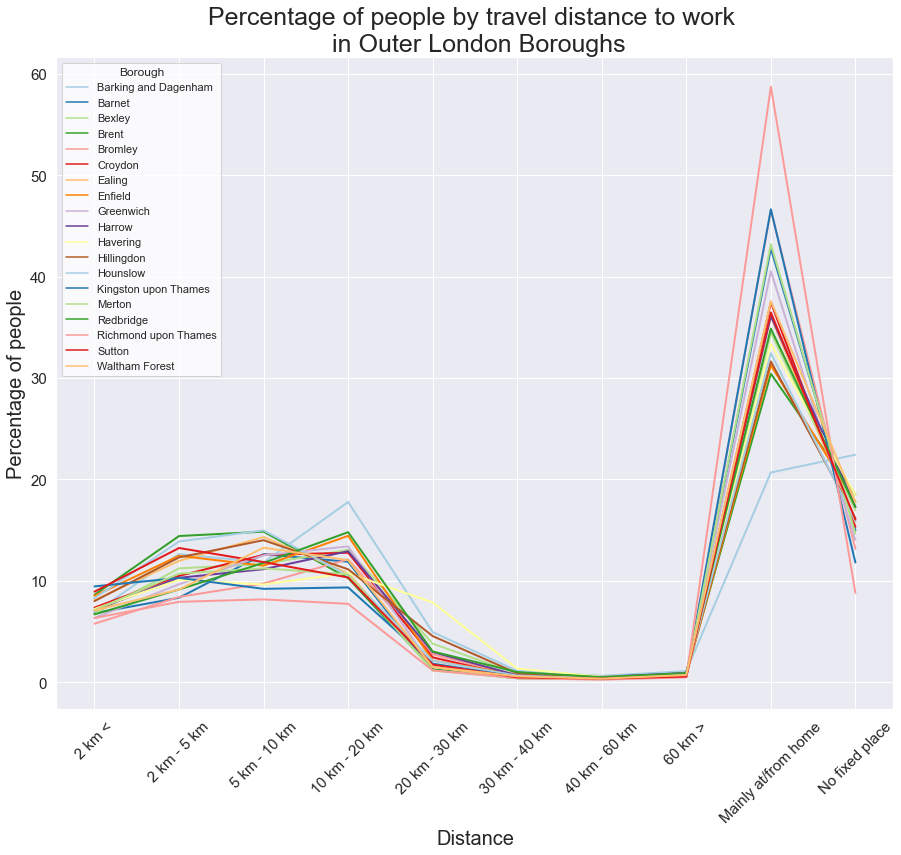

In [649]:
lineplot = sns.lineplot(x='Distance', y='2021', data=distance_Outer_2021, hue='Borough', palette='Paired', 
                        linewidth=2, ci=None)

# Update title, x and y labels and legend.
lineplot.set_title('Percentage of people by travel distance to work \n in Outer London Boroughs', 
                      fontdict={'fontsize':25})
lineplot.set_ylabel('Percentage of people', fontdict={'fontsize':20})
lineplot.legend(title='Borough', facecolor='white')
lineplot.set_xlabel('Distance', fontdict={'fontsize':20})
plt.xticks(fontsize = 15, rotation=45)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

**SUMMARY:**

More people in Inner London work mainly from/at home than in Outer London and the residents in Inner London live closer to the places of work. Nevertheless, the high percentage of Outer London population lives less than 10 kilometres away from places of work which makes it a cyclable distance. 

## Percentage of population within 400m of strategic cycle network

In [650]:
# Read the provided CSV file/data set.            
M400 = pd.read_csv('Percentage of population within 400m of strategic cycle network.csv')

# View DataFrame.
M400.head()

# No data available for 2017.

,Borough,Area,2016,2018,2019,2020,2021
0,Camden,Inner,0,5,20,37,36
1,City of London,Inner,24,90,92,92,97
2,Hackney,Inner,20,45,44,47,50
3,Hammersmith & Fulham,Inner,0,3,3,3,11
4,Haringey,Inner,10,11,11,11,12


In [651]:
# Average %% of population within 400m of strategic cycle network by area by year.
year_ttl_M400 = M400.groupby('Area').mean().round(2).T.reset_index()

# Rename columns.
year_ttl_M400 = year_ttl_M400.rename(columns={'index': 'Year'})

# View DataFrame.
year_ttl_M400

Area,Year,Inner,Outer
0,2016,11.93,0.32
1,2018,24.50,1.95
2,2019,28.86,3.26
3,2020,35.86,8.47
4,2021,38.86,9.53


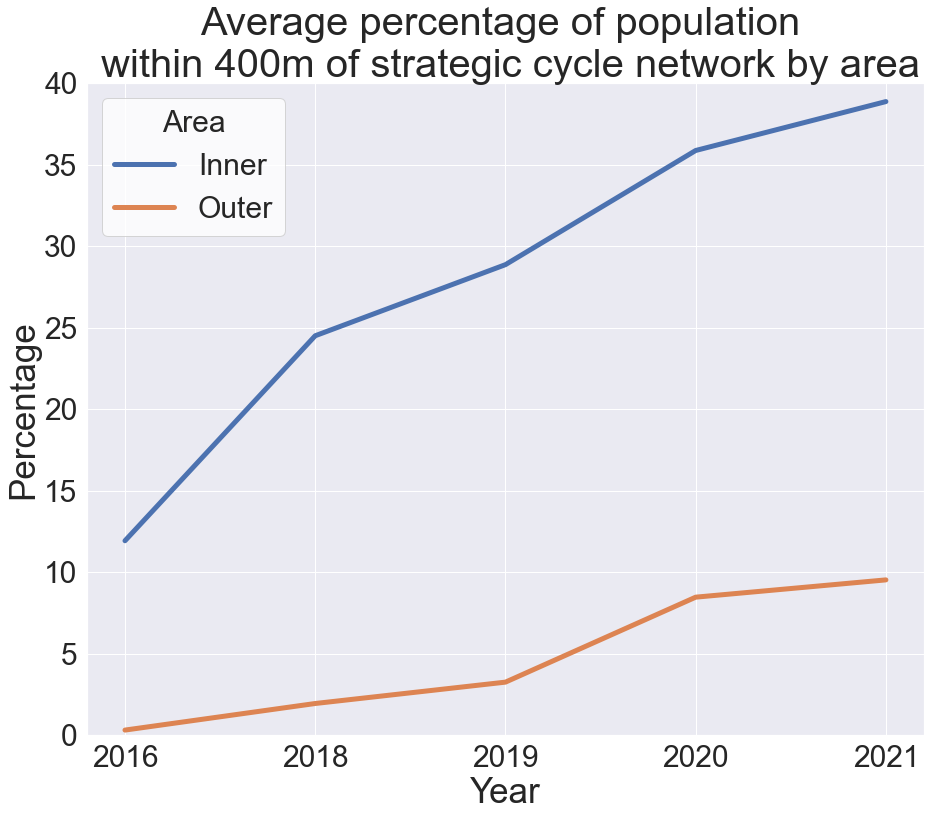

In [652]:
# Create plot.
plt.plot('Year', 'Inner', data=year_ttl_M400, label = 'Inner', linewidth=5)
plt.plot('Year', 'Outer', data=year_ttl_M400, label = 'Outer', linewidth=5)
plt.legend(fontsize = 30, facecolor='white', title='Area', title_fontsize=30)
plt.xlabel('Year', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Average percentage of population \n within 400m of strategic cycle network by area', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 40)

# View plot.
plt.show()

In [653]:
# Rename columns.
year_ttl_Inner = Inner.rename(columns={'index': 'Year', 0: 'Camden', 1: 'City of London', 2: 'Hackney', 
                              3: 'Hammersmith & Fulham', 4: 'Haringey', 5: 'Islington', 6: 'Kensington & Chelsea',
                             7: 'Lambeth', 8: 'Lewisham', 9: 'Newham', 10: 'Southwark', 11: 'Tower Hamlets', 
                             12: 'Wandsworth', 13: 'Westminster'})

# Drop first three rows.
year_ttl_Inner = year_ttl_Inner.tail(-3).reset_index(drop=True)

# Select data related to Inner London Boroughs.
Inner_M400 = M400[M400['Area'] == 'Inner'].T.reset_index()

# Rename columns.
year_ttl_Inner_M400 = Inner_M400.rename(columns={'index': 'Year', 0: 'Camden', 1: 'City of London', 2: 'Hackney', 
                              3: 'Hammersmith & Fulham', 4: 'Haringey', 5: 'Islington', 6: 'Kensington & Chelsea',
                             7: 'Lambeth', 8: 'Lewisham', 9: 'Newham', 10: 'Southwark', 11: 'Tower Hamlets', 
                             12: 'Wandsworth', 13: 'Westminster'})

# Drop first three rows.
year_ttl_Inner_M400 = year_ttl_Inner_M400.tail(-2).reset_index(drop=True)

# View DataFrame.
year_ttl_Inner_M400

,Year,Camden,City of London,Hackney,Hammersmith & Fulham,Haringey,Islington,Kensington & Chelsea,Lambeth,Lewisham,Newham,Southwark,Tower Hamlets,Wandsworth,Westminster
0,2016,0,24,20,0,10,3,1,17,4,8,17,30,22,11
1,2018,5,90,45,3,11,13,43,26,5,8,18,35,22,19
2,2019,20,92,44,3,11,22,45,27,5,17,27,37,23,31
3,2020,37,92,47,3,11,29,46,41,16,24,44,39,34,39
4,2021,36,97,50,11,12,34,56,43,16,24,49,40,30,46


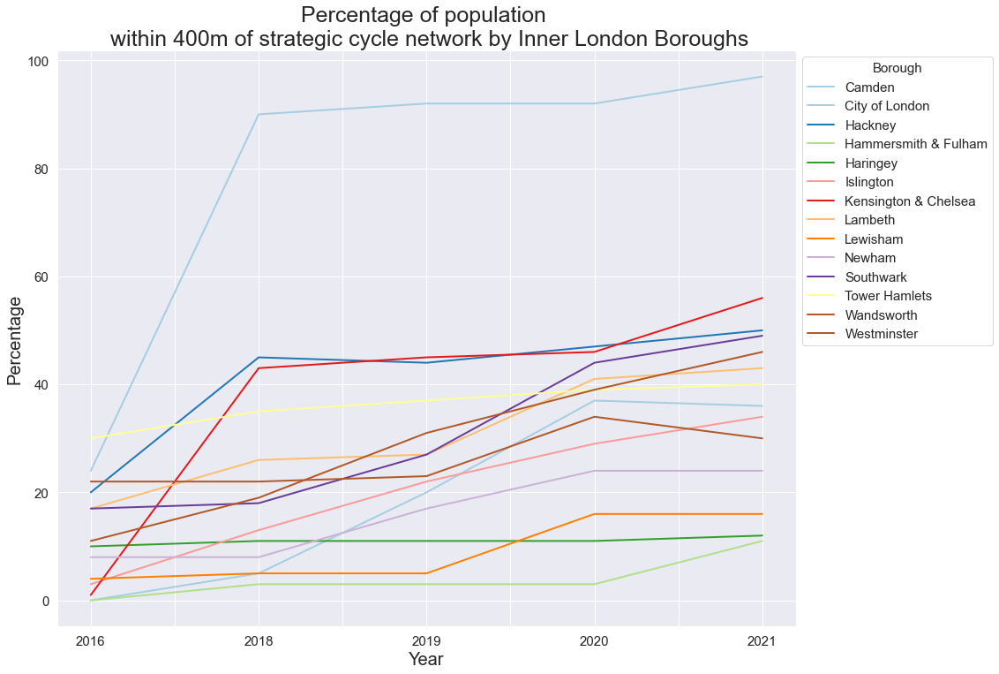

In [654]:
# Create plot.
year_ttl_Inner_M400.plot(x='Year', y=['Camden', 'City of London', 'Hackney', 'Hammersmith & Fulham', 'Haringey', 
                                 'Islington', 'Kensington & Chelsea', 'Lambeth', 'Lewisham', 'Newham', 'Southwark',
                                 'Tower Hamlets', 'Wandsworth', 'Westminster'],
                    kind='line', colormap='Paired', linewidth=2)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Borough', title_fontsize=15)
plt.xlabel('Year', size=20)
plt.ylabel('Percentage', size=20)
plt.title('Percentage of population \n within 400m of strategic cycle network by Inner London Boroughs', 
          fontdict={'fontsize':25})
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

In [655]:
# Select data related to Outer London Boroughs.
Outer_M400 = M400[M400['Area'] == 'Outer'].reset_index().T.reset_index()

# Rename columns.
year_ttl_Outer_M400 = Outer_M400.rename(columns={'index': 'Year', 0: 'Barking & Dagenham', 1: 'Barnet', 2: 'Bexley', 
                                       3: 'Brent', 4: 'Bromley', 5: 'Croydon', 6: 'Ealing', 7: 'Enfield', 
                                       8: 'Greenwich', 9: 'Harrow', 10: 'Havering', 11: 'Hillingdon', 
                                       12: 'Hounslow', 13: 'Kingston upon Thame', 14: 'Merton', 15: 'Redbridge', 
                                       16: 'Richmond upon Thames', 17: 'Sutton', 18: 'Waltham Forest'})

# Drop first three rows.
year_ttl_Outer_M400 = year_ttl_Outer_M400.tail(-3).reset_index(drop=True)

# View DataFrame.
year_ttl_Outer_M400

,Year,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Croydon,Ealing,Enfield,Greenwich,Harrow,Havering,Hillingdon,Hounslow,Kingston upon Thame,Merton,Redbridge,Richmond upon Thames,Sutton,Waltham Forest
0,2016,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,0,0
1,2018,2,0,1,7,0,0,1,0,7,0,0,0,0,4,3,7,0,0,5
2,2019,2,0,1,6,0,0,1,7,13,0,0,0,0,10,4,6,0,0,12
3,2020,5,0,1,8,0,9,6,19,25,0,0,2,8,25,10,7,3,0,33
4,2021,5,0,1,10,3,0,14,29,27,0,0,3,6,24,10,7,3,0,39


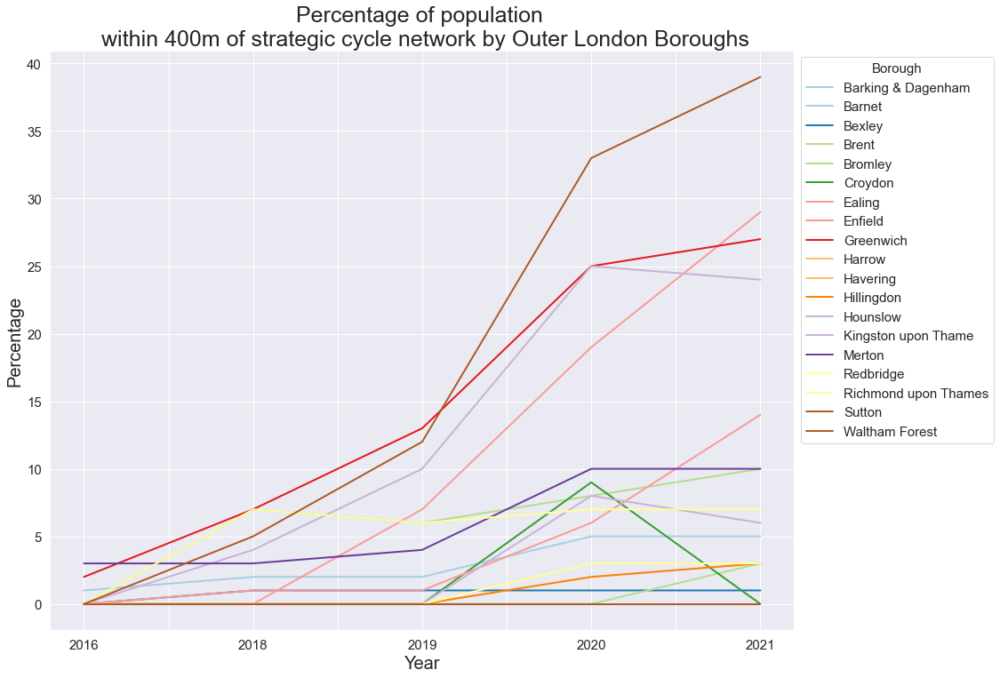

In [656]:
# Create plot.
year_ttl_Outer_M400.plot(x='Year', y=['Barking & Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley', 'Croydon', 'Ealing', 
                                 'Enfield', 'Greenwich', 'Harrow', 'Havering', 'Hillingdon', 'Hounslow', 
                                 'Kingston upon Thame', 'Merton', 'Redbridge', 'Richmond upon Thames', 'Sutton', 
                                 'Waltham Forest'],
                    kind='line', colormap='Paired', linewidth=2)

plt.legend(fontsize = 15, bbox_to_anchor=(1, 1), facecolor='white', title='Borough', title_fontsize=15)
plt.xlabel('Year', size=20)
plt.ylabel('Percentage', size=20)
plt.title('Percentage of population \n within 400m of strategic cycle network by Outer London Boroughs', 
          fontdict={'fontsize':25})
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

# View plot.
plt.show()

**SUMMARY:**

Inner London has better cycling infrastructure than Outer London.

## Usual method of travel to work

In [657]:
# Read the provided CSV file/data set.            
method = pd.read_csv('Usual method of travel to work.csv')

# View DataFrame.
method.head()

,Year,Area,Car,Motorcycle,Bicycle,Bus or coach,Rail,Walk,Other modes
0,2014,Central London,8.5,1.0,3.9,10.0,71.6,4.6,0.3
1,2015,Central London,8.3,1.1,3.8,8.7,72.5,5.0,0.6
2,2016,Central London,8.4,2.1,6.0,8.9,69.0,5.3,0.3
3,2017,Central London,9.0,0.0,5.6,8.4,71.3,4.6,1.1
4,2018,Central London,8.5,0.9,5.5,6.8,71.3,6.1,0.9


In [658]:
# Central London.
method_CL = method[method['Area'] == 'Central London']

# View DataFrame.
method_CL

,Year,Area,Car,Motorcycle,Bicycle,Bus or coach,Rail,Walk,Other modes
0,2014,Central London,8.5,1.0,3.9,10.0,71.6,4.6,0.3
1,2015,Central London,8.3,1.1,3.8,8.7,72.5,5.0,0.6
2,2016,Central London,8.4,2.1,6.0,8.9,69.0,5.3,0.3
3,2017,Central London,9.0,0.0,5.6,8.4,71.3,4.6,1.1
4,2018,Central London,8.5,0.9,5.5,6.8,71.3,6.1,0.9
5,2019,Central London,9.3,1.7,4.4,6.4,73.0,4.7,0.5
6,2020,Central London,8.9,0.9,7.8,8.4,66.2,7.0,0.8
7,2021,Central London,9.8,0.0,9.1,7.4,65.9,6.6,1.2


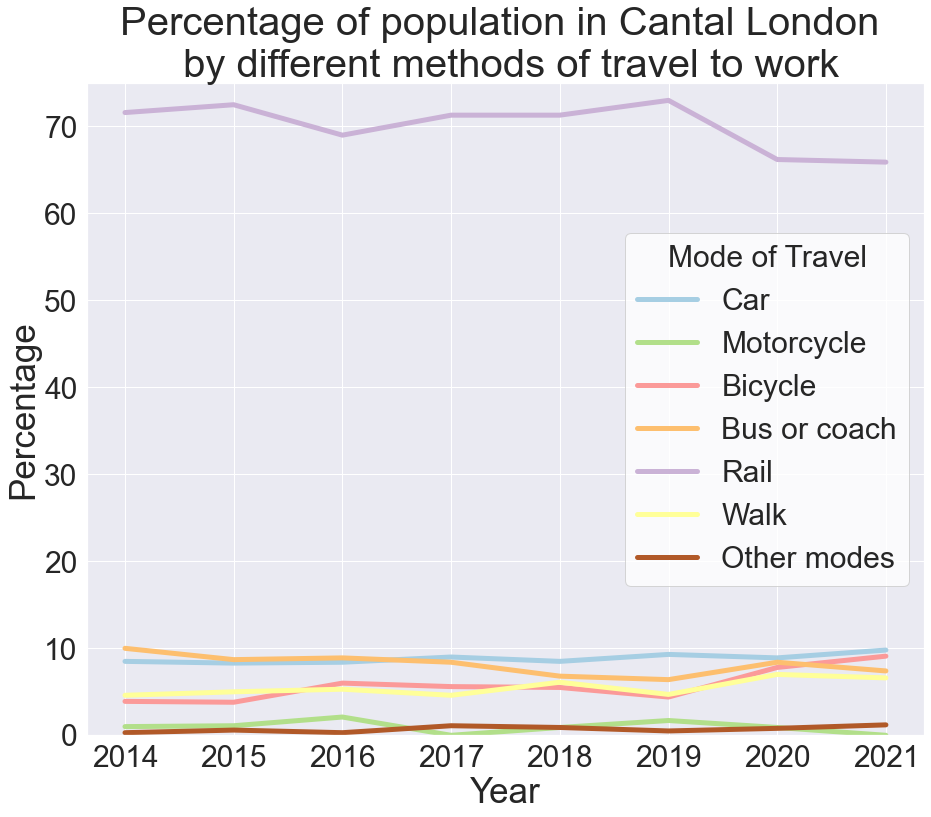

In [659]:
# Create plot.
method_CL.plot(x='Year', y=['Car', 'Motorcycle', 'Bicycle', 'Bus or coach', 'Rail', 'Walk', 'Other modes'],
                    kind='line', colormap='Paired', linewidth=5)
plt.legend(fontsize = 30, facecolor='white', title='Mode of Travel', title_fontsize=30)
plt.xlabel('Year', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Percentage of population in Cantal London \n by different methods of travel to work', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 75)

# View plot.
plt.show()

In [660]:
# Inner London.
method_IL = method[method['Area'] == 'Inner London'].reset_index(drop=True)

# View DataFrame.
method_IL

,Year,Area,Car,Motorcycle,Bicycle,Bus or coach,Rail,Walk,Other modes
0,2014,Inner London,23.6,0.0,4.9,16.6,42.5,10.8,1.6
1,2015,Inner London,21.8,1.6,8.0,15.8,40.7,10.9,1.2
2,2016,Inner London,20.6,0.0,6.7,16.8,42.5,10.7,2.7
3,2017,Inner London,19.6,1.7,6.7,12.5,47.3,11.1,1.0
4,2018,Inner London,20.3,1.2,5.4,14.2,46.7,11.0,1.2
5,2019,Inner London,19.0,1.3,5.8,15.3,47.8,9.7,1.0
6,2020,Inner London,19.7,0.0,8.1,12.3,45.4,12.4,2.0
7,2021,Inner London,18.3,1.4,8.1,16.4,41.3,13.1,1.4


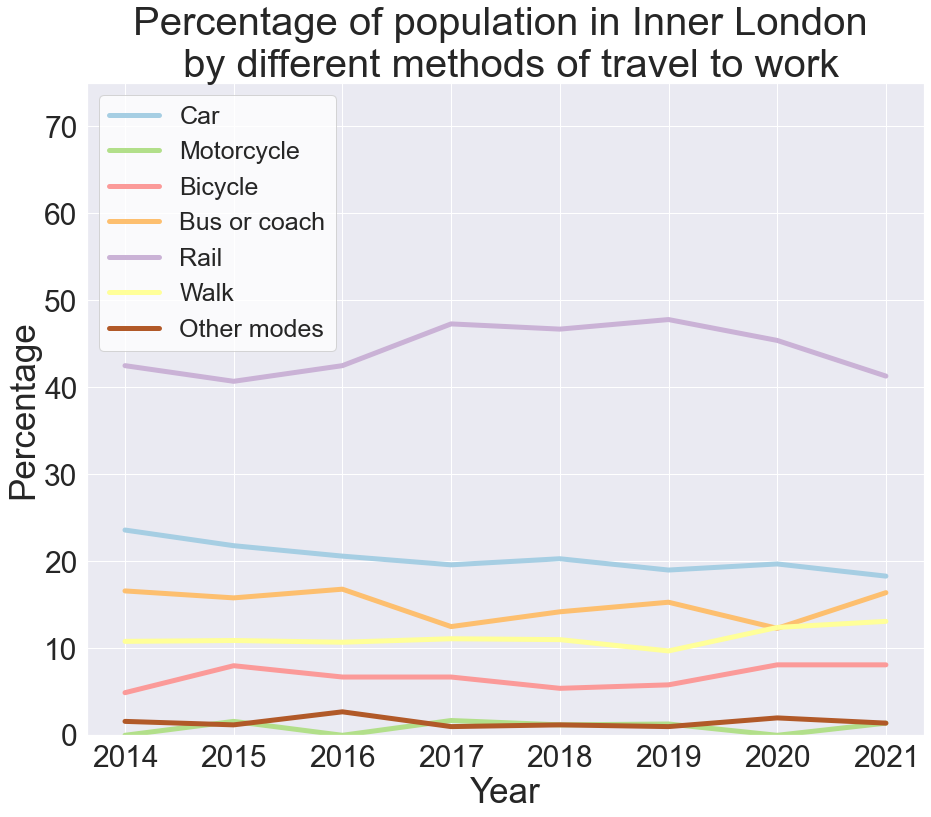

In [661]:
# Create plot.
method_IL.plot(x='Year', y=['Car', 'Motorcycle', 'Bicycle', 'Bus or coach', 'Rail', 'Walk', 'Other modes'],
                    kind='line', colormap='Paired', linewidth=5)
plt.legend(fontsize = 25, facecolor='white', loc='upper left')
plt.xlabel('Year', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Percentage of population in Inner London \n by different methods of travel to work', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 75)

# View plot.
plt.show()

In [662]:
# Outer London.
method_OL = method[method['Area'] == 'Outer London'].reset_index(drop=True)

# View DataFrame.
method_OL

,Year,Area,Car,Motorcycle,Bicycle,Bus or coach,Rail,Walk,Other modes
0,2014,Outer London,59.0,0.9,2.9,14.6,13.6,8.6,0.4
1,2015,Outer London,57.5,0.7,2.8,14.6,14.7,9.1,0.6
2,2016,Outer London,54.1,0.0,3.5,13.5,17.6,10.3,1.1
3,2017,Outer London,57.0,1.2,2.9,14.0,14.6,9.7,0.6
4,2018,Outer London,54.6,0.9,2.7,16.2,14.8,10.2,0.6
5,2019,Outer London,54.5,0.0,2.6,14.8,17.3,9.3,1.5
6,2020,Outer London,56.2,0.0,3.5,14.1,16.9,7.9,1.3
7,2021,Outer London,53.5,0.0,3.0,12.9,17.0,11.7,1.9


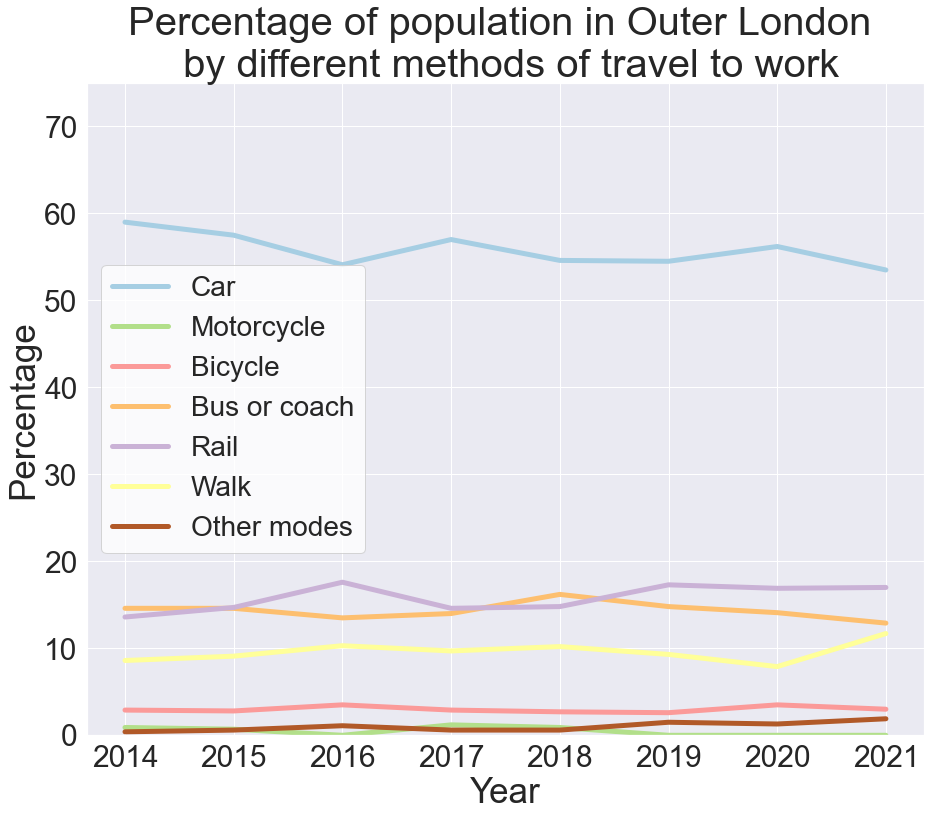

In [663]:
# Create plot.
method_OL.plot(x='Year', y=['Car', 'Motorcycle', 'Bicycle', 'Bus or coach', 'Rail', 'Walk', 'Other modes'],
                    kind='line', colormap='Paired', linewidth=5)
plt.legend(fontsize = 28, facecolor='white')
plt.xlabel('Year', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Percentage of population in Outer London \n by different methods of travel to work', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 75)

# View plot.
plt.show()

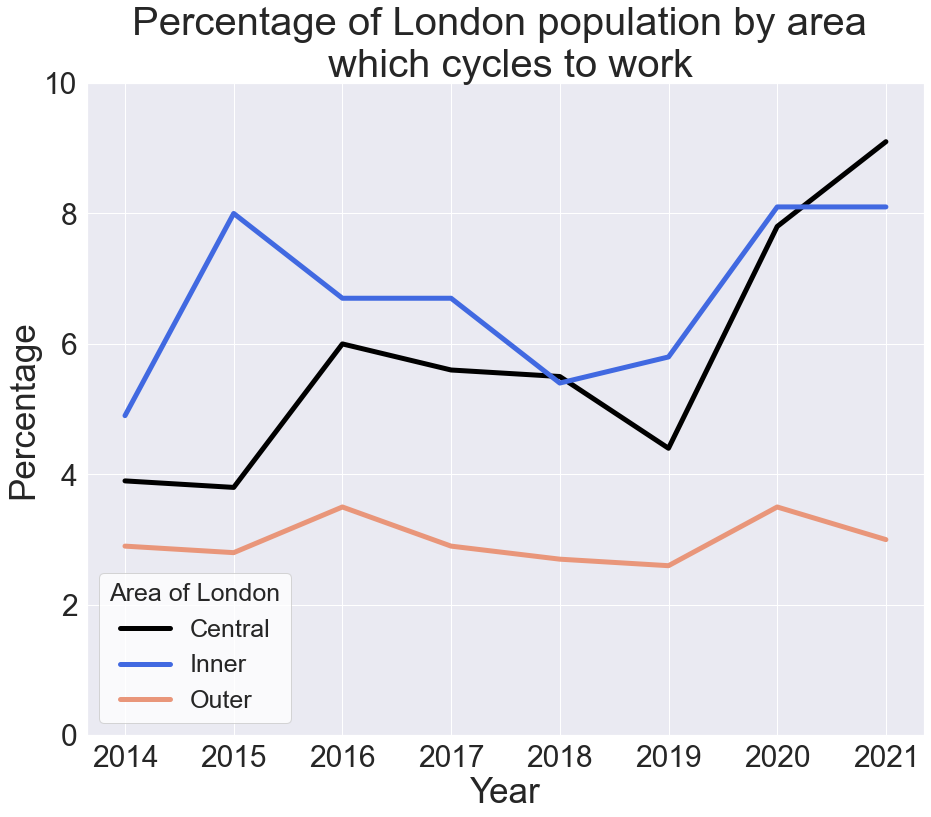

In [664]:
# Create plot.
plt.plot('Year', 'Bicycle', data=method_CL, label = 'Central', linewidth=5, color='black')
plt.plot('Year', 'Bicycle', data=method_IL, label = 'Inner', linewidth=5, color='royalblue')
plt.plot('Year', 'Bicycle', data=method_OL, label = 'Outer', linewidth=5, color='darksalmon')
plt.legend(fontsize = 25, facecolor='white', title='Area of London', title_fontsize=25)
plt.xlabel('Year', size=35)
plt.ylabel('Percentage', size=35)
plt.title('Percentage of London population by area \n which cycles to work', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 10)

# View plot.
plt.show()

## Observations 

**SUMMARY:**

Under 10% of commuters in Inner London and under 5% of commuters in Outer London choose bicycle as the method of travel to work; which makes it the 5th most popular method overall. What is concerning is that the largest percentage of the population in Outer London use cars as the main method of travel to work.

This whole section of modes and distance travel to work highlights the issue we have seen earlier and the potential that outer london has. Outer London has a far higher population rate, lower cycling numbers, and inbalance in its infrastructure compared to inner london and now we have seen that it owns and travels by car significantly more than inner london. 

We believe that by improving the infrastructure in outer london and making the accessability to a safe and secure cycle network will increase cycling numbers both in total but also in minorirty groups. Part of our reasoning in believing infrastructure investment can be a success is the mini holland initiative which we will analyse next .... 

# Mini Hollands

Took a deper dive into looking at Boroughs which were part of the mini holland initiative being; Waltham Forest, Kingston upon Thames and Enfield.

This was because we had seen the importance of infrastructure, and how outer london had comparably less infrastructure compared to inner london. 

In [665]:
# Create mini holland df
mini_hollands = borough_lo[(borough_lo['Borough'].isin(['Waltham Forest', 'Kingston upon Thames',
                                                        'Enfield']))].reset_index()
mini_hollands.head()

,index,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,...,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
0,0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,...,2,1,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
1,1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,...,3,0,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
2,2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,...,2,0,0,2,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
3,3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,...,4,0,0,4,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
4,4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,...,4,1,0,5,2015-06-26,Friday,June,Q2,Waltham Forest,Outer


In [666]:
# drop index column
mini_hollands = mini_hollands.drop(['index'], axis=1)
mini_hollands.head()

,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,0,2,1,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,15,3,0,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,30,2,0,0,2,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,45,4,0,0,4,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,0,4,1,0,5,2015-06-26,Friday,June,Q2,Waltham Forest,Outer


In [667]:
# group mini hollands by borough and year
mini_hollands_group = mini_hollands.groupby(['Borough', 'Survey wave (year)']).sum('Total cycles').reset_index()
mini_hollands_group.head()

,Borough,Survey wave (year),Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,Enfield,2015,34560,57600,1496,347,0,1843
1,Enfield,2016,34560,57600,1339,247,2,1588
2,Enfield,2017,34560,57600,1686,278,7,1971
3,Enfield,2018,34560,57600,1568,252,9,1829
4,Enfield,2019,34560,57600,1342,212,7,1561


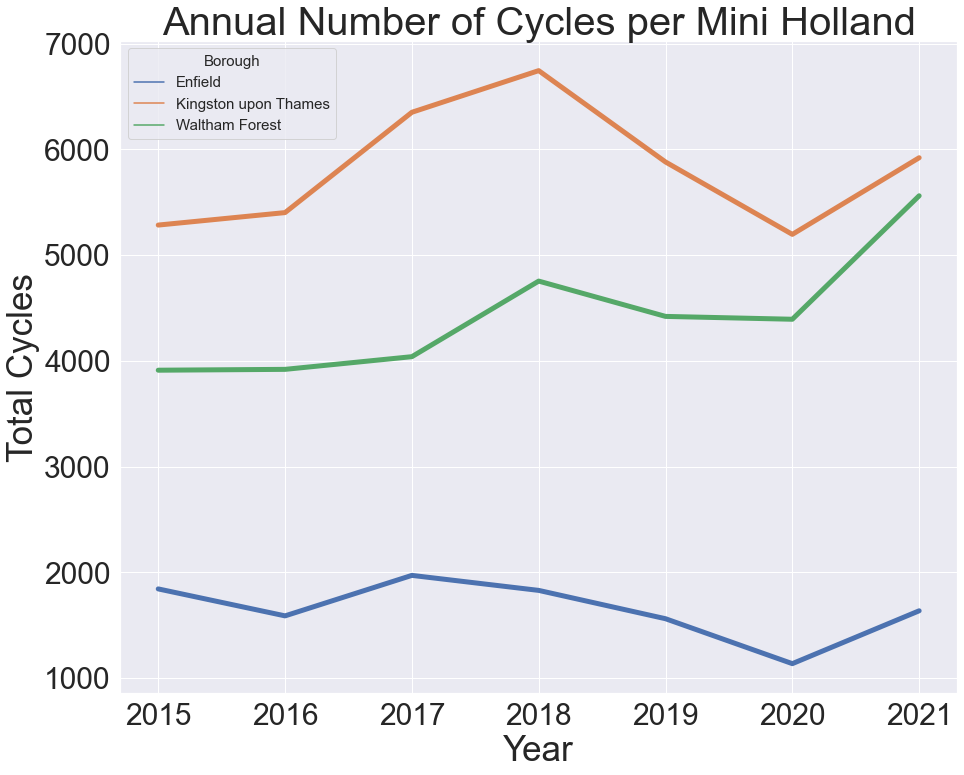

In [668]:
# Plot graph showing the trends over time
nc_mini_holland = sns.lineplot(x='Survey wave (year)', y='Total cycles',
                        hue='Borough', lw=5, data=mini_hollands_group, ci=None)

nc_mini_holland.legend(title='Borough', loc='upper left', title_fontsize=15, fontsize=15)
nc_mini_holland.set_xlabel('Year')
nc_mini_holland.set_ylabel('Total Cycles')
nc_mini_holland.set_title("Annual Number of Cycles per Mini Holland")
nc_mini_holland.title.set_fontsize(40)
nc_mini_holland.xaxis.label.set_fontsize(35)
nc_mini_holland.yaxis.label.set_fontsize(35)
nc_mini_holland.tick_params(axis='both', which='major', labelsize=30)

plt.savefig('nc_mini_holland.png')

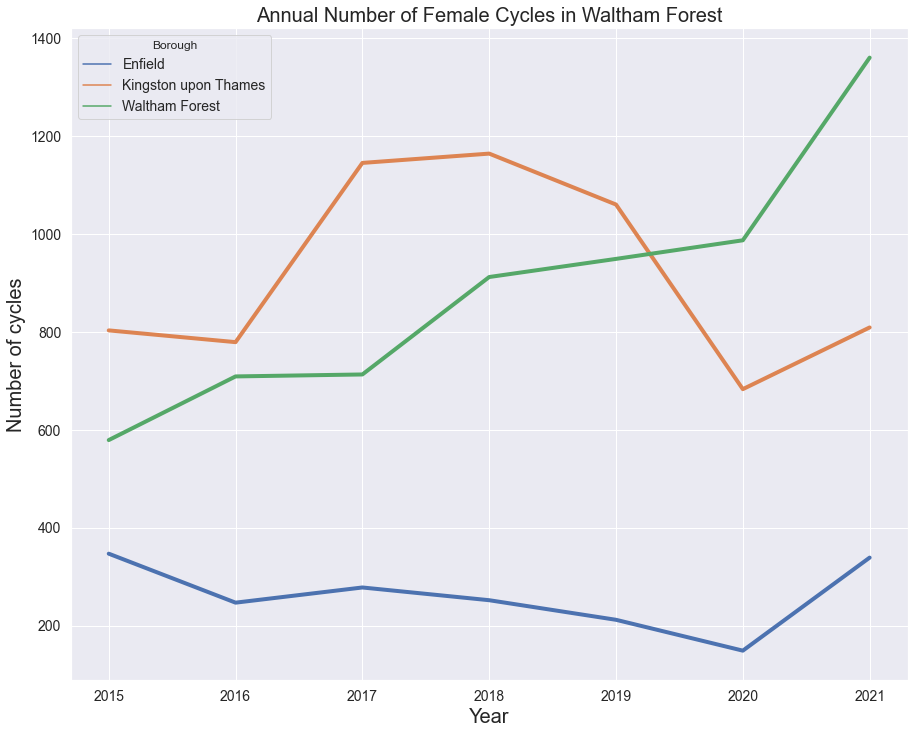

In [669]:
# Look soley a female cycling numbers in mini hollands
# Plot graph showing the trends over time
nc_mini_female = sns.lineplot(x='Survey wave (year)', y='Number of female cycles',
                        hue='Borough', lw=4, data=mini_hollands_group, ci=None)

nc_mini_female.legend(title='Borough', loc='upper left', fontsize=14)
nc_mini_female.set_xlabel('Year')
nc_mini_female.set_ylabel('Number of cycles')
nc_mini_female.set_title("Annual Number of Female Cycles in Waltham Forest")
nc_mini_female.title.set_fontsize(20)
nc_mini_female.xaxis.label.set_fontsize(20)
nc_mini_female.yaxis.label.set_fontsize(20)
nc_mini_female.tick_params(axis='both', which='major', labelsize=14)

plt.savefig('mini_female.png')

Following some wider research and the graphs above, particularly the female graph we decided to take a deeper look into Waltham Forest. 

## Waltham Forest - Case Study

In [670]:
# create subset looking at waltham forest
waltham_forest = mini_hollands[(mini_hollands['Borough'].isin(['Waltham Forest']))].reset_index()
waltham_forest.head()

,index,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,...,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
0,0,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0600 - 0615,Early Morning (06:00-07:00),Northbound,6,...,2,1,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
1,1,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0615 - 0630,Early Morning (06:00-07:00),Northbound,6,...,3,0,0,3,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
2,2,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0630 - 0645,Early Morning (06:00-07:00),Northbound,6,...,2,0,0,2,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
3,3,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0645 - 0700,Early Morning (06:00-07:00),Northbound,6,...,4,0,0,4,2015-06-26,Friday,June,Q2,Waltham Forest,Outer
4,4,2015,OUTCY001,High Road Leyton,"ven, 26/06/15",Dry,0700 - 0715,AM peak (07:00-10:00),Northbound,7,...,4,1,0,5,2015-06-26,Friday,June,Q2,Waltham Forest,Outer


In [671]:
# create subset
waltham_forest_ss = waltham_forest.groupby(['Survey wave (year)']).sum().reset_index()
waltham_forest_ss

,Survey wave (year),index,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,2015,52886400,31104,51840,3325,579,8,3912
1,2016,53181312,31104,51840,3203,709,8,3920
2,2017,53476224,31104,51840,3322,713,5,4040
3,2018,53771136,31104,51840,3832,912,11,4755
4,2019,54066048,31104,51840,3468,949,4,4421
5,2020,19299840,13824,23040,3388,987,19,4394
6,2021,54492032,31104,51840,4199,1360,3,5562


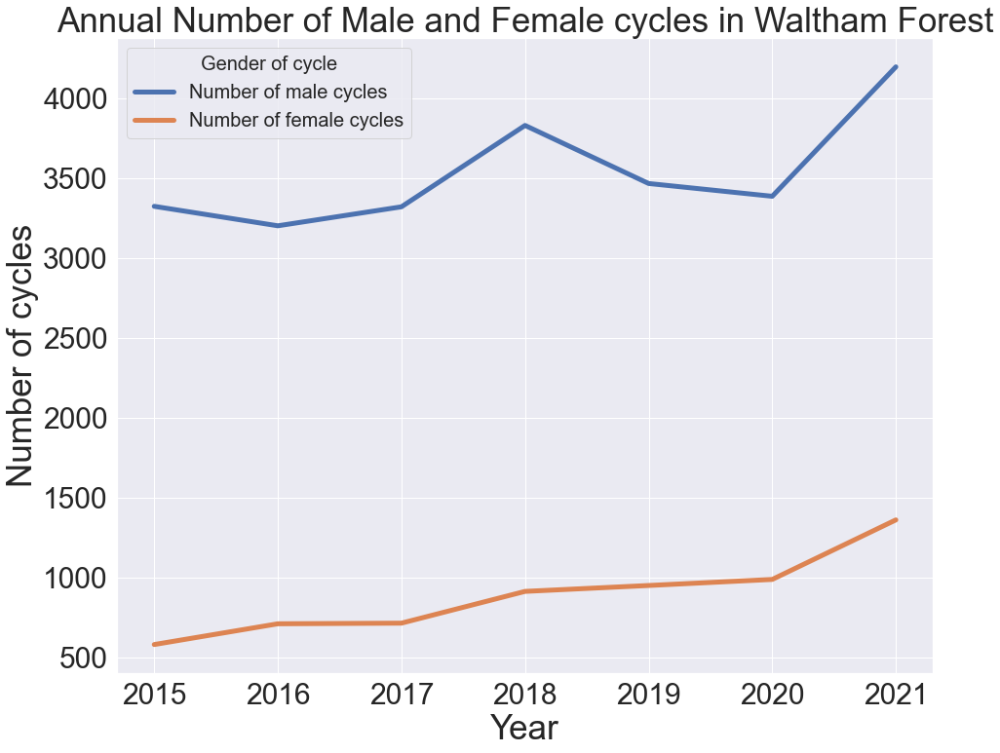

In [672]:
# Compare male and female cycles in waltham forest
# Plot graph showing the trends over time
nc_wal_for = waltham_forest_ss.plot(x='Survey wave (year)', y=['Number of male cycles', 'Number of female cycles'],
                                    kind='line', lw=5, figsize=(15,12))

nc_wal_for.legend(title='Gender of cycle', loc='upper left',title_fontsize=20, fontsize=20)
nc_wal_for.set_xlabel('Year')
nc_wal_for.set_ylabel('Number of cycles')
nc_wal_for.set_title("Annual Number of Male and Female cycles in Waltham Forest")
nc_wal_for.title.set_fontsize(35)
nc_wal_for.xaxis.label.set_fontsize(35)
nc_wal_for.yaxis.label.set_fontsize(35)
nc_wal_for.tick_params(axis='both', which='major', labelsize=30)

plt.savefig('waltham_forest.png')

In [673]:
# Select data related to Waltham Forest.
WF_M400 = M400[M400['Borough'] == 'Waltham Forest'].T.reset_index()

# Rename columns.
year_ttl_WF_M400 = WF_M400.rename(columns={'index': 'Year', 32: 'Percentage'})

# Drop first three rows.
year_ttl_WF_M400 = year_ttl_WF_M400.tail(-2).reset_index(drop=True)


# View DataFrame.
year_ttl_WF_M400

,Year,Percentage
0,2016,0
1,2018,5
2,2019,12
3,2020,33
4,2021,39


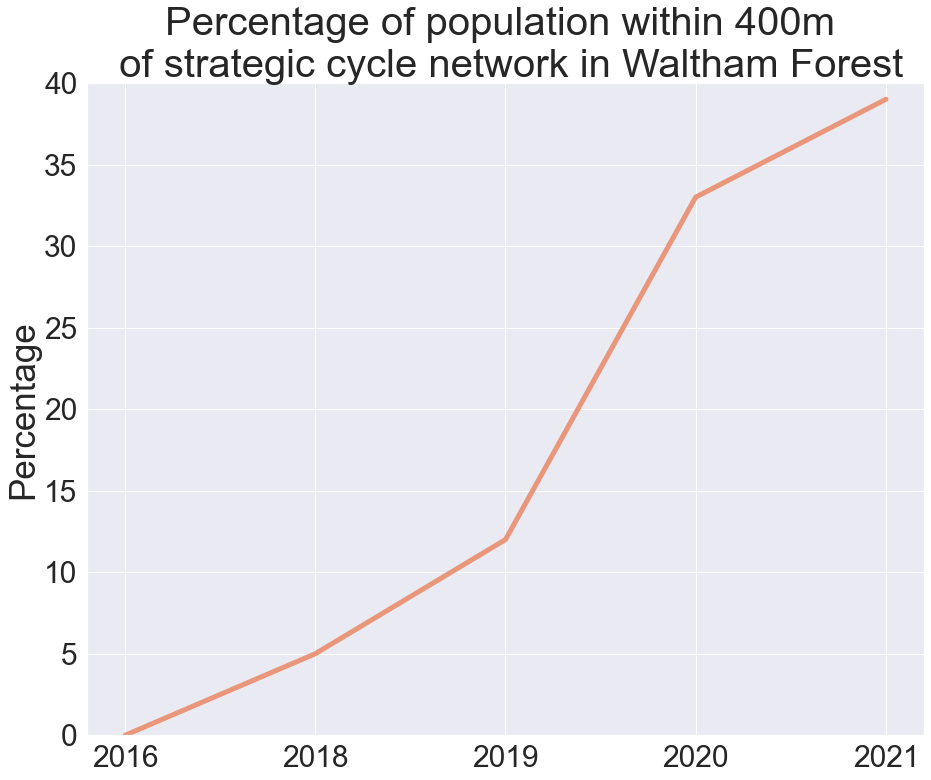

In [674]:
# Create plot.
plt.plot('Year', 'Percentage', data=year_ttl_WF_M400, linewidth=5, color='darksalmon')
plt.ylabel('Percentage', size=35)
plt.title('Percentage of population within 400m \n of strategic cycle network in Waltham Forest', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 40)

# View plot.
plt.show()

We can see that Waltham Forest experiences a siginficant rise in both male and female cycling numbers over the analysed period. 

Female cycling is especially important as rates of female cyclists is much lower in the vast majority of boroughs compared to male cyclists. Therefore, this could be a important group for TFL and MLS to target as there is serious potential for growth and reduction in other modes of travel. 

This TFL report shows how safety is a primary concern and barrier for female cyclists https://content.tfl.gov.uk/cycling-potential-in-londons-diverse-communities-2021.pdf - slide 14. 

The success in Waltham Forest cycling numbers suggests that the improvement in infrastructure and therefore improving cyclists safety has contributed to the rise in female cycling.

We can also see how the investment in infrastructure has seen a dramatic rise in the accessability of cycling network within 400m for Waltham Forest residents.

## Enfield Case Study

We also decided to take a look at Enfield in closer detail, as we saw looking at the mini holland visualisation above that is is performing significantly worse than the other boroughs whilst receiving similar investment and infrastructure. 

Looked into what other factors might be causing poor cycling rates.

In [675]:
# create subset looking at enfield
enfield = mini_hollands[(mini_hollands['Borough'].isin(['Enfield']))].reset_index()
enfield.head()

,index,Survey wave (year),Site ID,Location,Survey date,Weather,Time,Period,Direction,Start hour,...,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles,Date,Day,Month,Quarter,Borough,Functional cycling area
0,896,2015,OUTCY005,Nags Head Road,"lun, 13/07/15",Wet,0600 - 0615,Early Morning (06:00-07:00),Eastbound,6,...,0,0,0,0,2015-07-13,Monday,July,Q3,Enfield,Outer
1,897,2015,OUTCY005,Nags Head Road,"lun, 13/07/15",Wet,0615 - 0630,Early Morning (06:00-07:00),Eastbound,6,...,0,0,0,0,2015-07-13,Monday,July,Q3,Enfield,Outer
2,898,2015,OUTCY005,Nags Head Road,"lun, 13/07/15",Wet,0630 - 0645,Early Morning (06:00-07:00),Eastbound,6,...,2,0,0,2,2015-07-13,Monday,July,Q3,Enfield,Outer
3,899,2015,OUTCY005,Nags Head Road,"lun, 13/07/15",Wet,0645 - 0700,Early Morning (06:00-07:00),Eastbound,6,...,0,0,0,0,2015-07-13,Monday,July,Q3,Enfield,Outer
4,900,2015,OUTCY005,Nags Head Road,"lun, 13/07/15",Wet,0700 - 0715,AM peak (07:00-10:00),Eastbound,7,...,2,0,0,2,2015-07-13,Monday,July,Q3,Enfield,Outer


In [676]:
# create subset grouping enfield by year
enfield_ss = enfield.groupby(['Survey wave (year)']).sum().reset_index()
enfield_ss

,Survey wave (year),index,Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,2015,60619520,34560,57600,1496,347,0,1843
1,2016,60947200,34560,57600,1339,247,2,1588
2,2017,61274880,34560,57600,1686,278,7,1971
3,2018,61602560,34560,57600,1568,252,9,1829
4,2019,61930240,34560,57600,1342,212,7,1561
5,2020,28851584,17280,28800,984,149,3,1136
6,2021,57400128,32832,54720,1296,339,1,1636


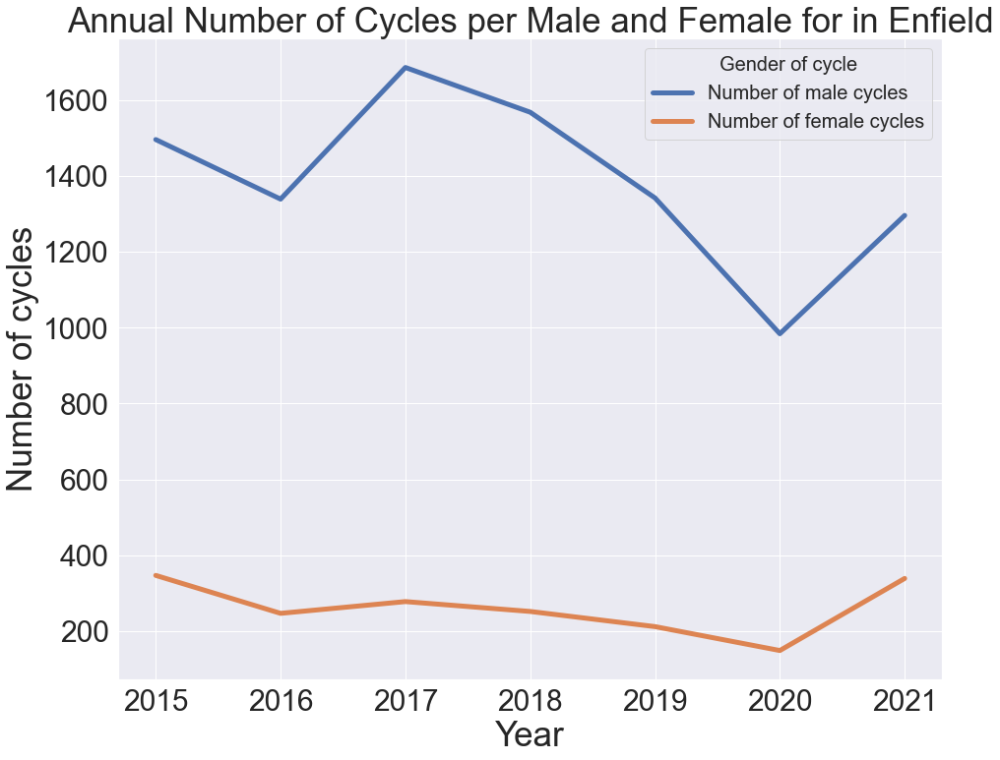

In [677]:
nc_enfield = enfield_ss.plot(x='Survey wave (year)', y=['Number of male cycles', 'Number of female cycles'],
                                    kind='line', lw=5)

nc_enfield.legend(title='Gender of cycle', loc='upper right', title_fontsize=20, fontsize=20)
nc_enfield.set_xlabel('Year')
nc_enfield.set_ylabel('Number of cycles')
nc_enfield.set_title("Annual Number of Cycles per Male and Female for in Enfield")
nc_enfield.title.set_fontsize(35)
nc_enfield.xaxis.label.set_fontsize(35)
nc_enfield.yaxis.label.set_fontsize(35)
nc_enfield.tick_params(axis='both', which='major', labelsize=30)


plt.savefig('nc_enfield.png')

In [678]:
# Select data related to Enfield.
E_M400 = M400[M400['Borough'] == 'Enfield'].T.reset_index()

# Rename columns.
year_ttl_E_M400 = E_M400.rename(columns={'index': 'Year', 21: 'Percentage'})

# Drop first three rows.
year_ttl_E_M400 = year_ttl_E_M400.tail(-2).reset_index(drop=True)

# View DataFrame.
year_ttl_E_M400

,Year,Percentage
0,2016,0
1,2018,0
2,2019,7
3,2020,19
4,2021,29


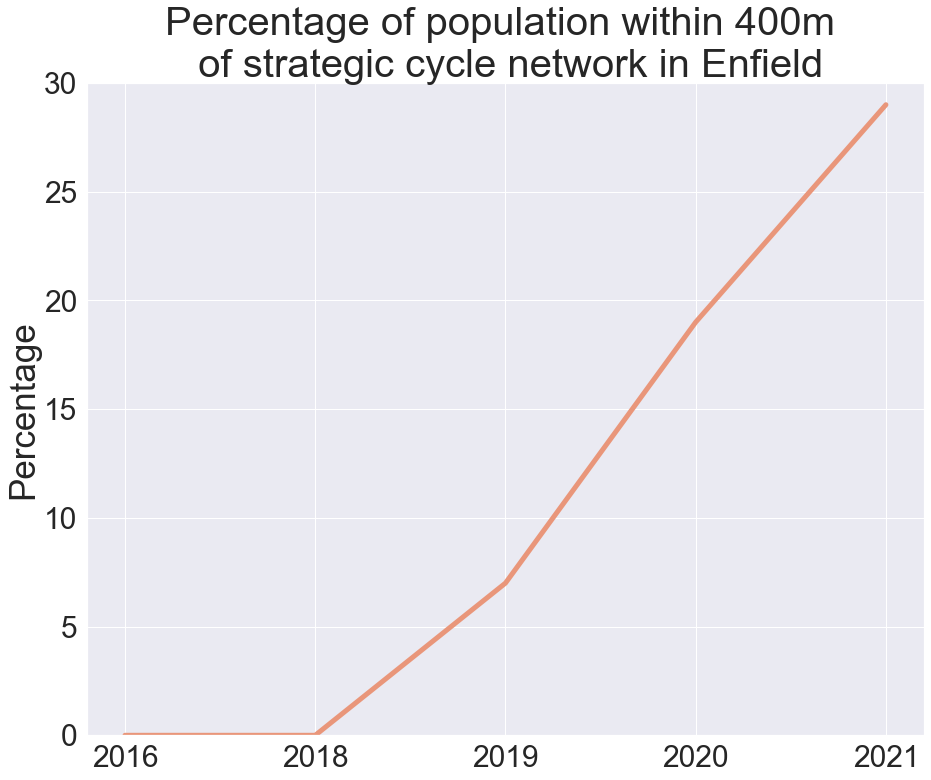

In [679]:
# Create plot.
plt.plot('Year', 'Percentage', data=year_ttl_E_M400, linewidth=5, color='darksalmon')
plt.ylabel('Percentage', size=35)
plt.title('Percentage of population within 400m \n of strategic cycle network in Enfield', 
          fontdict={'fontsize':40})
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
plt.ylim(0, 30)

# View plot.
plt.show()

Can see that for male and female cycles there is a deceline pre covid-19, with a slight bounce back since. 

As mentioned above, Enfield has had very similar investment to Waltham Forest, which we can see by a similar rise in access to a cycling network within 400m. So why is Enfield performing so poorly compared to the likes of Waltham Forest? 

Looked into potential causes for this, one of which being population of boroughs and their ethnic split and the income of said boroughs.

Below, firstly is a deeper dive into ethnic groups and then bringing it back to Enfield and relating to the graph above.

# Ethnic / Minority Groups

In [680]:
# import external data sources from ONS
ethnic_boro = pd.read_excel('ethnic_groups_14_20.xlsx')
ethnic_boro.head()

,Code,Area,2014 White,2014 Asian,2014 Black,2014 Mixed/ Other,2014 Total,2015 White,2015 Asian,2015 Black,...,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total,2020 White,2020 Asian,2020 Black,2020 Mixed/ Other,2020 Total
0,E09000001,City of London,-,-,-,-,-,-,-,-,...,12000,-,-,-,12000,-,-,-,-,-
1,E09000002,Barking and Dagenham,99000,33000,44000,22000,198000,95000,41000,52000,...,108000,43000,59000,8000,219000,99000,55000,51000,16000,222000
2,E09000003,Barnet,242000,53000,16000,57000,367000,247000,54000,29000,...,257000,61000,24000,55000,396000,255000,79000,28000,35000,398000
3,E09000004,Bexley,193000,10000,30000,6000,239000,195000,15000,23000,...,207000,15000,20000,9000,251000,188000,20000,28000,18000,254000
4,E09000005,Brent,117000,99000,53000,49000,318000,108000,108000,55000,...,124000,101000,53000,53000,330000,117000,138000,40000,37000,332000


In [681]:
# rename for consistency
ethnic_boro = ethnic_boro.replace(to_replace="Barking and Dagenham",
                                              value="Barking & Dagenham")

ethnic_boro.head()

,Code,Area,2014 White,2014 Asian,2014 Black,2014 Mixed/ Other,2014 Total,2015 White,2015 Asian,2015 Black,...,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total,2020 White,2020 Asian,2020 Black,2020 Mixed/ Other,2020 Total
0,E09000001,City of London,-,-,-,-,-,-,-,-,...,12000,-,-,-,12000,-,-,-,-,-
1,E09000002,Barking & Dagenham,99000,33000,44000,22000,198000,95000,41000,52000,...,108000,43000,59000,8000,219000,99000,55000,51000,16000,222000
2,E09000003,Barnet,242000,53000,16000,57000,367000,247000,54000,29000,...,257000,61000,24000,55000,396000,255000,79000,28000,35000,398000
3,E09000004,Bexley,193000,10000,30000,6000,239000,195000,15000,23000,...,207000,15000,20000,9000,251000,188000,20000,28000,18000,254000
4,E09000005,Brent,117000,99000,53000,49000,318000,108000,108000,55000,...,124000,101000,53000,53000,330000,117000,138000,40000,37000,332000


In [682]:
# Rename Area column
ethnic_boro = ethnic_boro.rename(columns={'Area': 'Borough'})
ethnic_boro.head()

,Code,Borough,2014 White,2014 Asian,2014 Black,2014 Mixed/ Other,2014 Total,2015 White,2015 Asian,2015 Black,...,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total,2020 White,2020 Asian,2020 Black,2020 Mixed/ Other,2020 Total
0,E09000001,City of London,-,-,-,-,-,-,-,-,...,12000,-,-,-,12000,-,-,-,-,-
1,E09000002,Barking & Dagenham,99000,33000,44000,22000,198000,95000,41000,52000,...,108000,43000,59000,8000,219000,99000,55000,51000,16000,222000
2,E09000003,Barnet,242000,53000,16000,57000,367000,247000,54000,29000,...,257000,61000,24000,55000,396000,255000,79000,28000,35000,398000
3,E09000004,Bexley,193000,10000,30000,6000,239000,195000,15000,23000,...,207000,15000,20000,9000,251000,188000,20000,28000,18000,254000
4,E09000005,Brent,117000,99000,53000,49000,318000,108000,108000,55000,...,124000,101000,53000,53000,330000,117000,138000,40000,37000,332000


In [683]:
# View only white populations 
white = ethnic_boro.loc[:, ['Code', 'Borough', '2014 White', '2015 White', '2016 White', 
                            '2017 White', '2018 White', '2019 White', '2020 White']]
                            
white.head()

,Code,Borough,2014 White,2015 White,2016 White,2017 White,2018 White,2019 White,2020 White
0,E09000001,City of London,-,-,-,10000,-,12000,-
1,E09000002,Barking & Dagenham,99000,95000,106000,104000,109000,108000,99000
2,E09000003,Barnet,242000,247000,233000,264000,250000,257000,255000
3,E09000004,Bexley,193000,195000,192000,194000,195000,207000,188000
4,E09000005,Brent,117000,108000,117000,121000,102000,124000,117000


In [684]:
white_outer = white[(white['Borough'].isin(['Waltham Forest', 'Redbridge', 'Barking & Dagenham', 'Havering',
                                         'Enfield', 'Newham', 'Haringey', 'Greenwich', 'Croydon',
                                         'Lewisham', 'Bexley', 'Bromley', 'Kingston upon Thames', 'Sutton',
                                         'Merton', 'Richmond upon Thames', 'Hillingdon', 'Ealing',
                                         'Hounslow', 'Barnet', 'Harrow', 'Brent', 'Lambeth', 'Wandsworth']))].reset_index() 

white_outer.head()

,index,Code,Borough,2014 White,2015 White,2016 White,2017 White,2018 White,2019 White,2020 White
0,1,E09000002,Barking & Dagenham,99000,95000,106000,104000,109000,108000,99000
1,2,E09000003,Barnet,242000,247000,233000,264000,250000,257000,255000
2,3,E09000004,Bexley,193000,195000,192000,194000,195000,207000,188000
3,4,E09000005,Brent,117000,108000,117000,121000,102000,124000,117000
4,5,E09000006,Bromley,269000,259000,272000,255000,267000,262000,264000


In [685]:
# sort by population in 2019 to compare to 2019 cycles and pay
white_outer.sort_values(by=['2019 White'], ascending=False)

,index,Code,Borough,2014 White,2015 White,2016 White,2017 White,2018 White,2019 White,2020 White
4,5,E09000006,Bromley,269000,259000,272000,255000,267000,262000,264000
1,2,E09000003,Barnet,242000,247000,233000,264000,250000,257000,255000
23,31,E09000032,Wandsworth,224000,233000,227000,227000,242000,245000,249000
5,7,E09000008,Croydon,229000,221000,206000,213000,227000,228000,224000
2,3,E09000004,Bexley,193000,195000,192000,194000,195000,207000,188000
11,15,E09000016,Havering,211000,217000,219000,219000,216000,202000,196000
15,21,E09000022,Lambeth,209000,199000,203000,217000,172000,200000,215000
7,9,E09000010,Enfield,200000,192000,195000,213000,206000,199000,218000
16,22,E09000023,Lewisham,170000,161000,186000,189000,193000,195000,194000
9,13,E09000014,Haringey,160000,164000,168000,180000,180000,182000,208000


In [686]:
# look at full time earnings for 2019
# Do boroughs with high white pop also have higher pay
outer_ft.sort_values(by=['2019 Pay (£)'], ascending=False)

,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
20,00BD,Richmond upon Thames,763.9,743.9,784.6,739.9,799.4,820.3,885.0,812.5
23,00BJ,Wandsworth,708.3,719.7,762.3,757.4,773.5,811.8,807.0,842.9
4,00AF,Bromley,697.9,682.1,714.5,737.4,753.7,785.3,805.9,787.1
14,00AX,Kingston upon Thames,704.2,710.2,707.8,706.9,736.7,742.8,759.4,766.6
15,00AY,Lambeth,628.3,616.5,616.2,666.1,689.9,714.4,766.6,746.4
17,00BA,Merton,614.2,619.6,663.3,675.0,688.3,710.4,703.7,681.7
10,00AQ,Harrow,592.9,626.9,636.4,656.1,671.6,693.5,715.4,748.6
19,00BC,Redbridge,616.4,653.7,603.0,644.9,633.2,683.9,703.9,732.4
22,00BH,Waltham Forest,542.9,546.9,577.1,574.9,622.9,680.3,716.2,727.7
8,00AL,Greenwich,590.5,597.3,597.6,638.9,659.9,679.6,684.0,740.0


In [687]:
# subset for just 2019 white pop
white_outer_2019 = white_outer.loc[:, ['Code', 'Borough', '2019 White']]
white_outer_2019.head()

,Code,Borough,2019 White
0,E09000002,Barking & Dagenham,108000
1,E09000003,Barnet,257000
2,E09000004,Bexley,207000
3,E09000005,Brent,124000
4,E09000006,Bromley,262000


In [688]:
# fulltime earnings for 2019
outer_ft_2019 = outer_ft.loc[:, ['Code', 'Borough', '2019 Pay (£)']]
outer_ft_2019.head()

,Code,Borough,2019 Pay (£)
0,00AB,Barking & Dagenham,589.8
1,00AC,Barnet,677.5
2,00AD,Bexley,671.0
3,00AE,Brent,609.6
4,00AF,Bromley,785.3


In [689]:
# merge the two df 
white_outer_ft_19 = pd.merge(white_outer_2019,
                 outer_ft_2019[['Borough', '2019 Pay (£)']],
                 on='Borough')
                             
white_outer_ft_19.head()

,Code,Borough,2019 White,2019 Pay (£)
0,E09000002,Barking & Dagenham,108000,589.8
1,E09000003,Barnet,257000,677.5
2,E09000004,Bexley,207000,671.0
3,E09000005,Brent,124000,609.6
4,E09000006,Bromley,262000,785.3


In [690]:
# sort by ft pay 2019
white_outer_ft_19.sort_values(by=['2019 Pay (£)'], ascending=False)

,Code,Borough,2019 White,2019 Pay (£)
20,E09000027,Richmond upon Thames,167000,820.3
23,E09000032,Wandsworth,245000,811.8
4,E09000006,Bromley,262000,785.3
14,E09000021,Kingston upon Thames,130000,742.8
15,E09000022,Lambeth,200000,714.4
17,E09000024,Merton,121000,710.4
10,E09000015,Harrow,106000,693.5
19,E09000026,Redbridge,145000,683.9
22,E09000031,Waltham Forest,180000,680.3
8,E09000011,Greenwich,175000,679.6


Nothing to suggest a particularly strong correlation between pay and white population for the year of 2019. There are some boroughs with high white population and also have high pay such as wandsworth, bromley and lambeth.

However, the pay for these boroughs is comparable to boroughs with lower white populations such as Richmond upon Thames, Kingston upon Thames and Merton. Additionally there is Lewisham and Havering which have high white population and lower earnings. 

It is important to note that Newham, Brent and Barking & Dagenham have some of the lowest white populations and lowest ft earnings.

In [691]:
# View boroughs sorted by descending white population
white_outer_2019.sort_values(by=['2019 White'], ascending=False)

,Code,Borough,2019 White
4,E09000006,Bromley,262000
1,E09000003,Barnet,257000
23,E09000032,Wandsworth,245000
5,E09000008,Croydon,228000
2,E09000004,Bexley,207000
11,E09000016,Havering,202000
15,E09000022,Lambeth,200000
7,E09000010,Enfield,199000
16,E09000023,Lewisham,195000
9,E09000014,Haringey,182000


In [692]:
# view outer total cycles in 2019 in descending order
outer_reshape.loc[:, ['Borough', '2019 Total cycles']].sort_values(by=['2019 Total cycles'], ascending=False)

,Borough,2019 Total cycles
20,Richmond upon Thames,10730
6,Ealing,7455
13,Hounslow,6433
18,Newham,6144
14,Kingston upon Thames,5882
16,Lewisham,4796
22,Waltham Forest,4421
17,Merton,4294
9,Haringey,3743
3,Brent,3553


Comparing the two tables above:

When looking at the year 2019 which is the most recent year in both dataframe, unaffected by Covid-19. Unable to see any correlation or pattern between, earnings and cycling in boroughs which have a high white population, there does however seem to be some suggestion that earnings and cycling could be lower in boroughs (Newham, Brent and Barking & Dagenham) like  with a lower white population and therefore perhaps one ethnic groups is being marginalised. 

Therefore, looked further into Black and Asian populations in boroughs.

## Black cyclists in Outer London

Took a deeper dive into looking at populations with higher black population, cycling numbers for total and female in outer london and earnings 

In [693]:
# view overall ethnic df
ethnic_boro.head()

,Code,Borough,2014 White,2014 Asian,2014 Black,2014 Mixed/ Other,2014 Total,2015 White,2015 Asian,2015 Black,...,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total,2020 White,2020 Asian,2020 Black,2020 Mixed/ Other,2020 Total
0,E09000001,City of London,-,-,-,-,-,-,-,-,...,12000,-,-,-,12000,-,-,-,-,-
1,E09000002,Barking & Dagenham,99000,33000,44000,22000,198000,95000,41000,52000,...,108000,43000,59000,8000,219000,99000,55000,51000,16000,222000
2,E09000003,Barnet,242000,53000,16000,57000,367000,247000,54000,29000,...,257000,61000,24000,55000,396000,255000,79000,28000,35000,398000
3,E09000004,Bexley,193000,10000,30000,6000,239000,195000,15000,23000,...,207000,15000,20000,9000,251000,188000,20000,28000,18000,254000
4,E09000005,Brent,117000,99000,53000,49000,318000,108000,108000,55000,...,124000,101000,53000,53000,330000,117000,138000,40000,37000,332000


In [694]:
# subset for ethnic pop in 2019
ethinic_2019 = ethnic_boro.loc[:, ['Code', 'Borough', '2019 White', '2019 Asian', '2019 Black',
                                    '2019 Mixed/ Other', '2019 Total']]

ethinic_2019.head()

,Code,Borough,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total
0,E09000001,City of London,12000,-,-,-,12000
1,E09000002,Barking & Dagenham,108000,43000,59000,8000,219000
2,E09000003,Barnet,257000,61000,24000,55000,396000
3,E09000004,Bexley,207000,15000,20000,9000,251000
4,E09000005,Brent,124000,101000,53000,53000,330000


In [695]:
# subset by only outer boroughs
outer_ethnic_2019 = ethinic_2019[(ethinic_2019['Borough'].isin(['Waltham Forest', 'Redbridge', 'Barking & Dagenham', 
                                                              'Havering', 'Enfield', 'Newham', 'Haringey',
                                                              'Greenwich', 'Croydon', 'Lewisham', 'Bexley',
                                                              'Bromley', 'Kingston upon Thames', 'Sutton', 'Merton',
                                                              'Richmond upon Thames', 'Hillingdon', 'Ealing',
                                                              'Hounslow', 'Barnet', 'Harrow', 'Brent', 
                                                              'Lambeth', 'Wandsworth']))].reset_index() 

outer_ethnic_2019.head()

,index,Code,Borough,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total
0,1,E09000002,Barking & Dagenham,108000,43000,59000,8000,219000
1,2,E09000003,Barnet,257000,61000,24000,55000,396000
2,3,E09000004,Bexley,207000,15000,20000,9000,251000
3,4,E09000005,Brent,124000,101000,53000,53000,330000
4,5,E09000006,Bromley,262000,26000,24000,23000,335000


In [696]:
# drop index column
outer_ethnic_2019 = outer_ethnic_2019.drop(['index'], axis=1)
outer_ethnic_2019.head()

,Code,Borough,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total
0,E09000002,Barking & Dagenham,108000,43000,59000,8000,219000
1,E09000003,Barnet,257000,61000,24000,55000,396000
2,E09000004,Bexley,207000,15000,20000,9000,251000
3,E09000005,Brent,124000,101000,53000,53000,330000
4,E09000006,Bromley,262000,26000,24000,23000,335000


In [697]:
# create subset to view cycles in outer london for 2019
outer_cycles_2019 = outer_reshape.loc[:, ['Borough', '2019 Male cycles', '2019 Female cycles', '2019 Unknown cycles',
                                   '2019 Total cycles']].reset_index()

outer_cycles_2019 = outer_cycles_2019.drop(['index'], axis=1)
outer_cycles_2019.head()

,Borough,2019 Male cycles,2019 Female cycles,2019 Unknown cycles,2019 Total cycles
0,Barking & Dagenham,939,142,30,1111
1,Barnet,2369,336,68,2773
2,Bexley,954,92,10,1056
3,Brent,3112,393,48,3553
4,Bromley,2402,213,35,2650


### Black populations compared to Total Cyclists

In [698]:
# view boroughs by black population
outer_ethnic_2019.sort_values(by=['2019 Black'], ascending=False)

,Code,Borough,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total
5,E09000008,Croydon,228000,64000,75000,22000,389000
16,E09000023,Lewisham,195000,23000,71000,21000,309000
18,E09000025,Newham,122000,137000,65000,35000,358000
15,E09000022,Lambeth,200000,21000,62000,43000,326000
7,E09000010,Enfield,199000,47000,61000,33000,340000
0,E09000002,Barking & Dagenham,108000,43000,59000,8000,219000
3,E09000005,Brent,124000,101000,53000,53000,330000
8,E09000011,Greenwich,175000,43000,53000,18000,289000
6,E09000009,Ealing,172000,88000,40000,44000,343000
9,E09000014,Haringey,182000,16000,39000,43000,279000


In [699]:
# Create ethnic subset looking at black and asian populations
black_asian_2019 =  outer_ethnic_2019.loc[:, ['Borough', '2019 Asian',
                                              '2019 Black']].reset_index()

black_asian_2019 = black_asian_2019.drop(['index'], axis=1)
black_asian_2019

,Borough,2019 Asian,2019 Black
0,Barking & Dagenham,43000,59000
1,Barnet,61000,24000
2,Bexley,15000,20000
3,Brent,101000,53000
4,Bromley,26000,24000
5,Croydon,64000,75000
6,Ealing,88000,40000
7,Enfield,47000,61000
8,Greenwich,43000,53000
9,Haringey,16000,39000


In [700]:
# view total cycles in 2019 in descending order
outer_cycles_2019.sort_values(by=['2019 Total cycles'], ascending=True)

,Borough,2019 Male cycles,2019 Female cycles,2019 Unknown cycles,2019 Total cycles
23,Wandsworth,46,21,0,67
15,Lambeth,152,33,0,185
10,Harrow,661,125,11,797
2,Bexley,954,92,10,1056
0,Barking & Dagenham,939,142,30,1111
11,Havering,1189,147,8,1344
19,Redbridge,1225,193,8,1426
7,Enfield,1342,212,7,1561
21,Sutton,2065,291,61,2417
4,Bromley,2402,213,35,2650


In [701]:
# merge black and asian pop with cycles for 2019
# merge the two df 
black_asian_cycle = pd.merge(black_asian_2019,
                             outer_cycles_2019[['Borough', '2019 Male cycles', '2019 Female cycles',
                                               '2019 Total cycles']],on='Borough')
                             
black_asian_cycle.head()

,Borough,2019 Asian,2019 Black,2019 Male cycles,2019 Female cycles,2019 Total cycles
0,Barking & Dagenham,43000,59000,939,142,1111
1,Barnet,61000,24000,2369,336,2773
2,Bexley,15000,20000,954,92,1056
3,Brent,101000,53000,3112,393,3553
4,Bromley,26000,24000,2402,213,2650


In [702]:
# merge 2019 earnings
black_asian_cycle_earn = pd.merge(black_asian_cycle,
                                  outer_ft_2019[['Borough', '2019 Pay (£)']],on='Borough')
                             
black_asian_cycle_earn.head()

,Borough,2019 Asian,2019 Black,2019 Male cycles,2019 Female cycles,2019 Total cycles,2019 Pay (£)
0,Barking & Dagenham,43000,59000,939,142,1111,589.8
1,Barnet,61000,24000,2369,336,2773,677.5
2,Bexley,15000,20000,954,92,1056,671.0
3,Brent,101000,53000,3112,393,3553,609.6
4,Bromley,26000,24000,2402,213,2650,785.3


In [703]:
# Sort merged df by black population
black_asian_cycle_earn.loc[:, ['Borough', '2019 Black',
                               '2019 Total cycles', '2019 Pay (£)']].sort_values(by=['2019 Black'], ascending=False)

,Borough,2019 Black,2019 Total cycles,2019 Pay (£)
5,Croydon,75000,2718,671.4
16,Lewisham,71000,4796,654.1
18,Newham,65000,6144,622.8
15,Lambeth,62000,185,714.4
7,Enfield,61000,1561,638.9
0,Barking & Dagenham,59000,1111,589.8
3,Brent,53000,3553,609.6
8,Greenwich,53000,3072,679.6
6,Ealing,40000,7455,622.4
9,Haringey,39000,3743,670.8


Suggestion that boroughs with high black population have low total cycling counts. 

Lambeth, Enfield and Barking & Dagenham rank fourth, fifth and sixth for the boroughs with the largest black population but have the 23rd, 17th and 20th lowest cycling. 

Additionally, Barking & Dagenham and Enfield rank low for full time weekly earnings, with Barking & Dagenham the lowest (24th) and 19th for earnings. 

The TFL diversity report https://content.tfl.gov.uk/cycling-potential-in-londons-diverse-communities-2021.pdf shows how owning / having access to a bike is a major barrier for ethnic groups. Therefore, unsurpising that these boroughs which have lower income and higher ethic populations are also seeing lower cycling numbers.

## Asian Cyclists

In [704]:
# view asian boroughs sorted in descending order
black_asian_cycle_earn.loc[:, ['Borough', '2019 Asian',
                               '2019 Total cycles', '2019 Pay (£)']].sort_values(by=['2019 Asian'], ascending=False)

,Borough,2019 Asian,2019 Total cycles,2019 Pay (£)
19,Redbridge,142000,1426,683.9
18,Newham,137000,6144,622.8
12,Hillingdon,122000,3489,621.7
10,Harrow,108000,797,693.5
3,Brent,101000,3553,609.6
13,Hounslow,97000,6433,658.8
6,Ealing,88000,7455,622.4
5,Croydon,64000,2718,671.4
1,Barnet,61000,2773,677.5
7,Enfield,47000,1561,638.9


Slight correlation with Asian boroughs and total cycles. 

Redbridge and Harrow rank first and fourth for Asian population for outer boroughs, however 18th and 22nd, out for 24, for total cycles.

## Female Cycling Rates

took a deeper dive into females as a minority group regards to cycling as we have seen the disparity between male and female cycling rates.

This was looked as an overall view and then as black and asia female cycling numbers

In [705]:
# create a subset for female cycles in 2019
female_total_2019 = outer_cycles_2019.loc[:, ['Borough', '2019 Female cycles', 
                                         '2019 Total cycles']]
female_total_2019.head()

,Borough,2019 Female cycles,2019 Total cycles
0,Barking & Dagenham,142,1111
1,Barnet,336,2773
2,Bexley,92,1056
3,Brent,393,3553
4,Bromley,213,2650


In [706]:
# total borough population
pop_2019 =  outer_ethnic_2019.loc[:, ['Borough', '2019 Total']]
pop_2019

,Borough,2019 Total
0,Barking & Dagenham,219000
1,Barnet,396000
2,Bexley,251000
3,Brent,330000
4,Bromley,335000
5,Croydon,389000
6,Ealing,343000
7,Enfield,340000
8,Greenwich,289000
9,Haringey,279000


In [707]:
# Merge female cycling and population
f_t_pop = pd.merge(female_total_2019,
                 pop_2019[['Borough', '2019 Total']],
                 on='Borough')
f_t_pop

,Borough,2019 Female cycles,2019 Total cycles,2019 Total
0,Barking & Dagenham,142,1111,219000
1,Barnet,336,2773,396000
2,Bexley,92,1056,251000
3,Brent,393,3553,330000
4,Bromley,213,2650,335000
5,Croydon,202,2718,389000
6,Ealing,1637,7455,343000
7,Enfield,212,1561,340000
8,Greenwich,363,3072,289000
9,Haringey,417,3743,279000


In [708]:
# view in descending order
f_t_pop.sort_values(by=['2019 Female cycles'], ascending=False)

,Borough,2019 Female cycles,2019 Total cycles,2019 Total
20,Richmond upon Thames,2510,10730,198000
6,Ealing,1637,7455,343000
13,Hounslow,1165,6433,273000
14,Kingston upon Thames,1060,5882,179000
18,Newham,956,6144,358000
22,Waltham Forest,949,4421,280000
16,Lewisham,572,4796,309000
17,Merton,495,4294,209000
12,Hillingdon,444,3489,309000
9,Haringey,417,3743,279000


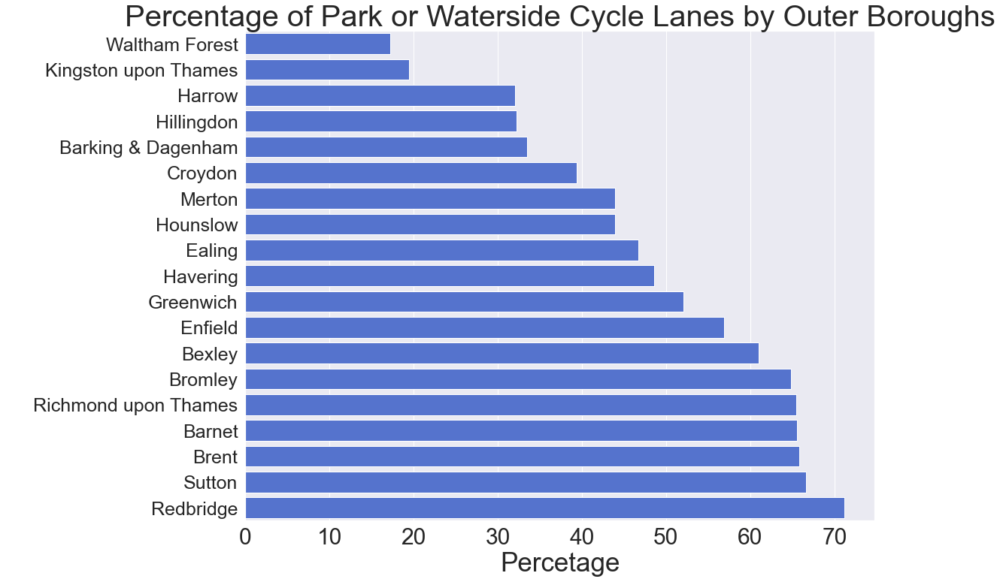

In [709]:
# Visualize %-ge of the cycle lanes in the parks or waterways in Outer London only.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})
# Set the plot style as darkgrid.
sns.set_style('darkgrid')

# Create a barplot to see the %-ge of parks or waterside lanes out of total by borough in Outer London only.
b=sns.barplot(y='BOROUGH', x='Parks %', data=df_cl_parks_out, color = 'royalblue')

# Annotate the axes, labels and ticks.
plt.yticks(fontsize=25)
plt.xticks(fontsize=30)
b.set_ylabel('Borough', fontsize=35, color = 'white')
b.set_xlabel('Percetage', fontsize=35)
b.set_title('Percentage of Park or Waterside Cycle Lanes by Outer Boroughs', fontsize=40)
i=0

Richmond is an interesting case here as it has the highest number of female cyclists, yet a considerable low total population meaning the the number of female cyclists to total population is highly positively skewed compared to other boroughs.

In fact Richmond performs incredibly well across the board in terms of cycling numbers.

Why is this? 

Looking back across the infrastructure analysis, Richmond doesnt perform particularly well other than in one category being percentage of park or waterside cycle lanes by borough, which has been redisplayed above. 

Richmond ranks fourth for the highest percentage of park and waterside cycle lanes for outer boroughs, but has a lower borough population than the three boroughs above it. Suggesting more space and quiter cycle lanes. Therefore, could this be the reason behind its high number of female cycles, where women feel more comfortable and safer off busy roads.

This could certainly be the case, as a study conducted by TFL showed that safety is a primary concern for women, black and asian groups. Backs up our suggestion that improving safety of cycling lanes and access to a cycle network away from cars would increase both overall cycling and female cycling. https://content.tfl.gov.uk/cycling-potential-in-londons-diverse-communities-2021.pdf - slide 13

## Black Boroughs and Female Cycling Rates

In [710]:
# sort merge df by black population
# sort by female cycles ascending 
black_asian_cycle_earn.loc[:, ['Borough', '2019 Black', 
                              '2019 Female cycles']].sort_values(by=['2019 Female cycles'], ascending=True)

,Borough,2019 Black,2019 Female cycles
23,Wandsworth,21000,21
15,Lambeth,62000,33
2,Bexley,20000,92
10,Harrow,8000,125
0,Barking & Dagenham,59000,142
11,Havering,23000,147
19,Redbridge,16000,193
5,Croydon,75000,202
7,Enfield,61000,212
4,Bromley,24000,213


Lambeth and Barking & Dagenham rank poorly again for female cycles in respect to the boroughs black population 

Interestingly, the borough with the largest black population being Croydon performs significantly worse in respect to its female cycles as it does for male / total. Only 202 female cyclists for the whole borough, with 75000 esitmated black population. 

Additionally, Richmond and Kingston upon Thames have the highest anf fourth highest count of female cycles, yet have the lowest and fourth lowest black populations for the boroughs.

## Asian Boroughs and Female Cycling Rates

In [711]:
# sort merge df by asian population
# sort by female cycles ascending 
black_asian_cycle_earn.loc[:, ['Borough', '2019 Asian', 
                              '2019 Female cycles']].sort_values(by=['2019 Female cycles'], ascending=True)

,Borough,2019 Asian,2019 Female cycles
23,Wandsworth,39000,21
15,Lambeth,21000,33
2,Bexley,15000,92
10,Harrow,108000,125
0,Barking & Dagenham,43000,142
11,Havering,28000,147
19,Redbridge,142000,193
5,Croydon,64000,202
7,Enfield,47000,212
4,Bromley,26000,213


No obvious changes or signs, Redbridge performs slightly better regards Female cycling than it does for Total cycling. 

Interestingly Redbridge was the outer borough with the highest percentage of park and waterside cycle lanes, further backing up the point made after Richmond that safe and segregated cycle lanes will help imporve female cycling rates.

# Mini Hollands and Ethnic Population

## Further research into Enfield

In [712]:
# review the mini holland df
mini_hollands_group.head()

,Borough,Survey wave (year),Start hour,Start minute,Number of male cycles,Number of female cycles,Number of unknown cycles,Total cycles
0,Enfield,2015,34560,57600,1496,347,0,1843
1,Enfield,2016,34560,57600,1339,247,2,1588
2,Enfield,2017,34560,57600,1686,278,7,1971
3,Enfield,2018,34560,57600,1568,252,9,1829
4,Enfield,2019,34560,57600,1342,212,7,1561


In [713]:
# export the mini holland df to csv
mini_hollands_group.to_csv('mini_hollands_group.csv')

In [714]:
# import the reshaped csv
mini_hollands_2019 = pd.read_csv('mini_hollands_2019.csv')
mini_hollands_2019

,Borough,2019 Male cycles,2019 Female cycles,2019 Unknown cycles,2019 Total cycles
0,Enfield,1342,212,7,1561
1,Kingston upon Thames,4730,1060,92,5882
2,Waltham Forest,3468,949,4,4421


In [715]:
# subset earnings by the mini hollands
mini_hollands_ft = outer_ft[(outer_ft['Borough'].isin(['Enfield', 'Kingston upon Thames',
                                                    'Waltham Forest']))].reset_index()

mini_hollands_ft

,index,Code,Borough,2014 Pay (£),2015 Pay (£),2016 Pay (£),2017 Pay (£),2018 Pay (£),2019 Pay (£),2020 Pay (£),2021 Pay (£)
0,7,00AK,Enfield,557.8,565.9,574.9,587.7,590.0,638.9,643.2,670.4
1,14,00AX,Kingston upon Thames,704.2,710.2,707.8,706.9,736.7,742.8,759.4,766.6
2,22,00BH,Waltham Forest,542.9,546.9,577.1,574.9,622.9,680.3,716.2,727.7


In [716]:
# subset ethnic df by mini hollands
mini_holland_ethnic = outer_ethnic_2019[(outer_ethnic_2019['Borough'].isin(['Enfield', 'Kingston upon Thames',
                                                    'Waltham Forest']))].reset_index()
mini_holland_ethnic

,index,Code,Borough,2019 White,2019 Asian,2019 Black,2019 Mixed/ Other,2019 Total
0,7,E09000010,Enfield,199000,47000,61000,33000,340000
1,14,E09000021,Kingston upon Thames,130000,23000,8000,18000,179000
2,22,E09000031,Waltham Forest,180000,34000,36000,30000,280000


In [717]:
# merge mini hollands 2019 and mini hollands ethnic
mini_holland_merge = pd.merge(mini_hollands_2019,
                              mini_holland_ethnic[['Borough', '2019 Black']],
                              on='Borough')

mini_holland_merge

,Borough,2019 Male cycles,2019 Female cycles,2019 Unknown cycles,2019 Total cycles,2019 Black
0,Enfield,1342,212,7,1561,61000
1,Kingston upon Thames,4730,1060,92,5882,8000
2,Waltham Forest,3468,949,4,4421,36000


In [718]:
# merge the 2019 earnings 
mini_holland_merge = pd.merge(mini_holland_merge,
                              mini_hollands_ft[['Borough', '2019 Pay (£)']],
                              on='Borough')

mini_holland_merge

,Borough,2019 Male cycles,2019 Female cycles,2019 Unknown cycles,2019 Total cycles,2019 Black,2019 Pay (£)
0,Enfield,1342,212,7,1561,61000,638.9
1,Kingston upon Thames,4730,1060,92,5882,8000,742.8
2,Waltham Forest,3468,949,4,4421,36000,680.3


In [719]:
# view the total cycles, black population and pay
mini_holland_merge.loc[:, ['Borough', '2019 Total cycles',
                          '2019 Black', '2019 Pay (£)']].sort_values(by=['2019 Black'], ascending=False)

,Borough,2019 Total cycles,2019 Black,2019 Pay (£)
0,Enfield,1561,61000,638.9
2,Waltham Forest,4421,36000,680.3
1,Kingston upon Thames,5882,8000,742.8


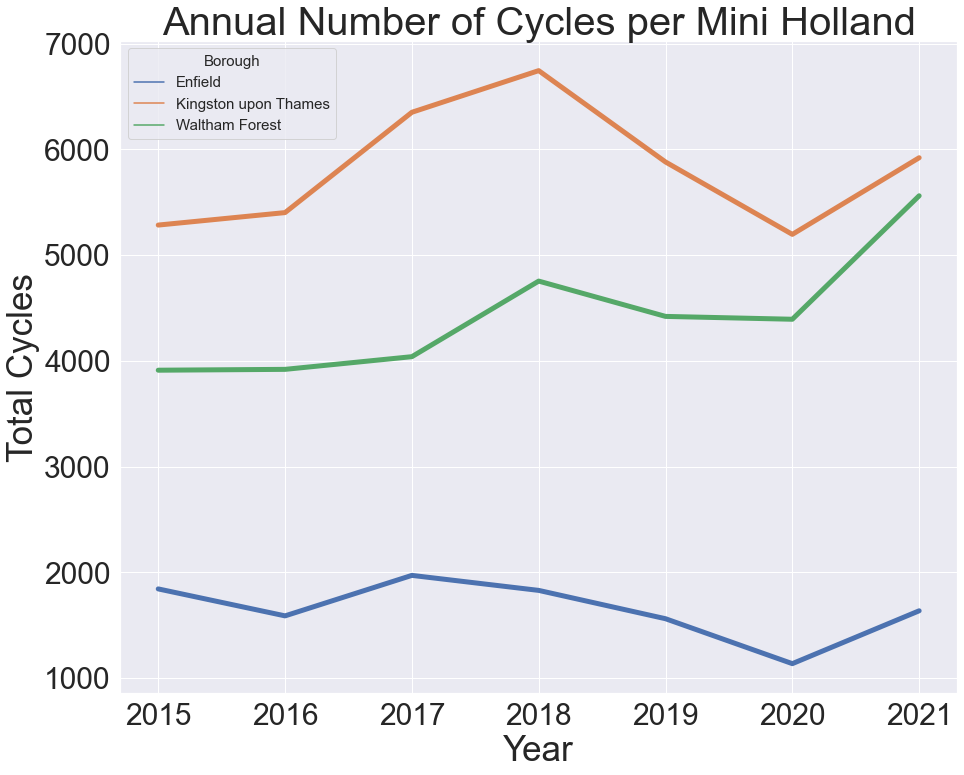

In [720]:
# Plot graph showing the trends over time
nc_mini_holland = sns.lineplot(x='Survey wave (year)', y='Total cycles',
                        hue='Borough', lw=5, data=mini_hollands_group, ci=None)

nc_mini_holland.legend(title='Borough', loc='upper left', title_fontsize=15, fontsize=15)
nc_mini_holland.set_xlabel('Year')
nc_mini_holland.set_ylabel('Total Cycles')
nc_mini_holland.set_title("Annual Number of Cycles per Mini Holland")
nc_mini_holland.title.set_fontsize(40)
nc_mini_holland.xaxis.label.set_fontsize(35)
nc_mini_holland.yaxis.label.set_fontsize(35)
nc_mini_holland.tick_params(axis='both', which='major', labelsize=30)

plt.savefig('nc_mini_holland.png')

Could the table above (output above the graph) explain Enfields poor performance relative to the other mini hollands. As we discussed earlier Enfield has the infrastructure but sees a much poorer rate of cycling numbers as shown by the graph above. 

THe same TFL report, highlighted for female cycling (https://content.tfl.gov.uk/cycling-potential-in-londons-diverse-communities-2021.pdf - slide 16) states that owning or accessing a bike is the biggest barrier for minority groups. We also see that Enfield has the lowest weekly full time earnings of the mini hollands boroughs. 

This evidence along with the TFL report seems to suggest that this is the cause for such low rates in Enfield. 

What can be done? 

Another report by TFL highlights the success of grants and the importance they can have in increasing numbers for minority groups: https://content.tfl.gov.uk/cycling-action-plan.pdf slides 43 and 45. 

Additionally, a report produce on the cycle to work scheme (https://www.employment-studies.co.uk/system/files/resources/files/509.pdf - slide 13) shows how the scheme increased cycling rates amongst non-cyclists and novice cyclists. 

Therefore, our suggestion would be for the mayors office or government to offer a grant / subsidy which targets boroughs with high population of minority groups and / or low-income boroughs to incentivise them to cycle and reduce the barrier of owning a bike.

# Final Summary


Cycling Trends: 

Opposite trends between number of cycle trips and size of the population in Inner and Outer London.
Londoners cycle more for leisure purposes in 2021 than in 2017-2019; whilst work related cycle trips remain the most prominent overall.
Bicycle is overall the 5th most popular method of transport to work; whilst rail (including underground) is the most popular in Inner London and car is the most popular in Outer London.
Residents of Outer London own more cars but drive mainly as part of their commute comparing to Inner London, who drive more for leisure purposes.  
Residents of Outer London live further away from places of work than residents of Inner London but still within cyclable distances.


Earnings: 

Little suggestion of a relationship between earnings and cycling rates in central, inner and outer london. 

Accidents: 

Number of cycling accidents are generally stable in London over the 3 years.
Positive relationship between number of cycles and cycling accidents
Cycling accidents mainly reported from junctions

Infrastructure: 

Fear of collisions and vulnerability on the road are the major factors stopping people from cycling.
There is a high correlation between the provision of cycling infrastructure and the perception ofsafety:

Signal lights for cyclists and advanced stop lines make junctions safer place.
Segregated or partially segregated cycle lanes are only 12%

Inequality in the development of infrastructure between Inner and Outer London.


Mini Hollands and Ethnic Groups:

Mini Hollands can be a success 
Infrastructure and safety can improve female cycling 
Access and owning a bike is a barrier for ethnic groups
Introduction of government scheme or grants 


Key Recommendations: 

Expand cycle network in outer London
Improve junction safety 
Develop and invest in segregated cycle lanes to improve safety and cycling numbers in minority groups
Offer government grant / scheme to target boroughs with low income or high population of ethnic groups to encourage cycling numbers. 